<a href="https://colab.research.google.com/github/Samay-jain622/Analysis-of-Employee-sentiment-on-company-stock-market-performance-/blob/main/time_series_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd

In [ ]:
df=pd.read_csv('/content/monthly.csv')

In [ ]:
df.columns

Index(['Unnamed: 0', 'date', 'pct_change', 'sentiment_sum_1', 'rating',
       'Volume', 'oil_prices', 'pe_ratio', 'ExchangeRate', 'lag_pct_change',
       'ticker'],
      dtype='object')

In [ ]:
import xgboost as xgb
import pandas as pd
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

# Assuming 'df' is your DataFrame
# Define your feature columns
features = ['sentiment_sum_1', 'rating', 'Volume', 'oil_prices', 'pe_ratio', 'ExchangeRate']
target = 'pct_change'

# To store R² scores for each ticker
r2_scores = {}

# Loop through each unique ticker in the dataset
for ticker in df['ticker'].unique():
    # Filter the data for the current ticker
    ticker_data = df[df['ticker'] == ticker]

    # Split into features (X) and target (y)
    X = ticker_data[features]
    y = ticker_data[target]

    # Train-test split (80-20 split)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Instantiate the XGBoost regressor
    model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

    # Train the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Calculate the R² score for the current ticker
    r2 = r2_score(y_test, y_pred)

    # Store the R² score in the dictionary
    r2_scores[ticker] = r2

# Convert the results into a DataFrame for easier reading
r2_df = pd.DataFrame(list(r2_scores.items()), columns=['Ticker', 'R² Score'])

# Display the results
print(r2_df)



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


    Ticker  R² Score
0      AAL -2.334020
1     AAPL  0.379477
2    ABBNY  0.626952
3      ABT  0.506223
4      ACI  0.430744
..     ...       ...
190    WMT -0.930059
191    WNS -0.215567
192   WOOF  0.515497
193    XPO  0.080999
194    XRX -0.651054

[195 rows x 2 columns]


In [ ]:
r2_df[r2_df['R² Score']>0.7].shape

(12, 2)

In [ ]:
df=pd.read_csv('y.csv')

In [ ]:
df.columns

Index(['Unnamed: 0', 'ticker', 'date', 'rating', 'year', 'sentiment_sum',
       'pct_change', 'Volume', 'oil_prices', 'stock_market', 'pe_ratio',
       'Industry', 'lag_pct_change', 'pros_sentiment', 'cons_sentiment',
       'sentiment_sum_1', 'sentiment_sum_2', 'log_volume', 'Country',
       'ExchangeRate'],
      dtype='object')

In [ ]:
import xgboost as xgb
import pandas as pd
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

# Assuming 'df' is your DataFrame
# Define your feature columns
features = ['sentiment_sum_1', 'rating', 'Volume', 'oil_prices', 'pe_ratio', 'ExchangeRate']
target = 'pct_change'

# To store R² scores for each ticker
r2_scores = {}

# Loop through each unique ticker in the dataset
for ticker in df['ticker'].unique():
    # Filter the data for the current ticker
    ticker_data = df[df['ticker'] == ticker]

    # Split into features (X) and target (y)
    X = ticker_data[features]
    y = ticker_data[target]

    # Train-test split (80-20 split)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Instantiate the XGBoost regressor
    model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

    # Train the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Calculate the R² score for the current ticker
    r2 = r2_score(y_test, y_pred)

    # Store the R² score in the dictionary
    r2_scores[ticker] = r2

# Convert the results into a DataFrame for easier reading
r2_df = pd.DataFrame(list(r2_scores.items()), columns=['Ticker', 'R² Score'])

# Display the results
print(r2_df)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


    Ticker  R² Score
0      AAL  0.299550
1     AAPL  0.327474
2    ABBNY  0.012498
3      ABT  0.389479
4      ACI -0.035466
..     ...       ...
191    WMT  0.800251
192    WNS  0.271698
193   WOOF -0.148475
194    XPO  0.024202
195    XRX  0.263263

[196 rows x 2 columns]


In [ ]:
r2_df[r2_df['R² Score']>0.7]

,Ticker,R² Score
62,DXC,0.715121
191,WMT,0.800251


In [ ]:
df.c

In [ ]:
pip install prophet


In [ ]:
pip install prophet


In [ ]:
import pandas as pd
from prophet import Prophet
from sklearn.metrics import r2_score

# Ensure 'date' column is in datetime format
df['date'] = pd.to_datetime(df['date'])

# Rename columns for Prophet: 'date' -> 'ds' and 'pct_change' -> 'y'
df = df.rename(columns={'date': 'ds', 'pct_change': 'y'})

# Define features and target
features = ['sentiment_sum_1', 'rating', 'Volume', 'oil_prices', 'pe_ratio', 'ExchangeRate', 'lag_pct_change']
target = 'y'  # Now the target is 'y' after renaming

# Create a list to store R² scores for each ticker (if there are multiple tickers)
r2_scores = {}

# Loop through each unique ticker in the dataframe
for ticker in df['ticker'].unique():
    # Filter data for the current ticker
    ticker_data = df[df['ticker'] == ticker]

    # Sort the data by date (important for time-series data)
    ticker_data = ticker_data.sort_values(by='ds')

    # Calculate the index for the 80-20 split (80% for training, 20% for testing)
    split_index = int(0.8 * len(ticker_data))

    # Split the data into training and testing sets
    train_data = ticker_data[:split_index]
    test_data = ticker_data[split_index:]

    # Initialize the Prophet model
    model = Prophet()

    # Add each feature as a regressor
    for feature in features:
        model.add_regressor(feature)

    # Fit the model to the training data
    model.fit(train_data[['ds', target] + features])

    # Create future dates for prediction (same length as the test data)
    future_dates = model.make_future_dataframe(train_data, periods=len(test_data), freq='D')

    # Add the feature values to the future dataframe
    future_dates = future_dates.merge(ticker_data[['ds'] + features], on='ds', how='left')

    # Make predictions
    forecast = model.predict(future_dates)

    # Merge the forecast with the test data to compare actual and predicted values
    test_data_pred = test_data[['ds', target]]
    test_data_pred['yhat'] = forecast['yhat'].tail(len(test_data_pred)).reset_index(drop=True)

    # Calculate R² score for this ticker
    r2 = r2_score(test_data_pred[target], test_data_pred['yhat'])

    # Store the R² score in the dictionary
    r2_scores[ticker] = r2

    # Optionally, print the R² score for each ticker
    print(f"R² Score for {ticker}: {r2}")

# After the loop, you can access the R² scores for each ticker
print("\nR² Scores for all tickers:")
print(r2_scores)





INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 17.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpo1597214/ggedzmwf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpo1597214/tyti95zu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35650', 'data', 'file=/tmp/tmpo1597214/ggedzmwf.json', 'init=/tmp/tmpo1597214/tyti95zu.json', 'output', 'file=/tmp/tmpo1597214/prophet_modelkvjr58z0/prophet_model-20241113142915.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:29:15 - cmdstanpy - INFO - Chain [1] start processing
I

TypeError: Prophet.make_future_dataframe() got multiple values for argument 'periods'

In [ ]:
df.columns

Index(['Unnamed: 0', 'ds', 'y', 'sentiment_sum_1', 'rating', 'Volume',
       'oil_prices', 'pe_ratio', 'ExchangeRate', 'lag_pct_change', 'ticker'],
      dtype='object')

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 17.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpo1597214/jn6pjqp4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpo1597214/98v4_n11.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16292', 'data', 'file=/tmp/tmpo1597214/jn6pjqp4.json', 'init=/tmp/tmpo1597214/98v4_n11.json', 'output', 'file=/tmp/tmpo1597214/prophet_modelb4go6mjr/prophet_model-20241113143008.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:30:08 - cmdstanpy - INFO - Chain [1] start processing
I

TypeError: Prophet.make_future_dataframe() got multiple values for argument 'periods'

In [ ]:
df=pd.read_csv('monthly.csv')

In [ ]:
import pandas as pd

In [ ]:
df.columns

Index(['Unnamed: 0', 'date', 'pct_change', 'sentiment_sum_1', 'rating',
       'Volume', 'oil_prices', 'pe_ratio', 'ExchangeRate', 'lag_pct_change',
       'ticker'],
      dtype='object')

In [ ]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

Processing ticker: AAL


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


AAL: R2 = -12.7495


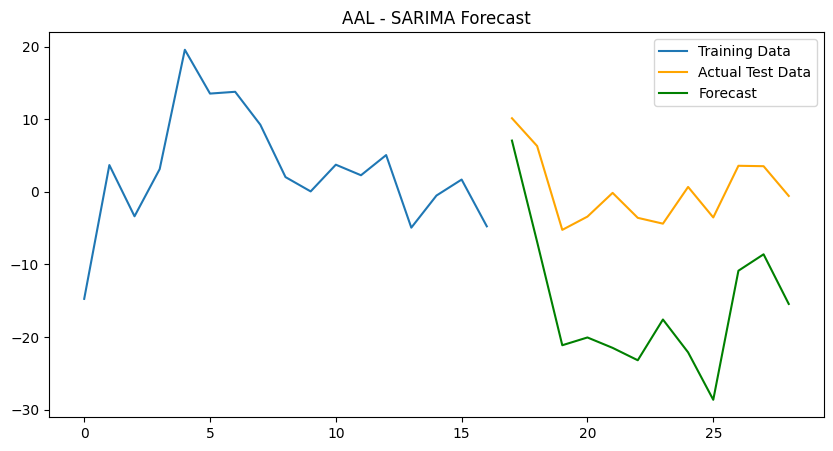

Processing ticker: AAPL
AAPL: R2 = -39.7453


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

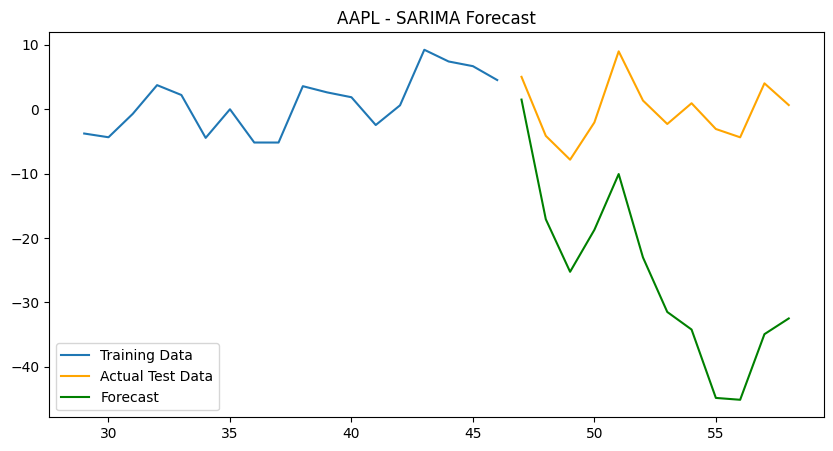

Processing ticker: ABBNY


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

ABBNY: R2 = -1292.5411


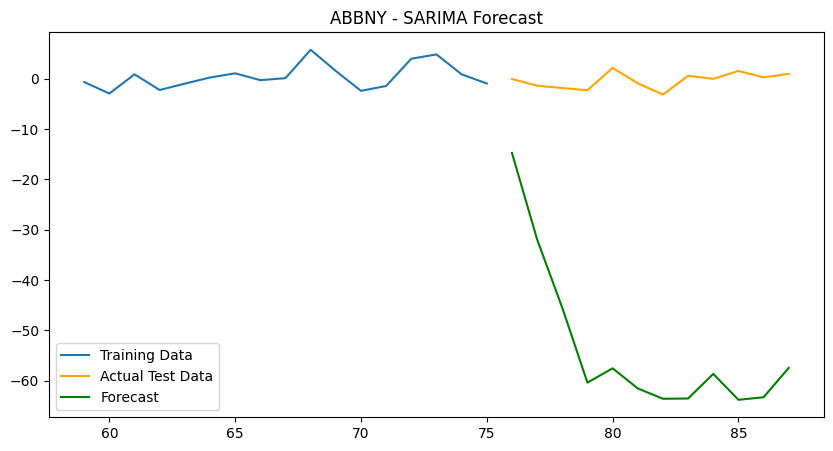

Processing ticker: ABT
ABT: R2 = -44.6998


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

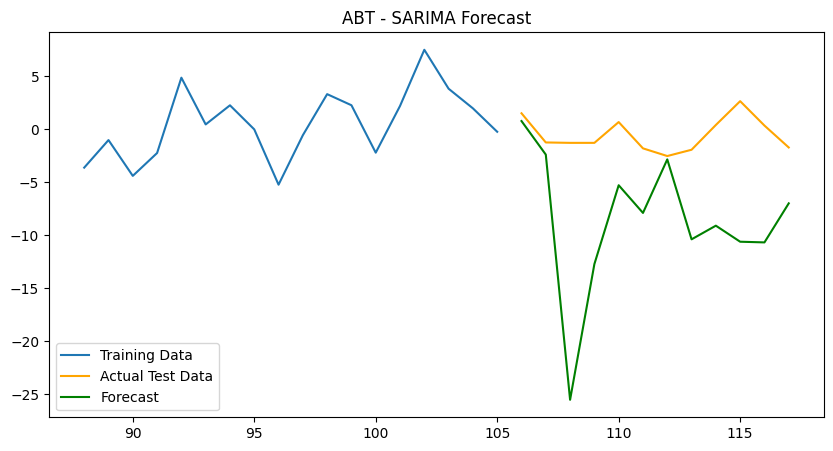

Processing ticker: ACI
ACI: R2 = -4200.5424


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

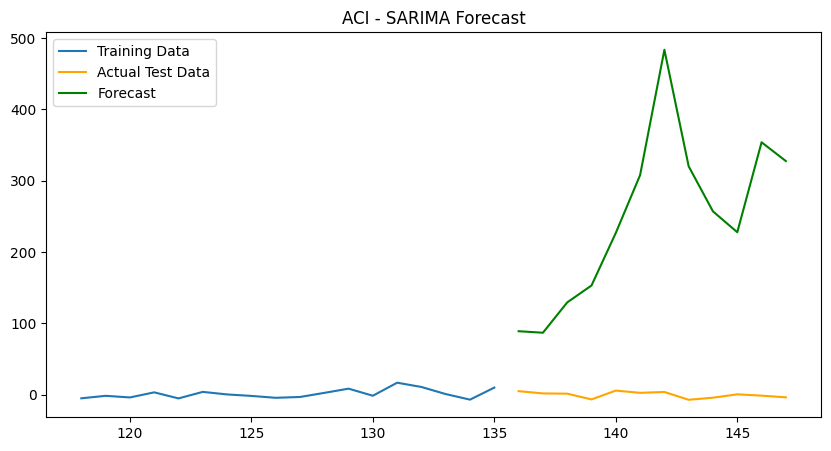

Processing ticker: ACM
ACM: R2 = -3.8148


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

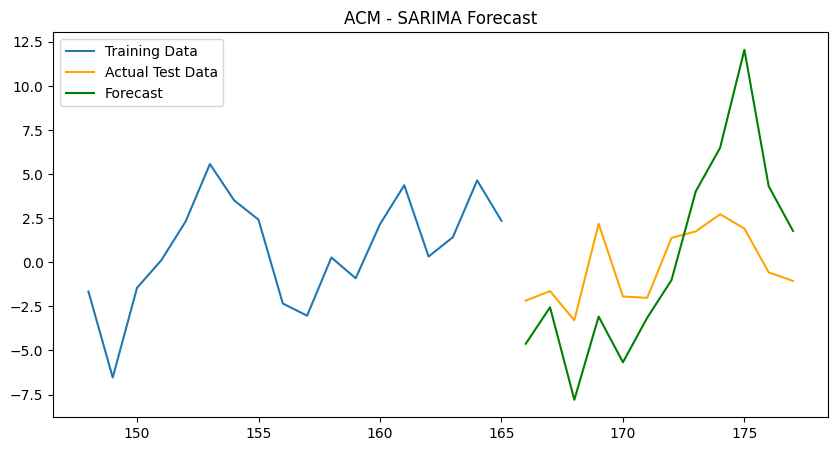

Processing ticker: ACN
ACN: R2 = -26.4398


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

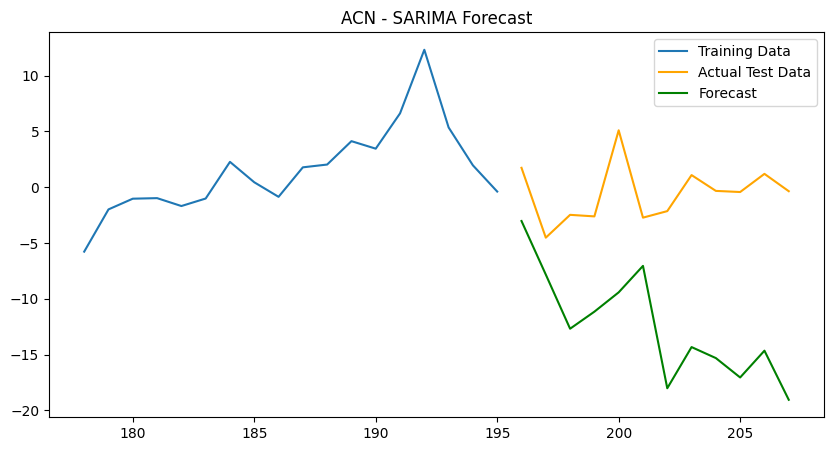

Processing ticker: ADBE
ADBE: R2 = -1.4433


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

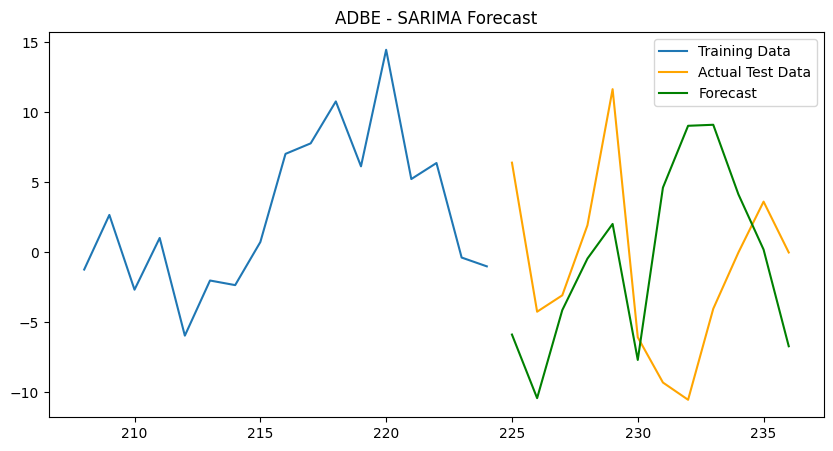

Processing ticker: ADSK
ADSK: R2 = -234.7578


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

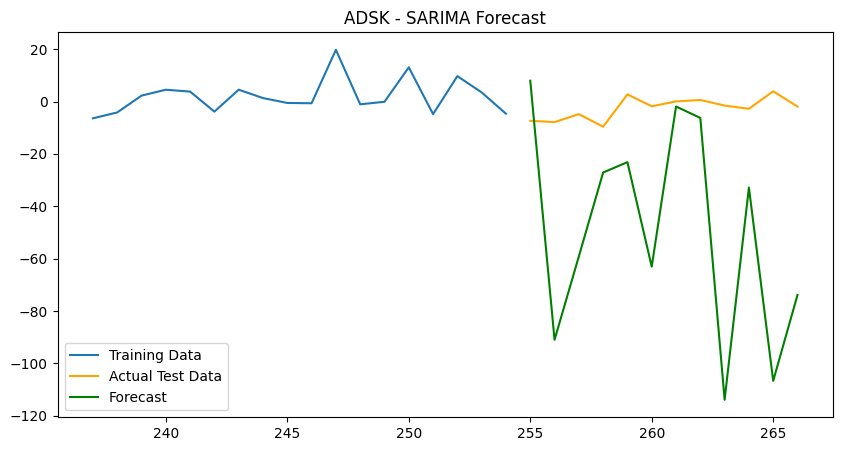

Processing ticker: AEO
AEO: R2 = -15.1043


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

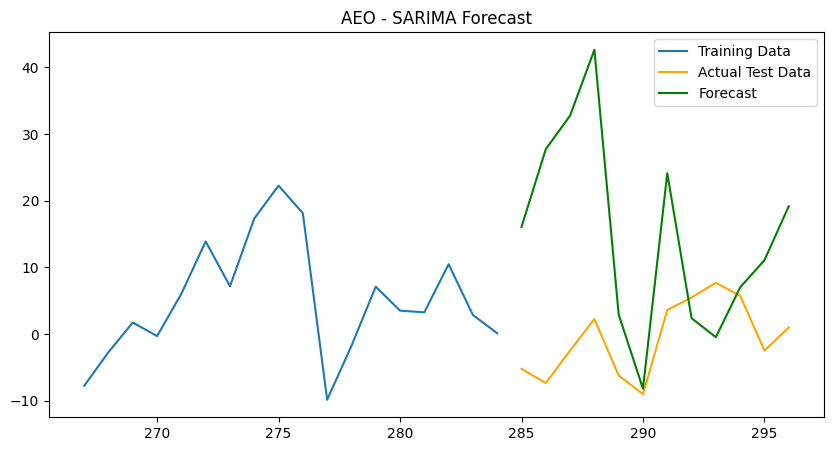

Processing ticker: ALIZY
ALIZY: R2 = 0.1905


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

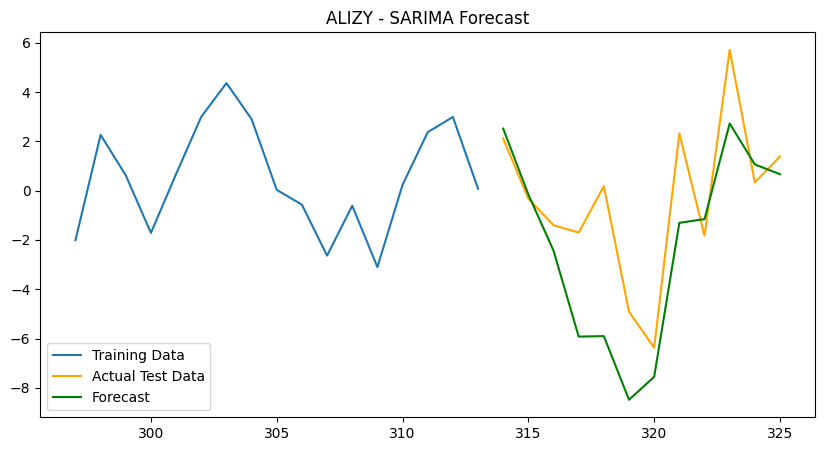

Processing ticker: ALL
ALL: R2 = -13.5952


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

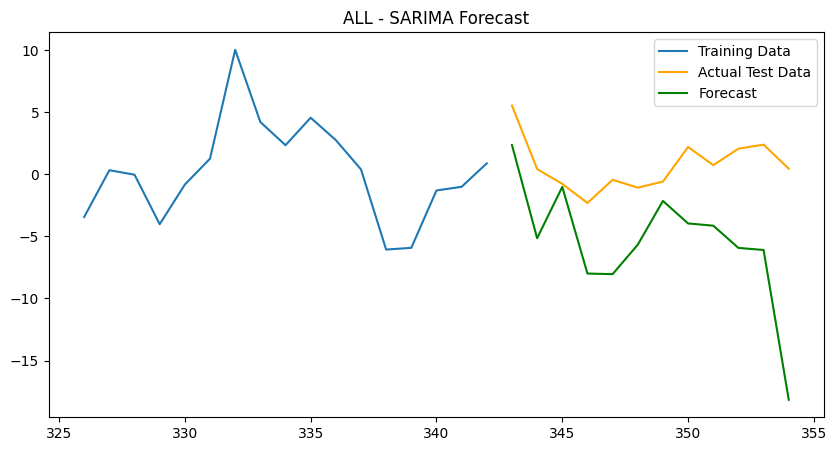

Processing ticker: AMAT
AMAT: R2 = -10.1727


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

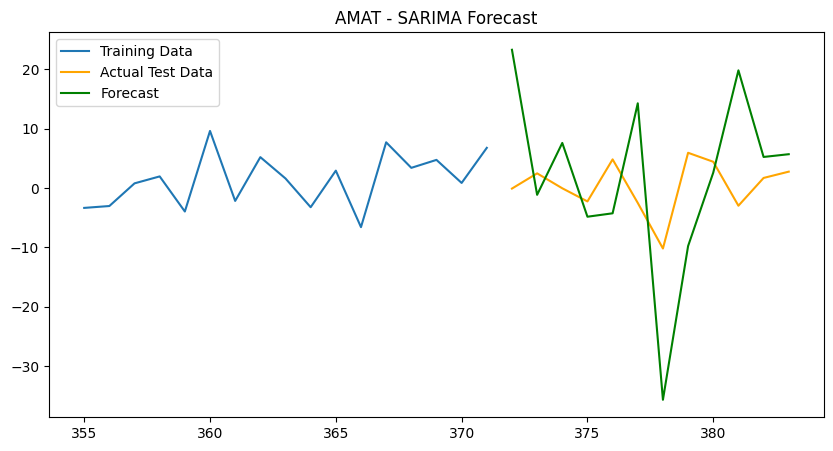

Processing ticker: AMC
AMC: R2 = -111.3731


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

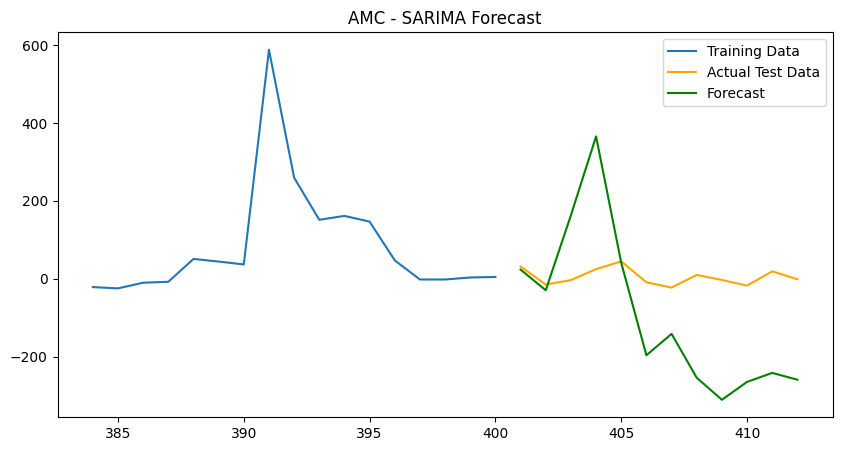

Processing ticker: AMZN
AMZN: R2 = -69.8845


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

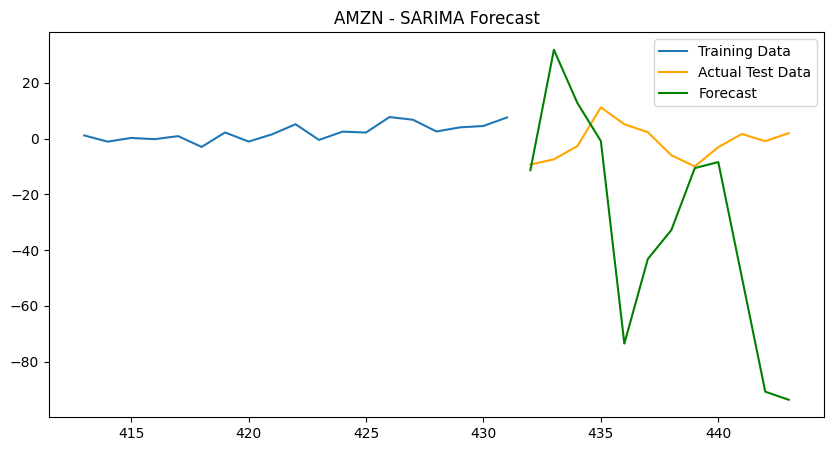

Processing ticker: AON
AON: R2 = -19.2977


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

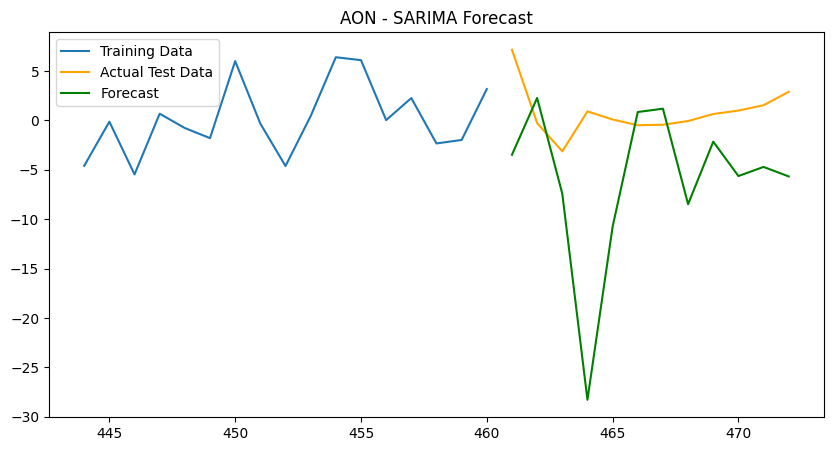

Processing ticker: AXAHY
AXAHY: R2 = -4.5058


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

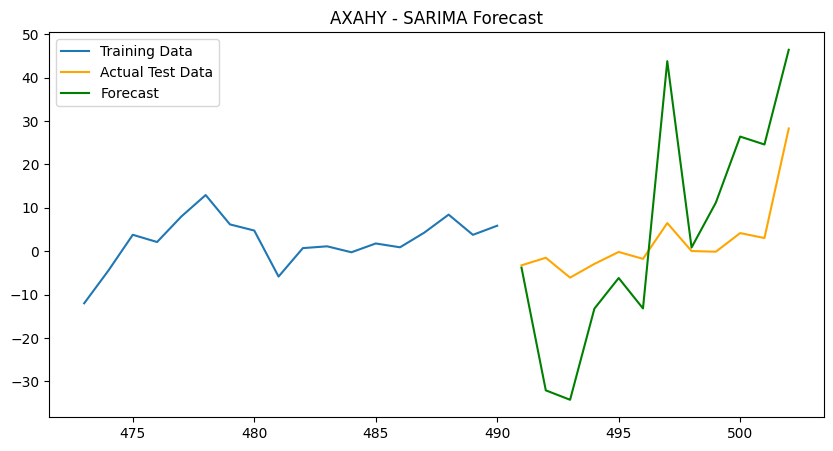

Processing ticker: AXP
AXP: R2 = -36.7544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

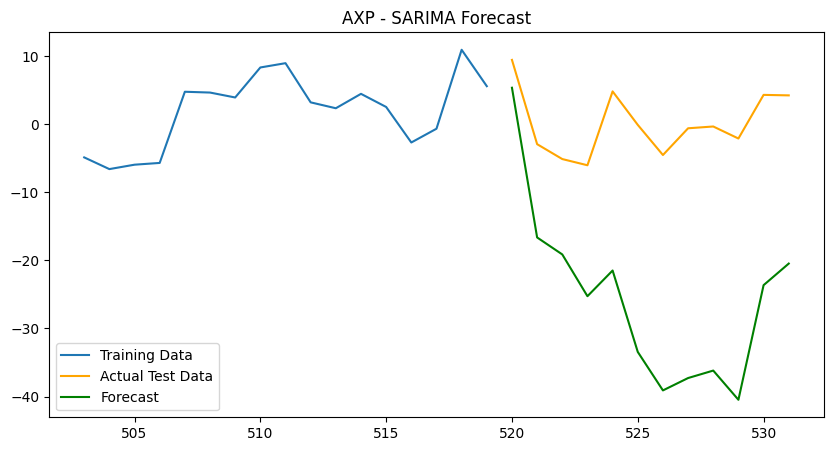

Processing ticker: AZN
AZN: R2 = 0.0629


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

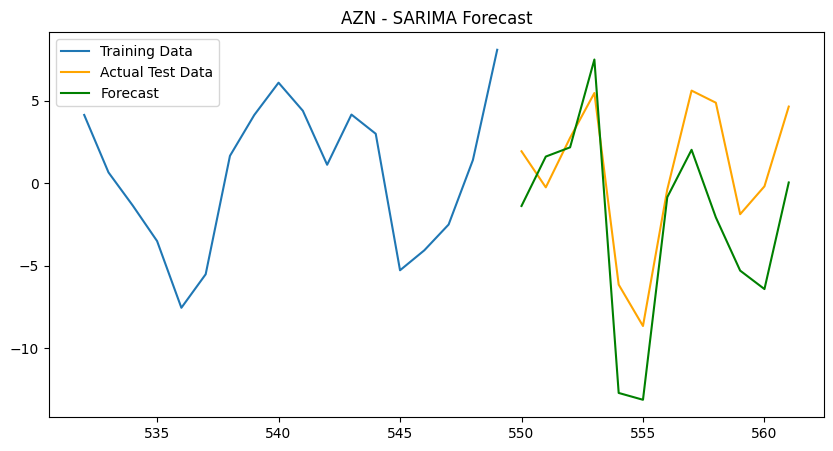

Processing ticker: AZO
AZO: R2 = -6.8034


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

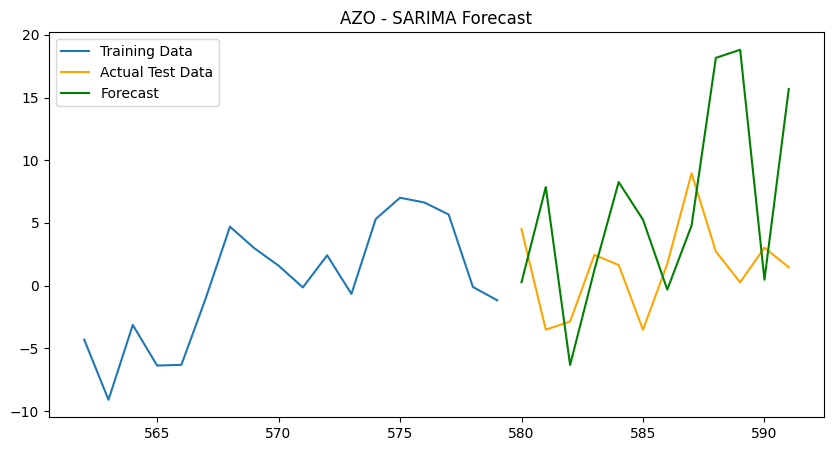

Processing ticker: BA
BA: R2 = -0.7750


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

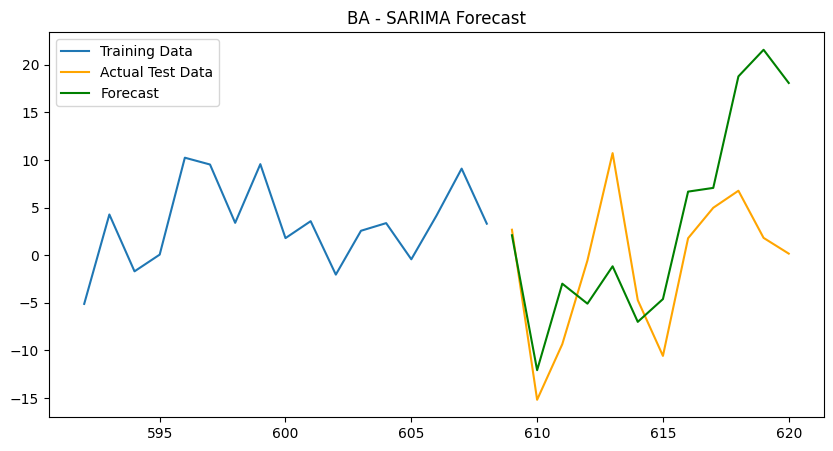

Processing ticker: BAH
BAH: R2 = -16.4481


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

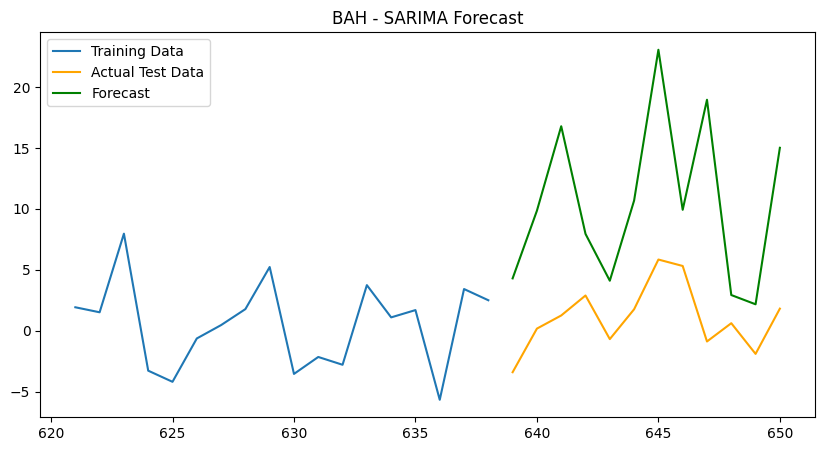

Processing ticker: BAX
BAX: R2 = -62.9136


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

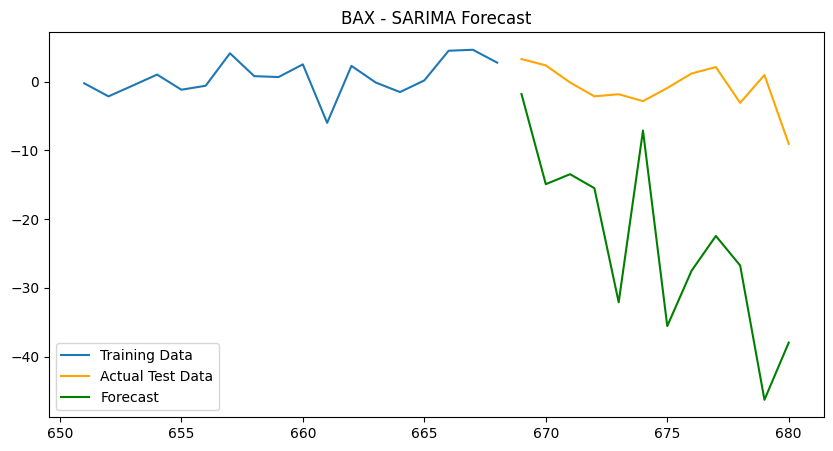

Processing ticker: BAYRY
BAYRY: R2 = -67288733.8219


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

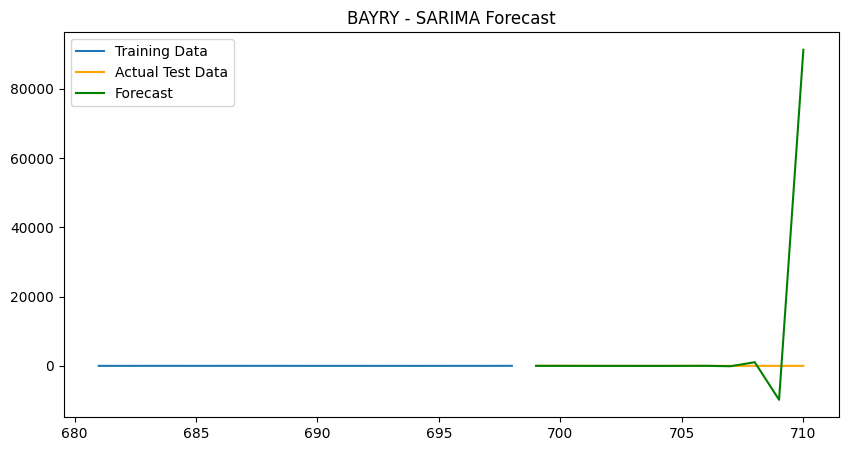

Processing ticker: BBY
BBY: R2 = -1.9183


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

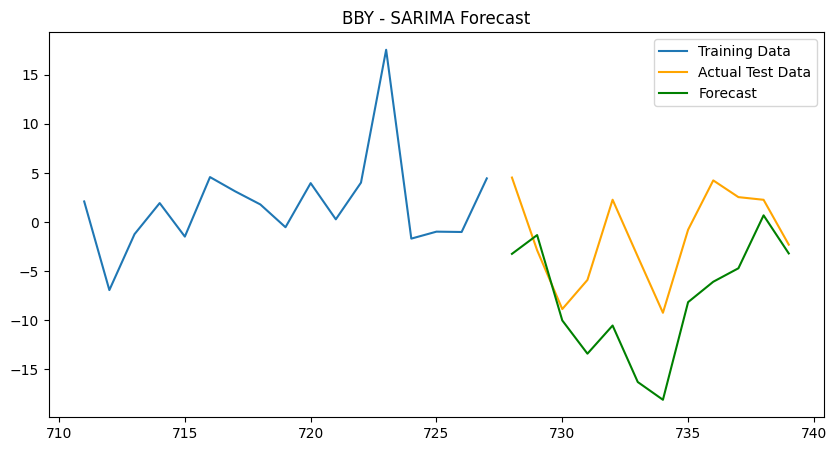

Processing ticker: BCS
BCS: R2 = -1303053669322697.0000


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

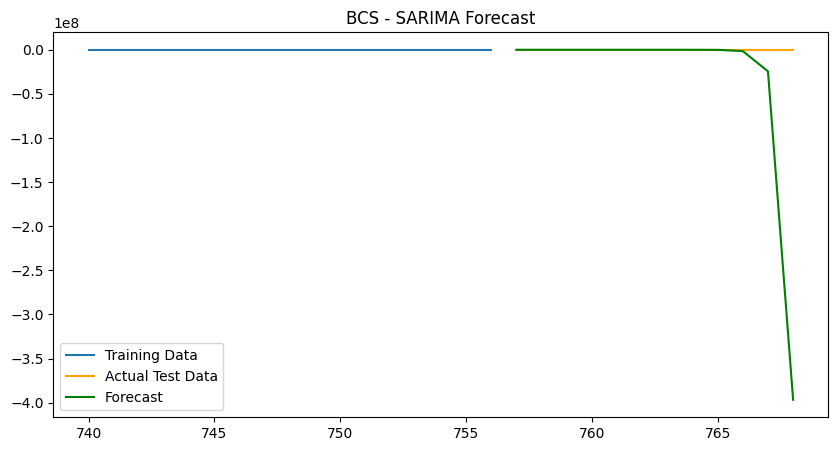

Processing ticker: BKD
BKD: R2 = -18.5119


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

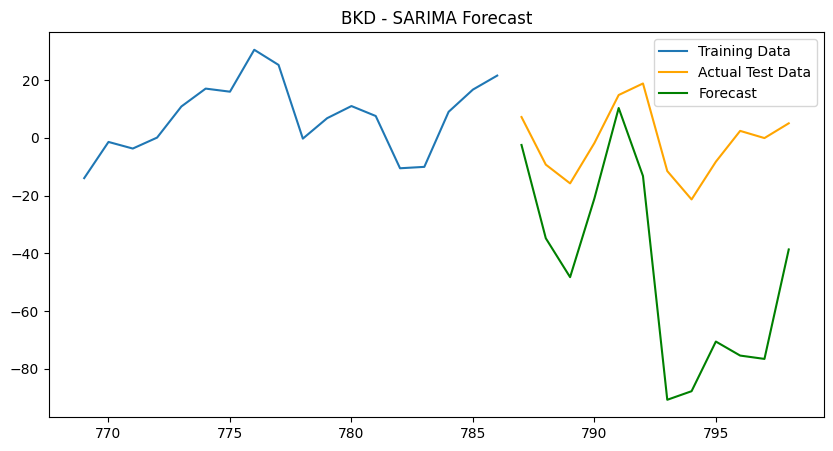

Processing ticker: BLK


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

BLK: R2 = -1.2417


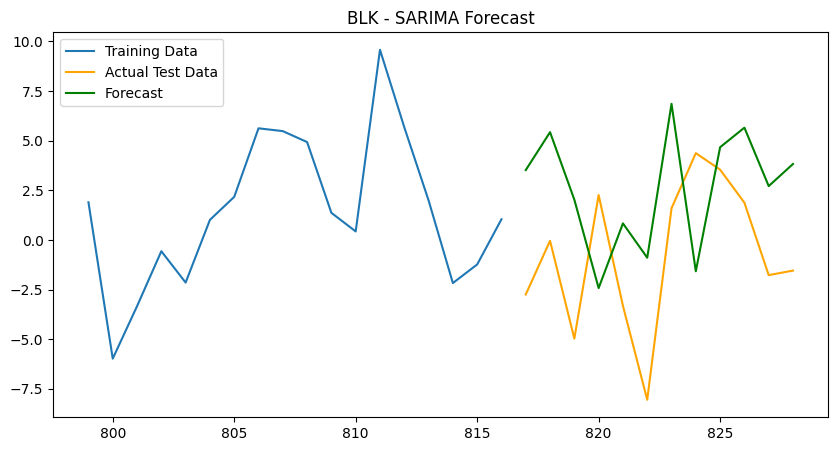

Processing ticker: BML-PG
BML-PG: R2 = -0.5738


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

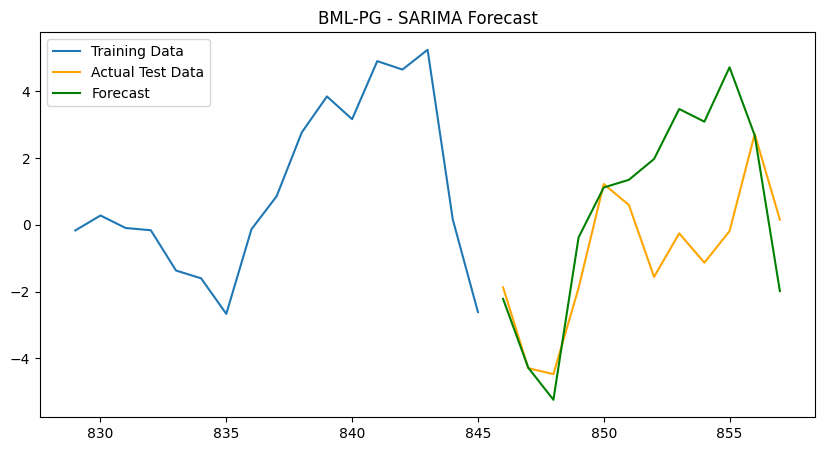

Processing ticker: BMY
BMY: R2 = -357.2943


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

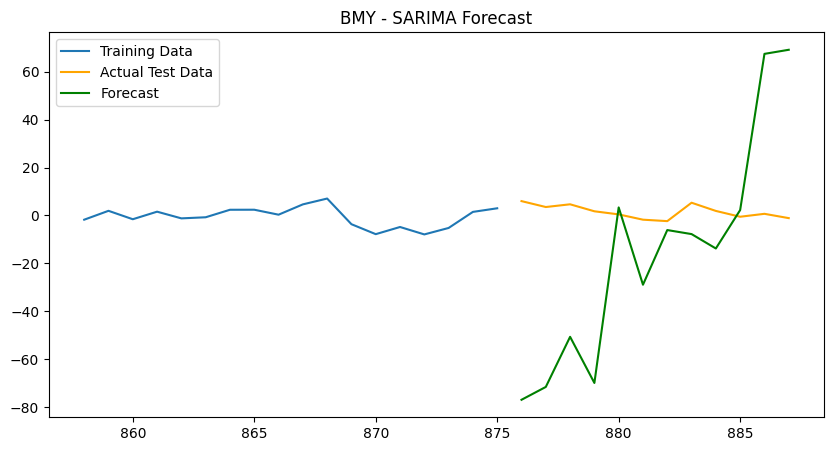

Processing ticker: BSX
BSX: R2 = -1.6121


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

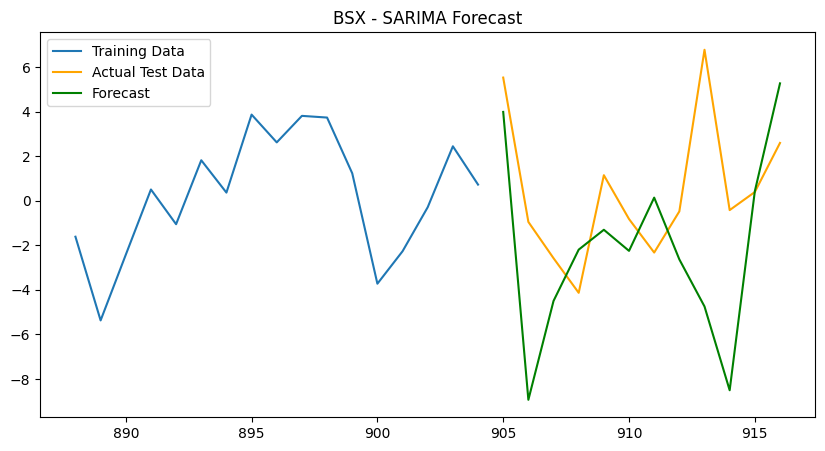

Processing ticker: BTBD
BTBD: R2 = -3.5264


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting paramete

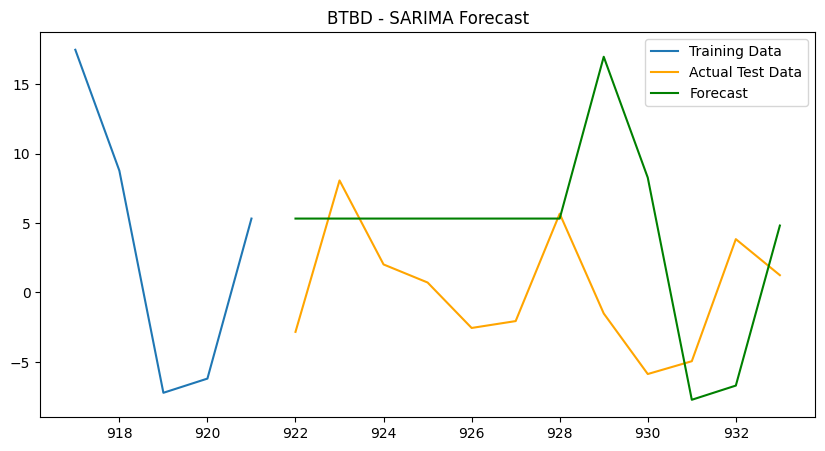

Processing ticker: BURL
BURL: R2 = -3576685860831079422994134794663624704.0000


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

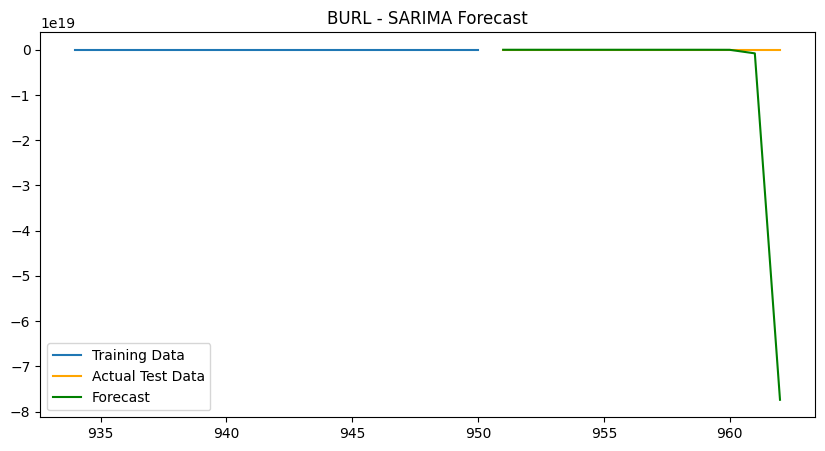

Processing ticker: CAH
CAH: R2 = -25.4894


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

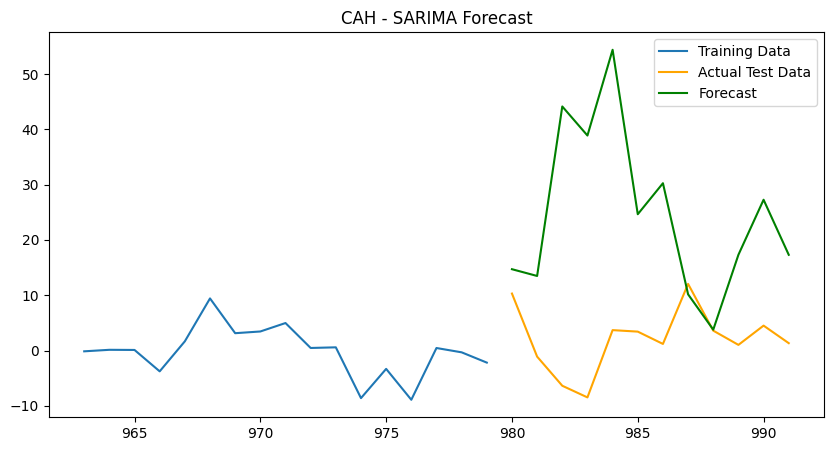

Processing ticker: CAT
CAT: R2 = -1.3576


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

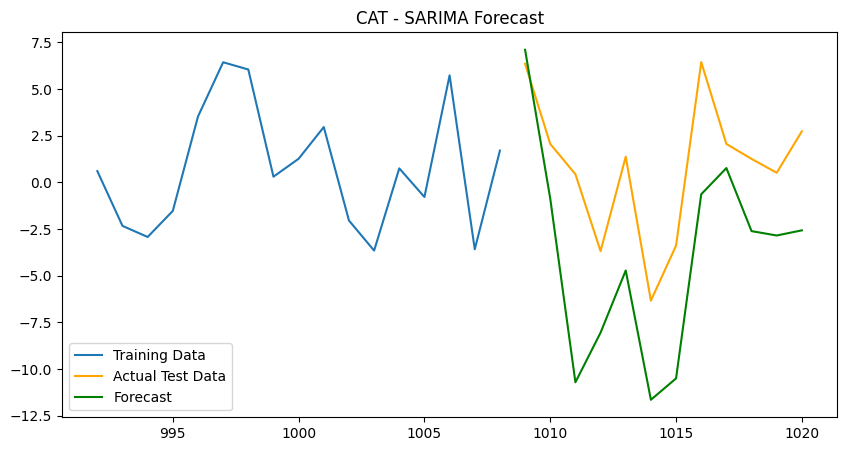

Processing ticker: CBRE
CBRE: R2 = -455980425575644011515871232.0000


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

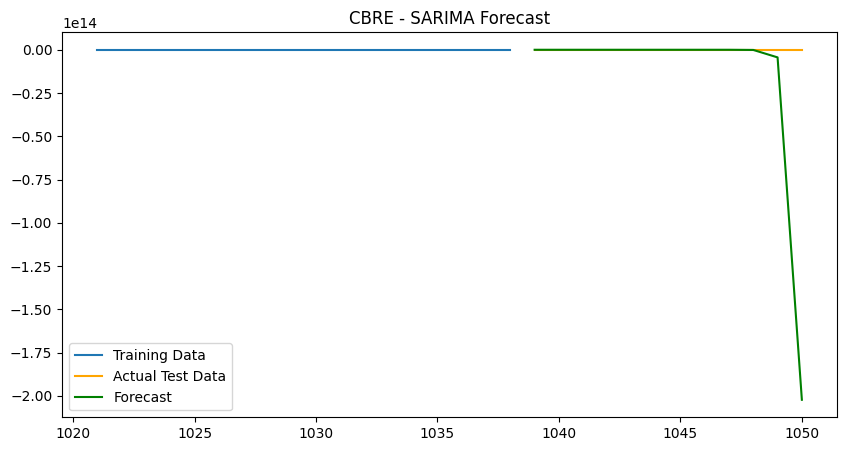

Processing ticker: CBRL
CBRL: R2 = -0.6208


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

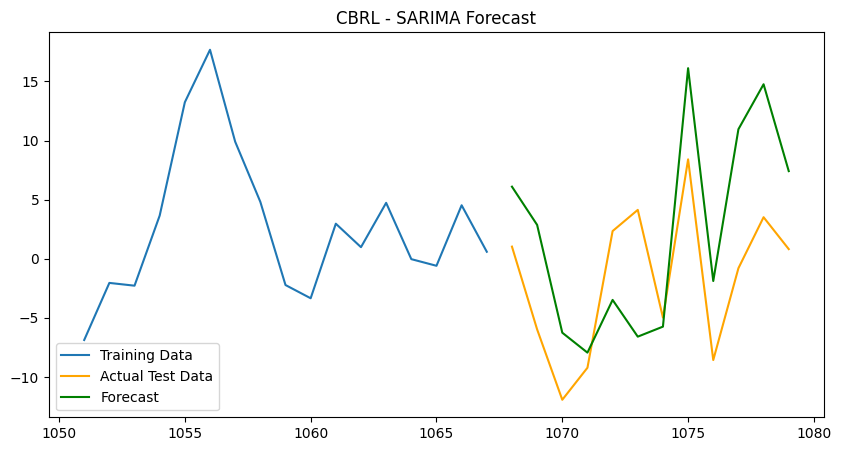

Processing ticker: CMCSA
CMCSA: R2 = -6.0280


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

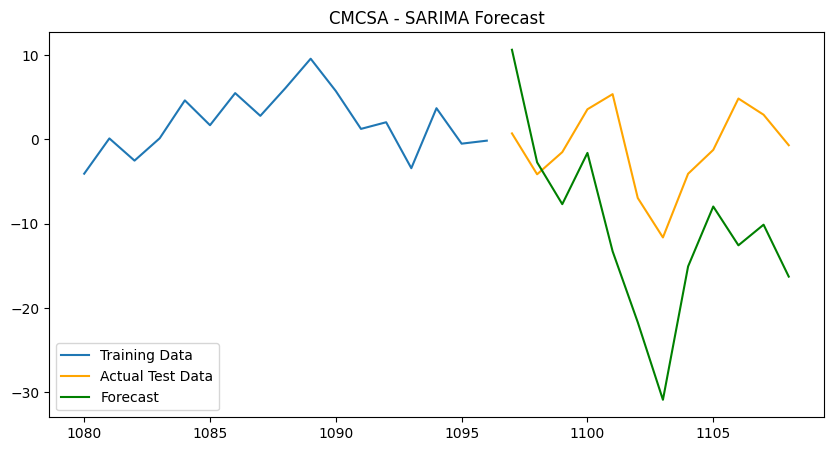

Processing ticker: CMG
CMG: R2 = -0.1751


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

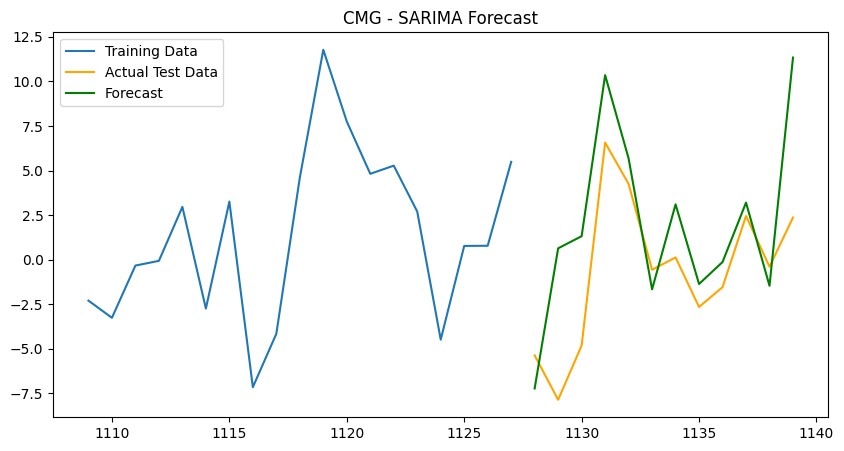

Processing ticker: CMI
CMI: R2 = -181.2193


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

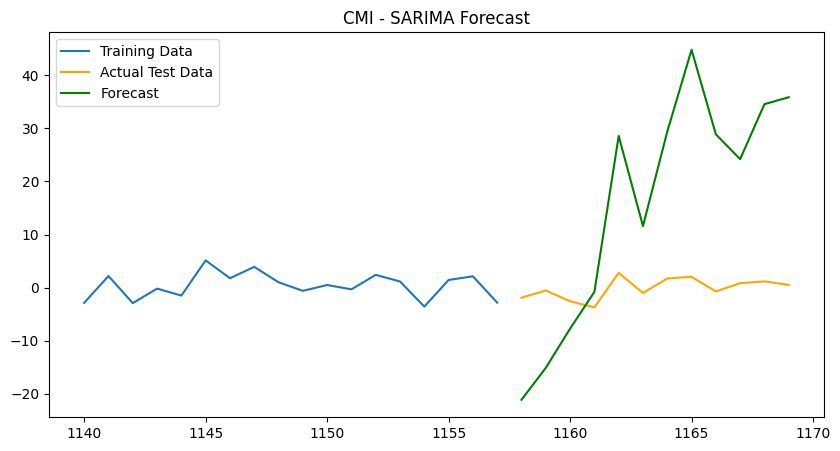

Processing ticker: CNC
CNC: R2 = -1.3583


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

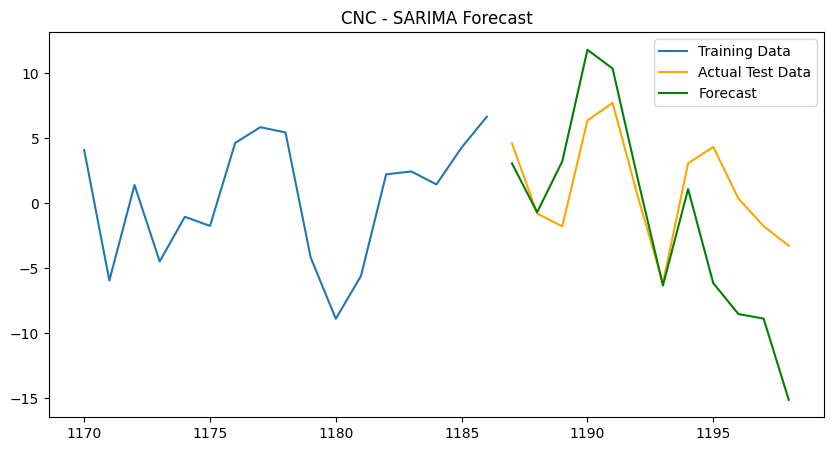

Processing ticker: CNDT
CNDT: R2 = -16.8038


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

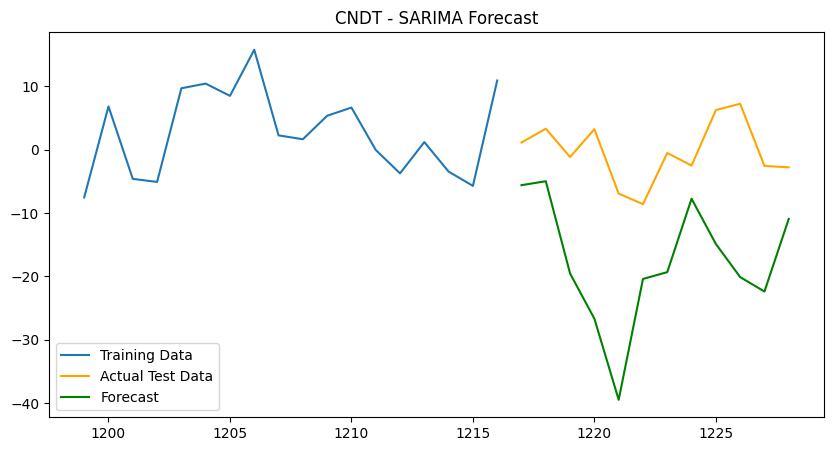

Processing ticker: CNXC
CNXC: R2 = -17.4742


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

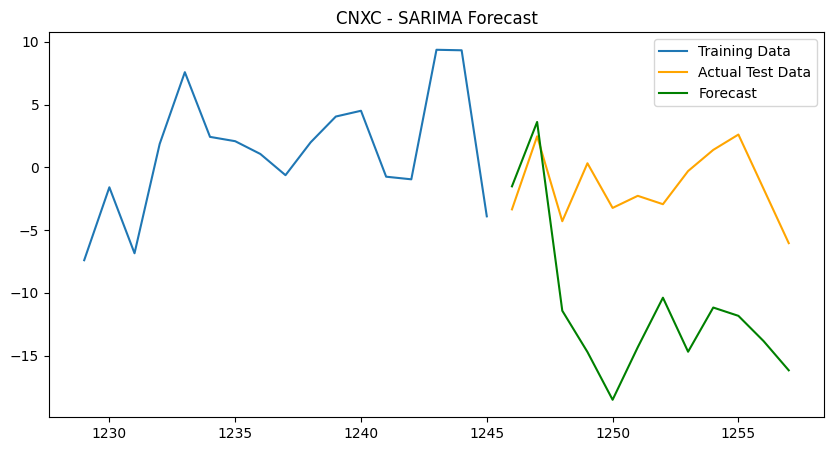

Processing ticker: COF
COF: R2 = -697.1168


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

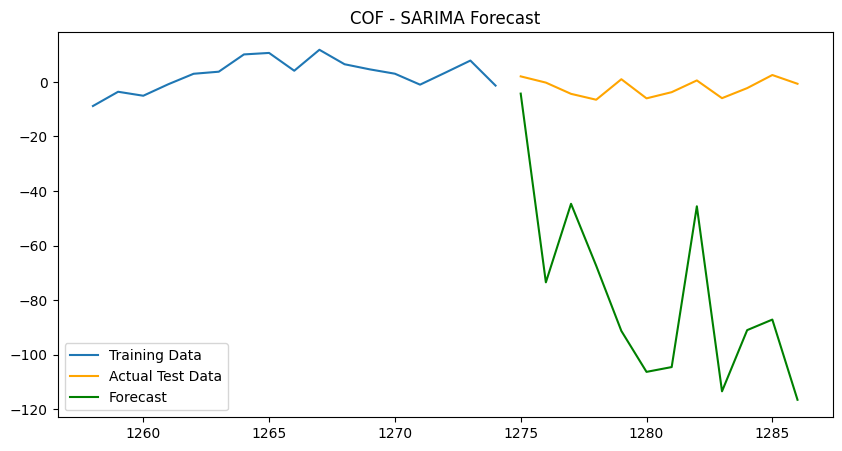

Processing ticker: COST
COST: R2 = -201.1812


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

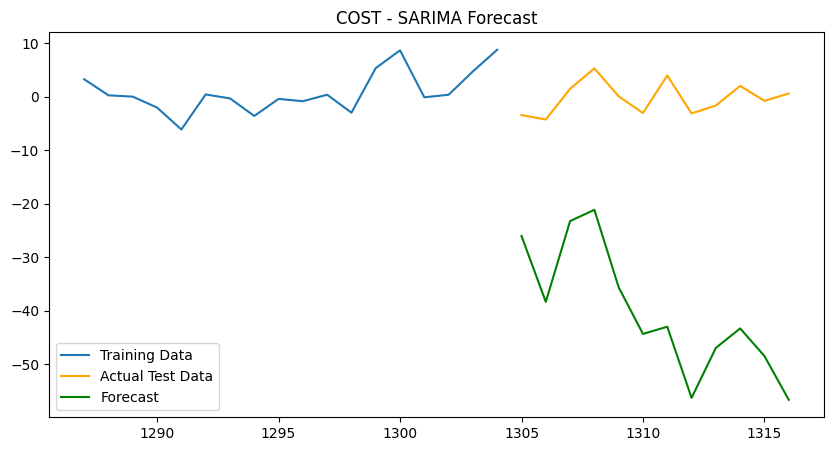

Processing ticker: CRM
CRM: R2 = -813070003882.8032


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

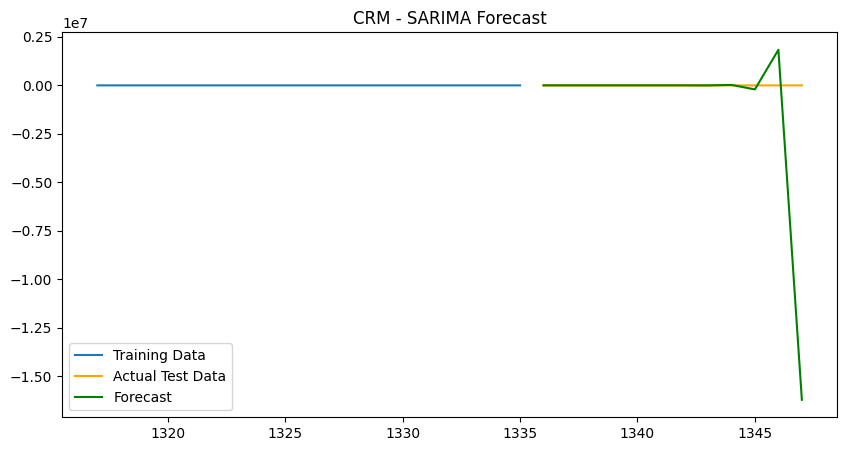

Processing ticker: CSCO
CSCO: R2 = -0.6868


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

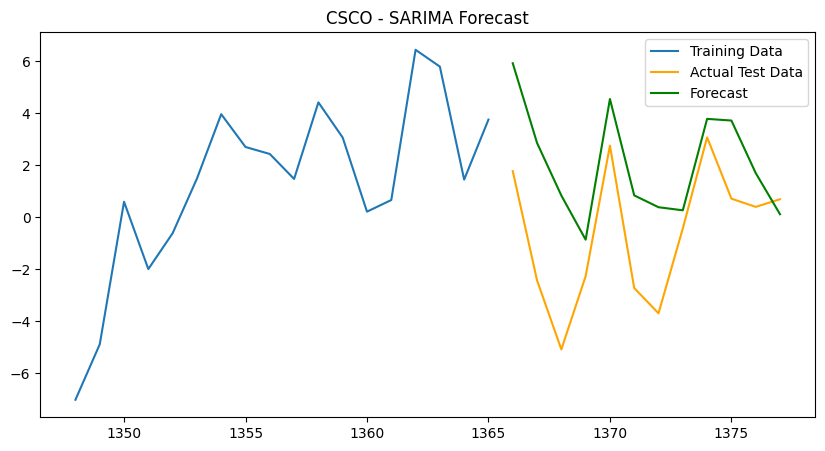

Processing ticker: CTAS
CTAS: R2 = -0.5170


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

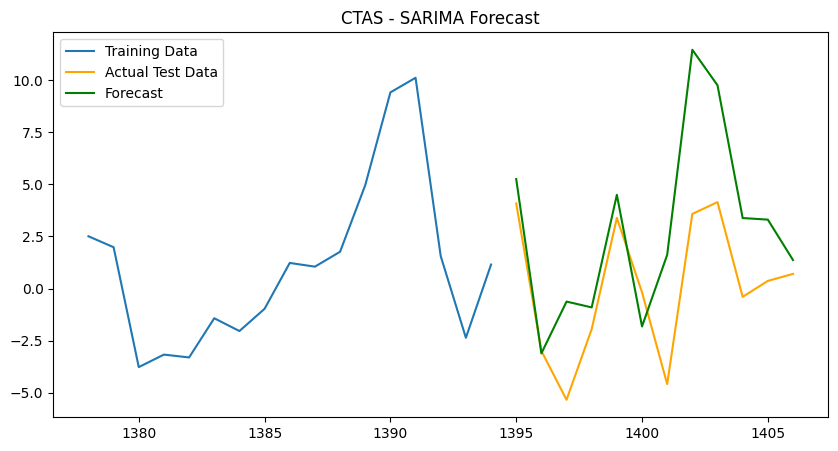

Processing ticker: CTRN
CTRN: R2 = -1113453476716.1409


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

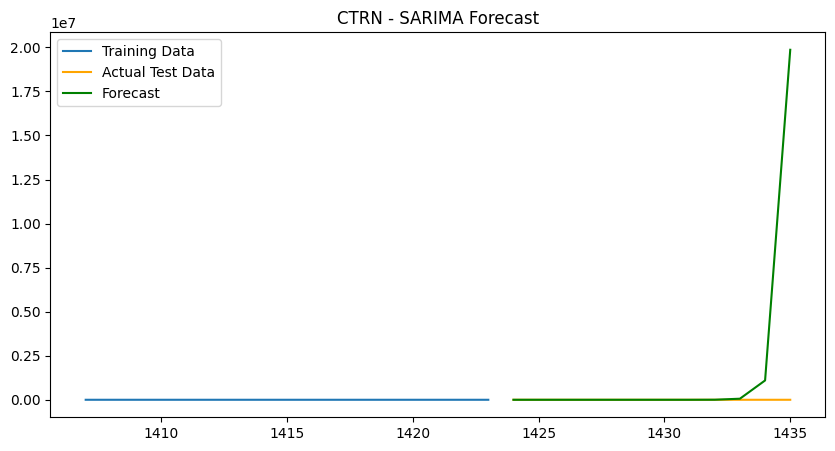

Processing ticker: CTSH
CTSH: R2 = -6.6756


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

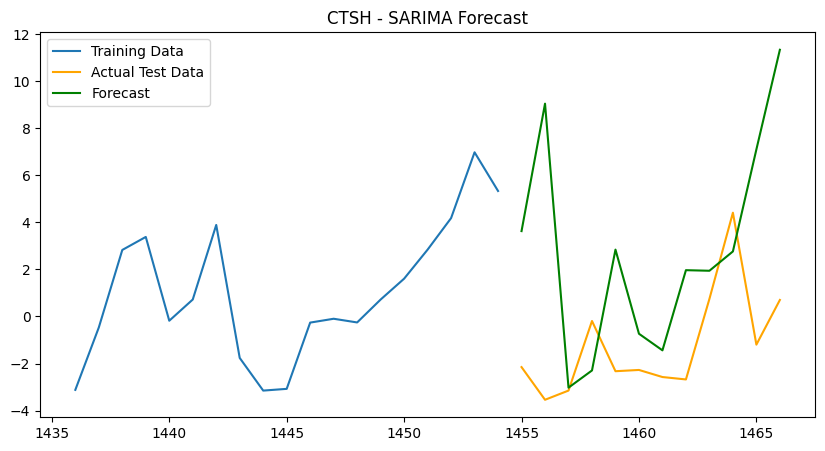

Processing ticker: CVS


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

CVS: R2 = -140.8837


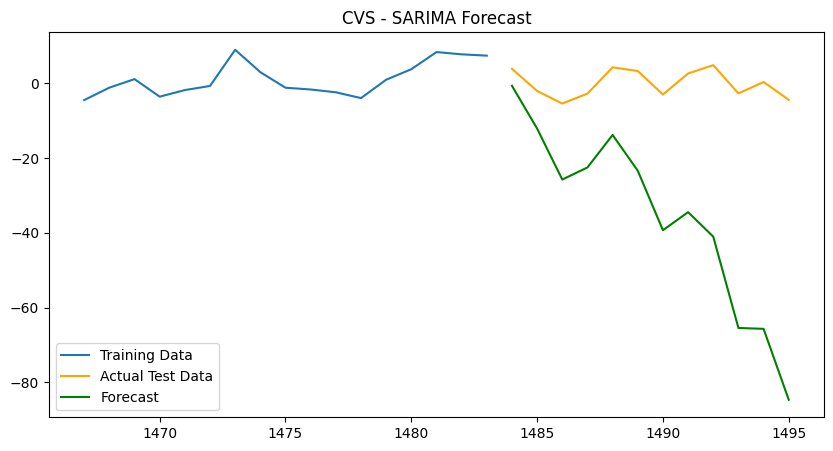

Processing ticker: CVX
CVX: R2 = -2.9483


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

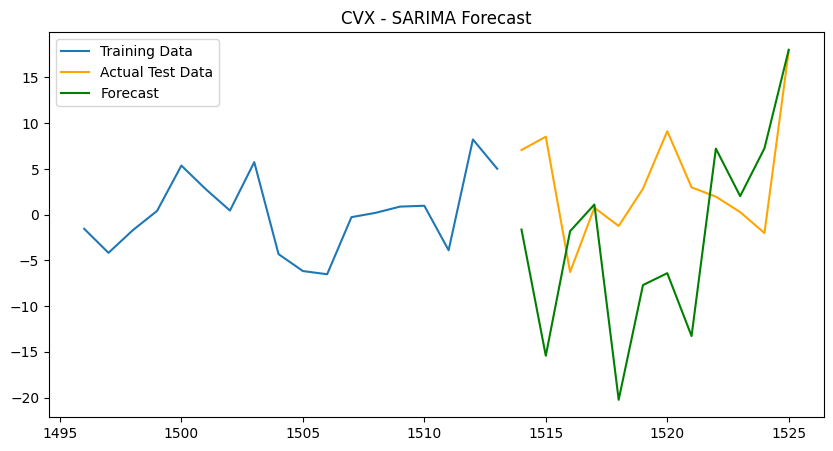

Processing ticker: DAL
DAL: R2 = -123519646591435577229312.0000


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

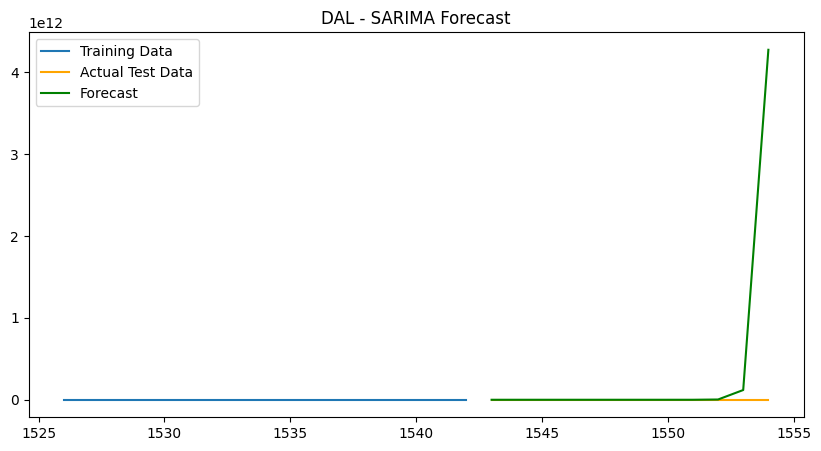

Processing ticker: DB
DB: R2 = -3.4345


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

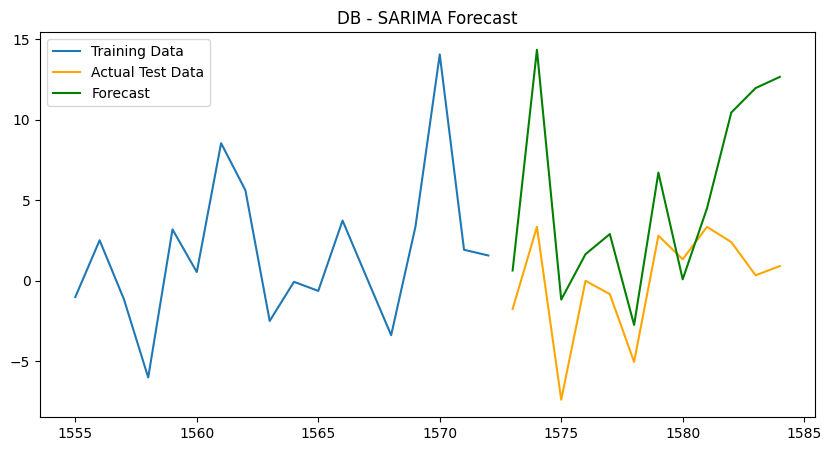

Processing ticker: DELL
DELL: R2 = -28.9271


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

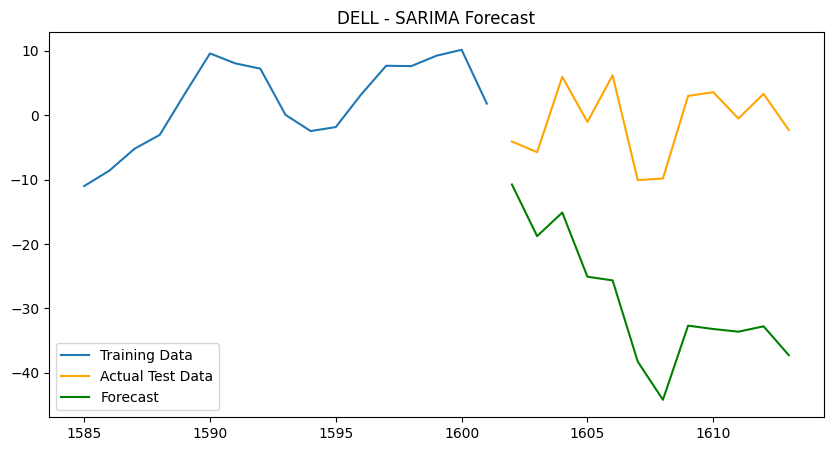

Processing ticker: DG
DG: R2 = -1.0044


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

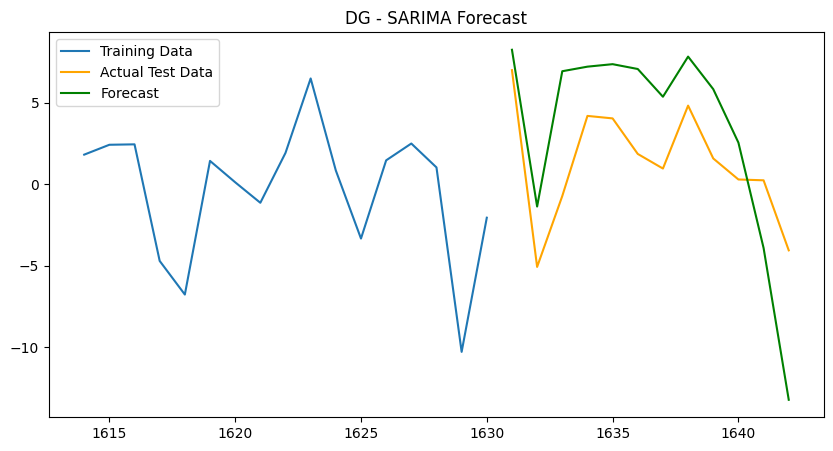

Processing ticker: DGX
DGX: R2 = -0.2899


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

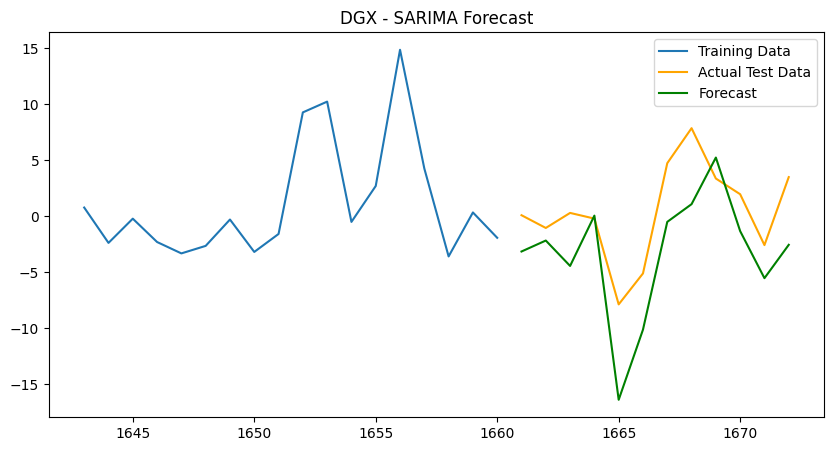

Processing ticker: DHY
DHY: R2 = -3.6303


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

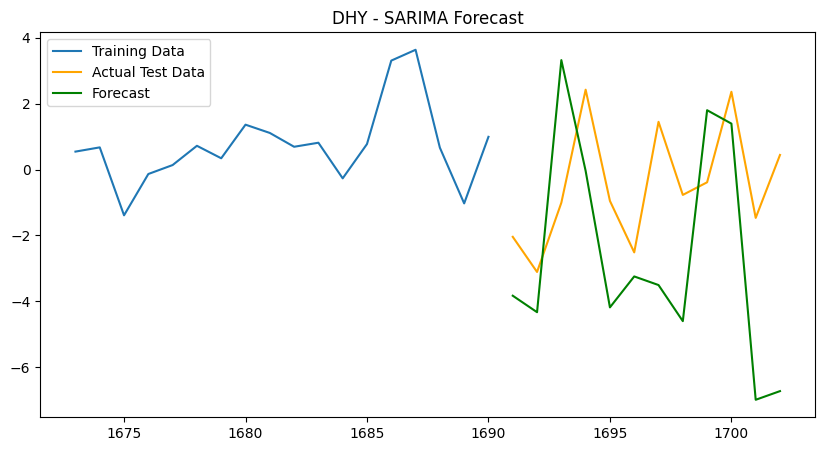

Processing ticker: DLTR
DLTR: R2 = -25.1024


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

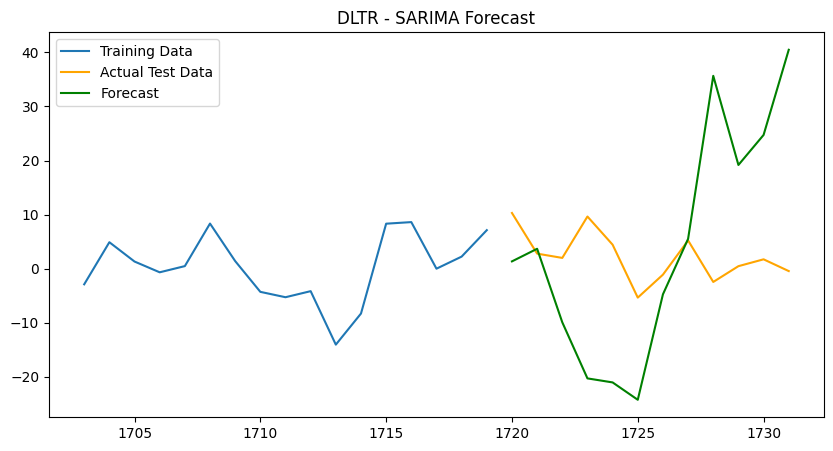

Processing ticker: DOCU
DOCU: R2 = -124.4354


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

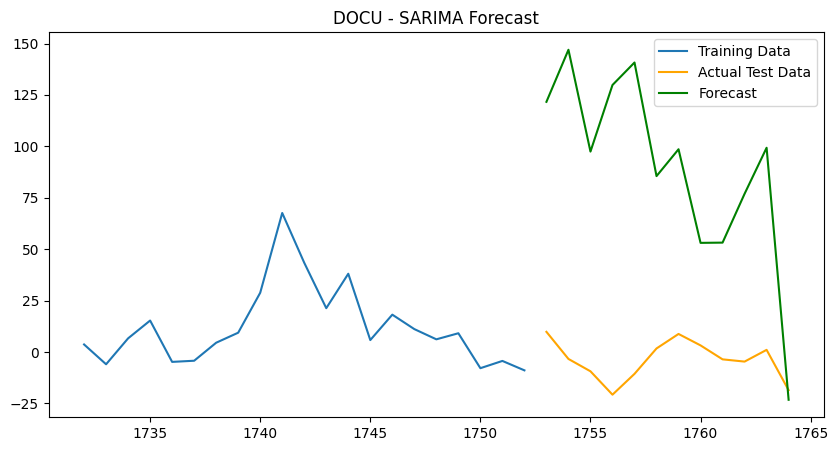

Processing ticker: DOX
DOX: R2 = -31.4471


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

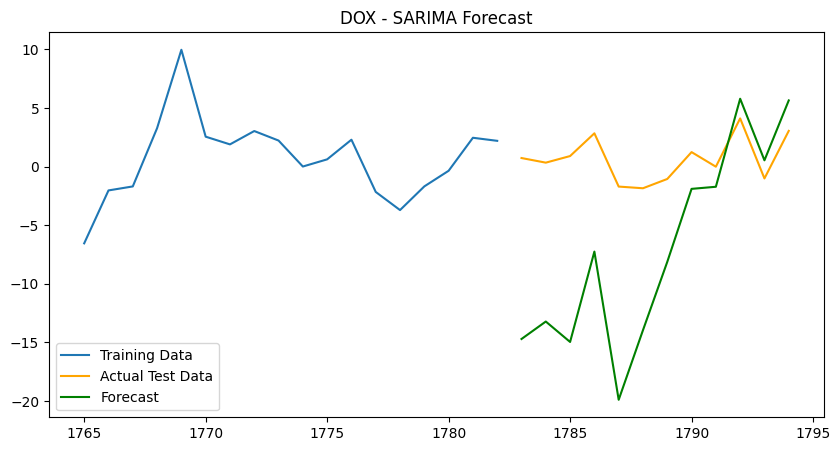

Processing ticker: DVA
DVA: R2 = -70.4453


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

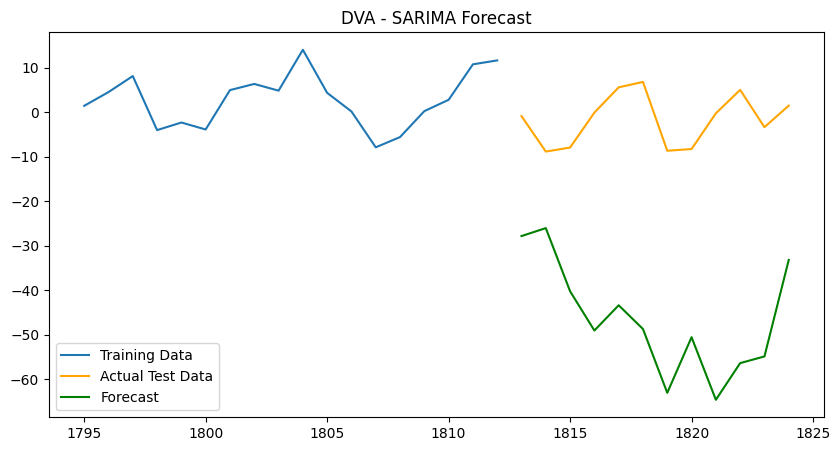

Processing ticker: DXC
DXC: R2 = -5.3365


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

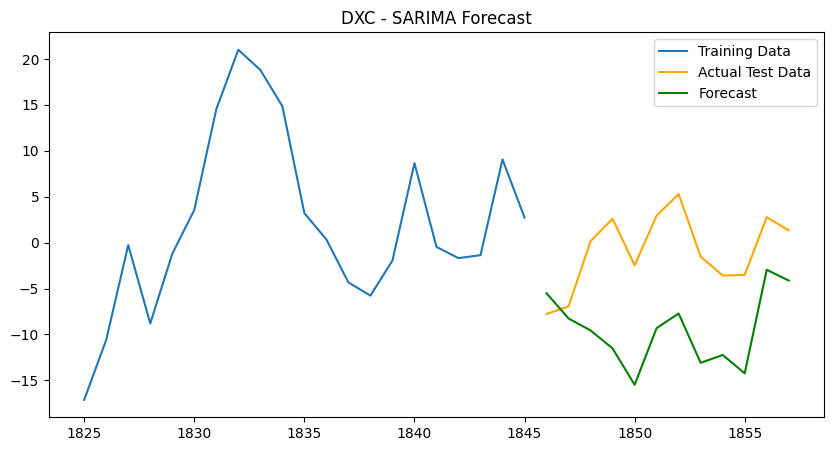

Processing ticker: EBAY
EBAY: R2 = -20798596643922244936925184.0000


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

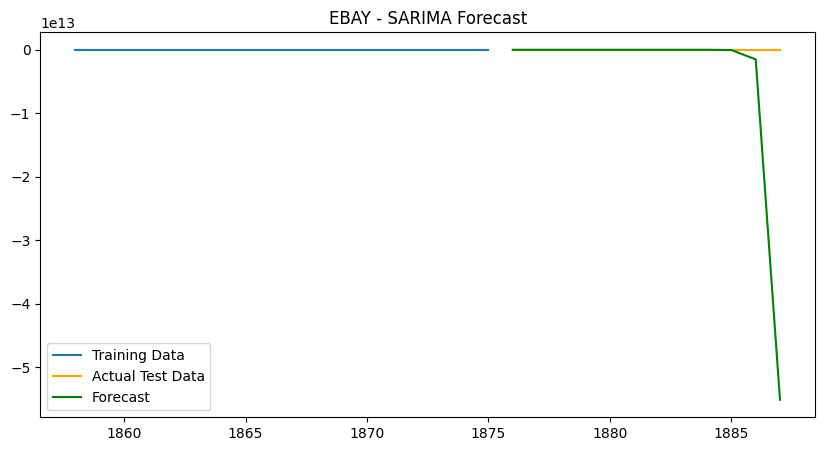

Processing ticker: ECL
ECL: R2 = -454.5950


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

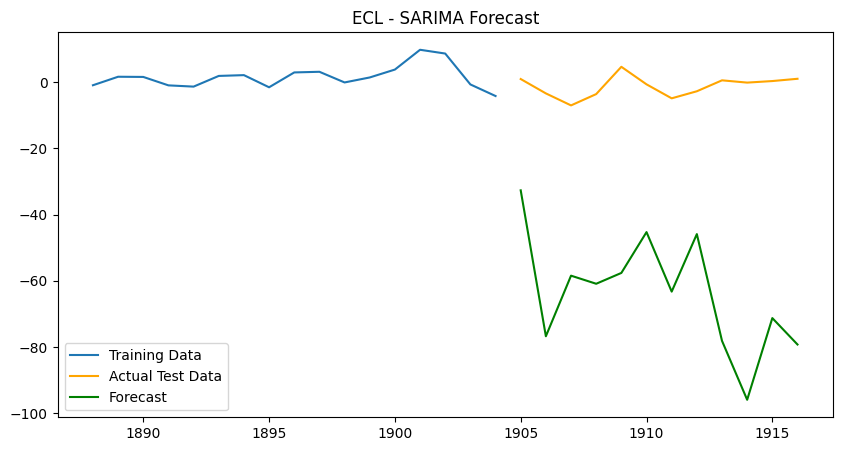

Processing ticker: EFSC
EFSC: R2 = -15.6759


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

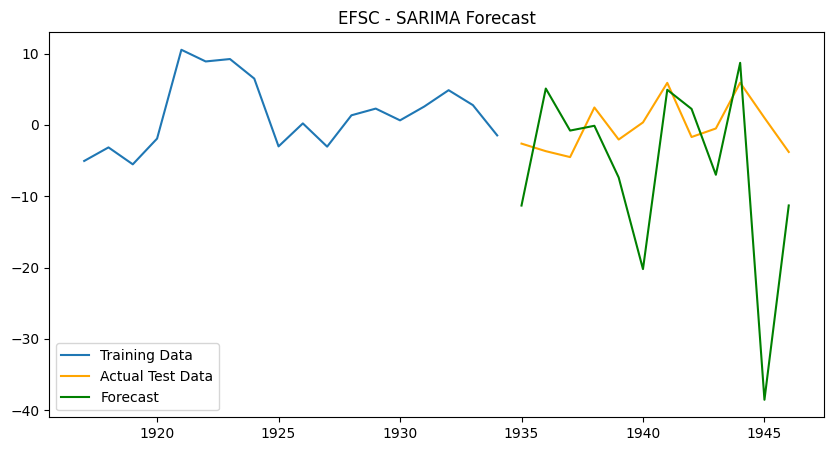

Processing ticker: ELV
ELV: R2 = -0.5691


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

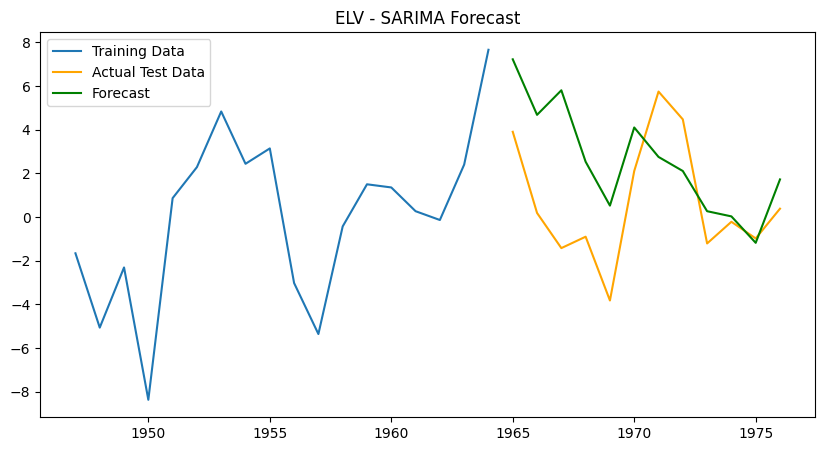

Processing ticker: EMR
EMR: R2 = -3.3856


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

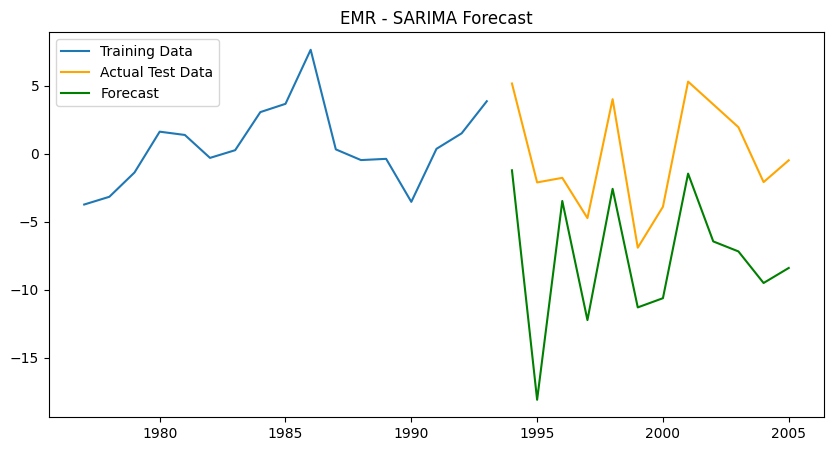

Processing ticker: EPAM
EPAM: R2 = -73.1212


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

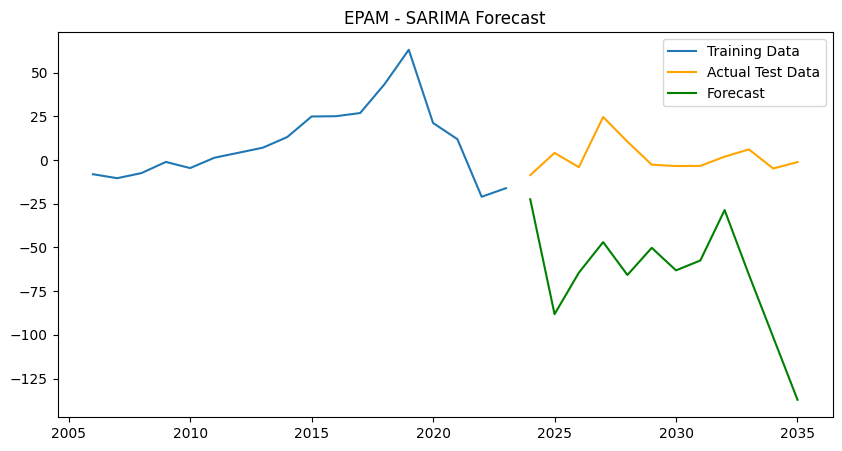

Processing ticker: ETN
ETN: R2 = -22337768848569904625449172992.0000


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

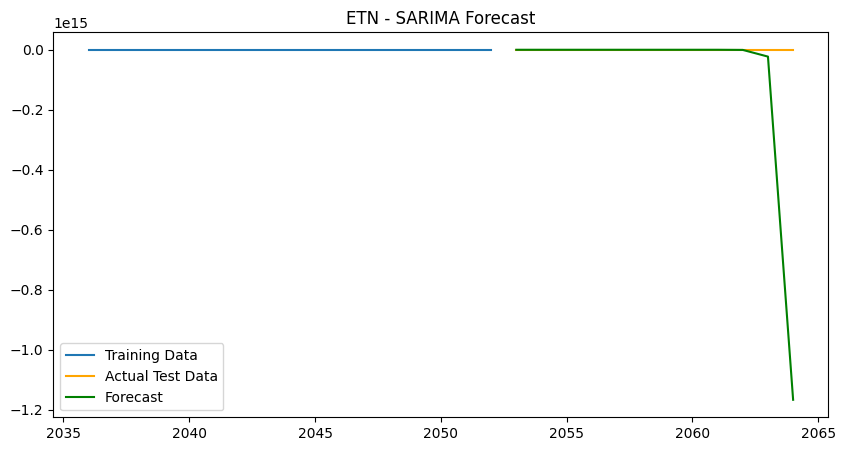

Processing ticker: EXPE
EXPE: R2 = -332644.8075


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

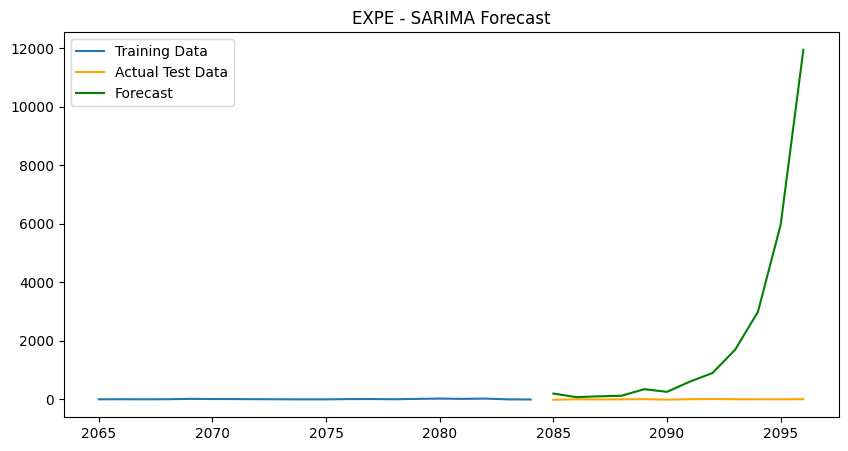

Processing ticker: FAST
FAST: R2 = -23.5412


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

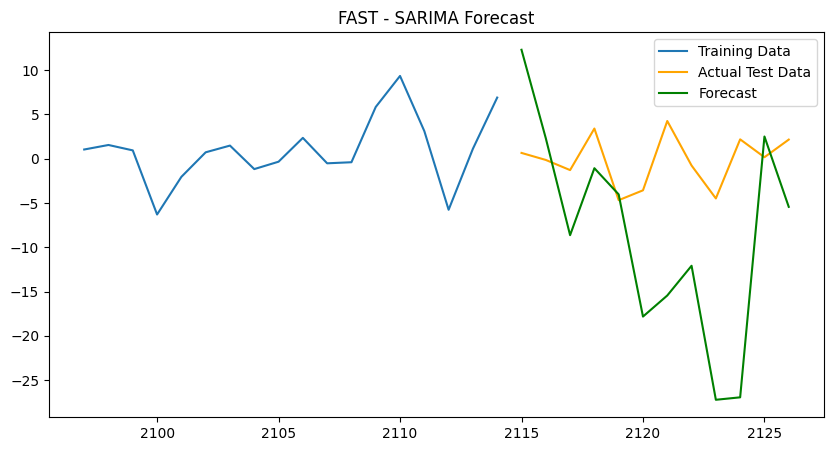

Processing ticker: FDS
FDS: R2 = -0.5464


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

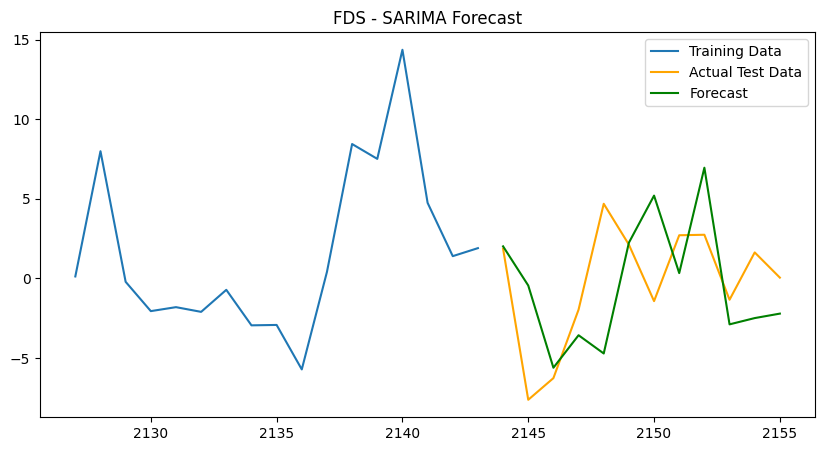

Processing ticker: FDX
FDX: R2 = 0.2884


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

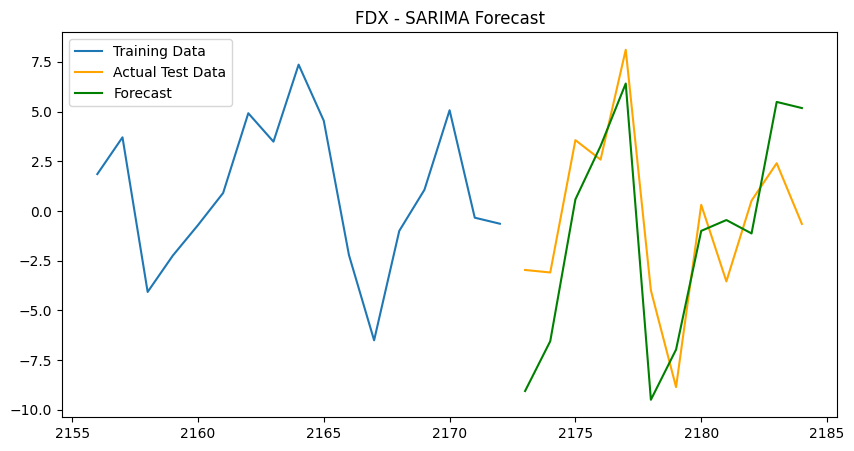

Processing ticker: FI
FI: R2 = -4.8042


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

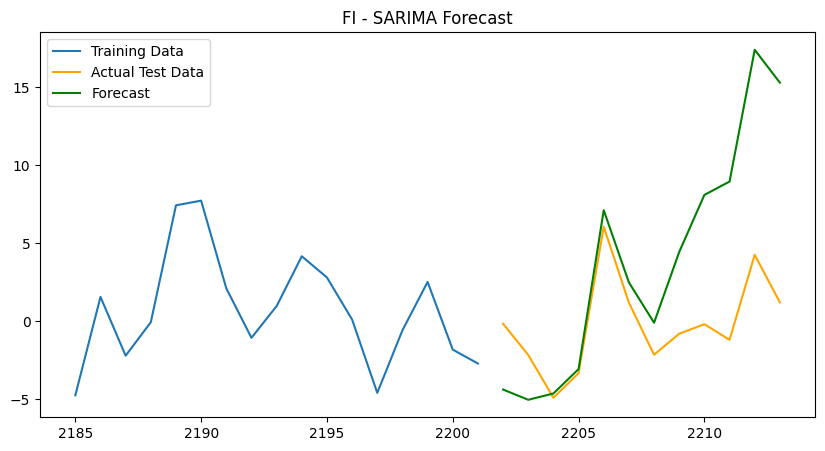

Processing ticker: FL
FL: R2 = -44.8884


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

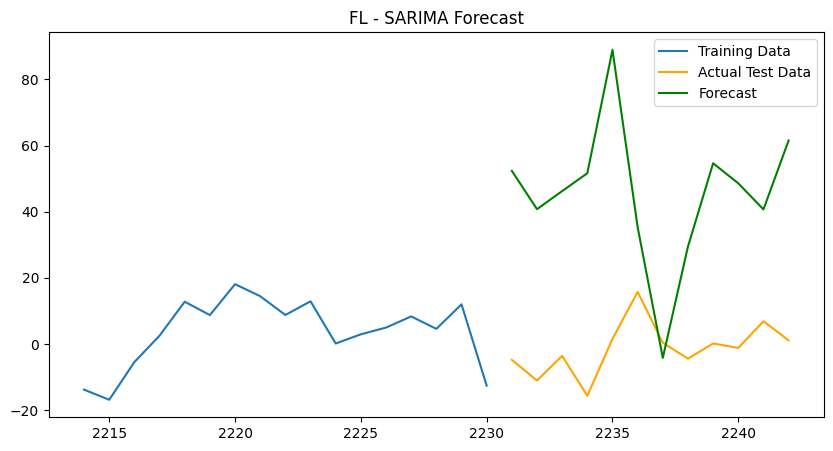

Processing ticker: G
G: R2 = -0.1382


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

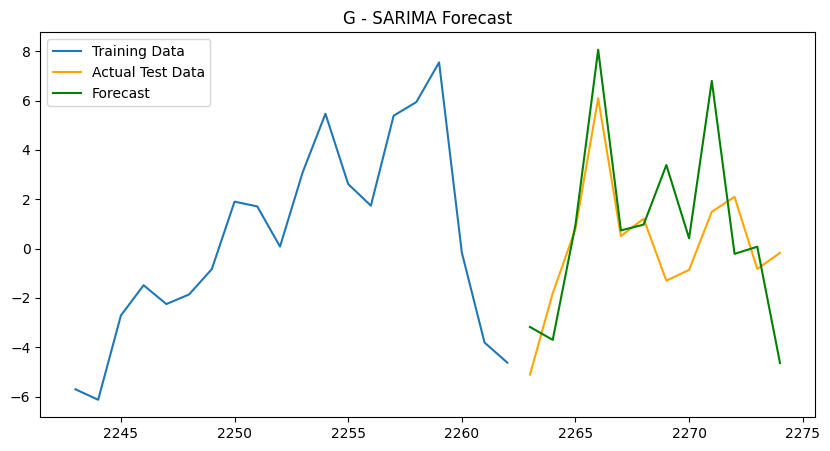

Processing ticker: GEHC
Skipping GEHC due to insufficient data.
Processing ticker: GIB


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

GIB: R2 = -3.6073


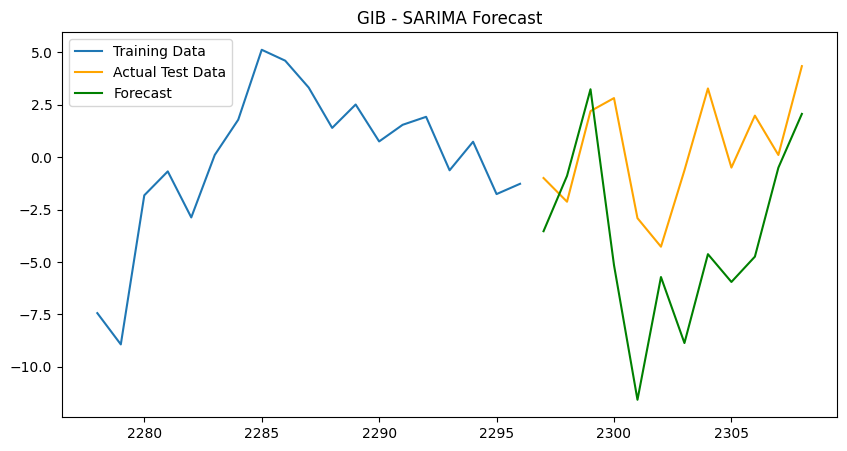

Processing ticker: GLOB


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

GLOB: R2 = -786.8734


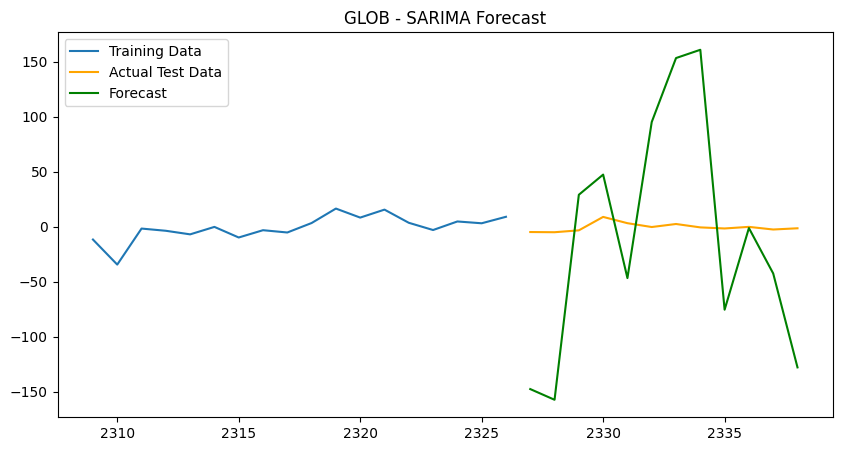

Processing ticker: GME
GME: R2 = -157.1546


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

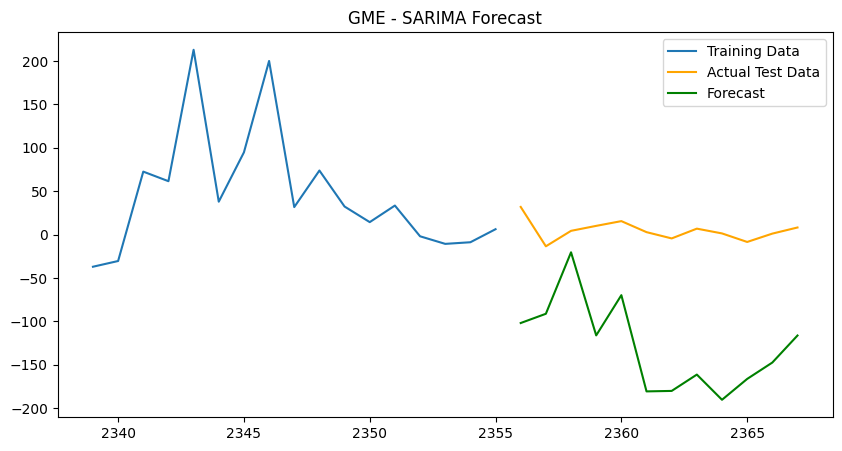

Processing ticker: GPS


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

GPS: R2 = -4.1186


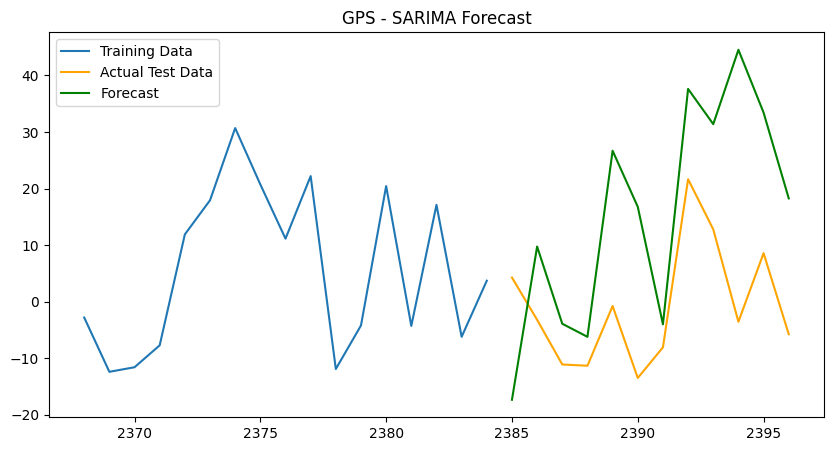

Processing ticker: GRAB
GRAB: R2 = -1205.8870


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

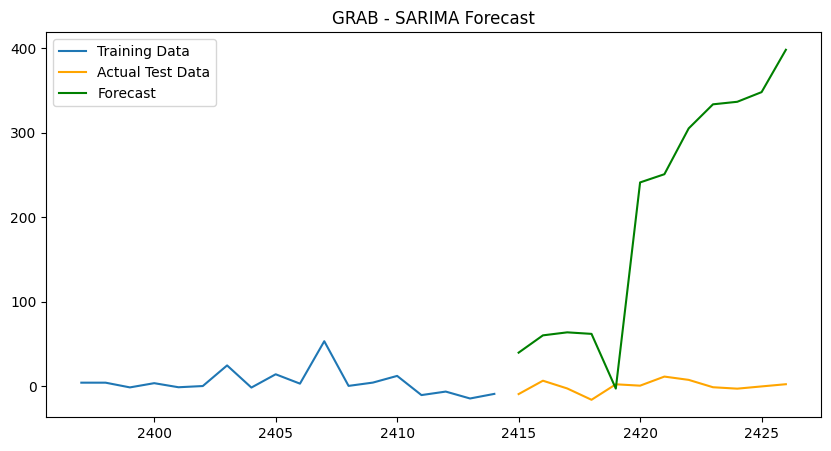

Processing ticker: GS


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

GS: R2 = -18.5109


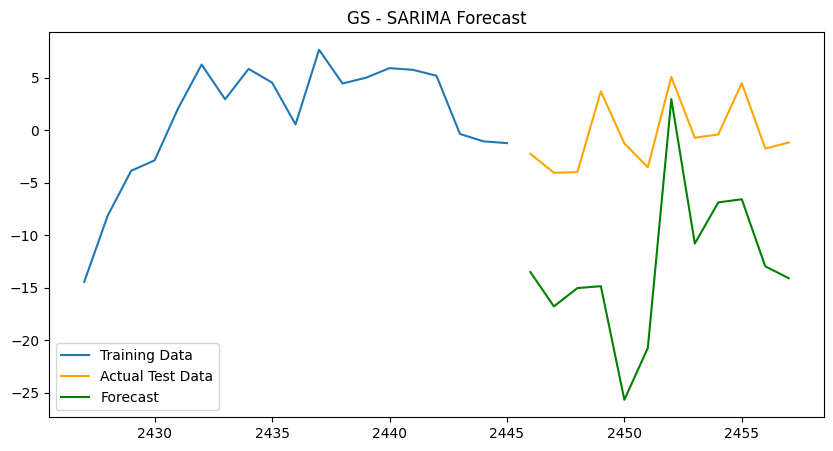

Processing ticker: GSK
GSK: R2 = -29.6102


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

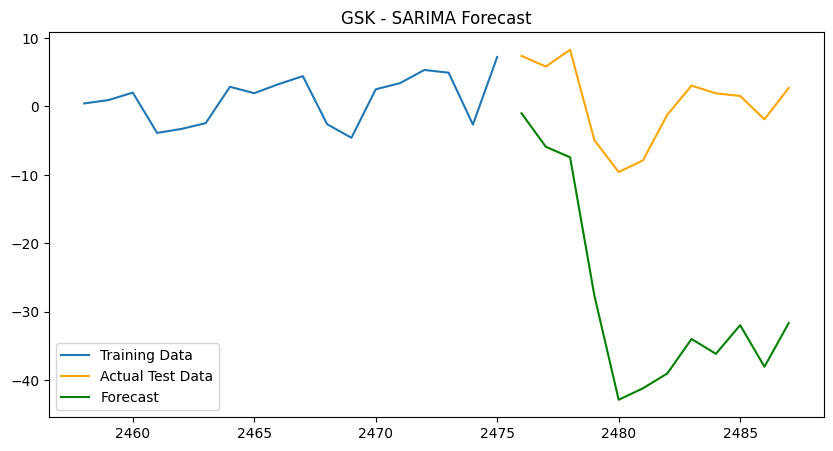

Processing ticker: H
H: R2 = -8.8842


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

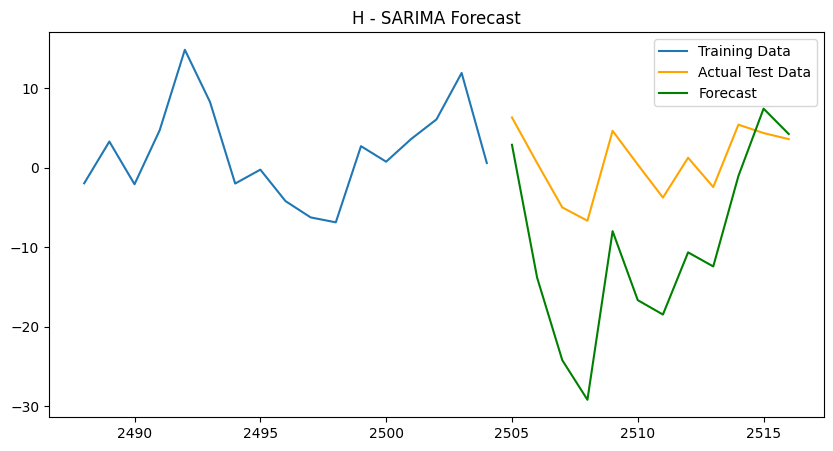

Processing ticker: HAL
HAL: R2 = -469432141910492915433472.0000


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

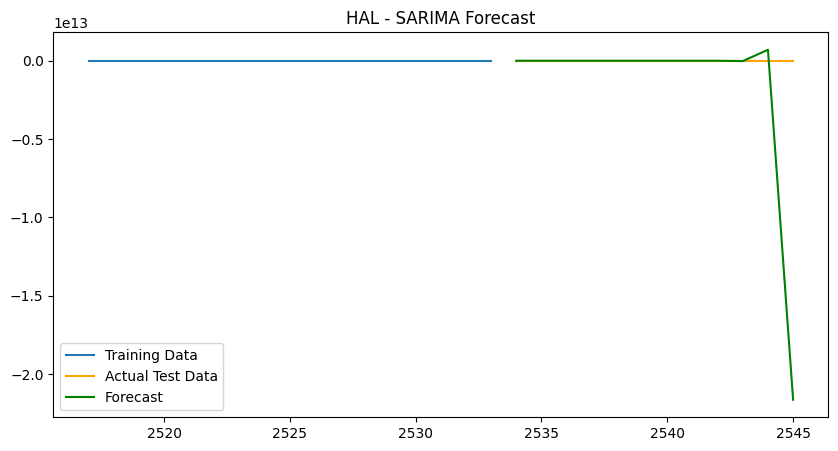

Processing ticker: HCA
HCA: R2 = -16.1998


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

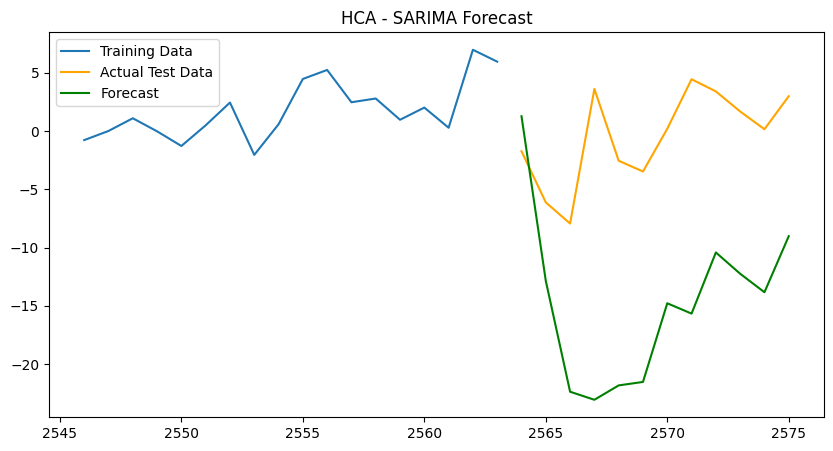

Processing ticker: HLT
HLT: R2 = -30.3054


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

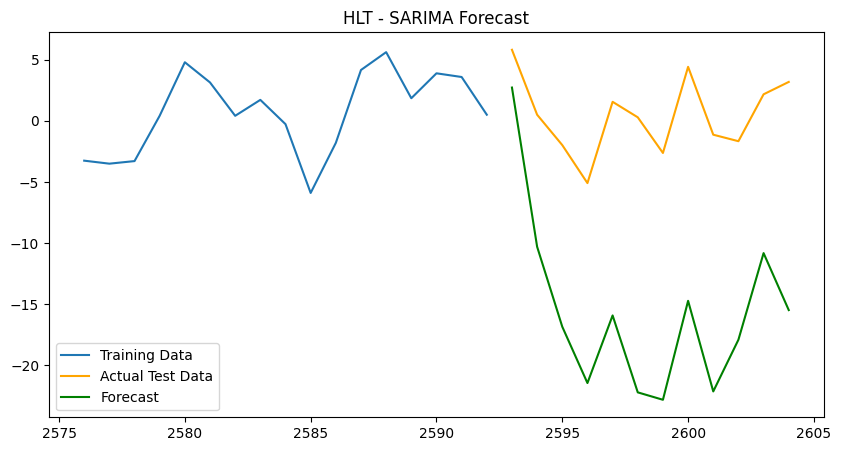

Processing ticker: HMC
HMC: R2 = -21.4116


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

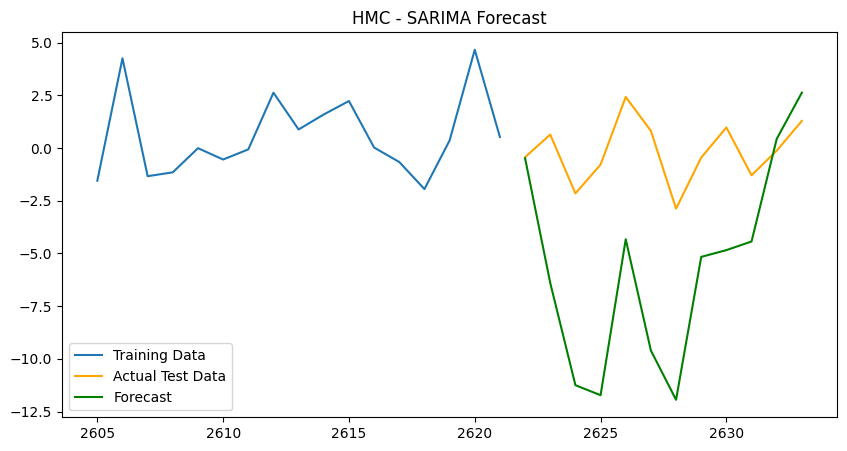

Processing ticker: HON
HON: R2 = -3.0091


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

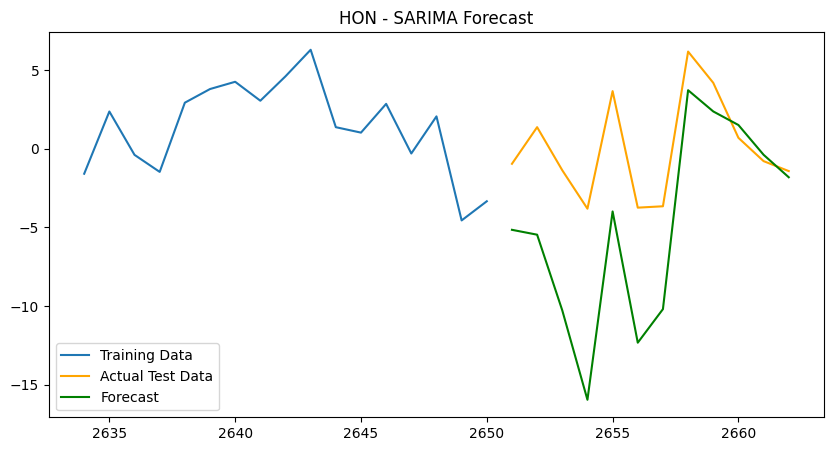

Processing ticker: HSBC
HSBC: R2 = -23.7147


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

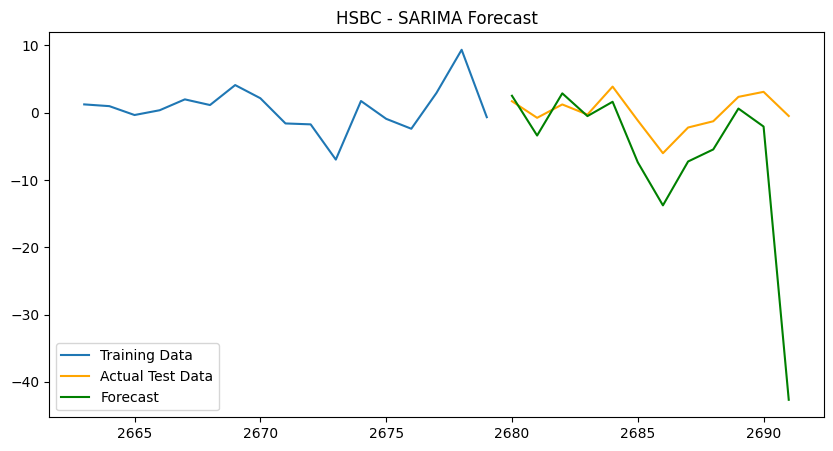

Processing ticker: HTZ
HTZ: R2 = -5.1061


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting paramete

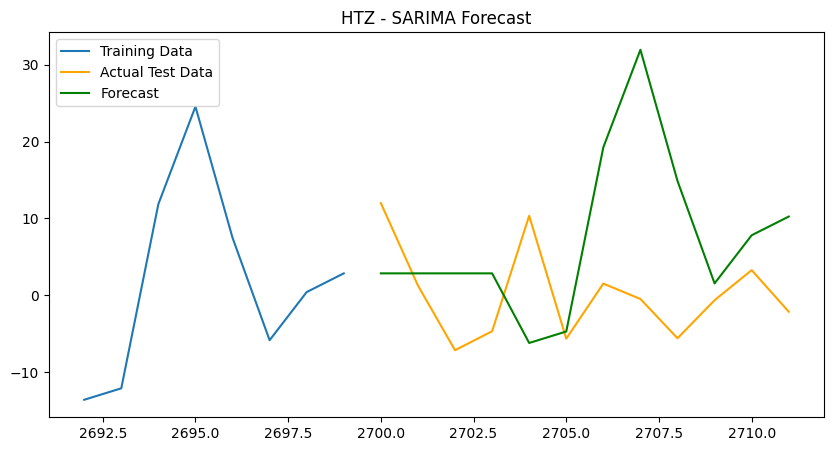

Processing ticker: HUBS
HUBS: R2 = -9481.9003


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

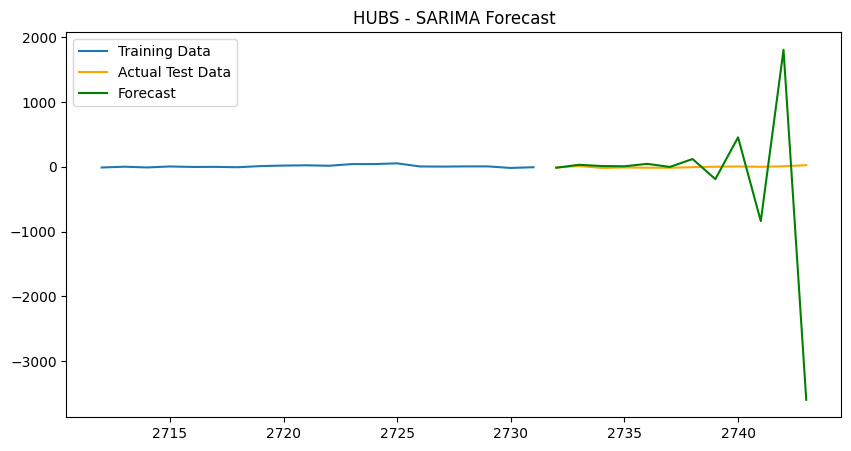

Processing ticker: HUM
HUM: R2 = -26.2190


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

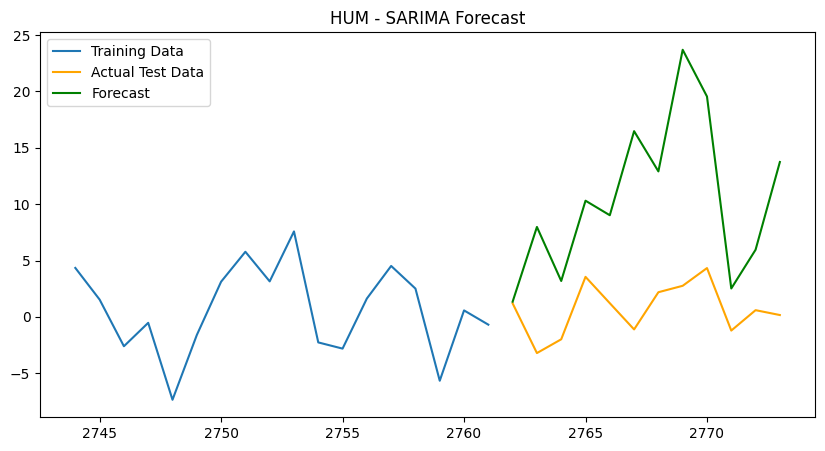

Processing ticker: IBN
IBN: R2 = -2.9299


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

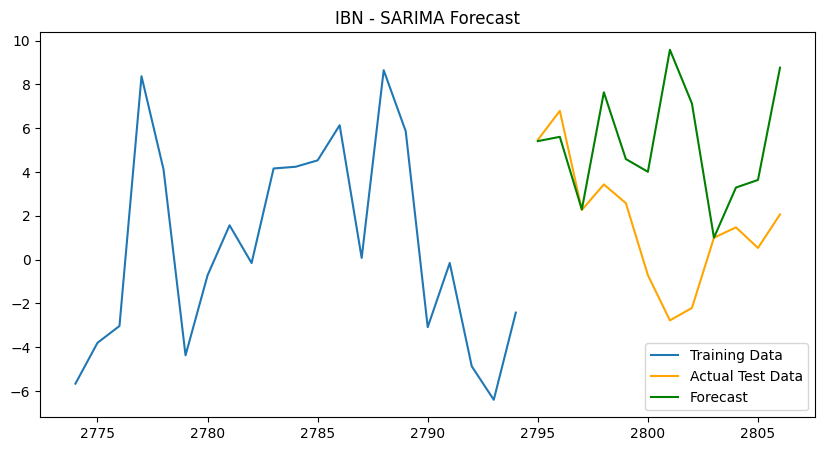

Processing ticker: ICLR
ICLR: R2 = -6.4614


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

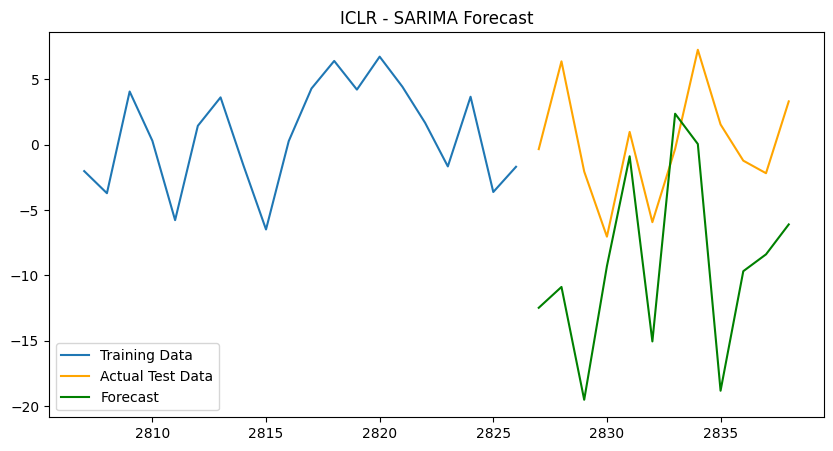

Processing ticker: IFNNY
IFNNY: R2 = -4.0937


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

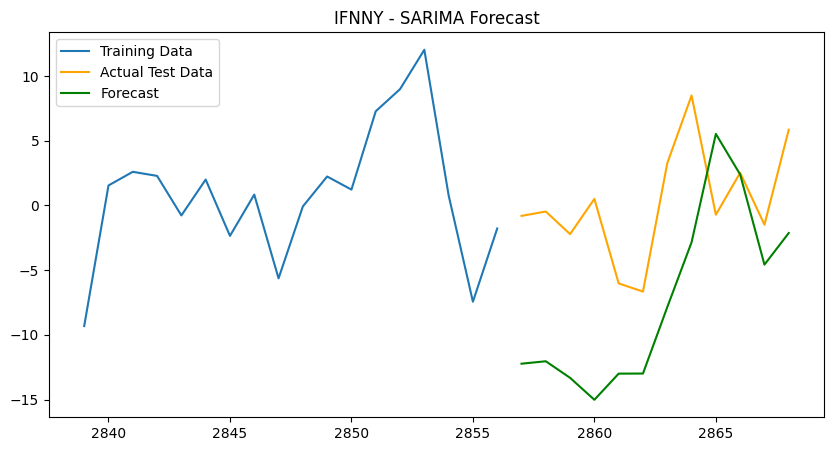

Processing ticker: INFY
INFY: R2 = -23.3677


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

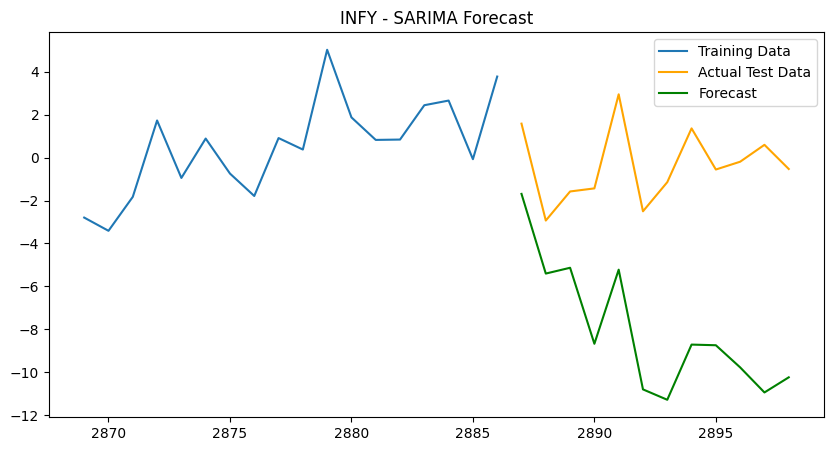

Processing ticker: IQV
IQV: R2 = -4.5698


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

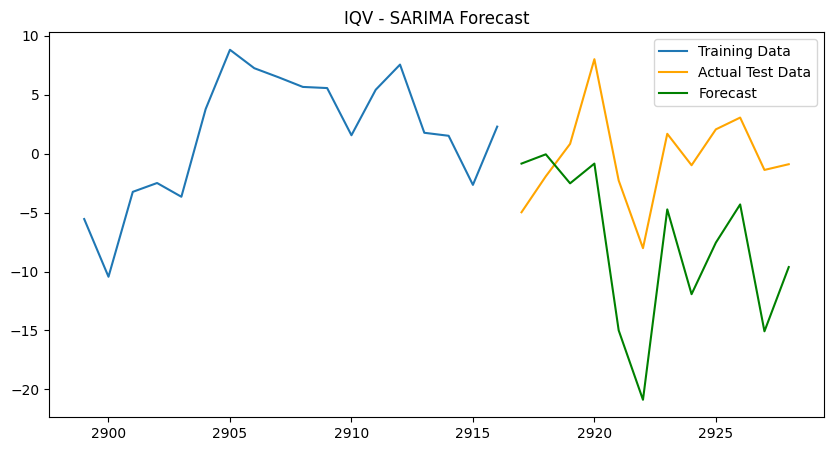

Processing ticker: IT
IT: R2 = -75.7890


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

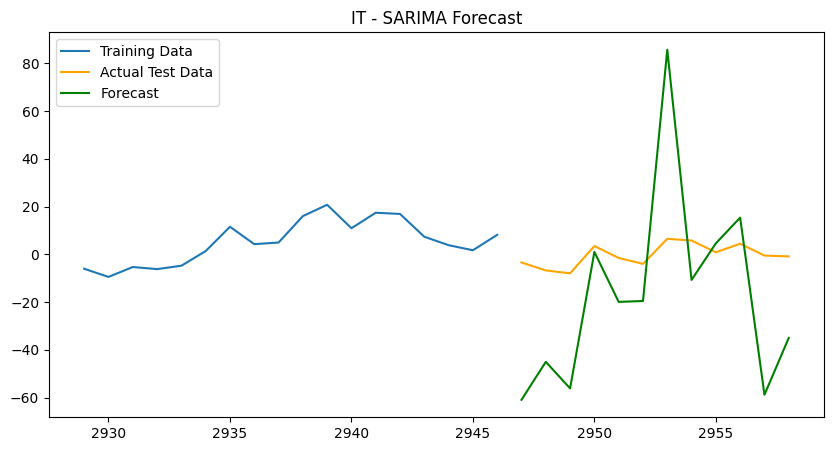

Processing ticker: J
J: R2 = 0.2877


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

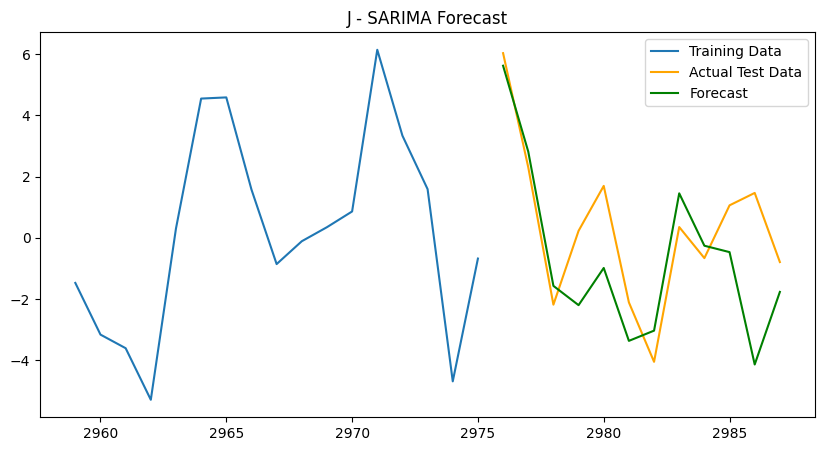

Processing ticker: JCI
JCI: R2 = -257711333904141070190510080.0000


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

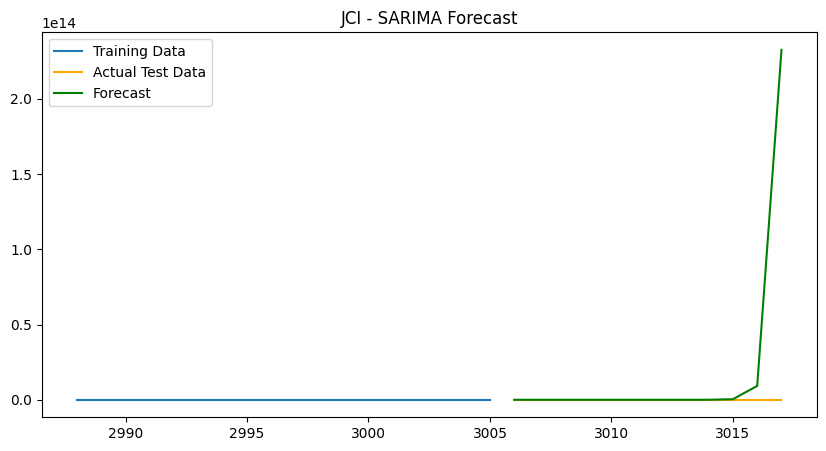

Processing ticker: JWN
JWN: R2 = -83.7853


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

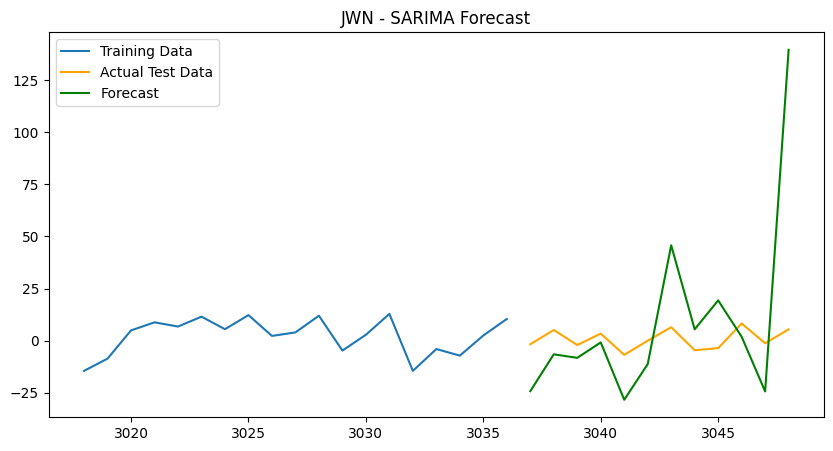

Processing ticker: KELYB
KELYB: R2 = -10836793964596926873600.0000


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

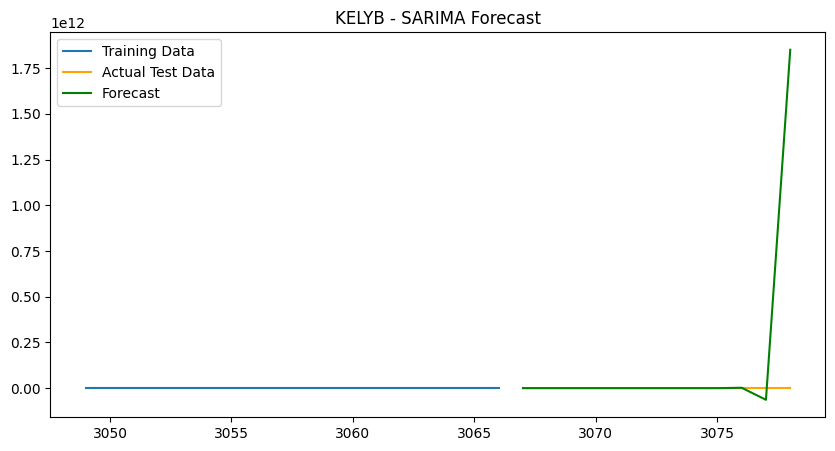

Processing ticker: KMX
KMX: R2 = -48.2790


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

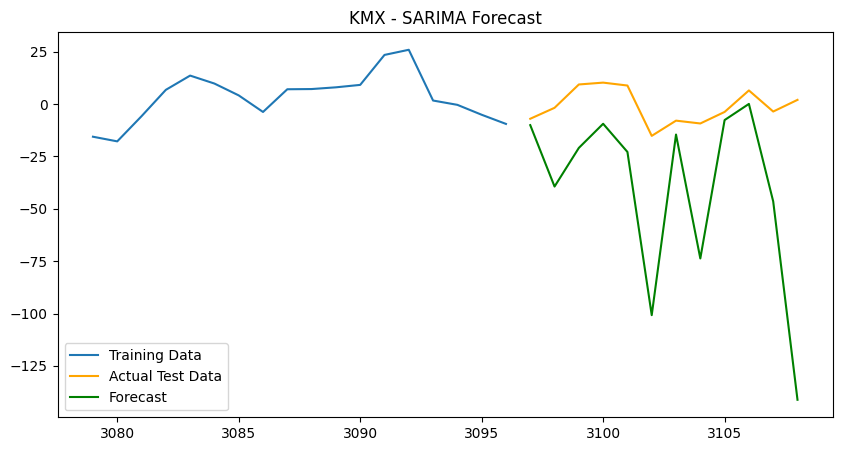

Processing ticker: KR
KR: R2 = -18.4184


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

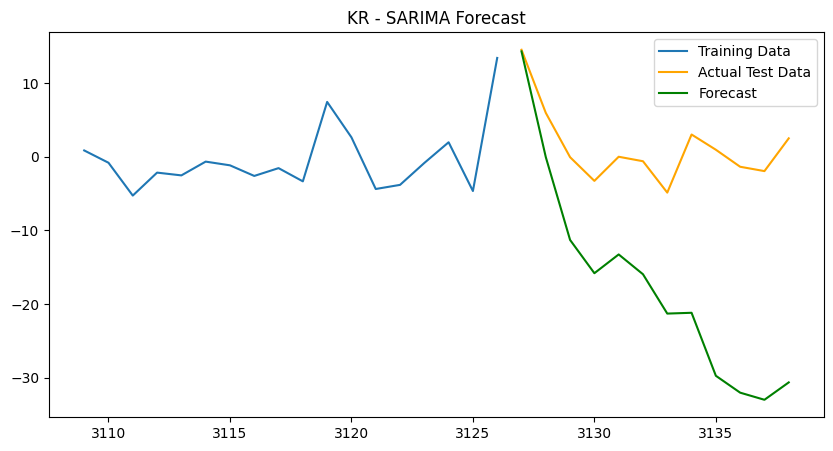

Processing ticker: LDOS
LDOS: R2 = -24.9380


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

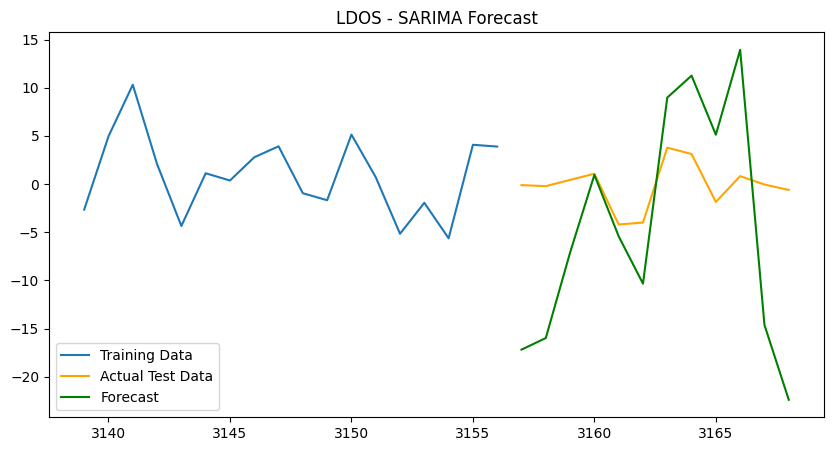

Processing ticker: LEO
LEO: R2 = -18.6623


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

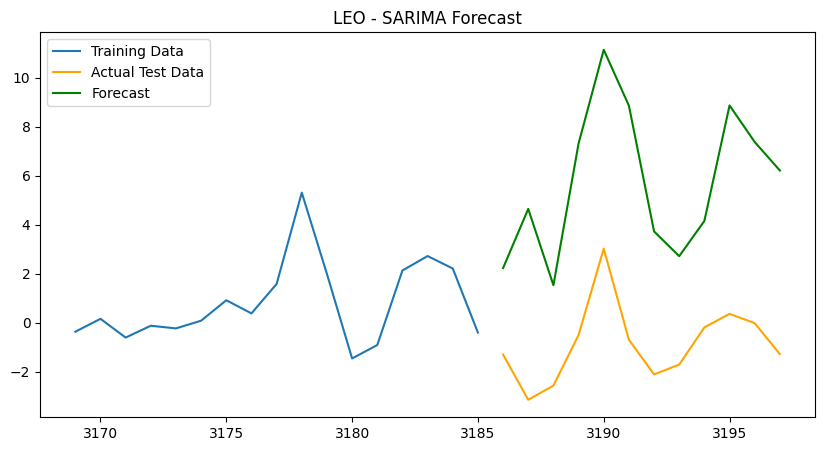

Processing ticker: LHX
LHX: R2 = -48.3654


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

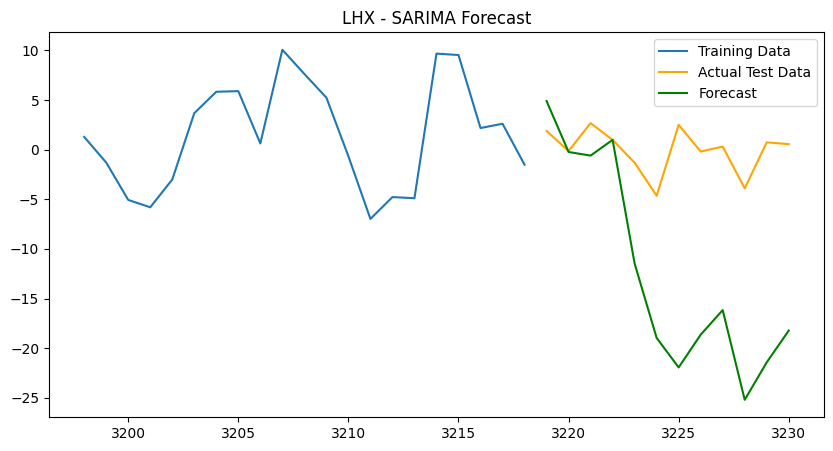

Processing ticker: LMT


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

LMT: R2 = 0.2280


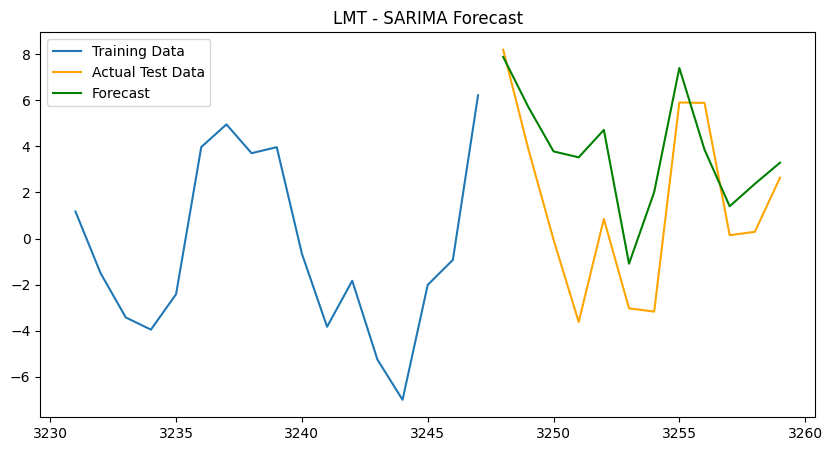

Processing ticker: LTH
LTH: R2 = -1.6599


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting paramete

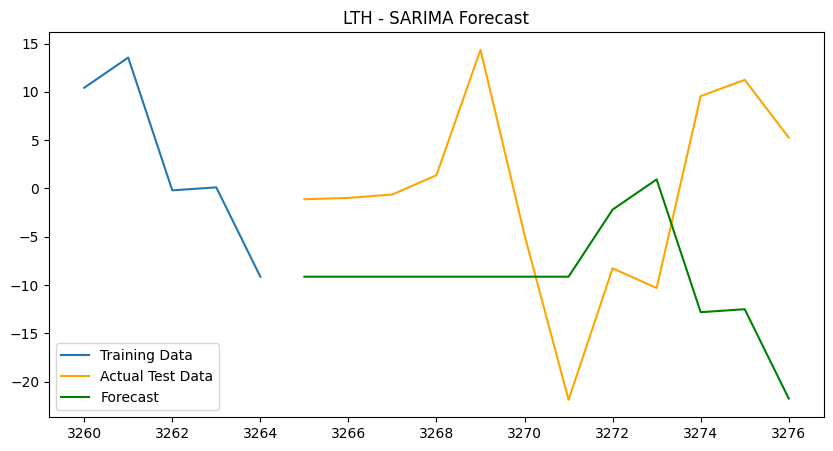

Processing ticker: LULU
LULU: R2 = -4.2454


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

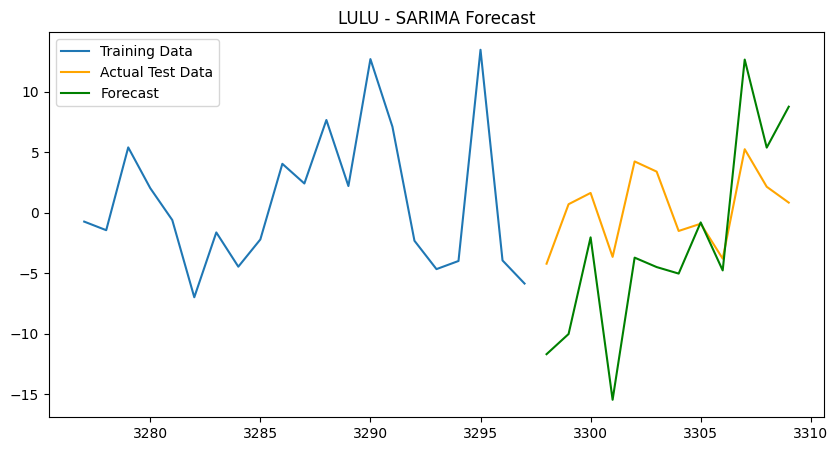

Processing ticker: LUMN


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

LUMN: R2 = -15.9601


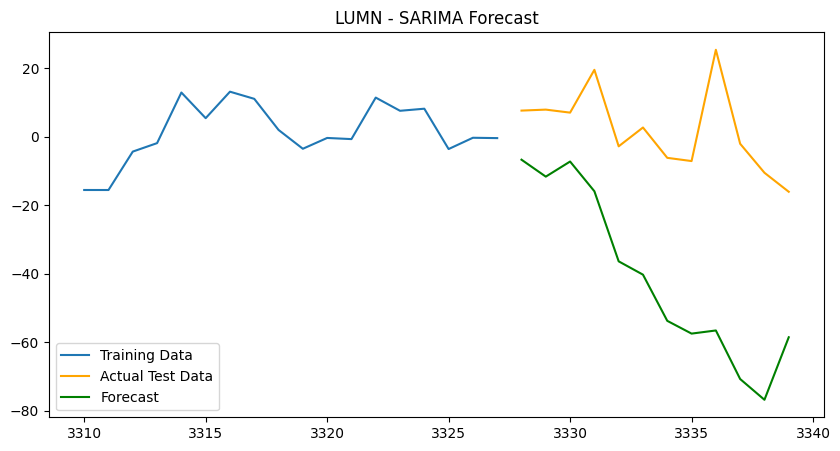

Processing ticker: LUV


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

LUV: R2 = -9.6950


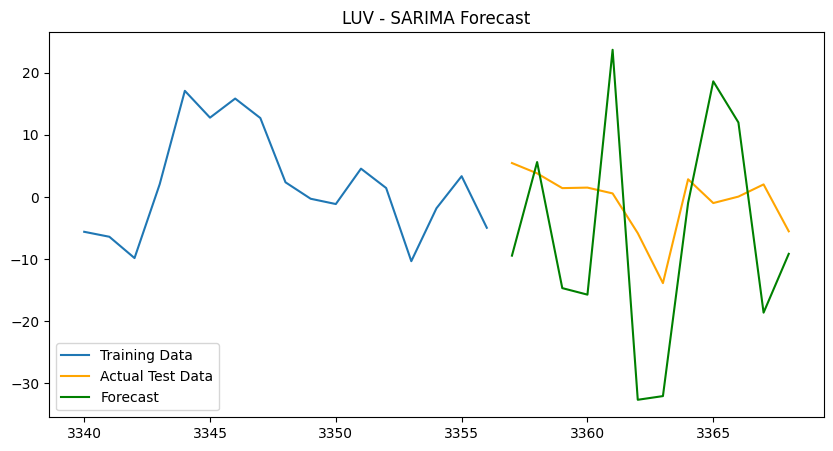

Processing ticker: LYG
LYG: R2 = -70.3811


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

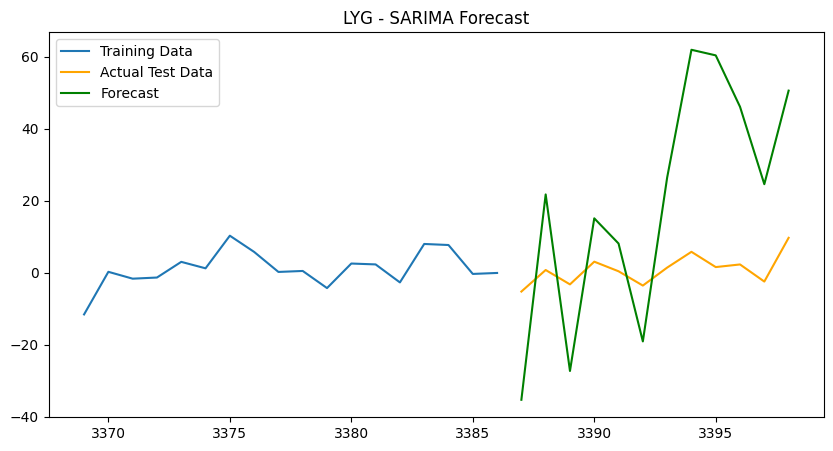

Processing ticker: MA
MA: R2 = -10.8730


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

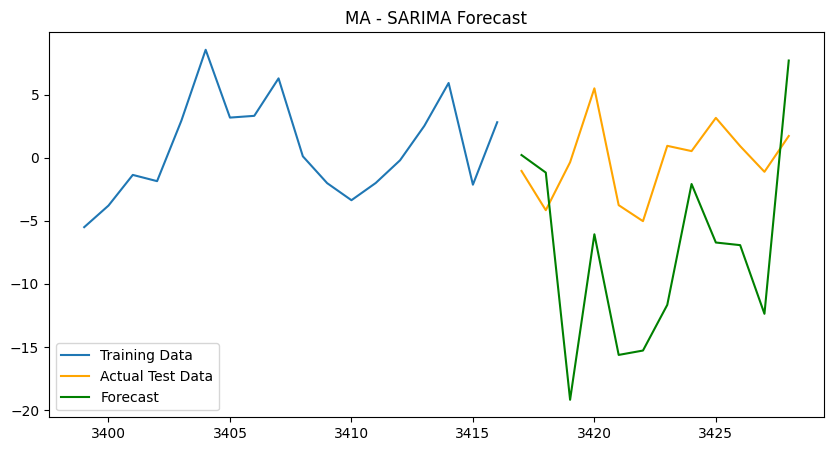

Processing ticker: MAN
MAN: R2 = -25.9601


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

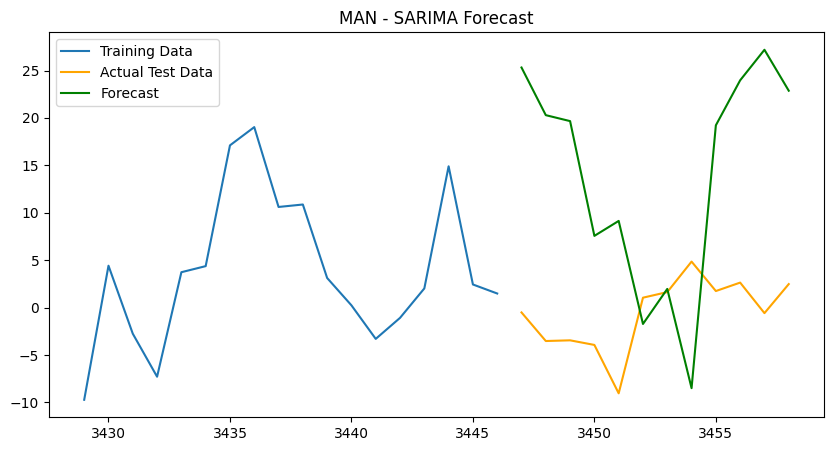

Processing ticker: MAR
MAR: R2 = -66.6458


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

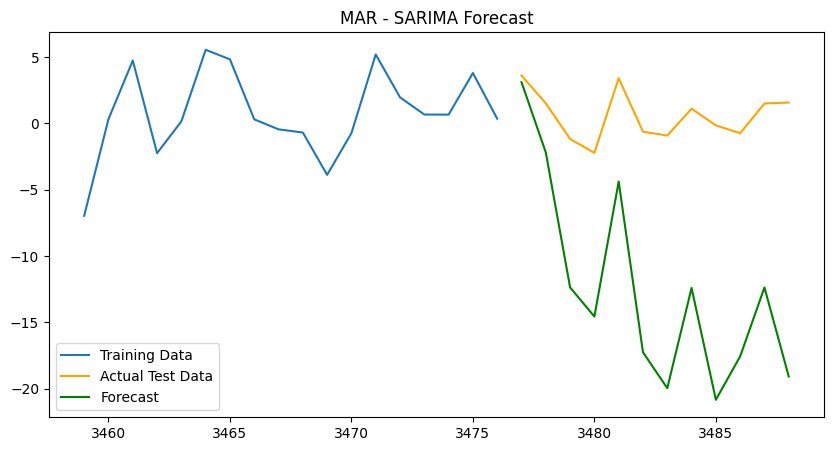

Processing ticker: MCK
MCK: R2 = -50.5225


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

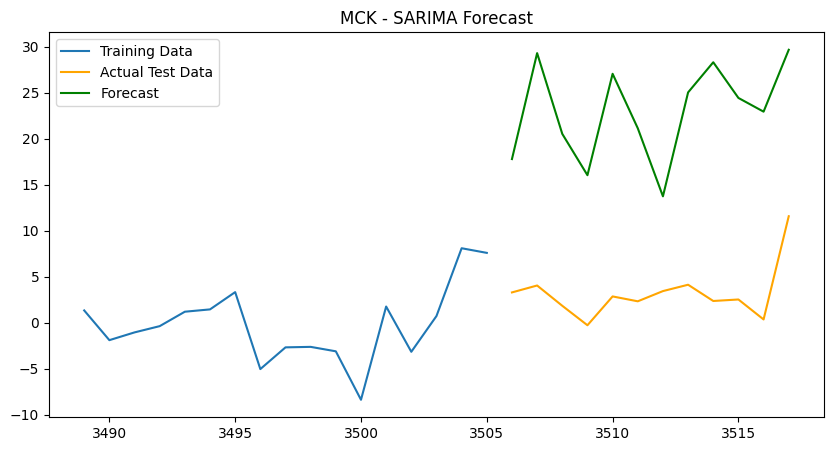

Processing ticker: MDT
MDT: R2 = -44.7957


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

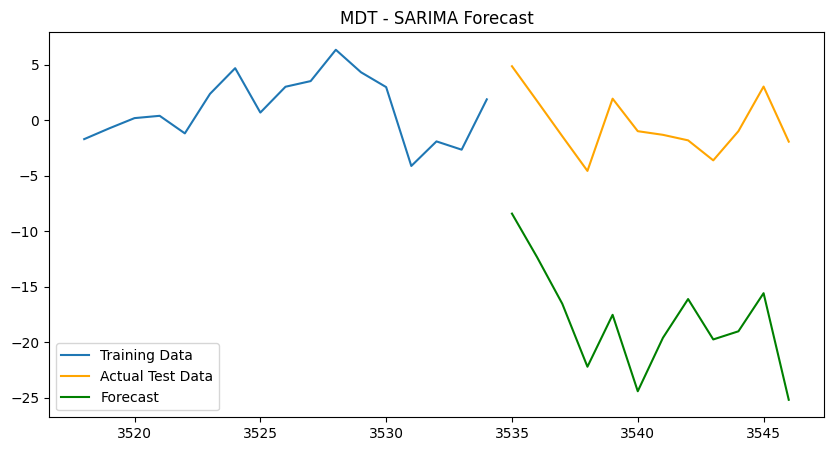

Processing ticker: MET
MET: R2 = -13.3764


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

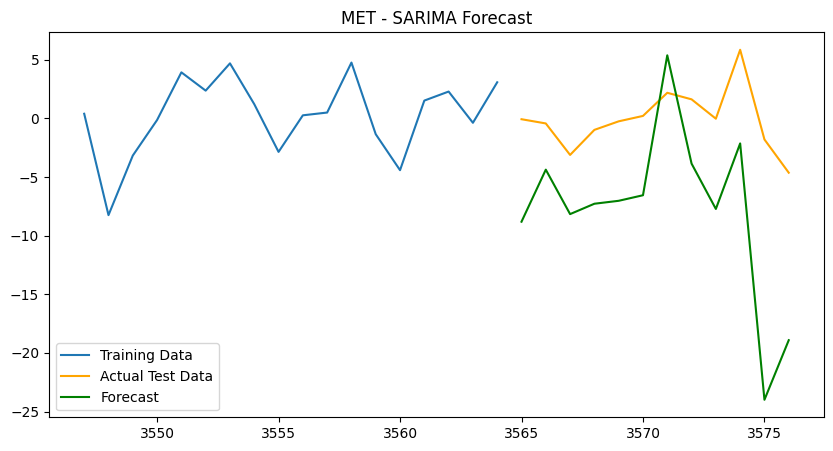

Processing ticker: META
META: R2 = -2508.8768


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

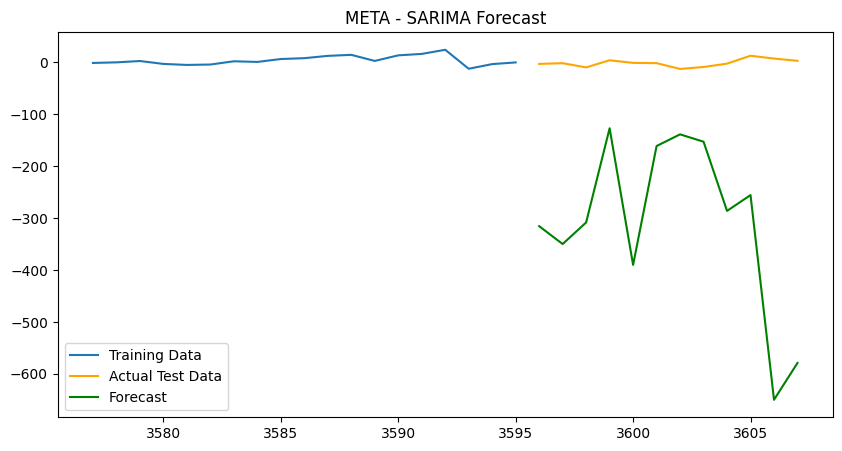

Processing ticker: MFC
MFC: R2 = -27.5431


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

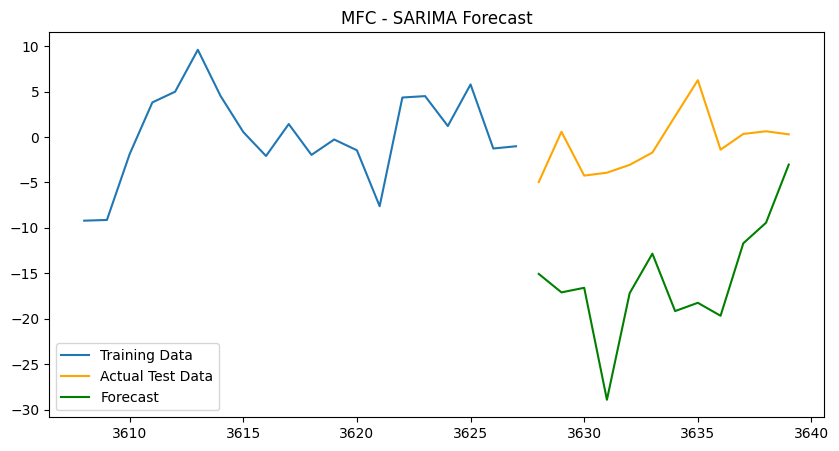

Processing ticker: MMS
MMS: R2 = -1.1987


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

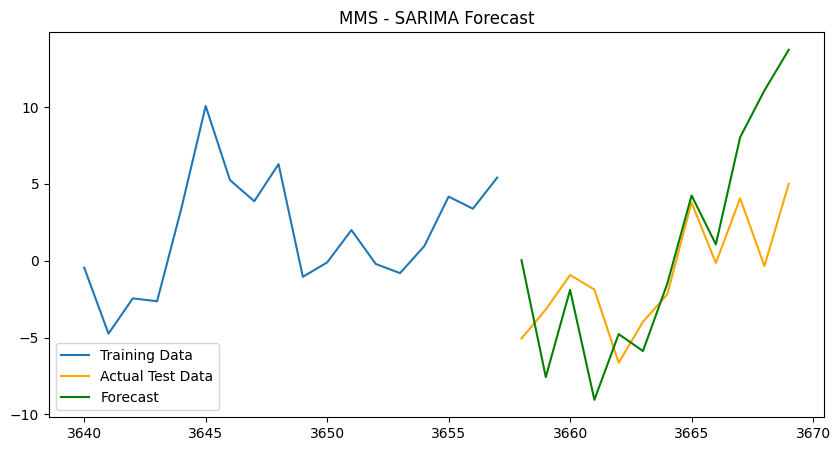

Processing ticker: MORN
MORN: R2 = -1965.5558


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

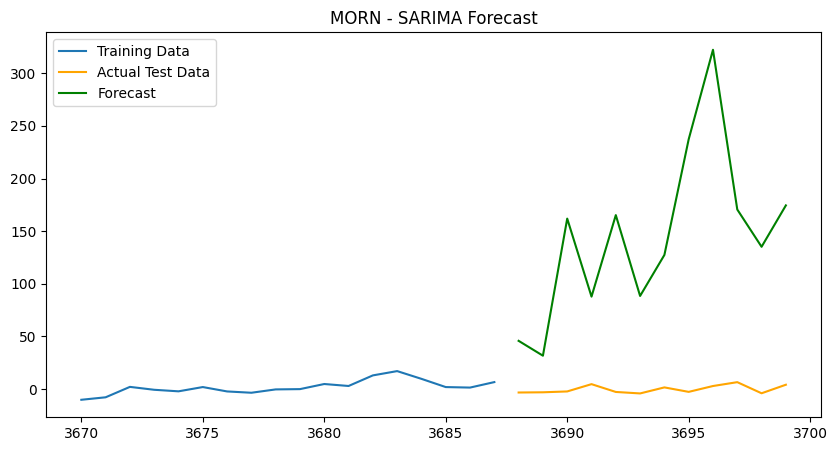

Processing ticker: MRK
MRK: R2 = -19220472929200344399872.0000


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

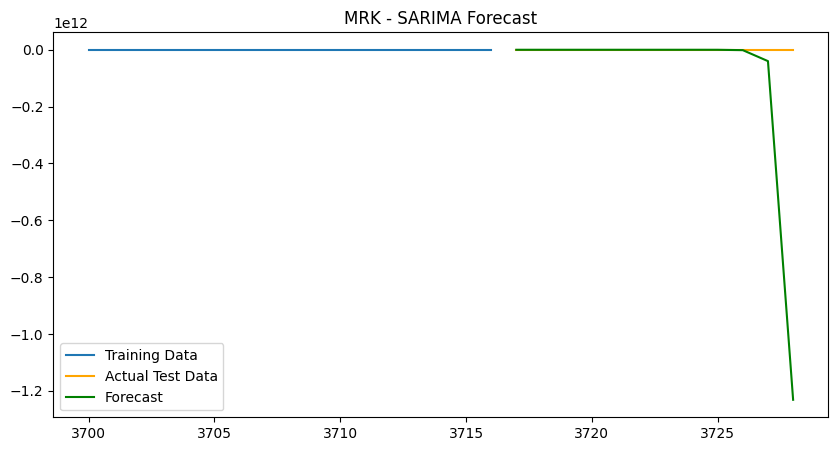

Processing ticker: MSFT
MSFT: R2 = -11.0224


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

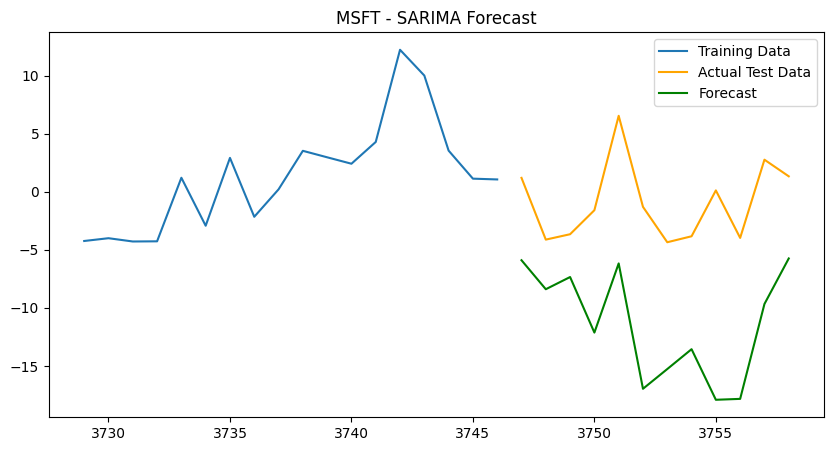

Processing ticker: MU
MU: R2 = -6.7716


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

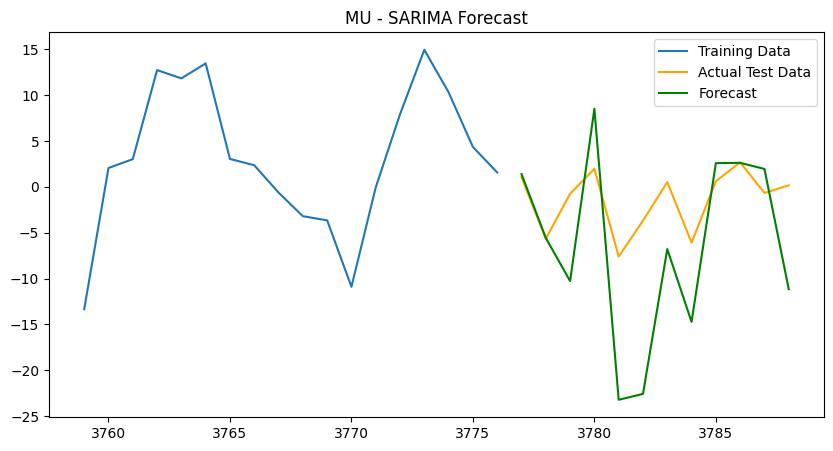

Processing ticker: NOC
NOC: R2 = -2.2995


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

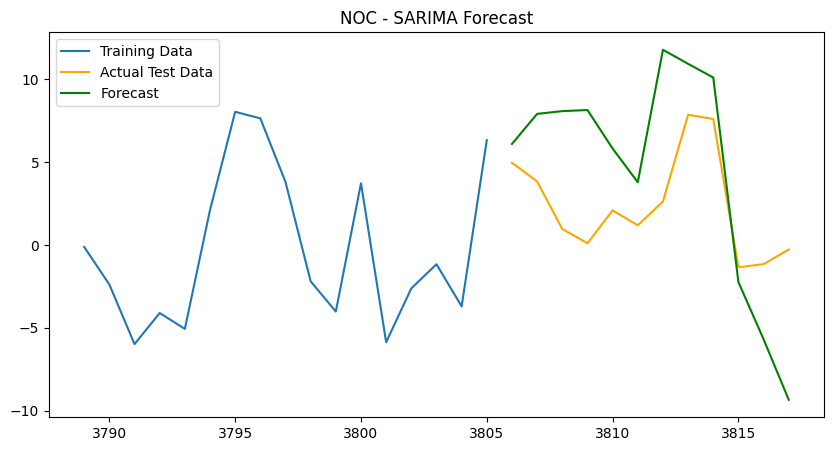

Processing ticker: NOW
NOW: R2 = -33.9562


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

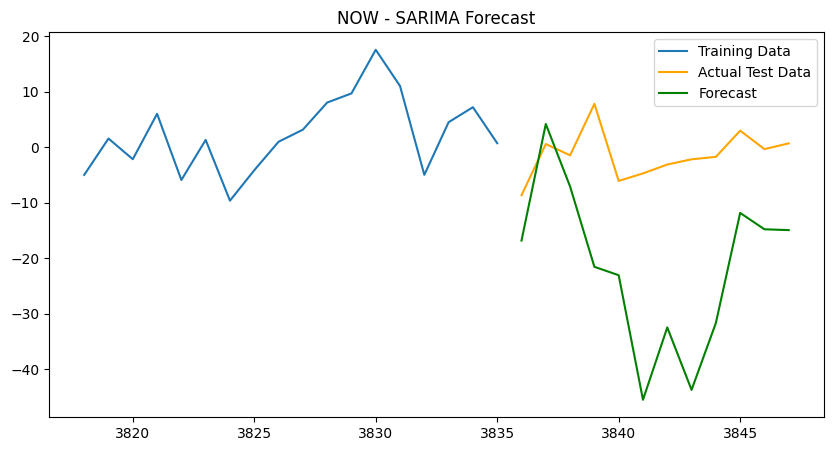

Processing ticker: NTRS
NTRS: R2 = -5.3010


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

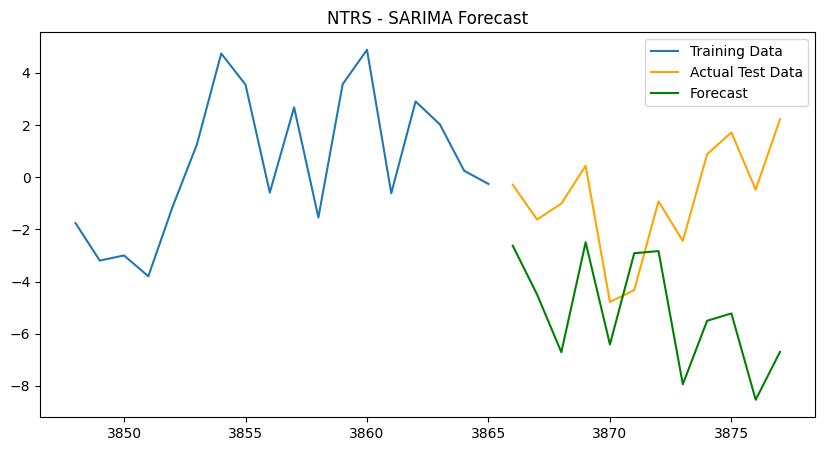

Processing ticker: NVS
NVS: R2 = -0.9386


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

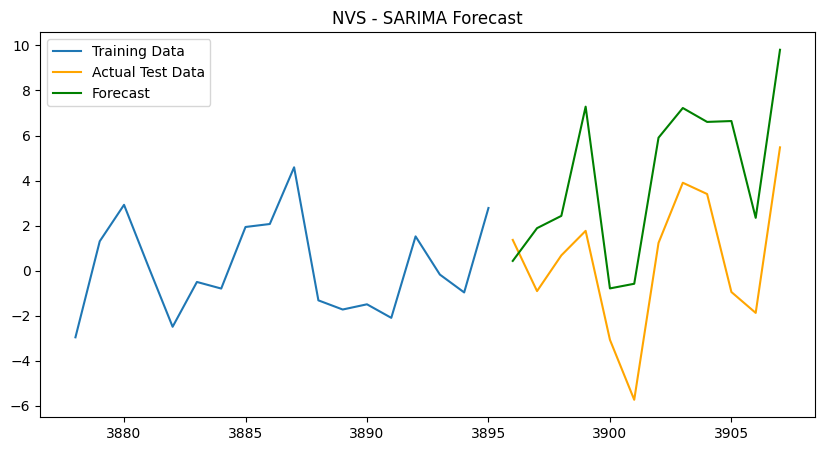

Processing ticker: NWG
NWG: R2 = -0.9742


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

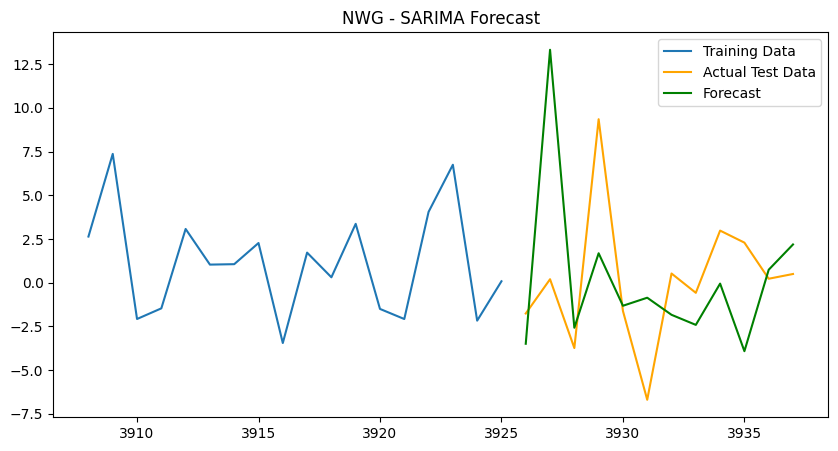

Processing ticker: NXTT
Skipping NXTT due to insufficient data.
Processing ticker: ORCL


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

ORCL: R2 = -1.9009


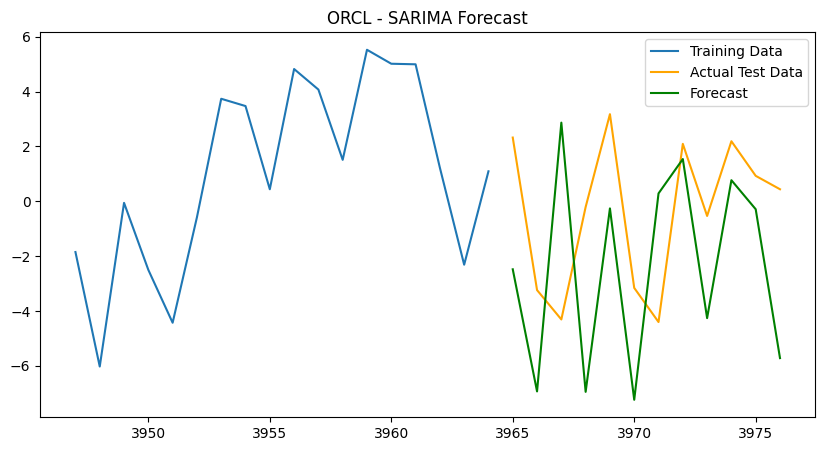

Processing ticker: PAYC


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

PAYC: R2 = -3.8573


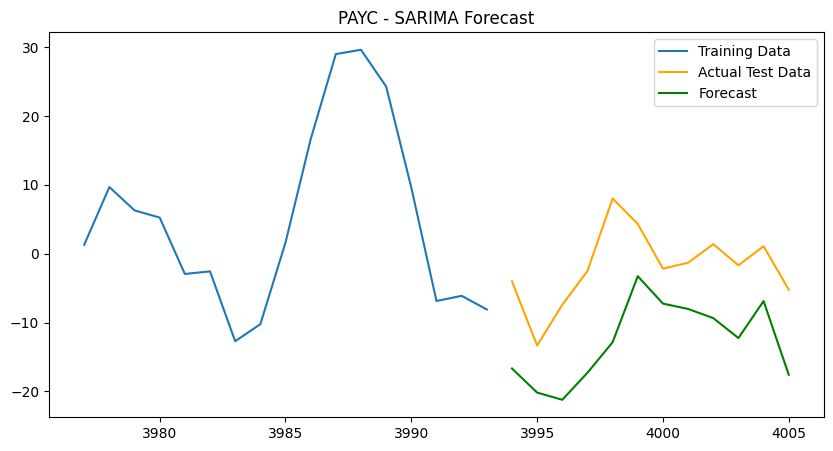

Processing ticker: PEP
PEP: R2 = 0.2714


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

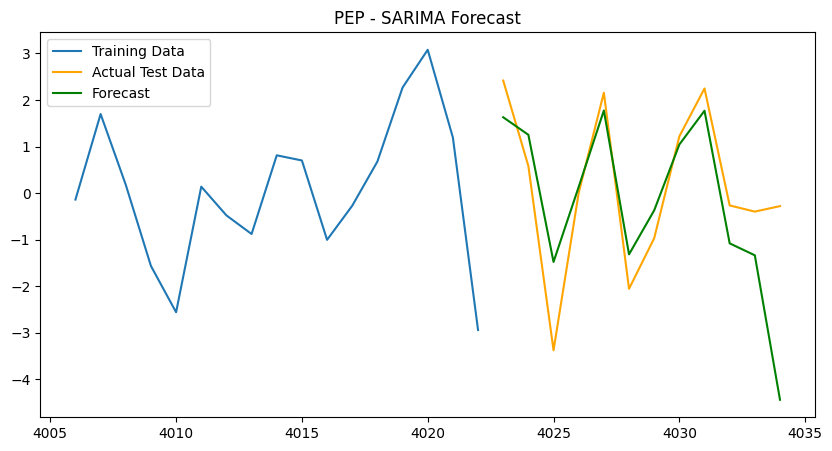

Processing ticker: PFE


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

PFE: R2 = -322.4550


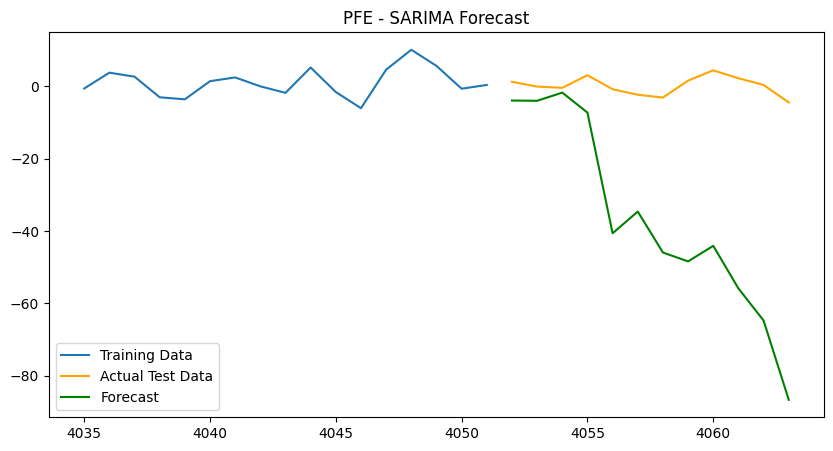

Processing ticker: PM
PM: R2 = -3.0497


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

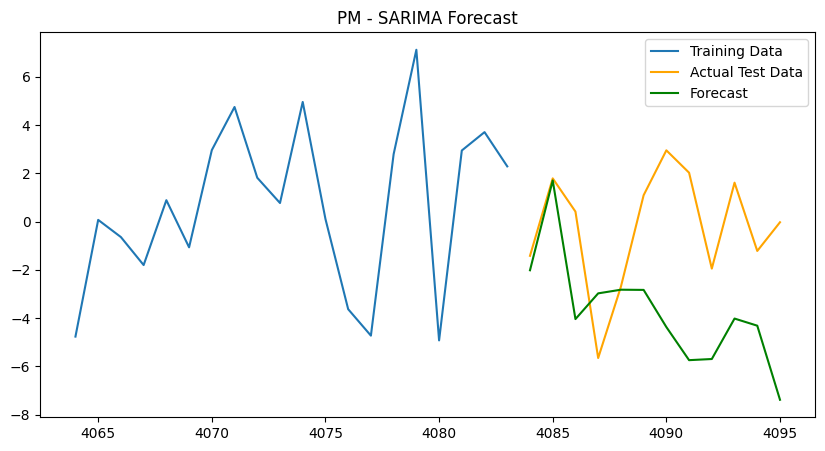

Processing ticker: PNC


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

PNC: R2 = -40.9484


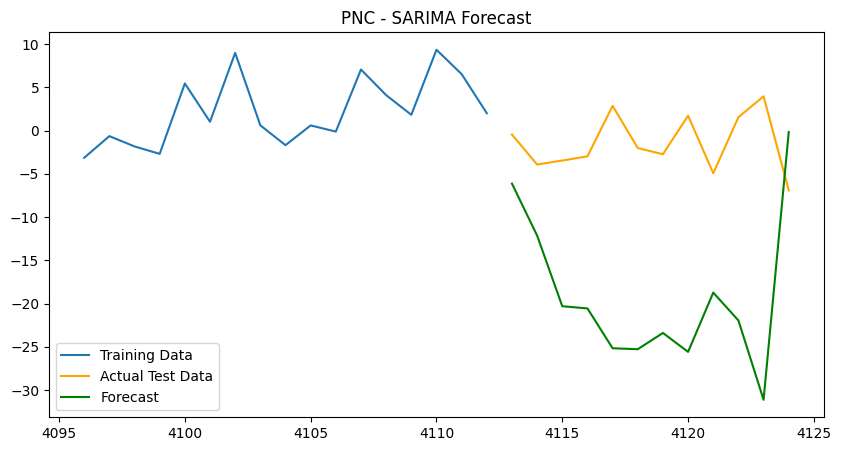

Processing ticker: PSO
PSO: R2 = -3.1303


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

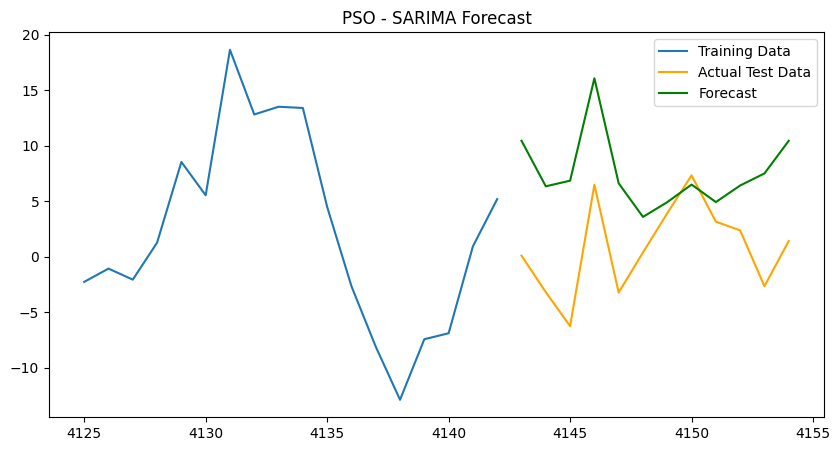

Processing ticker: PUBGY


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

PUBGY: R2 = -9.0978


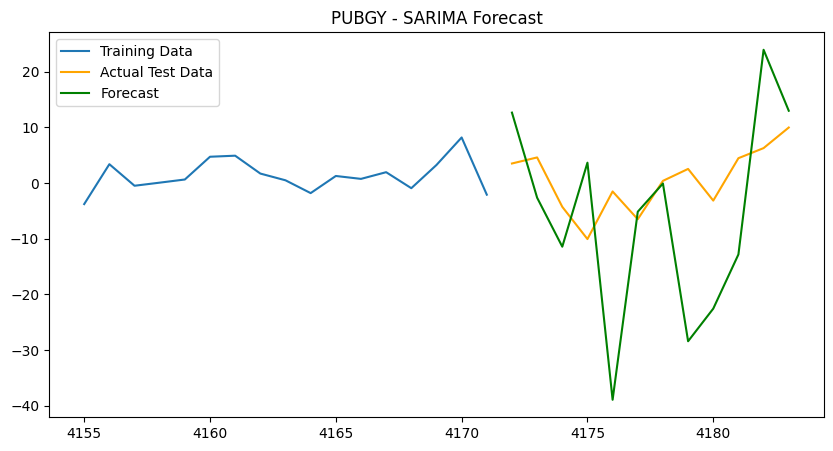

Processing ticker: PYPL


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

PYPL: R2 = -20.4427


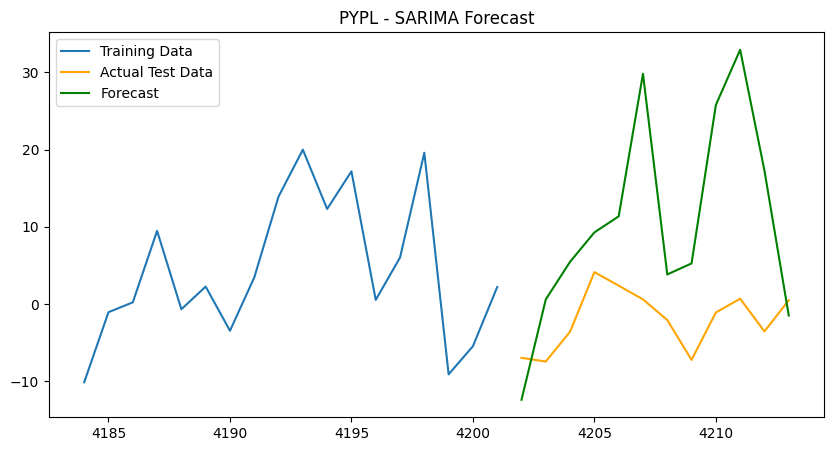

Processing ticker: QCOM


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

QCOM: R2 = -15.7490


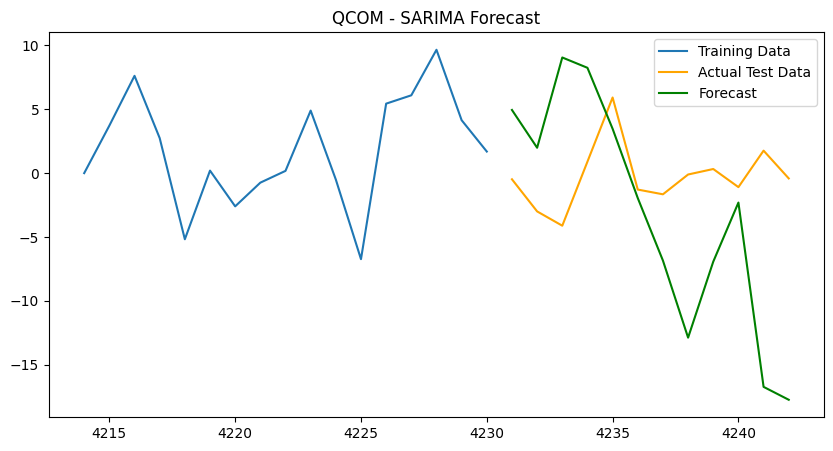

Processing ticker: RADCQ
RADCQ: R2 = -1.6456


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

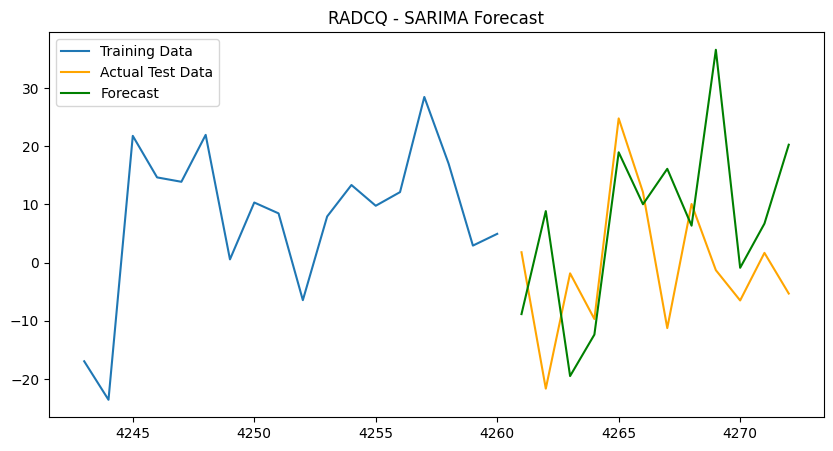

Processing ticker: RBC
RBC: R2 = -781931187.5621


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

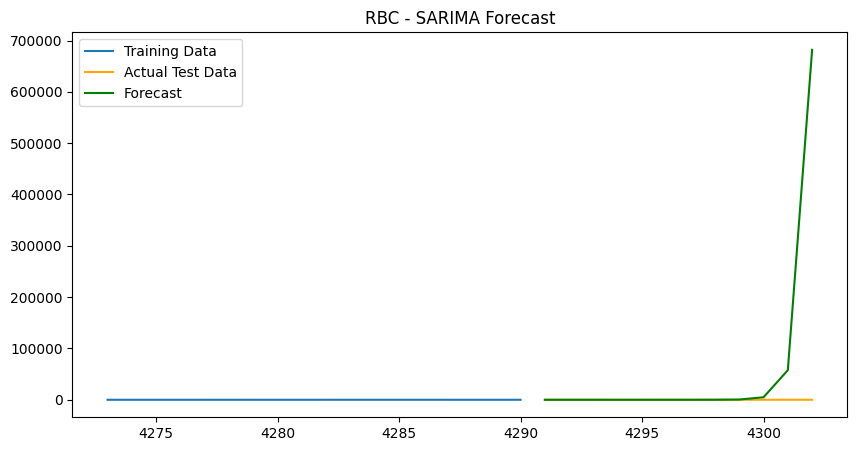

Processing ticker: RCI
RCI: R2 = -31.2631


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

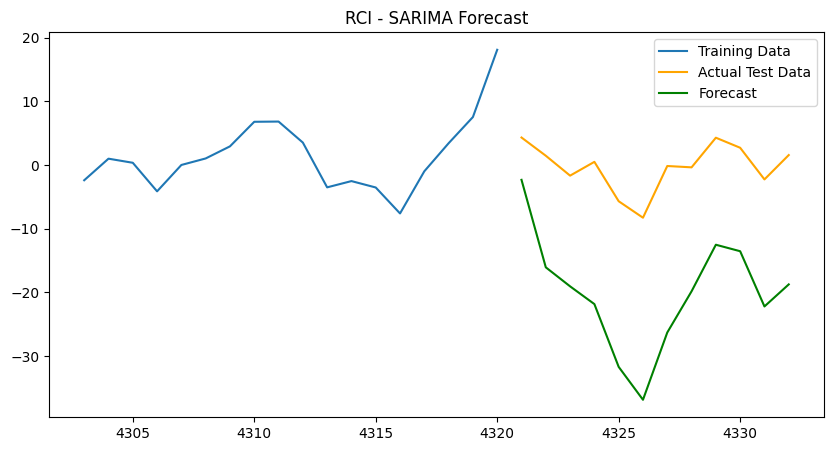

Processing ticker: RHI


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

RHI: R2 = -57.0503


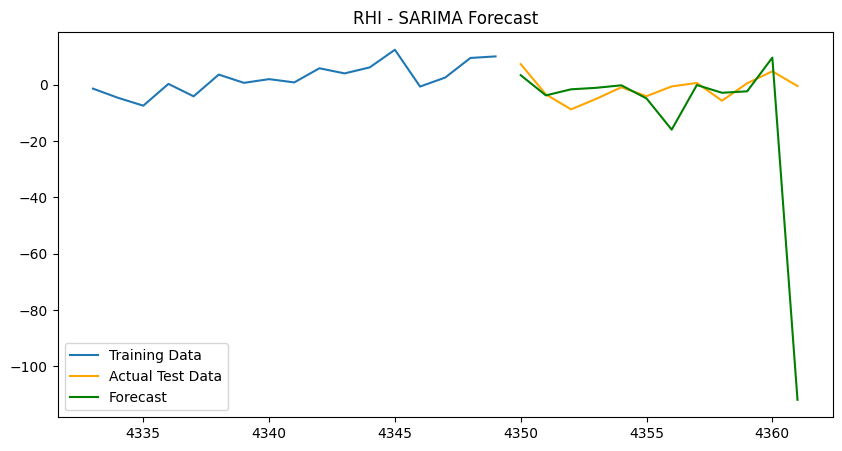

Processing ticker: RKT
RKT: R2 = -1.9935


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

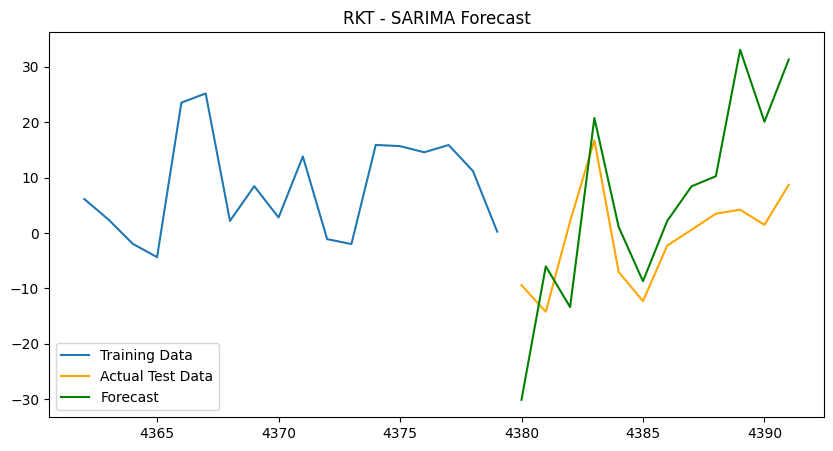

Processing ticker: ROST
ROST: R2 = -6.3706


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

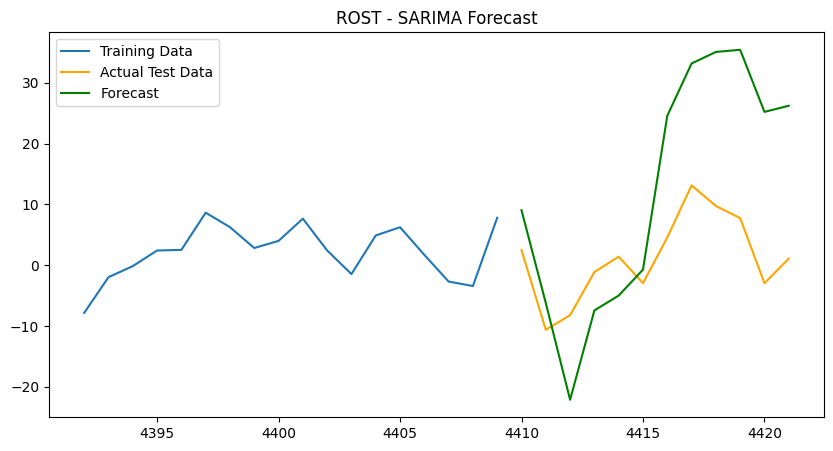

Processing ticker: RXT
RXT: R2 = -1.9062


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

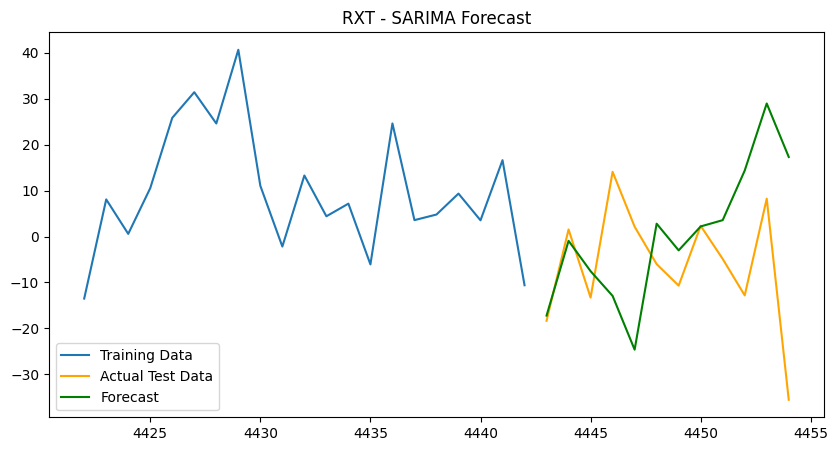

Processing ticker: SAGE


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

SAGE: R2 = -174.1449


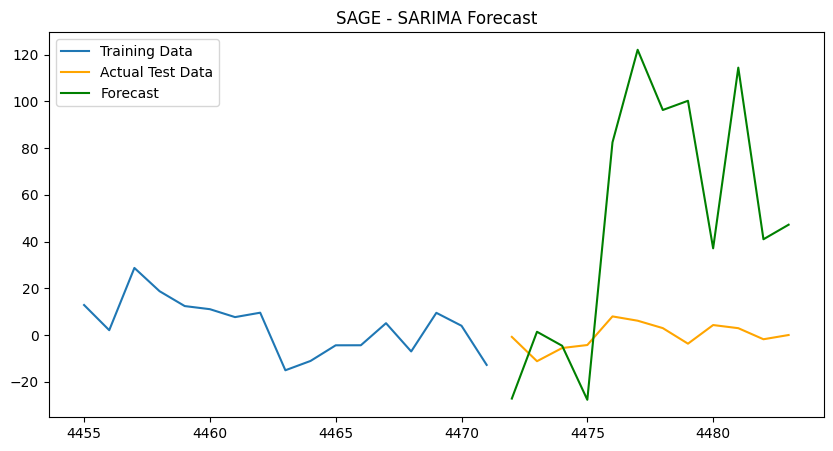

Processing ticker: SAP
SAP: R2 = -4.8325


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

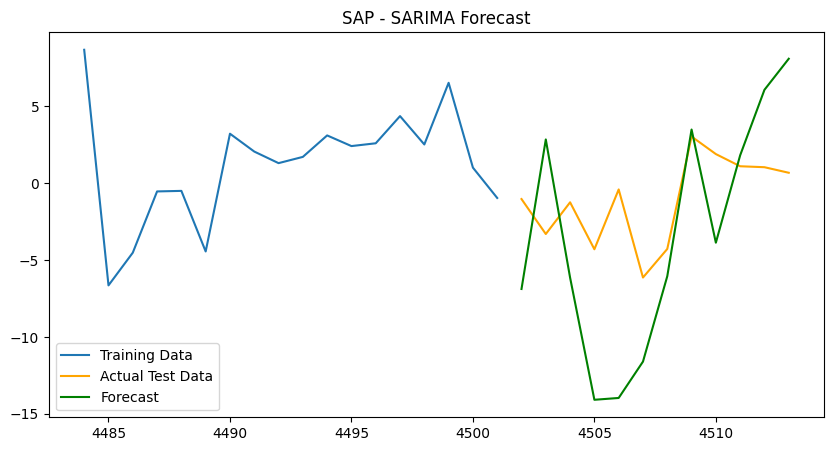

Processing ticker: SBUX
SBUX: R2 = -0.2632


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

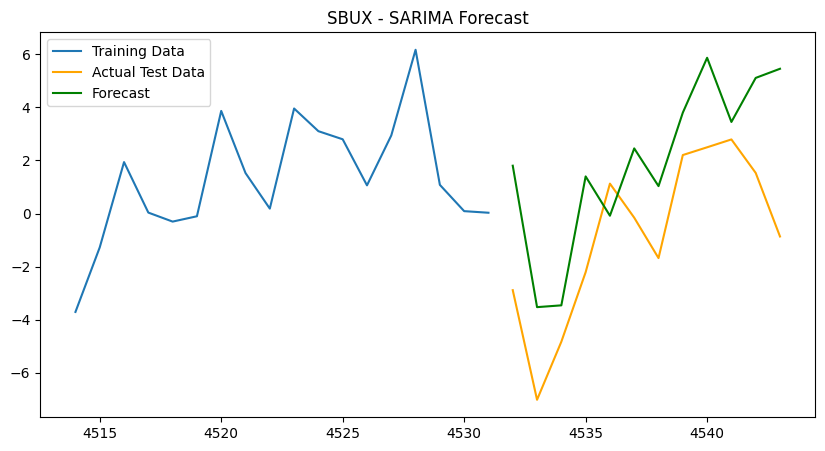

Processing ticker: SHEL
SHEL: R2 = -1.4098


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

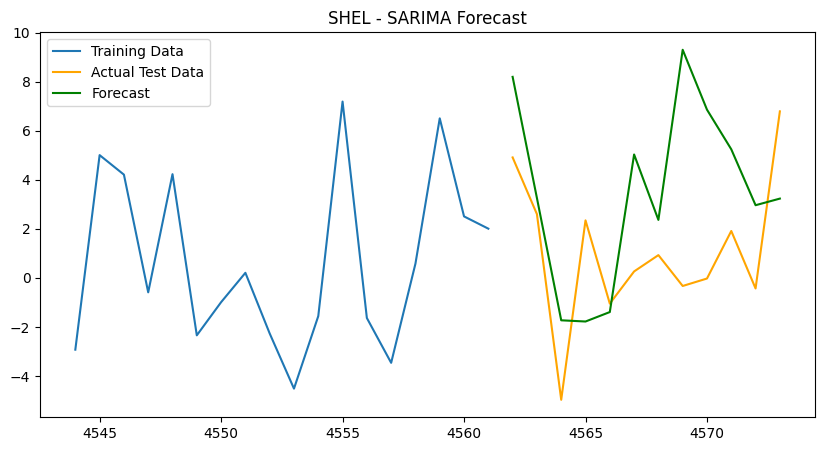

Processing ticker: SHW
SHW: R2 = -10.3313


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

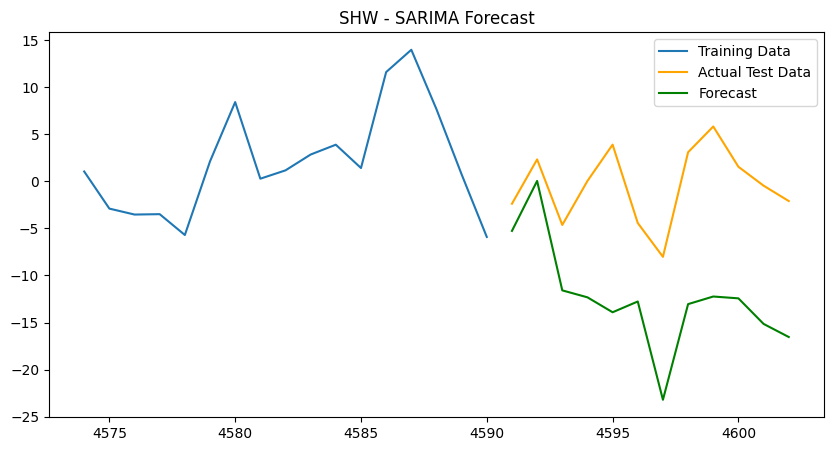

Processing ticker: SIEGY
SIEGY: R2 = -0.0088


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

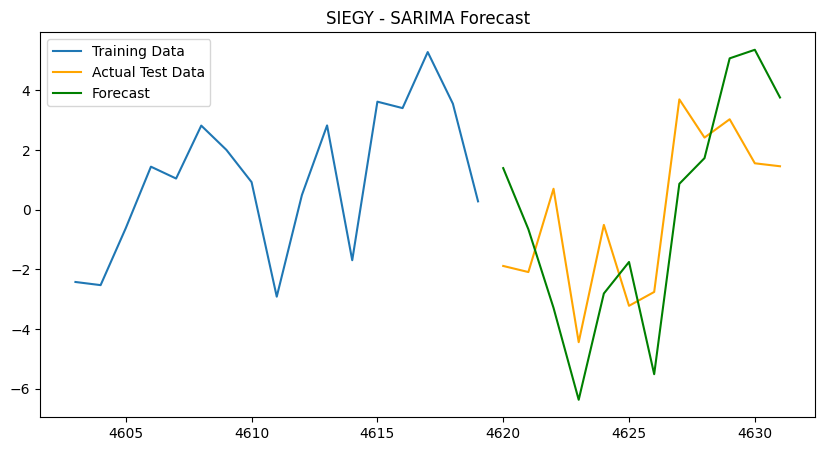

Processing ticker: SKYH
SKYH: R2 = -306.9911


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting paramete

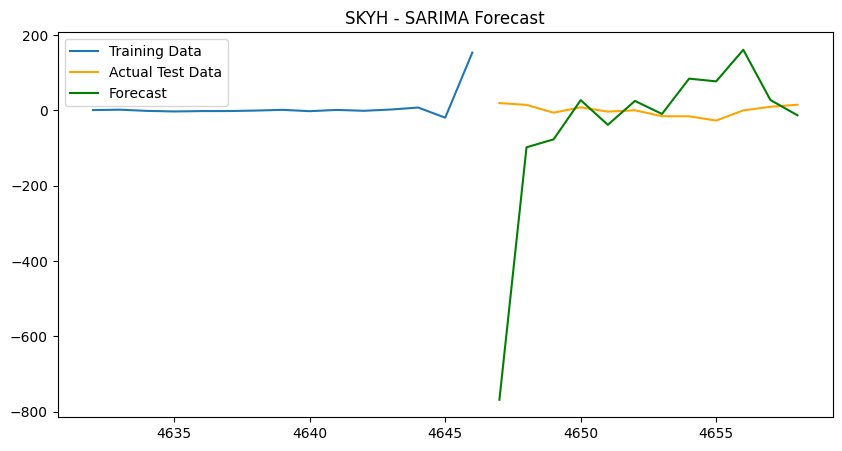

Processing ticker: SNX
SNX: R2 = -573.2814


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

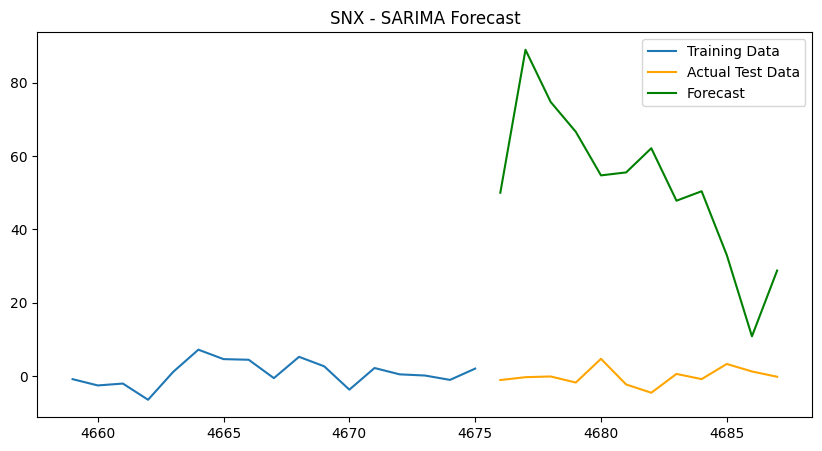

Processing ticker: SPB
SPB: R2 = -8.3422


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

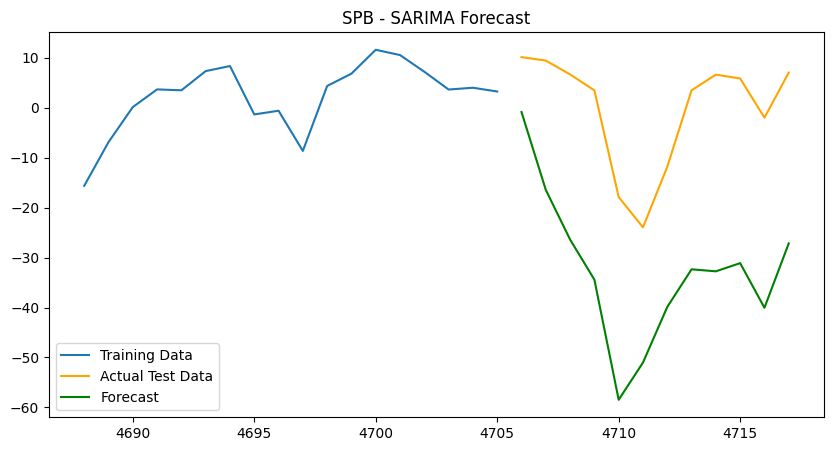

Processing ticker: SRSCQ
SRSCQ: R2 = -25610.0003


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

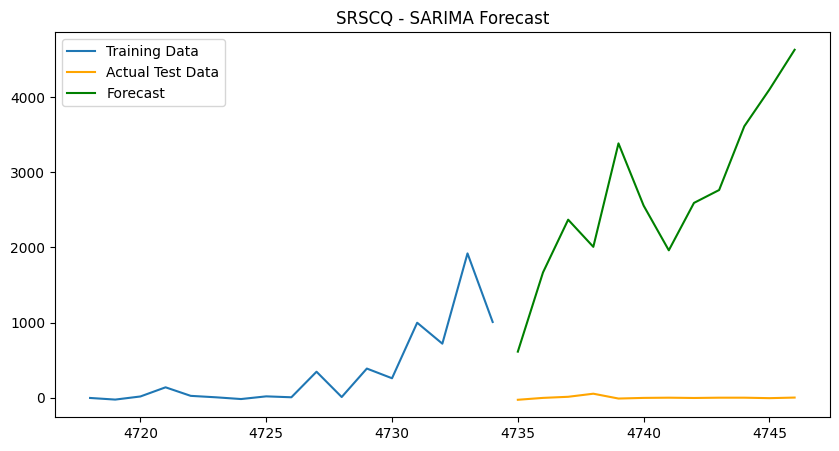

Processing ticker: STT
STT: R2 = -11.4868


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

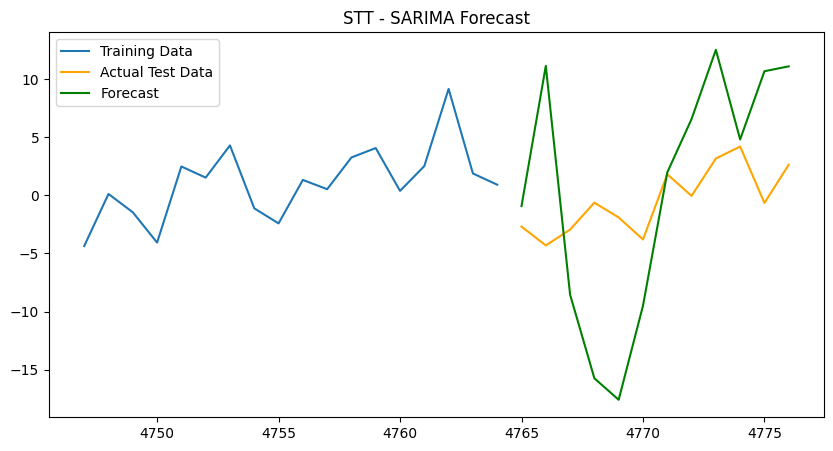

Processing ticker: SYK
SYK: R2 = -4.9601


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

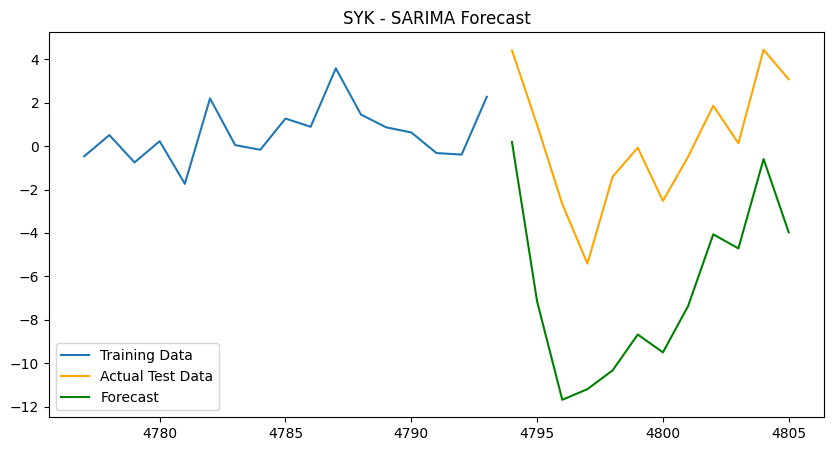

Processing ticker: SYY
SYY: R2 = -1412604787718408028291072.0000


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

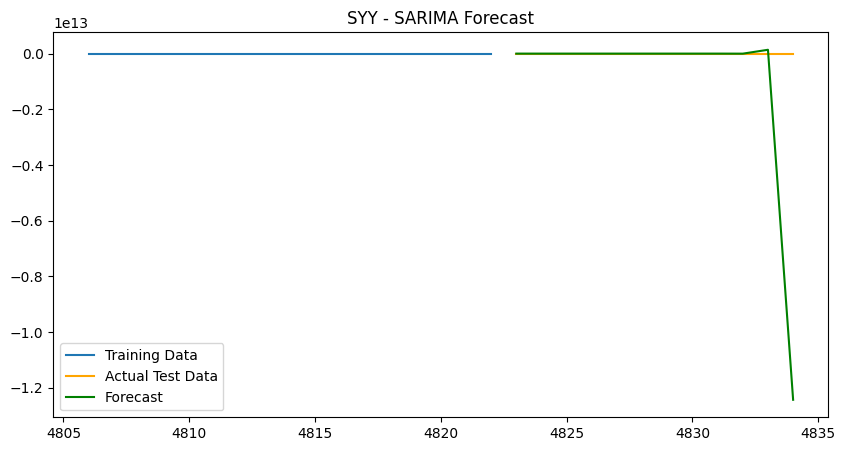

Processing ticker: TASK
TASK: R2 = -73.5459


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting paramete

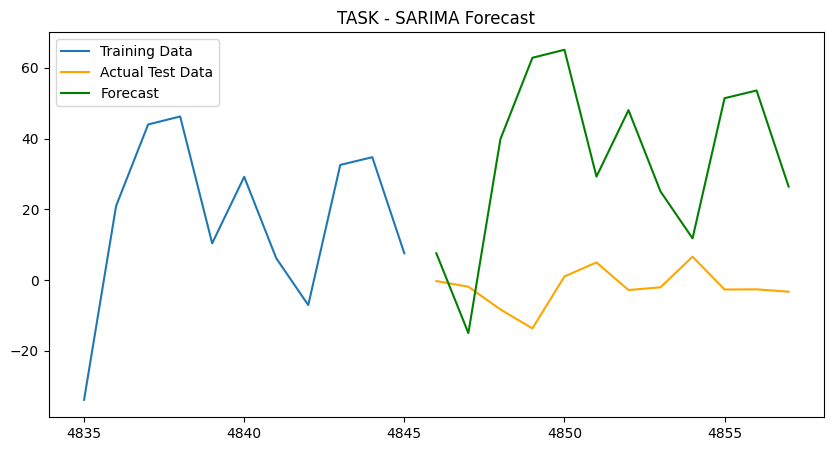

Processing ticker: TGT


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

TGT: R2 = -19.2435


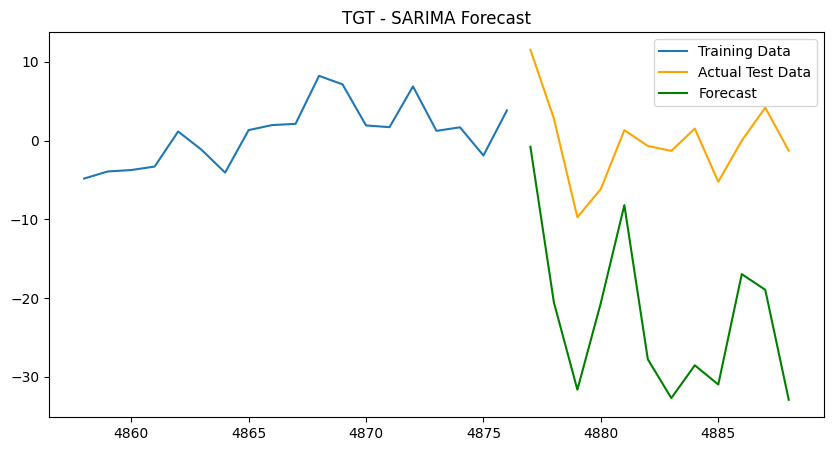

Processing ticker: TMO


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

TMO: R2 = -19.6299


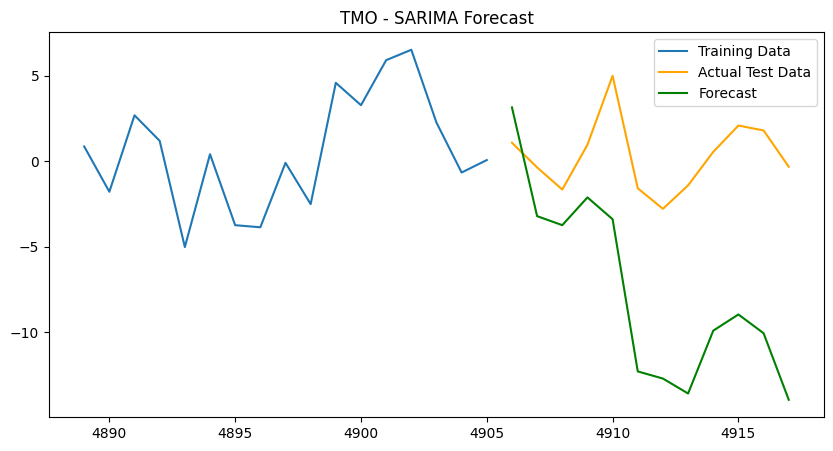

Processing ticker: TRI


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

TRI: R2 = -1355511983599735109117053763595026111462408842293888562651273545719379570804654080.0000


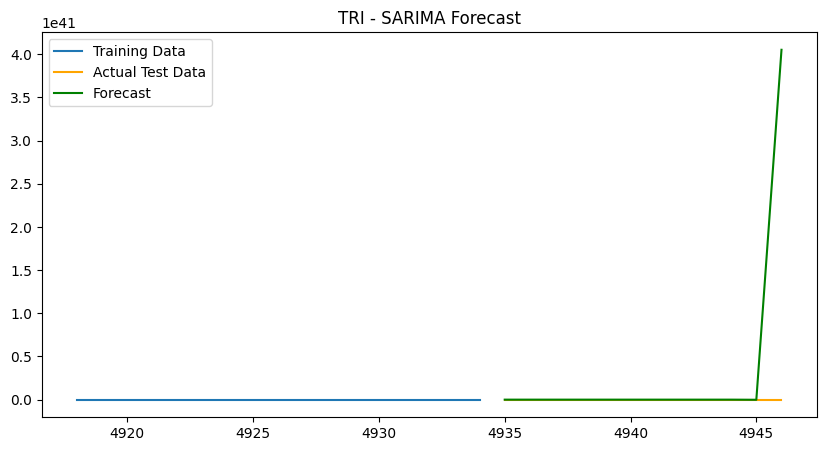

Processing ticker: TSCO
TSCO: R2 = -6.4229


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

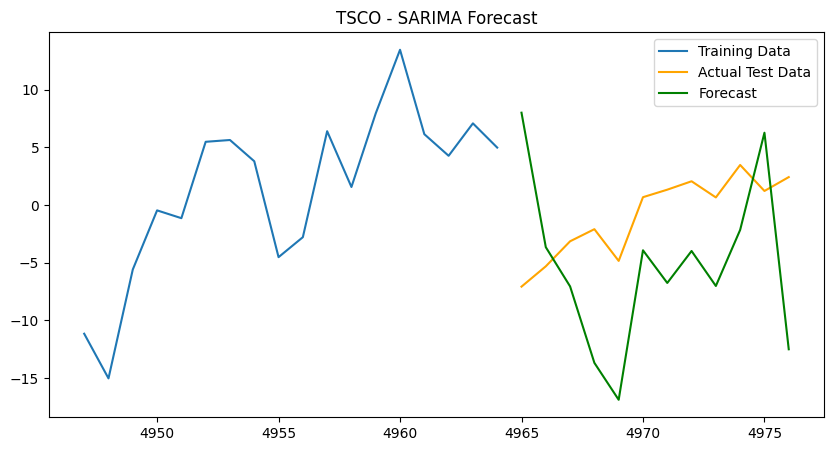

Processing ticker: TSLA


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

TSLA: R2 = -5.2451


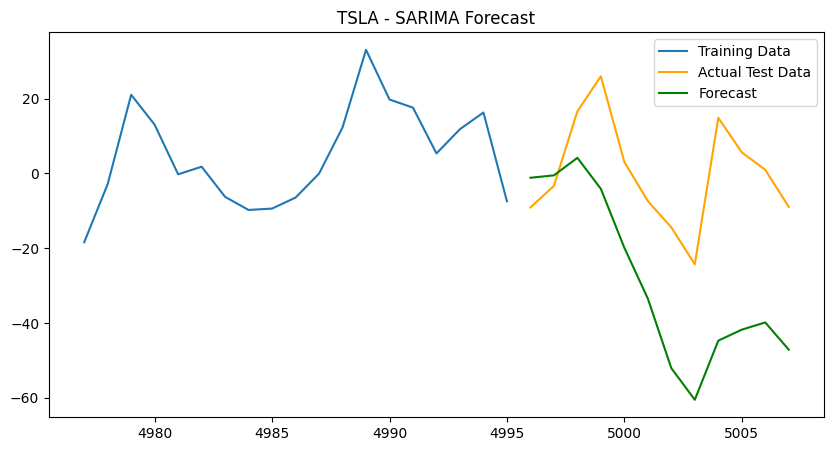

Processing ticker: TTEC
TTEC: R2 = 0.1562


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

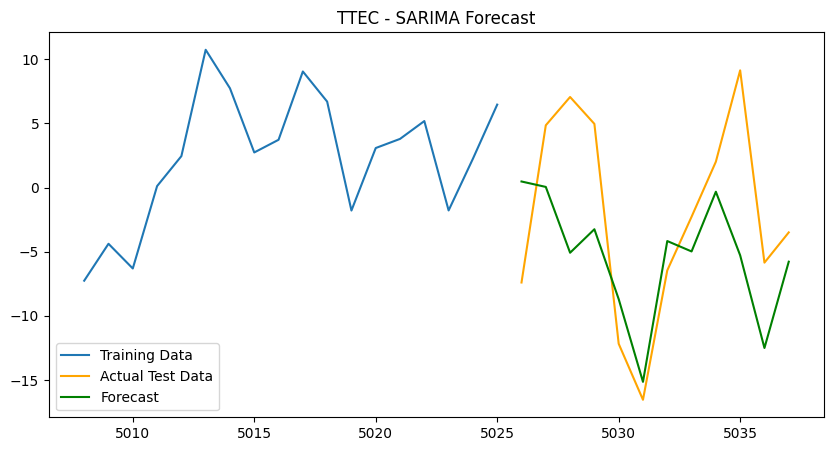

Processing ticker: TU
TU: R2 = -40.6366


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

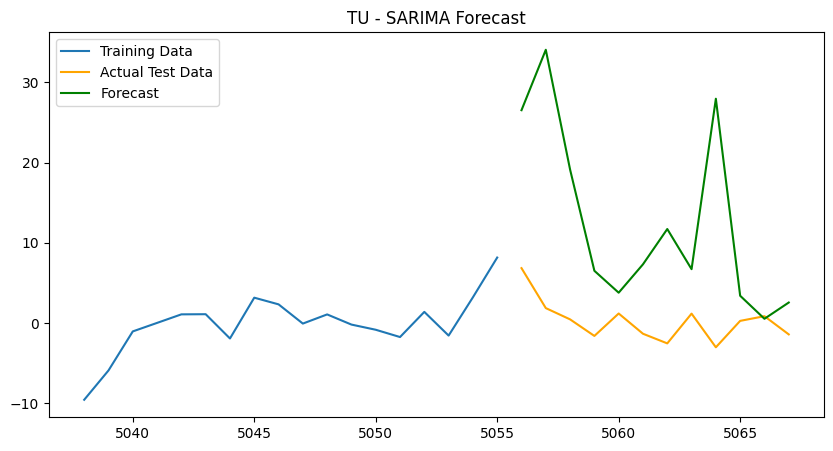

Processing ticker: TXN


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

TXN: R2 = -3.0237


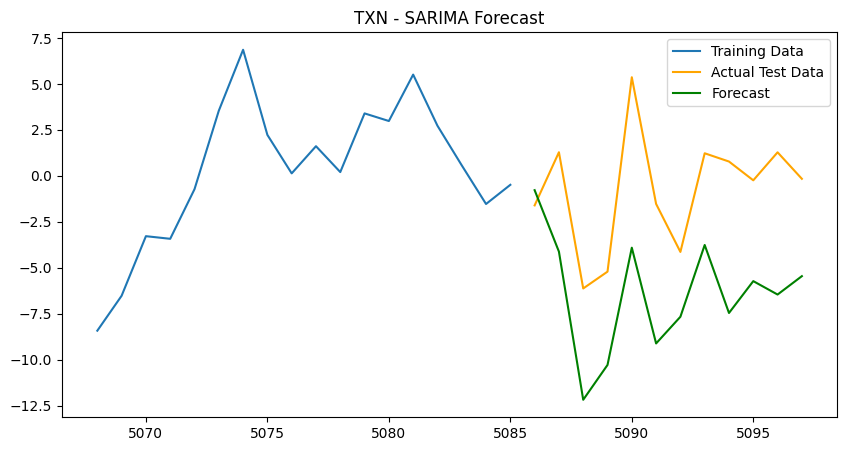

Processing ticker: TXRH


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

TXRH: R2 = -283014331561860848490186276864.0000


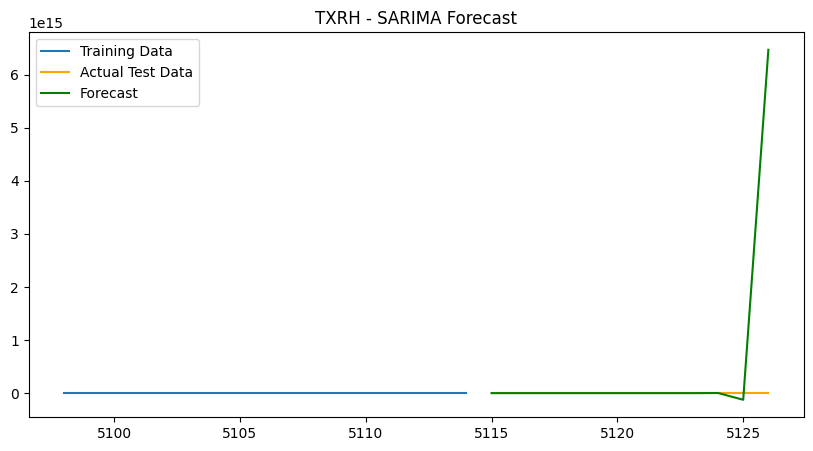

Processing ticker: UA
UA: R2 = -7.0260


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

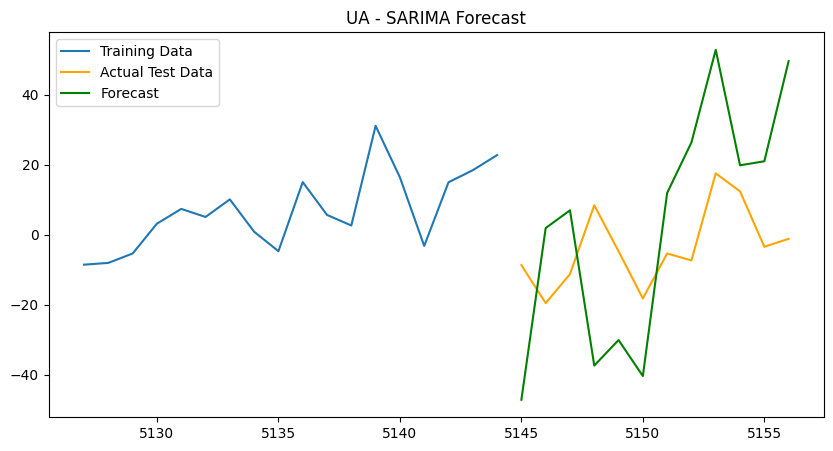

Processing ticker: UAL


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

UAL: R2 = -17.3188


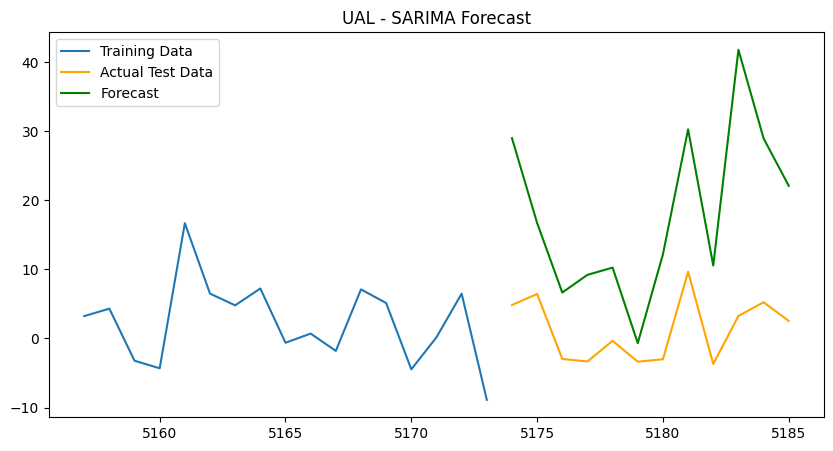

Processing ticker: UBER
UBER: R2 = -14.2906


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

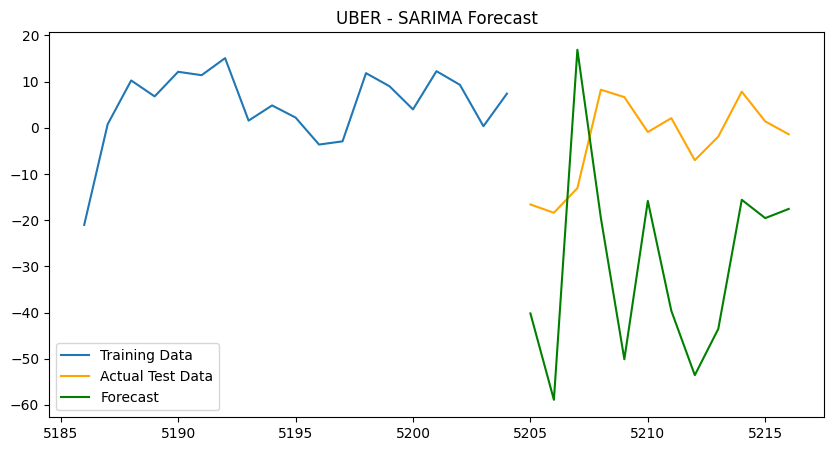

Processing ticker: UBS


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

UBS: R2 = -1.7227


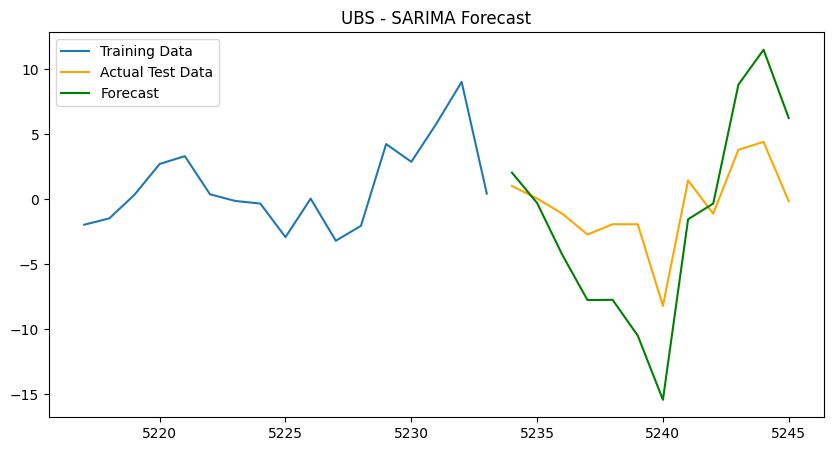

Processing ticker: UL


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

UL: R2 = -46.8546


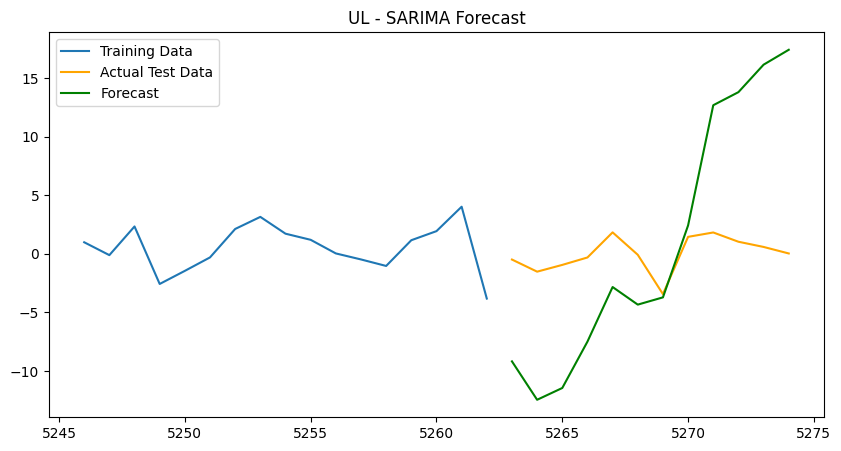

Processing ticker: ULTA


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

ULTA: R2 = -9013587574.0678


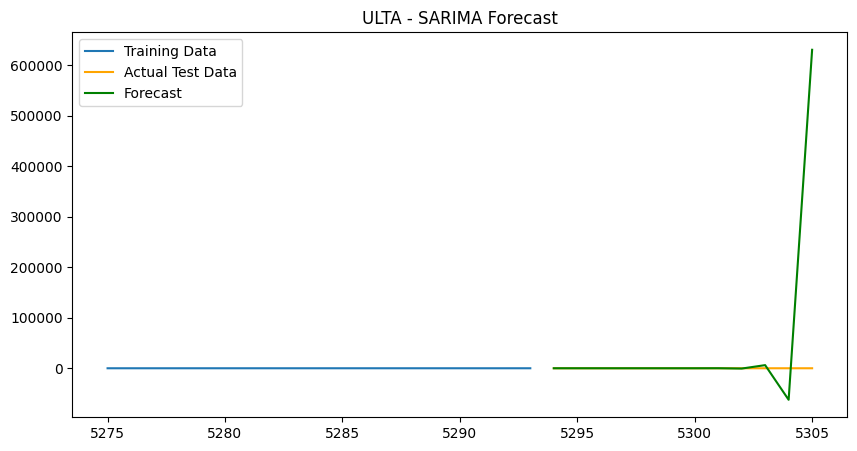

Processing ticker: URBN
URBN: R2 = -6.7907


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

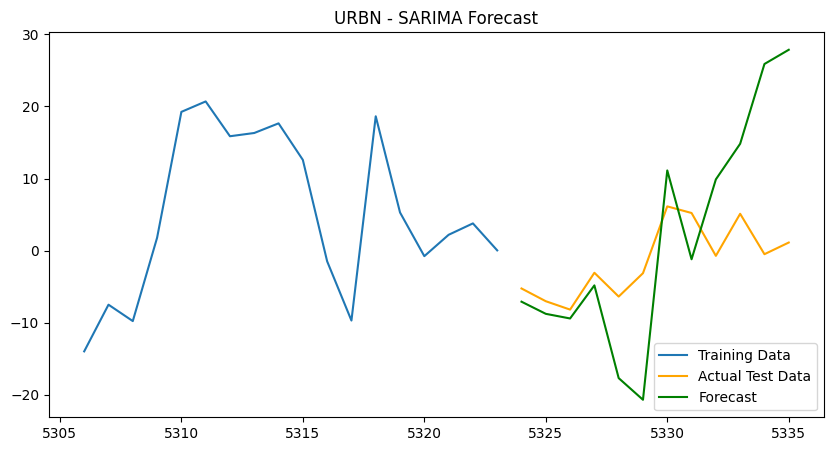

Processing ticker: VOD
VOD: R2 = -23.4557


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

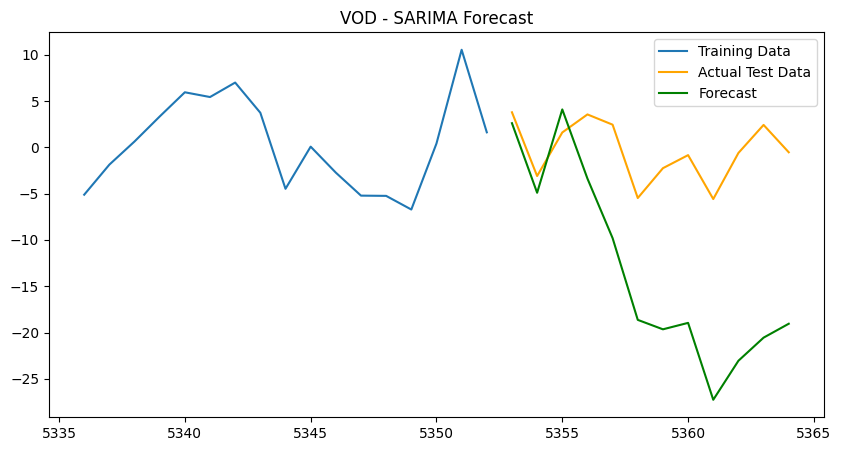

Processing ticker: VYX


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

VYX: R2 = -3.7811


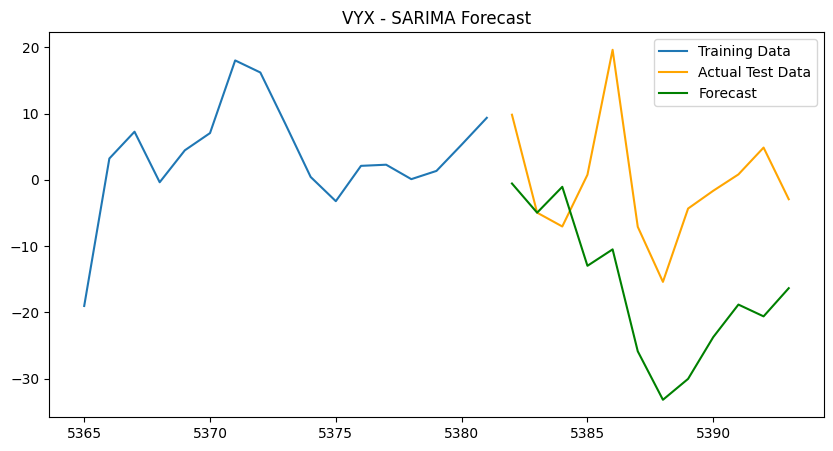

Processing ticker: VZ


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

VZ: R2 = -45063879482095140864.0000


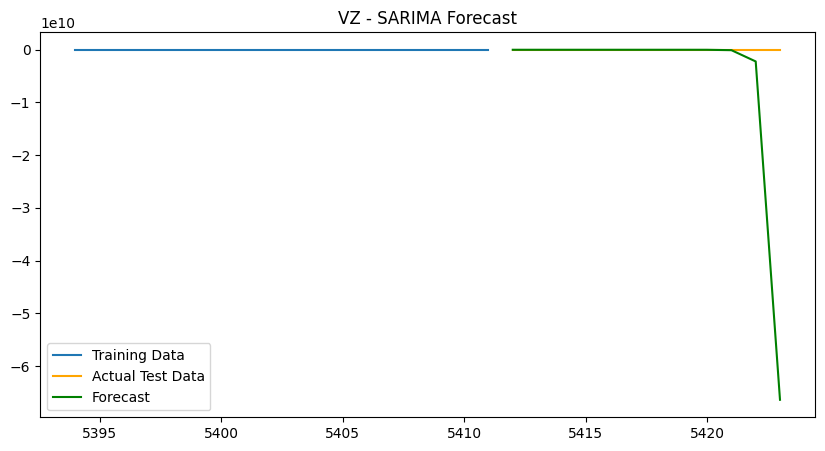

Processing ticker: W
W: R2 = -1.8301


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

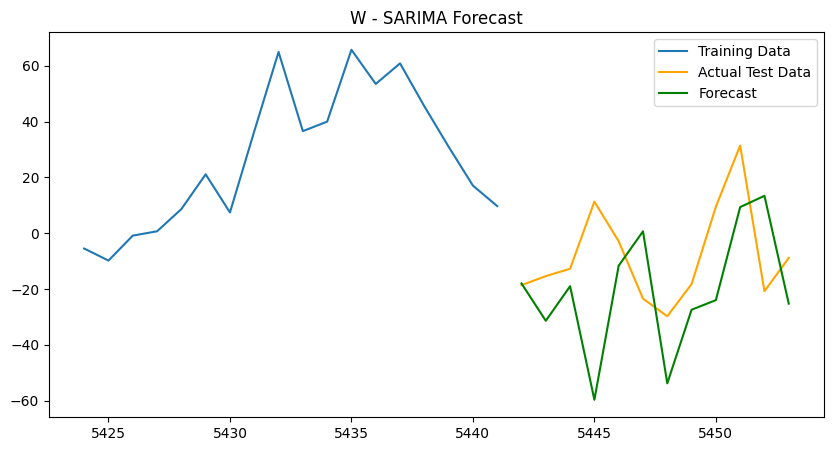

Processing ticker: WBA
WBA: R2 = -2.7284


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

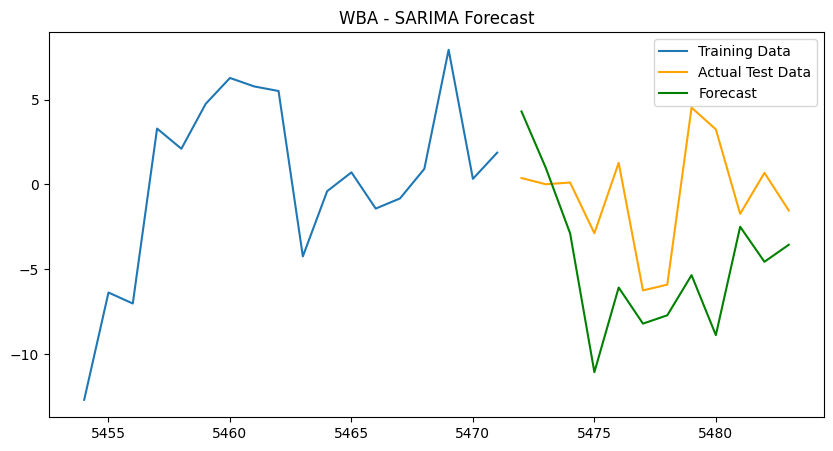

Processing ticker: WDC


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

WDC: R2 = -6.4059


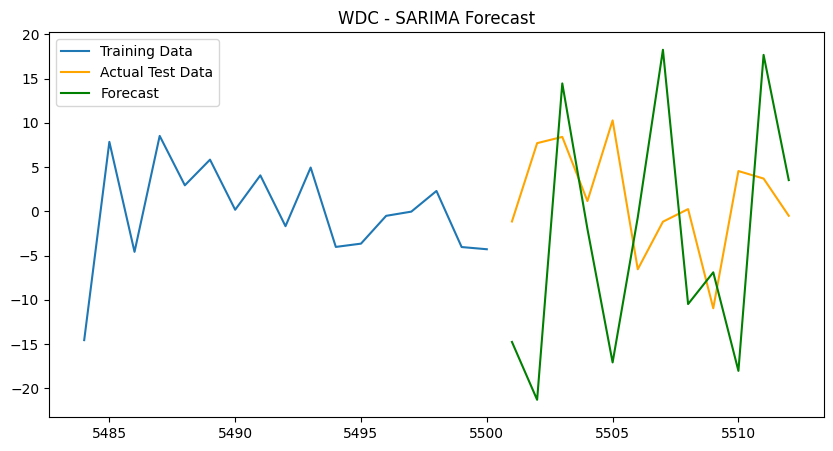

Processing ticker: WFC
WFC: R2 = -68.8636


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

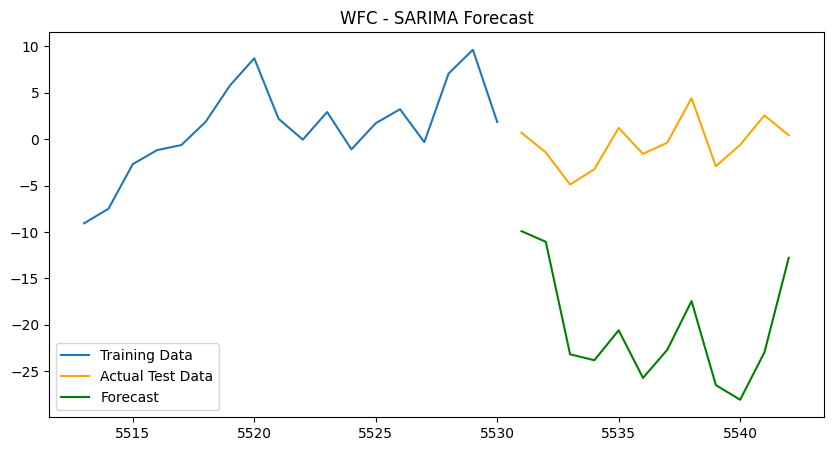

Processing ticker: WIT
WIT: R2 = -1666652222909789.0000


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

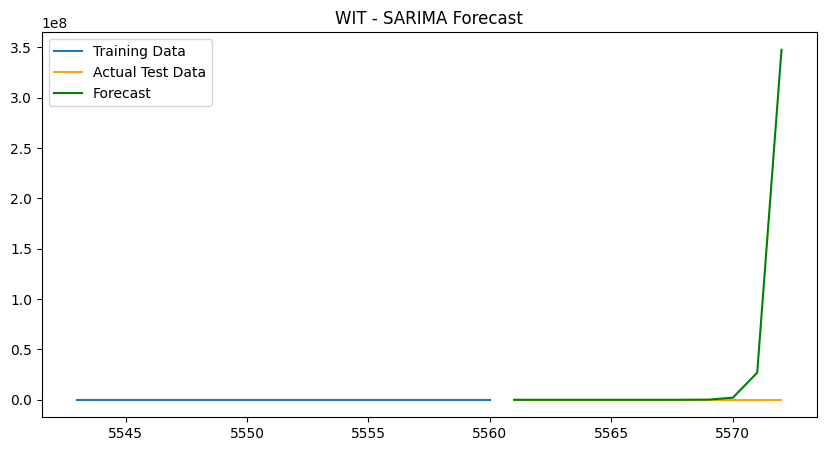

Processing ticker: WMT


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

WMT: R2 = 0.3362


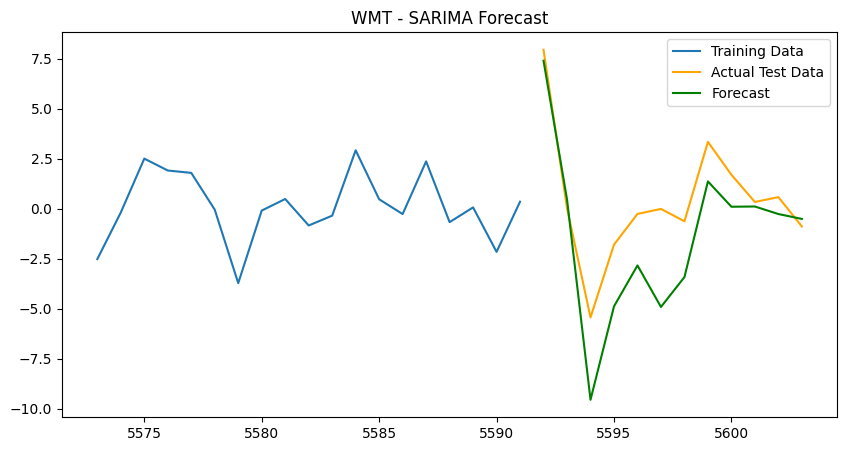

Processing ticker: WNS
WNS: R2 = -143.2184


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

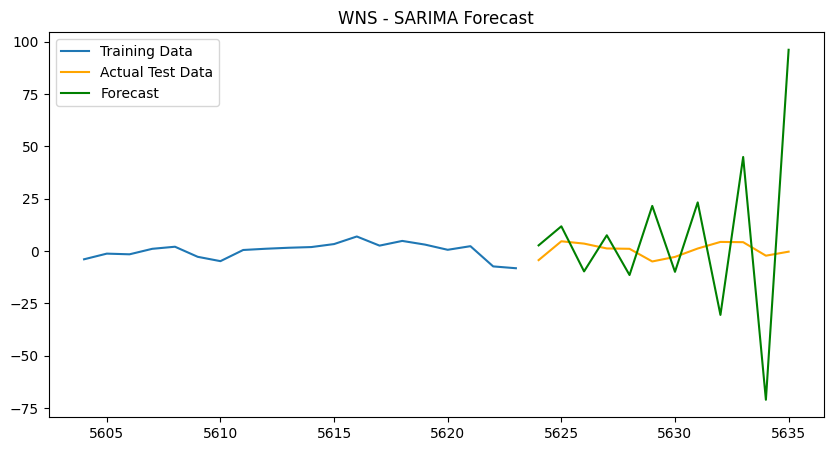

Processing ticker: WOOF
WOOF: R2 = -1.7616


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting paramete

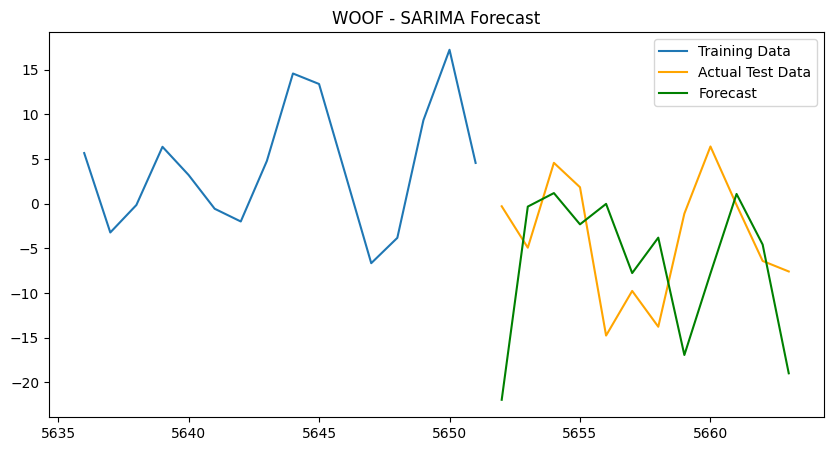

Processing ticker: XPO
XPO: R2 = -3.5395


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

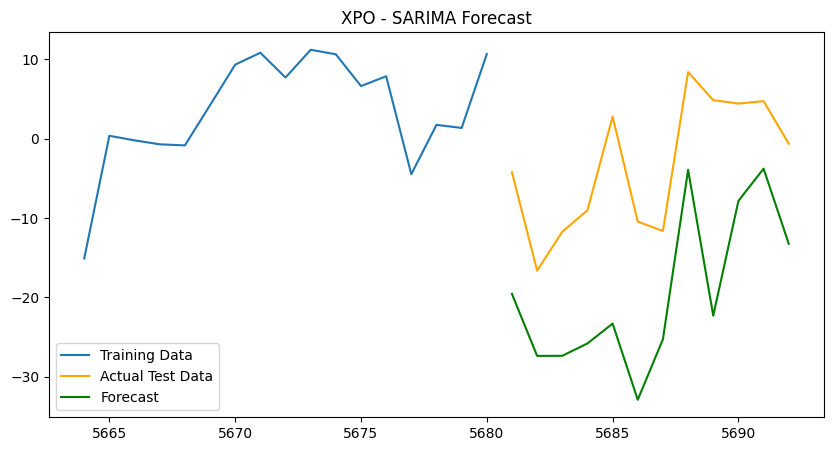

Processing ticker: XRX
XRX: R2 = -13.1187


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results wi

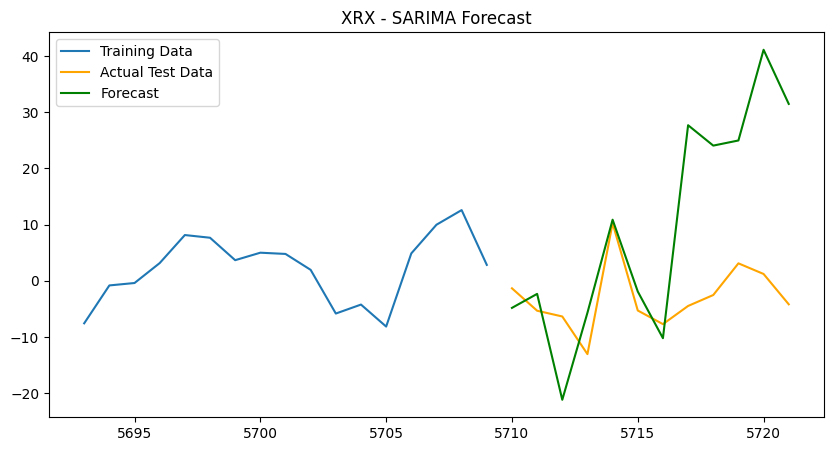

In [ ]:
r2_scores = {}

# Iterate through each unique ticker
tickers = df['ticker'].unique()
for ticker in tickers:
    print(f"Processing ticker: {ticker}")

    # Filter data for the current ticker
    ticker_data = df[df['ticker'] == ticker]

    # Ensure data is sorted by time
    ticker_data = ticker_data.sort_index()

    # Check stationarity of 'pct_change' and apply differencing if necessary
    ticker_data['pct_change_diff'] = ticker_data['pct_change'].diff().dropna()

    # Split into training and testing datasets
    train = ticker_data.iloc[:-12]  # Last 12 months for testing
    test = ticker_data.iloc[-12:]

    if train.empty or test.empty:
        print(f"Skipping {ticker} due to insufficient data.")
        continue

    # Define SARIMA parameters (these can be fine-tuned)
    p, d, q = 1, 1, 1
    P, D, Q, s = 1, 1, 1, 12  # Seasonal (s = 12 for monthly data)

    # Fit the SARIMA model
    model = SARIMAX(
        train['pct_change'],
        exog=train[['sentiment_sum_1', 'rating', 'Volume', 'oil_prices',
                    'pe_ratio', 'ExchangeRate', 'lag_pct_change']],  # Optional explanatory variables
        order=(p, d, q),
        seasonal_order=(P, D, Q, s),
        enforce_stationarity=False,
        enforce_invertibility=False
    )

    try:
        sarima_fit = model.fit(disp=False)
    except Exception as e:
        print(f"Failed to fit SARIMA for {ticker}: {e}")
        continue

    # Forecast
    forecast = sarima_fit.get_forecast(
        steps=len(test),
        exog=test[['sentiment_sum_1', 'rating', 'Volume', 'oil_prices',
                   'pe_ratio', 'ExchangeRate', 'lag_pct_change']]
    )
    forecast_values = forecast.predicted_mean

    # Compute R2 Score
    if len(test['pct_change']) == len(forecast_values):  # Ensure lengths match
        r2 = r2_score(test['pct_change'], forecast_values)
        r2_scores[ticker] = r2
        print(f"{ticker}: R2 = {r2:.4f}")
    else:
        print(f"Forecast length mismatch for {ticker}. Skipping R2 calculation.")

    # Optional: Plot the forecast
    plt.figure(figsize=(10, 5))
    plt.plot(train['pct_change'], label="Training Data")
    plt.plot(test['pct_change'], label="Actual Test Data", color='orange')
    plt.plot(test.index, forecast_values, label="Forecast", color='green')
    plt.title(f"{ticker} - SARIMA Forecast")
    plt.legend()
    plt.show()

# Save R2 scores to a CSV file
r2_df = pd.DataFrame(list(r2_scores.items()), columns=['Ticker', 'R2_Score'])

In [ ]:
df=pd.read_csv('y.csv')

In [ ]:
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import r2_score

# Create a list to store results for each ticker
all_results = []
final_df_list = []

# Define the dependent variable and independent variables
dependent_var = 'pct_change'
independent_vars = ['sentiment_sum_1', 'rating', 'Volume', 'oil_prices', 'pe_ratio', 'lag_pct_change', 'ExchangeRate']

# Group by ticker and apply the following steps for each group
for ticker, group in df.groupby('ticker'):
    print(f"Processing ticker: {ticker}")

    # Ensure 'date' is in datetime format
    group['date'] = pd.to_datetime(group['date'])

    # Set 'date' as the index
    group.set_index('date', inplace=True)

    # Resample the DataFrame to get monthly averages
    monthly_df = group.resample('M').agg({
        'pct_change': 'mean',
        'sentiment_sum_1': 'mean',
        'rating': 'mean',
        'Volume': 'mean',
        'oil_prices': 'mean',
        'pe_ratio': 'mean',
        'ExchangeRate': 'mean'
    }).reset_index()

    # Calculate lagged pct_change
    monthly_df['lag_pct_change'] = monthly_df['pct_change'].shift(1)

    # Convert relevant columns to numeric
    for col in independent_vars + [dependent_var]:
        monthly_df[col] = pd.to_numeric(monthly_df[col], errors='coerce')

    # Drop rows with NaN values in the relevant columns
    monthly_df.dropna(subset=independent_vars + [dependent_var], inplace=True)

    if monthly_df.empty:
        print(f"No data left after dropping NaN values for ticker: {ticker}")
        continue

    monthly_df['ticker'] = ticker
    final_df_list.append(monthly_df)

    # Define dependent and independent variables
    y = monthly_df[dependent_var]
    exog = monthly_df[independent_vars]

    if y.empty or exog.empty:
        print(f"Empty data for ticker: {ticker} (X.shape: {exog.shape}, y.shape: {y.shape})")
        continue

    # Fit SARIMA model
    p, d, q = 1, 1, 1
    P, D, Q, s = 1, 1, 1, 12  # Seasonal parameters for monthly data

    try:
        model = SARIMAX(y, exog=exog, order=(p, d, q), seasonal_order=(P, D, Q, s),
                        enforce_stationarity=False, enforce_invertibility=False)
        sarima_result = model.fit(disp=False)

        # Calculate R-squared
        predicted = sarima_result.predict(start=0, end=len(y) - 1, exog=exog)
        r_squared = r2_score(y, predicted)

        # Store results in a dictionary
        result = {
            'ticker': ticker,
            'r_squared': r_squared,
            'log_likelihood': sarima_result.llf,
            'aic': sarima_result.aic,
            'bic': sarima_result.bic,
            'hqic': sarima_result.hqic,
        }

        # Collect coefficients and their statistics
        for var in sarima_result.params.index:
            result[f'{var}_coef'] = sarima_result.params[var]
            result[f'{var}_std_err'] = sarima_result.bse[var]
            result[f'{var}_z_value'] = sarima_result.tvalues[var]

        all_results.append(result)

    except Exception as e:
        print(f"Error fitting SARIMA for ticker: {ticker} - {e}")
        continue

# Convert results to a DataFrame
results_df_ticker = pd.DataFrame(all_results)

# Save results to a CSV
results_df_ticker.to_csv("sarima_results_ticker.csv", index=False)

# Display results in a formatted way
for index, res in results_df_ticker.iterrows():
    print(f"Ticker: {res['ticker']}")
    print(f"R-squared: {res['r_squared']}")
    print(f"Log Likelihood: {res['log_likelihood']}")
    print(f"AIC: {res['aic']}, BIC: {res['bic']}, HQIC: {res['hqic']}")

    # Display coefficients and stats
    for var in independent_vars:
        if f'{var}_coef' in res:
            print(f"{var}_coef: {res[f'{var}_coef']}, {var}_std_err: {res[f'{var}_std_err']}, {var}_z_value: {res[f'{var}_z_value']}")

    print("\n" + "="*80 + "\n")


Processing ticker: AAL


<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to esti

Processing ticker: AAPL


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: ABBNY


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: ABT


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: ACI


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: ACM


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Chec

Processing ticker: ACN


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: ADBE


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: ADSK
Processing ticker: AEO


<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to esti

Processing ticker: ALIZY
Processing ticker: ALL


<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to esti

Processing ticker: AMAT


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


Processing ticker: AMC


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Processing ticker: AMZN


<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to esti

Processing ticker: AON
Processing ticker: AXAHY


<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to esti

Processing ticker: AXP


<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to esti

Processing ticker: AZN


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: AZO
Processing ticker: BA


<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to esti

Processing ticker: BAH
Processing ticker: BAX


<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to esti

Processing ticker: BAYRY


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: BBY


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: BCS


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: BKD


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: BLK
Processing ticker: BML-PG


<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to esti

Processing ticker: BMY


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: BSX


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: BTBD
Processing ticker: BURL


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: CAH


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: CAT


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: CBRE
Processing ticker: CBRL


<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to esti

Processing ticker: CMCSA


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: CMG


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: CMI


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: CNC


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: CNDT


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: CNXC


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: COF


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: COST
Processing ticker: CRM


<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to esti

Processing ticker: CSCO


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: CTAS


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: CTRN


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


Processing ticker: CTSH


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist

Processing ticker: CVS


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: CVX


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: DAL


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: DB


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: DELL


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-10-52a9eb457f62>:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/

Processing ticker: DG
Ticker: AAL
R-squared: -13.117798751180537
Log Likelihood: -4.5770786779659085
AIC: 33.154157355931815, BIC: 17.47192352265116, HQIC: 0.3578472619718731
sentiment_sum_1_coef: -2.7908693124469526, sentiment_sum_1_std_err: 0.0030041767020325856, sentiment_sum_1_z_value: -928.9963904449055
rating_coef: 4.202372353232045, rating_std_err: 0.04437685507831904, rating_z_value: 94.69739002043828
Volume_coef: 1.1120595134362712e-07, Volume_std_err: 2.1473066494728093e-07, Volume_z_value: 0.5178857494383934
oil_prices_coef: 10.986674898550294, oil_prices_std_err: 0.0027902869699295623, oil_prices_z_value: 3937.471312790326
pe_ratio_coef: -0.8271201479795263, pe_ratio_std_err: 0.19941990197250312, pe_ratio_z_value: -4.147630902424038
lag_pct_change_coef: -0.2770662165215351, lag_pct_change_std_err: 0.25620544103075993, lag_pct_change_z_value: -1.0814220627276634
ExchangeRate_coef: 0.0, ExchangeRate_std_err: 1.5229413507206123e-17, ExchangeRate_z_value: 0.0


Ticker: AAPL
R-s

In [ ]:
results_df_ticker

,ticker,r_squared,log_likelihood,aic,bic,hqic,sentiment_sum_1_coef,sentiment_sum_1_std_err,sentiment_sum_1_z_value,rating_coef,...,ma.L1_z_value,ar.S.L12_coef,ar.S.L12_std_err,ar.S.L12_z_value,ma.S.L12_coef,ma.S.L12_std_err,ma.S.L12_z_value,sigma2_coef,sigma2_std_err,sigma2_z_value
0,AAL,-13.117799,-4.577079,33.154157,17.471924,0.357847,-2.790869,3.004177e-03,-9.289964e+02,4.202372,...,2.876747e-01,0.000000e+00,2.821542e-01,0.000000e+00,0.000000e+00,0.282236,0.000000e+00,7.920428e+00,0.008234,9.619015e+02
1,AAPL,-12.343678,-8.296593,40.593185,29.776533,18.850333,11.583673,1.965709e-03,5.892874e+03,0.973839,...,-1.581732e+01,6.000286e-16,1.262997e-01,4.750833e-15,-7.145274e-17,0.039041,-1.830206e-15,2.889371e+00,0.007085,4.078376e+02
2,ABBNY,-71.665417,-6.590596,37.181192,21.498958,4.384882,18.203253,3.697123e-02,4.923627e+02,-5.402898,...,-2.724617e+00,0.000000e+00,7.489592e-01,0.000000e+00,0.000000e+00,0.731602,0.000000e+00,2.616862e+00,1.331444,1.965432e+00
3,ABT,-25.017471,-4.028057,32.056114,21.239461,10.313262,1.155759,2.013536e-02,5.739948e+01,-1.586283,...,-3.066931e-01,0.000000e+00,2.642519e-01,0.000000e+00,0.000000e+00,0.251365,0.000000e+00,1.760500e+00,0.504904,3.486799e+00
4,ACI,-0.232322,-9.007317,42.014633,31.197981,20.271781,-31.260370,4.822919e-03,-6.481628e+03,-4.951938,...,-1.132724e+00,-8.458980e-13,1.645492e-01,-5.140699e-12,-1.122705e-12,0.188232,-5.964477e-12,2.558026e+01,0.014005,1.826536e+03
5,ACM,-12.543945,-5.733863,35.467726,24.651074,13.724874,-14.807983,1.683215e-02,-8.797438e+02,0.538320,...,2.588129e+00,-7.152867e-13,6.699004e-01,-1.067751e-12,-7.678491e-13,0.279288,-2.749306e-12,3.608461e+00,0.066867,5.396493e+01
6,ACN,-1.244089,-2.904582,29.809164,18.992511,8.066312,-80.871035,3.251431e-03,-2.487245e+04,5.169684,...,-5.669163e+00,0.000000e+00,1.661130e-01,0.000000e+00,0.000000e+00,0.135958,0.000000e+00,9.345792e-01,0.112124,8.335198e+00
7,ADBE,0.499649,-5.527002,35.054005,19.371771,2.257695,-3.937614,7.232904e-03,-5.444029e+02,-2.797623,...,1.104206e+00,0.000000e+00,2.056758e-01,0.000000e+00,0.000000e+00,0.206555,0.000000e+00,2.028251e+01,0.002891,7.016101e+03
8,ADSK,-5.742101,-8.928627,41.857253,31.040601,20.114401,16.494100,3.681587e-04,4.480160e+04,-8.897467,...,-1.220894e+01,-6.533096e-04,1.892837e-01,-3.451483e-03,-6.345046e-04,0.110500,-5.742105e-03,3.755372e+01,0.006461,5.812510e+03
9,AEO,-6.767443,-9.041780,42.083560,31.266908,20.340708,24.775179,2.398735e-01,1.032844e+02,-0.346147,...,3.365587e-03,-8.522828e-11,5.910550e+00,-1.441969e-11,-8.523444e-11,5.908071,-1.442678e-11,1.422868e+01,3.261012,4.363272e+00


In [ ]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import r2_score

# Create a list to store results for each ticker
all_results = []
final_df_list = []

# Define the dependent variable
dependent_var = 'pct_change'

# Group by ticker and apply the following steps for each group
for ticker, group in df.groupby('ticker'):
    print(f"Processing ticker: {ticker}")

    # Ensure 'date' is in datetime format
    group['date'] = pd.to_datetime(group['date'])

    # Set 'date' as the index
    group.set_index('date', inplace=True)

    # Resample the DataFrame to get monthly averages
    monthly_df = group.resample('M').agg({
        'pct_change': 'mean',
        'sentiment_sum_1': 'mean',
        'rating': 'mean',
        'Volume': 'mean',
        'oil_prices': 'mean',
        'pe_ratio': 'mean',
        'ExchangeRate': 'mean'
    }).reset_index()

    # Convert relevant columns to numeric
    monthly_df[dependent_var] = pd.to_numeric(monthly_df[dependent_var], errors='coerce')

    # Drop rows with NaN values in the dependent variable
    monthly_df.dropna(subset=[dependent_var], inplace=True)

    if monthly_df.empty:
        print(f"No data left after dropping NaN values for ticker: {ticker}")
        continue

    monthly_df['ticker'] = ticker
    final_df_list.append(monthly_df)

    # Define the dependent variable
    y = monthly_df[dependent_var]

    if y.empty:
        print(f"Empty data for ticker: {ticker} (y.shape: {y.shape})")
        continue

    # Fit ARIMA model
    p, d, q = 0, 0, 1  # Example ARIMA parameters
    try:
        model = ARIMA(y, order=(p, d, q))
        arima_result = model.fit()

        # Calculate R-squared
        predicted = arima_result.predict(start=1, end=len(y) - 1)
        actual = y[1:]  # Drop the first observation due to differencing
        r_squared = r2_score(actual, predicted)

        # Store results in a dictionary
        result = {
            'ticker': ticker,
            'r_squared': r_squared,
            'log_likelihood': arima_result.llf,
            'aic': arima_result.aic,
            'bic': arima_result.bic,
            'hqic': arima_result.hqic,
        }

        # Collect coefficients and their statistics
        for var in arima_result.params.index:
            result[f'{var}_coef'] = arima_result.params[var]
            result[f'{var}_std_err'] = arima_result.bse[var]
            result[f'{var}_z_value'] = arima_result.tvalues[var]

        all_results.append(result)

    except Exception as e:
        print(f"Error fitting ARIMA for ticker: {ticker} - {e}")
        continue

# Convert results to a DataFrame
results_df_ticker = pd.DataFrame(all_results)

# Save results to a CSV
results_df_ticker.to_csv("arima_results_ticker.csv", index=False)

# Display results in a formatted way



Processing ticker: AAL
Processing ticker: AAPL
Processing ticker: ABBNY
Processing ticker: ABT


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_

Processing ticker: ACI
Processing ticker: ACM
Processing ticker: ACN
Processing ticker: ADBE


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: ADSK
Processing ticker: AEO
Processing ticker: ALIZY
Processing ticker: ALL


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: AMAT
Processing ticker: AMC
Processing ticker: AMZN
Processing ticker: AON


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: AXAHY
Processing ticker: AXP
Processing ticker: AZN
Processing ticker: AZO


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: BA
Processing ticker: BAH
Processing ticker: BAX
Processing ticker: BAYRY
Processing ticker: BBY


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was pr

Processing ticker: BCS
Processing ticker: BKD
Processing ticker: BLK
Processing ticker: BML-PG
Processing ticker: BMY
Processing ticker: BSX
Processing ticker: BTBD


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: BURL
Processing ticker: CAH
Processing ticker: CAT
Processing ticker: CBRE


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: CBRL
Processing ticker: CMCSA
Processing ticker: CMG
Processing ticker: CMI
Processing ticker: CNC


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: CNDT
Processing ticker: CNXC
Processing ticker: COF
Processing ticker: COST
Processing ticker: CRM
Processing ticker: CSCO
Processing ticker: CTAS
Processing ticker: CTRN


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: CTSH
Processing ticker: CVS
Processing ticker: CVX
Processing ticker: DAL


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: DB
Processing ticker: DELL
Processing ticker: DG


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: DGX
Processing ticker: DHY
Processing ticker: DLTR


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: DOCU


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: DOX
Processing ticker: DVA
Processing ticker: DXC
Processing ticker: EBAY


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: ECL
Processing ticker: EFSC
Processing ticker: ELV
Processing ticker: EMR


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: EPAM
Processing ticker: ETN
Processing ticker: EXPE
Processing ticker: FAST


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: FDS
Processing ticker: FDX
Processing ticker: FI
Processing ticker: FL


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: G
Processing ticker: GEHC
Processing ticker: GIB


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: GLOB
Processing ticker: GME
Processing ticker: GPS
Processing ticker: GRAB


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: GS
Processing ticker: GSK
Processing ticker: H
Processing ticker: HAL


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: HCA
Processing ticker: HLT
Processing ticker: HMC
Processing ticker: HON


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: HSBC
Processing ticker: HTZ
Processing ticker: HUBS
Processing ticker: HUM


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_

Processing ticker: IBN
Processing ticker: ICLR
Processing ticker: IFNNY


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: INFY
Processing ticker: IQV
Processing ticker: IT
Processing ticker: J


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: JCI
Processing ticker: JWN
Processing ticker: KELYB
Processing ticker: KMX


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: KR
Processing ticker: LDOS
Processing ticker: LEO
Processing ticker: LHX


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: LMT
Processing ticker: LTH
Processing ticker: LULU


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: LUMN
Processing ticker: LUV


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: LYG
Processing ticker: MA
Processing ticker: MAN
Processing ticker: MAR


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: MARX
Error fitting ARIMA for ticker: MARX - all the input arrays must have same number of dimensions, but the array at index 0 has 1 dimension(s) and the array at index 1 has 2 dimension(s)
Processing ticker: MCK
Processing ticker: MDT


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: MET
Processing ticker: META


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_

Processing ticker: MFC


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: MMS


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: MORN


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: MRK
Processing ticker: MSFT


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: MU
Processing ticker: NOC


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: NOW
Processing ticker: NTRS


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: NVS
Processing ticker: NWG


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: NXTT
Processing ticker: ORCL


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: PAYC


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: PEP
Processing ticker: PFE
Processing ticker: PM
Processing ticker: PNC


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: PSO
Processing ticker: PUBGY
Processing ticker: PYPL
Processing ticker: QCOM


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: RADCQ
Processing ticker: RBC
Processing ticker: RCI
Processing ticker: RHI


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: RKT
Processing ticker: ROST
Processing ticker: RXT
Processing ticker: SAGE


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: SAP
Processing ticker: SBUX
Processing ticker: SHEL
Processing ticker: SHW


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: SIEGY
Processing ticker: SKYH
Processing ticker: SNX
Processing ticker: SPB


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: SRSCQ
Processing ticker: STT
Processing ticker: SYK
Processing ticker: SYY


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: TASK
Processing ticker: TGT
Processing ticker: TMO
Processing ticker: TRI


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: TSCO
Processing ticker: TSLA
Processing ticker: TTEC
Processing ticker: TU


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: TXN
Processing ticker: TXRH
Processing ticker: UA
Processing ticker: UAL


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: UBER
Processing ticker: UBS
Processing ticker: UL
Processing ticker: ULTA


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: URBN
Processing ticker: VOD
Processing ticker: VYX
Processing ticker: VZ


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: W
Processing ticker: WBA
Processing ticker: WDC
Processing ticker: WFC


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: WIT
Processing ticker: WMT
Processing ticker: WNS


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: WOOF
Processing ticker: XPO
Processing ticker: XRX


<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-21-873ee8329080>:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


In [ ]:
results_df_ticker

,ticker,r_squared,log_likelihood,aic,bic,hqic,const_coef,const_std_err,const_z_value,ma.L1_coef,ma.L1_std_err,ma.L1_z_value,sigma2_coef,sigma2_std_err,sigma2_z_value
0,AAL,0.193559,-101.204615,208.409229,212.711191,209.811561,1.042267,1.691274,0.616262,0.472602,0.146324,3.229838,39.777560,11.339718,3.507808
1,AAPL,0.227347,-87.106436,180.212872,184.514834,181.615204,0.056574,1.178140,0.048020,0.573766,0.187159,3.065667,15.942734,5.037095,3.165066
2,ABBNY,0.076332,-63.852183,133.704366,137.907958,135.049131,0.014437,0.583482,0.024742,0.328494,0.195132,1.683439,4.116990,1.165665,3.531881
3,ABT,0.205493,-72.272335,150.544669,154.846631,151.947002,-0.086592,0.712574,-0.121520,0.570387,0.148747,3.834610,6.123492,2.232382,2.743031
4,ACI,0.015614,-97.147028,200.294057,204.596018,201.696389,0.607898,1.353095,0.449265,0.123220,0.167642,0.735020,30.851453,8.399824,3.672869
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,WMT,-0.050183,-77.888463,161.776927,166.174135,163.234477,-0.401138,0.917786,-0.437072,0.999813,86.867684,0.011510,6.828388,593.248689,0.011510
191,WNS,0.315147,-84.973900,175.947799,180.437322,177.458387,-0.046745,1.072447,-0.043587,0.748150,0.167053,4.478530,9.847319,2.294508,4.291691
192,WOOF,0.394944,-93.680624,193.361248,197.463136,194.645908,1.046634,2.035624,0.514159,0.831632,0.094179,8.830301,35.954414,12.932469,2.780166
193,XPO,0.309389,-101.937227,209.874454,214.078047,211.219220,-0.111699,2.235266,-0.049971,0.620350,0.131675,4.711228,51.509548,17.947914,2.869946


In [ ]:
import pandas as pd
from statsmodels.tsa.ardl import ARDL

# Create a list to store results for each ticker
all_results = []
final_df_list = []

# Define the dependent variable and independent variables
dependent_var = 'pct_change'
independent_vars = ['sentiment_sum_1', 'rating', 'Volume', 'oil_prices', 'pe_ratio', 'lag_pct_change', 'ExchangeRate']

# Group by ticker and apply the following steps for each group
for ticker, group in df.groupby('ticker'):
    # Ensure 'date' is in datetime format
    group['date'] = pd.to_datetime(group['date'])

    # Set 'date' as the index
    group.set_index('date', inplace=True)

    # Resample the DataFrame to get monthly averages
    monthly_df = group.resample('M').agg({
        'pct_change': 'mean',
        'sentiment_sum_1': 'mean',
        'rating': 'mean',
        'Volume': 'mean',
        'oil_prices': 'mean',
        'pe_ratio': 'mean',
        'ExchangeRate': 'mean'
    }).reset_index()

    # Calculate lagged pct_change
    monthly_df['lag_pct_change'] = monthly_df['pct_change'].shift(1)

    # Convert relevant columns to numeric
    for col in independent_vars + [dependent_var]:
        monthly_df[col] = pd.to_numeric(monthly_df[col], errors='coerce')

    # Drop rows with NaN values in the relevant columns
    monthly_df.dropna(subset=independent_vars + [dependent_var], inplace=True)

    if monthly_df.empty:
        print(f"No data left after dropping NaN values for ticker: {ticker}")
        continue

    monthly_df['ticker'] = ticker
    final_df_list.append(monthly_df)

    # Define independent and dependent variables
    X = monthly_df[independent_vars]
    y = monthly_df[dependent_var]

    if X.empty or y.empty:
        print(f"Empty data for ticker: {ticker} (X.shape: {X.shape}, y.shape: {y.shape})")
        continue

    try:
        model = ARDL(y, lags=1, exog=X)
        ardl_result = model.fit()

        # Calculate R-squared manually
        residuals = ardl_result.resid
        ss_res = sum(residuals**2)  # Residual sum of squares
        ss_tot = sum((y - y.mean())**2)  # Total sum of squares
        r_squared = 1 - (ss_res / ss_tot) if ss_tot != 0 else float('nan')  # R-squared

        # Calculate the F-statistic manually
        n = len(y)  # Number of observations
        k = len(ardl_result.params)  # Number of predictors (including intercept)
        f_statistic = ((ss_tot - ss_res) / (k - 1)) / (ss_res / (n - k)) if n - k > 0 else float('nan')

        # Store results in a dictionary
        result = {
            'ticker': ticker,
            'r_squared': r_squared,
            'log_likelihood': ardl_result.llf,
            'sd_of_innovations': residuals.std(),  # Standard deviation of residuals
            'aic': ardl_result.aic,
            'bic': ardl_result.bic,
            'hqic': ardl_result.hqic,
            'f_statistic': f_statistic
        }

        # Collect coefficients and their statistics
        for var in ardl_result.params.index:
            result[f'{var}_coef'] = ardl_result.params[var]
            result[f'{var}_std_err'] = ardl_result.bse[var]
            result[f'{var}_z_value'] = ardl_result.tvalues[var]

        all_results.append(result)

    except Exception as e:
        print(f"Error fitting model for ticker: {ticker} - {e}")
        continue

# Convert results to a DataFrame
results_df_ticker = pd.DataFrame(all_results)

# Display results in a formatted way
for index, res in results_df_ticker.iterrows():
    print(f"Ticker: {res['ticker']}")
    print(f"R-squared: {res['r_squared']}")
    print(f"Log Likelihood: {res['log_likelihood']}")
    print(f"Standard Deviation of Innovations: {res['sd_of_innovations']}")
    print(f"AIC: {res['aic']}, BIC: {res['bic']}, HQIC: {res['hqic']}")
    print(f"F-statistic: {res['f_statistic']}")

    # Display coefficients and stats only if they exist in the result
    for var in independent_vars:
        if f'{var}_coef' in res:
            print(f"{var}.L0_coef: {res[f'{var}.L0_coef']}, {var}.L0_std_err: {res[f'{var}.L0_std_err']}, {var}.L0_z_value: {res[f'{var}.L0_z_value']}")

<ipython-input-17-bb0791421ee4>:21: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
<ipython-input-17-bb0791421ee4>:21: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
<ipython-input-17-bb0791421ee4>:21: FutureWarning: 'M' is deprecated and will be remov

Error fitting model for ticker: GEHC - The number of regressors (9) including deterministics, lags of the endog, lags of the exogenous, and fixed regressors is larger than the sample available for estimation (2).


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
<ipython-input-17-bb0791421ee4>:21: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
<ipython-input-17-bb0791421ee4>:21: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWa

No data left after dropping NaN values for ticker: MARX


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
<ipython-input-17-bb0791421ee4>:21: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
<ipython-input-17-bb0791421ee4>:21: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWa

Error fitting model for ticker: NXTT - The number of regressors (9) including deterministics, lags of the endog, lags of the exogenous, and fixed regressors is larger than the sample available for estimation (8).


<ipython-input-17-bb0791421ee4>:21: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
<ipython-input-17-bb0791421ee4>:21: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
<ipython-input-17-bb0791421ee4>:21: FutureWarning: 'M' is deprecated and will be remov

Ticker: AAL
R-squared: 0.797950643942001
Log Likelihood: -71.60486863058492
Standard Deviation of Innovations: 3.17898519784338
AIC: 163.20973726116983, BIC: 176.5317823629219, HQIC: 167.28241926166325
F-statistic: 9.87321439065792
Ticker: AAPL
R-squared: 0.74387091558458
Log Likelihood: -65.22376080739089
Standard Deviation of Innovations: 2.334277279544579
AIC: 150.44752161478178, BIC: 164.12047991464652, HQIC: 154.72972157304534
F-statistic: 7.623738467133503
Ticker: ABBNY
R-squared: 0.5713965741467648
Log Likelihood: -49.39993658691364
Standard Deviation of Innovations: 1.4383961935357248
AIC: 118.79987317382728, BIC: 132.12191827557933, HQIC: 122.8725551743207
F-statistic: 3.3328978472889386
Ticker: ABT
R-squared: 0.7442386378411796
Log Likelihood: -51.172777942273996
Standard Deviation of Innovations: 1.437902819125045
AIC: 122.34555588454799, BIC: 136.01851418441274, HQIC: 126.62775584281155
F-statistic: 7.638473645287947
Ticker: ACI
R-squared: 0.3019985863778837
Log Likelihood:

In [ ]:
results_df_ticker

,ticker,r_squared,log_likelihood,sd_of_innovations,aic,bic,hqic,f_statistic,const_coef,const_std_err,...,oil_prices.L0_z_value,pe_ratio.L0_coef,pe_ratio.L0_std_err,pe_ratio.L0_z_value,lag_pct_change.L0_coef,lag_pct_change.L0_std_err,lag_pct_change.L0_z_value,ExchangeRate.L0_coef,ExchangeRate.L0_std_err,ExchangeRate.L0_z_value
0,AAL,0.797951,-71.604869,3.178985,163.209737,176.531782,167.282419,9.873214,-33.325939,8.725329,...,2.600677,-0.381963,0.056268,-6.788239,-0.131265,0.073296,-1.790889,-33.325939,8.725329,-3.819448
1,AAPL,0.743871,-65.223761,2.334277,150.447522,164.120480,154.729722,7.623738,-68.710220,15.984295,...,-0.652792,2.028318,0.297679,6.813778,-0.063828,0.067605,-0.944129,-68.710220,15.984295,-4.298608
2,ABBNY,0.571397,-49.399937,1.438396,118.799873,132.121918,122.872555,3.332898,-4.097538,16.719259,...,1.375604,1.164717,0.285373,4.081387,-0.011600,0.086585,-0.133975,-7.644415,12.267335,-0.623152
3,ABT,0.744239,-51.172778,1.437903,122.345556,136.018514,126.627756,7.638474,-9.536226,3.702014,...,0.240537,0.881649,0.144147,6.116314,0.008734,0.068933,0.126701,-9.536226,3.702014,-2.575956
4,ACI,0.301999,-86.576418,4.874419,193.152837,206.825795,197.435037,1.135737,1.495726,8.365216,...,-0.729746,1.193048,0.513342,2.324081,-0.043420,0.100868,-0.430462,1.495726,8.365216,0.178803
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188,WMT,0.840794,-40.506614,0.949550,101.013228,115.025201,105.495778,14.523230,-22.230208,8.637091,...,0.950881,2.141963,0.215311,9.948238,-0.104143,0.052476,-1.984566,-22.230208,8.637091,-2.573807
189,WNS,0.660439,-67.640306,2.180168,155.280612,169.620484,159.955052,5.591818,-5.088950,5.132060,...,-1.805214,1.029299,0.260673,3.948627,0.024198,0.076834,0.314943,-5.088950,5.132060,-0.991600
190,WOOF,0.516402,-84.161536,5.567942,188.323073,201.281442,192.176275,2.536106,-9.997822,7.883852,...,1.242453,-2.689858,1.766307,-1.522872,0.209897,0.099860,2.101905,-9.997822,7.883852,-1.268139
191,XPO,0.764879,-78.343667,4.043996,176.687335,190.009380,180.760017,8.132834,-12.526393,10.367218,...,0.474400,2.866916,0.516453,5.551165,0.038673,0.073027,0.529568,-12.526393,10.367218,-1.208270


In [ ]:
import pandas as pd
from sklearn.svm import SVR
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Create a list to store results for each ticker
all_results = []
final_df_list = []

# Define dependent and independent variables
dependent_var = 'pct_change'
independent_vars = ['sentiment_sum_1', 'rating', 'Volume', 'oil_prices', 'pe_ratio', 'lag_pct_change', 'ExchangeRate']

# Group by ticker and apply the following steps for each group
for ticker, group in df.groupby('ticker'):
    print(f"Processing ticker: {ticker}")

    # Ensure 'date' is in datetime format
    group['date'] = pd.to_datetime(group['date'])

    # Set 'date' as the index
    group.set_index('date', inplace=True)

    # Resample the DataFrame to get monthly averages
    monthly_df = group.resample('M').agg({
        'pct_change': 'mean',
        'sentiment_sum_1': 'mean',
        'rating': 'mean',
        'Volume': 'mean',
        'oil_prices': 'mean',
        'pe_ratio': 'mean',
        'ExchangeRate': 'mean'
    }).reset_index()

    # Calculate lagged pct_change
    monthly_df['lag_pct_change'] = monthly_df['pct_change'].shift(1)

    # Drop rows with NaN values in the relevant columns
    monthly_df.dropna(subset=independent_vars + [dependent_var], inplace=True)

    if monthly_df.empty:
        print(f"No data left after dropping NaN values for ticker: {ticker}")
        continue

    monthly_df['ticker'] = ticker
    final_df_list.append(monthly_df)

    # Define independent and dependent variables
    X = monthly_df[independent_vars]
    y = monthly_df[dependent_var]

    # Scale the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.1, random_state=42)

    try:
        # Fit SVM regression model
        model = SVR(kernel='rbf', C=1.0, epsilon=0.1)
        model.fit(X_train, y_train)

        # Predict on test data
        y_pred = model.predict(X_test)

        # Calculate metrics
        r_squared = r2_score(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)

        # Store results in a dictionary
        result = {
            'ticker': ticker,
            'r_squared': r_squared,
            'mse': mse,
        }

        # Store coefficients (if using linear kernel)
        if model.kernel == 'linear':
            for idx, var in enumerate(independent_vars):
                result[f'{var}_coef'] = model.coef_[0][idx]

        all_results.append(result)

    except Exception as e:
        print(f"Error fitting SVM for ticker: {ticker} - {e}")
        continue

# Convert results to a DataFrame
results_df_ticker = pd.DataFrame(all_results)

# Save results to a CSV



Processing ticker: AAL
Processing ticker: AAPL
Processing ticker: ABBNY
Processing ticker: ABT
Processing ticker: ACI


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: ACM
Processing ticker: ACN
Processing ticker: ADBE


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: ADSK
Processing ticker: AEO
Processing ticker: ALIZY
Processing ticker: ALL
Processing ticker: AMAT
Processing ticker: AMC


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: AMZN
Processing ticker: AON
Processing ticker: AXAHY
Processing ticker: AXP
Processing ticker: AZN
Processing ticker: AZO


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: BA
Processing ticker: BAH
Processing ticker: BAX
Processing ticker: BAYRY
Processing ticker: BBY


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: BCS
Processing ticker: BKD
Processing ticker: BLK
Processing ticker: BML-PG
Processing ticker: BMY
Processing ticker: BSX
Processing ticker: BTBD


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: BURL
Processing ticker: CAH
Processing ticker: CAT
Processing ticker: CBRE
Processing ticker: CBRL
Processing ticker: CMCSA


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: CMG
Processing ticker: CMI
Processing ticker: CNC
Processing ticker: CNDT
Processing ticker: CNXC
Processing ticker: COF


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: COST
Processing ticker: CRM
Processing ticker: CSCO
Processing ticker: CTAS
Processing ticker: CTRN


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: CTSH
Processing ticker: CVS
Processing ticker: CVX
Processing ticker: DAL
Processing ticker: DB
Processing ticker: DELL


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: DG
Processing ticker: DGX
Processing ticker: DHY
Processing ticker: DLTR
Processing ticker: DOCU
Processing ticker: DOX
Processing ticker: DVA


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: DXC
Processing ticker: EBAY
Processing ticker: ECL
Processing ticker: EFSC
Processing ticker: ELV


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: EMR
Processing ticker: EPAM
Processing ticker: ETN
Processing ticker: EXPE
Processing ticker: FAST
Processing ticker: FDS
Processing ticker: FDX


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: FI
Processing ticker: FL
Processing ticker: G
Processing ticker: GEHC
Processing ticker: GIB


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in 

Processing ticker: GLOB
Processing ticker: GME
Processing ticker: GPS
Processing ticker: GRAB
Processing ticker: GS
Processing ticker: GSK
Processing ticker: H


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: HAL
Processing ticker: HCA
Processing ticker: HLT
Processing ticker: HMC
Processing ticker: HON
Processing ticker: HSBC
Processing ticker: HTZ


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: HUBS
Processing ticker: HUM
Processing ticker: IBN
Processing ticker: ICLR
Processing ticker: IFNNY
Processing ticker: INFY


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: IQV
Processing ticker: IT
Processing ticker: J
Processing ticker: JCI
Processing ticker: JWN
Processing ticker: KELYB
Processing ticker: KMX


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: KR
Processing ticker: LDOS
Processing ticker: LEO
Processing ticker: LHX
Processing ticker: LMT
Processing ticker: LTH
Processing ticker: LULU


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: LUMN
Processing ticker: LUV
Processing ticker: LYG
Processing ticker: MA
Processing ticker: MAN
Processing ticker: MAR
Processing ticker: MARX
No data left after dropping NaN values for ticker: MARX

<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use


Processing ticker: MCK
Processing ticker: MDT
Processing ticker: MET
Processing ticker: META
Processing ticker: MFC
Processing ticker: MMS
Processing ticker: MORN


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: MRK
Processing ticker: MSFT
Processing ticker: MU
Processing ticker: NOC
Processing ticker: NOW
Processing ticker: NTRS


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: NVS
Processing ticker: NWG
Processing ticker: NXTT
Processing ticker: ORCL
Processing ticker: PAYC
Processing ticker: PEP


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in 

Processing ticker: PFE
Processing ticker: PM
Processing ticker: PNC
Processing ticker: PSO
Processing ticker: PUBGY
Processing ticker: PYPL
Processing ticker: QCOM


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: RADCQ
Processing ticker: RBC
Processing ticker: RCI
Processing ticker: RHI
Processing ticker: RKT
Processing ticker: ROST
Processing ticker: RXT


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: SAGE
Processing ticker: SAP
Processing ticker: SBUX
Processing ticker: SHEL
Processing ticker: SHW
Processing ticker: SIEGY
Processing ticker: SKYH


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: SNX
Processing ticker: SPB
Processing ticker: SRSCQ
Processing ticker: STT
Processing ticker: SYK
Processing ticker: SYY


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: TASK
Processing ticker: TGT
Processing ticker: TMO
Processing ticker: TRI
Processing ticker: TSCO


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: TSLA
Processing ticker: TTEC
Processing ticker: TU
Processing ticker: TXN
Processing ticker: TXRH
Processing ticker: UA
Processing ticker: UAL
Processing ticker: UBER
Processing ticker: UBS
Processing ticker: UL


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: ULTA
Processing ticker: URBN
Processing ticker: VOD
Processing ticker: VYX
Processing ticker: VZ
Processing ticker: W
Processing ticker: WBA
Processing ticker: WDC
Processing ticker: WFC
Processing ticker: WIT
Processing ticker: WMT
Processing ticker: WNS
Processing ticker: WOOF
Processing ticker: XPO
Processing ticker: XRX


<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-25-0db6c24a5d15>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

In [ ]:
results_df_ticker

,ticker,r_squared,mse
0,AAL,0.016574,18.305005
1,AAPL,0.356694,14.853429
2,ABBNY,-1.753051,1.416545
3,ABT,-0.289399,7.560338
4,ACI,-7.965279,7.509715
...,...,...,...
190,WMT,-0.003696,1.900108
191,WNS,-2.801063,5.036256
192,WOOF,-1.493401,111.208516
193,XPO,-6.102606,41.685424


In [ ]:
import pandas as pd
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Create a list to store results for each ticker
all_results = []
final_df_list = []

# Define dependent and independent variables
dependent_var = 'pct_change'
independent_vars = ['sentiment_sum_1', 'rating', 'Volume', 'oil_prices', 'pe_ratio', 'lag_pct_change', 'ExchangeRate']

# Group by ticker and apply the following steps for each group
for ticker, group in df.groupby('ticker'):
    print(f"Processing ticker: {ticker}")

    # Ensure 'date' is in datetime format
    group['date'] = pd.to_datetime(group['date'])

    # Set 'date' as the index
    group.set_index('date', inplace=True)

    # Resample the DataFrame to get monthly averages
    monthly_df = group.resample('M').agg({
        'pct_change': 'mean',
        'sentiment_sum_1': 'mean',
        'rating': 'mean',
        'Volume': 'mean',
        'oil_prices': 'mean',
        'pe_ratio': 'mean',
        'ExchangeRate': 'mean'
    }).reset_index()

    # Calculate lagged pct_change
    monthly_df['lag_pct_change'] = monthly_df['pct_change'].shift(1)

    # Drop rows with NaN values in the relevant columns
    monthly_df.dropna(subset=independent_vars + [dependent_var], inplace=True)

    if monthly_df.empty:
        print(f"No data left after dropping NaN values for ticker: {ticker}")
        continue

    monthly_df['ticker'] = ticker
    final_df_list.append(monthly_df)

    # Define independent and dependent variables
    X = monthly_df[independent_vars]
    y = monthly_df[dependent_var]

    # Scale the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

    try:
        # Fit XGBoost regression model
        model = XGBRegressor(
            n_estimators=100,   # Number of trees
            learning_rate=0.1,  # Step size shrinkage
            max_depth=5,        # Maximum tree depth
            random_state=42
        )
        model.fit(X_train, y_train)

        # Predict on test data
        y_pred = model.predict(X_test)

        # Calculate metrics
        r_squared = r2_score(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)

        # Store results in a dictionary
        result = {
            'ticker': ticker,
            'r_squared': r_squared,
            'mse': mse
        }

        # Store feature importances
        feature_importances = model.feature_importances_
        for idx, var in enumerate(independent_vars):
            result[f'{var}_importance'] = feature_importances[idx]

        all_results.append(result)

    except Exception as e:
        print(f"Error fitting XGBoost for ticker: {ticker} - {e}")
        continue

# Convert results to a DataFrame
results_df_ticker = pd.DataFrame(all_results)




Processing ticker: AAL


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: AAPL


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: ABBNY


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: ABT
Processing ticker: ACI


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: ACM


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: ACN
Processing ticker: ADBE


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: ADSK


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: AEO


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: ALIZY
Processing ticker: ALL


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: AMAT


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: AMC
Processing ticker: AMZN


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: AON
Processing ticker: AXAHY


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: AXP


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: AZN
Processing ticker: AZO


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: BA


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: BAH


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: BAX
Processing ticker: BAYRY


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: BBY
Processing ticker: BCS


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: BKD
Processing ticker: BLK


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: BML-PG
Processing ticker: BMY


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: BSX
Processing ticker: BTBD
Processing ticker: BURL


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: CAH
Processing ticker: CAT
Processing ticker: CBRE


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: CBRL
Processing ticker: CMCSA
Processing ticker: CMG


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: CMI
Processing ticker: CNC


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: CNDT
Processing ticker: CNXC


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: COF
Processing ticker: COST


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: CRM
Processing ticker: CSCO


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: CTAS
Processing ticker: CTRN


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: CTSH


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: CVS


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: CVX
Processing ticker: DAL


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: DB
Processing ticker: DELL


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: DG
Processing ticker: DGX


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: DHY


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: DLTR


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: DOCU
Processing ticker: DOX
Processing ticker: DVA


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: DXC
Processing ticker: EBAY
Processing ticker: ECL
Processing ticker: EFSC


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: ELV
Processing ticker: EMR
Processing ticker: EPAM
Processing ticker: ETN


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: EXPE
Processing ticker: FAST
Processing ticker: FDS
Processing ticker: FDX


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: FI
Processing ticker: FL
Processing ticker: G
Processing ticker: GEHC


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in 

Processing ticker: GIB
Processing ticker: GLOB
Processing ticker: GME
Processing ticker: GPS
Processing ticker: GRAB
Processing ticker: GS
Processing ticker: GSK
Processing ticker: H


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: HAL
Processing ticker: HCA
Processing ticker: HLT
Processing ticker: HMC


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: HON
Processing ticker: HSBC
Processing ticker: HTZ
Processing ticker: HUBS


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: HUM
Processing ticker: IBN
Processing ticker: ICLR
Processing ticker: IFNNY


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: INFY
Processing ticker: IQV
Processing ticker: IT
Processing ticker: J


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: JCI
Processing ticker: JWN
Processing ticker: KELYB
Processing ticker: KMX


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: KR
Processing ticker: LDOS
Processing ticker: LEO
Processing ticker: LHX
Processing ticker: LMT

<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({



Processing ticker: LTH
Processing ticker: LULU
Processing ticker: LUMN


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: LUV
Processing ticker: LYG
Processing ticker: MA
Processing ticker: MAN
Processing ticker: MAR


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: MARX
No data left after dropping NaN values for ticker: MARX
Processing ticker: MCK
Processing ticker: MDT
Processing ticker: MET
Processing ticker: META


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: MFC
Processing ticker: MMS
Processing ticker: MORN
Processing ticker: MRK


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: MSFT
Processing ticker: MU
Processing ticker: NOC
Processing ticker: NOW


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: NTRS
Processing ticker: NVS
Processing ticker: NWG
Processing ticker: NXTT


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: ORCL
Processing ticker: PAYC
Processing ticker: PEP
Processing ticker: PFE
Processing ticker: PM


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: PNC
Processing ticker: PSO
Processing ticker: PUBGY
Processing ticker: PYPL


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: QCOM
Processing ticker: RADCQ
Processing ticker: RBC
Processing ticker: RCI


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: RHI
Processing ticker: RKT
Processing ticker: ROST
Processing ticker: RXT


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: SAGE
Processing ticker: SAP
Processing ticker: SBUX
Processing ticker: SHEL


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: SHW
Processing ticker: SIEGY
Processing ticker: SKYH
Processing ticker: SNX


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: SPB
Processing ticker: SRSCQ
Processing ticker: STT
Processing ticker: SYK


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: SYY
Processing ticker: TASK
Processing ticker: TGT
Processing ticker: TMO


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: TRI
Processing ticker: TSCO


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: TSLA


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: TTEC
Processing ticker: TU
Processing ticker: TXN
Processing ticker: TXRH


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: UA
Processing ticker: UAL
Processing ticker: UBER
Processing ticker: UBS


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: UL
Processing ticker: ULTA
Processing ticker: URBN
Processing ticker: VOD


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: VYX
Processing ticker: VZ
Processing ticker: W
Processing ticker: WBA
Processing ticker: WDC


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use

Processing ticker: WFC
Processing ticker: WIT
Processing ticker: WMT
Processing ticker: WNS


<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({
<ipython-input-27-0564a5658b2e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_df = group.resample('M').agg({


Processing ticker: WOOF
Processing ticker: XPO
Processing ticker: XRX


In [ ]:
results_df_ticker

,ticker,r_squared,mse,sentiment_sum_1_importance,rating_importance,Volume_importance,oil_prices_importance,pe_ratio_importance,lag_pct_change_importance,ExchangeRate_importance
0,AAL,-1.913044,37.306186,0.091828,0.050058,0.043711,0.152345,0.599784,0.062274,0.000000
1,AAPL,0.460796,11.393424,0.018507,0.141777,0.099007,0.150611,0.526610,0.063489,0.000000
2,ABBNY,0.495882,2.985606,0.012399,0.143749,0.041733,0.117049,0.534127,0.149355,0.001587
3,ABT,0.498672,4.363167,0.027183,0.007296,0.067502,0.033374,0.848966,0.015679,0.000000
4,ACI,-0.127900,24.340375,0.037945,0.138309,0.047416,0.061527,0.631189,0.083615,0.000000
...,...,...,...,...,...,...,...,...,...,...
190,WMT,-0.677882,2.190584,0.018034,0.039410,0.024786,0.000268,0.808752,0.108751,0.000000
191,WNS,-0.036834,3.672572,0.041265,0.023961,0.015068,0.277478,0.554949,0.087279,0.000000
192,WOOF,0.555852,34.658460,0.012044,0.237812,0.072876,0.004762,0.571618,0.100887,0.000000
193,XPO,0.088358,49.296519,0.003913,0.035072,0.176664,0.004910,0.733866,0.045575,0.000000


# **ml** **algo**

In [ ]:
import pandas as pd

In [ ]:
df=pd.read_csv('monthly.csv')

In [ ]:
industry=pd.read_csv('industry_df.csv')

In [ ]:
import pandas as pd
import numpy as np
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Example dataset setup (replace this with your actual DataFrame)
# df = pd.read_csv('your_data.csv')

# Initialize a list to store results for each ticker
results = []

# Loop through each ticker
for ticker, group in df.groupby('ticker'):
    # Define the features and target for the two models
    X_with_sentiment = group[['sentiment_sum_1', 'rating', 'Volume', 'oil_prices', 'pe_ratio', 'ExchangeRate', 'lag_pct_change']]
    X_without_sentiment = group[['rating', 'Volume', 'oil_prices', 'pe_ratio', 'ExchangeRate', 'lag_pct_change']]
    y = group['pct_change']

    # Split into training and testing sets
    X_train_with_sentiment, X_test_with_sentiment, y_train, y_test = train_test_split(X_with_sentiment, y, test_size=0.2, random_state=42)
    X_train_without_sentiment, X_test_without_sentiment, y_train, y_test = train_test_split(X_without_sentiment, y, test_size=0.2, random_state=42)

    # Initialize the SVR model
    svr_model = SVR()

    # Fit models with and without sentiment
    svr_model.fit(X_train_with_sentiment, y_train)
    y_pred_with_sentiment = svr_model.predict(X_test_with_sentiment)

    svr_model.fit(X_train_without_sentiment, y_train)
    y_pred_without_sentiment = svr_model.predict(X_test_without_sentiment)

    # Calculate errors (MSE) and R² for both models
    mse_with_sentiment = mean_squared_error(y_test, y_pred_with_sentiment)
    mse_without_sentiment = mean_squared_error(y_test, y_pred_without_sentiment)

    r2_with_sentiment = r2_score(y_test, y_pred_with_sentiment)
    r2_without_sentiment = r2_score(y_test, y_pred_without_sentiment)

    # Append results to list
    results.append({
        'ticker': ticker,
        'mse_with_sentiment': mse_with_sentiment,
        'mse_without_sentiment': mse_without_sentiment,
        'r2_with_sentiment': r2_with_sentiment,
        'r2_without_sentiment': r2_without_sentiment
    })

# Convert results to DataFrame
results_df = pd.DataFrame(results)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


In [ ]:
results_df['mse_diff'] = results_df['mse_without_sentiment'] - results_df['mse_with_sentiment']

In [ ]:
better_with_sentiment_df = results_df[results_df['mse_diff'] < 0]

In [ ]:
better_with_sentiment_df=pd.merge(better_with_sentiment_df,industry,on='ticker')

In [ ]:
filtered_df=better_with_sentiment_df.copy()

In [ ]:
filtered_df=pd.merge(filtered_df,industry,on='ticker')

In [ ]:
filtered_df.to_csv('error svm.csv')

<ipython-input-19-675d32512c41>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=industry_counts.index, y=industry_counts.values, palette="viridis")


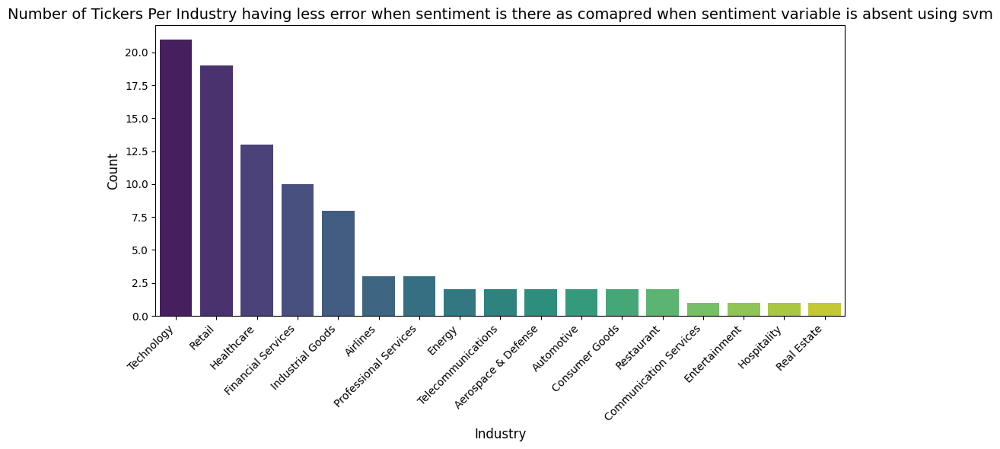

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count the number of tickers per industry in the filtered DataFrame
industry_counts = filtered_df['Industry'].value_counts()

# Plot a bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=industry_counts.index, y=industry_counts.values, palette="viridis")

# Add labels and title
plt.xlabel('Industry', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Number of Tickers Per Industry having less error when sentiment is there as comapred when sentiment variable is absent using svm', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotate x-axis labels for readability
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Example dataset setup (replace this with your actual DataFrame)
# df = pd.read_csv('your_data.csv')

# Define the hyperparameter grid for Random Forest
param_dist = {
    'n_estimators': [100, 200, 300, 400],  # Number of trees
    'max_depth': [5, 10, 15, None],         # Max depth of trees
    'min_samples_split': [2, 5, 10],        # Min samples required to split a node
    'min_samples_leaf': [1, 2, 4],          # Min samples required at leaf node
    'max_features': ['auto', 'sqrt', 'log2', None],  # Number of features to consider for split
    'bootstrap': [True, False]  # Whether to use bootstrap samples
}

# Define features and target for the whole dataset
X = df[['sentiment_sum_1', 'rating', 'Volume', 'oil_prices', 'pe_ratio', 'ExchangeRate', 'lag_pct_change']]
y = df['pct_change']

# Split into training and testing sets (use whole dataset for tuning)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model: Random Forest
model = RandomForestRegressor(random_state=42)

# Perform RandomizedSearchCV to tune hyperparameters on the entire dataset
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_dist, n_iter=30, cv=5,
                                   n_jobs=-1, scoring='r2', random_state=42)
random_search.fit(X_train, y_train)

# Get the best model from RandomizedSearch
best_model = random_search.best_estimator_

# Predict and evaluate on the entire dataset with the best hyperparameters
y_pred = best_model.predict(X_test)
mse_all_tickers = mean_squared_error(y_test, y_pred)
r2_all_tickers = r2_score(y_test, y_pred)

print(f"Best hyperparameters from RandomizedSearch: {random_search.best_params_}")
print(f"Overall MSE: {mse_all_tickers}")
print(f"Overall R²: {r2_all_tickers}")

# Now use the best model to train and evaluate each ticker (single fit)
results = []

for ticker, group in df.groupby('ticker'):
    # Define features and target for the ticker
    X_ticker = group[['sentiment_sum_1', 'rating', 'Volume', 'oil_prices', 'pe_ratio',
                      'ExchangeRate', 'lag_pct_change']]
    y_ticker = group['pct_change']

    # Split into training and testing sets for this ticker (same model for all)
    X_train_ticker, X_test_ticker, y_train_ticker, y_test_ticker = train_test_split(X_ticker, y_ticker,
                                                                                   test_size=0.2, random_state=42)

    # Predict and evaluate for this ticker using the best model found
    y_pred_ticker = best_model.predict(X_test_ticker)
    mse_ticker = mean_squared_error(y_test_ticker, y_pred_ticker)
    r2_ticker = r2_score(y_test_ticker, y_pred_ticker)

    # Append results
    results.append({
        'ticker': ticker,
        'mse': mse_ticker,
        'r2': r2_ticker
    })

# Convert results to DataFrame
results_df = pd.DataFrame(results)


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
40 fits failed out of a total of 150.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
19 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/

Best hyperparameters from RandomizedSearch: {'n_estimators': 400, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 15, 'bootstrap': True}
Overall MSE: 608.4430247767779
Overall R²: 0.43782352975390093


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


In [ ]:
results_df['r2']>0.7

(9, 3)

***LSTM***

In [ ]:
import pandas as pd

In [ ]:
df=pd.read_csv('monthly.csv')

In [ ]:
df.columns

Index(['Unnamed: 0', 'date', 'pct_change', 'sentiment_sum_1', 'rating',
       'Volume', 'oil_prices', 'pe_ratio', 'ExchangeRate', 'lag_pct_change',
       'ticker'],
      dtype='object')

In [ ]:
# Normalize features function
def normalize_features(data, feature_columns):
    scaler = MinMaxScaler()
    data[feature_columns] = scaler.fit_transform(data[feature_columns].astype(float))
    return data, scaler

# Create sequences for LSTM
def create_sequences(data, target_col, sequence_length=10):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        sequence = data[i:i+sequence_length].drop([target_col, 'Date', 'ticker'], axis=1).values
        target = data[target_col].iloc[i+sequence_length]
        X.append(sequence.astype(np.float32))
        y.append(float(target))  # Ensure target is float
    return np.array(X), np.array(y, dtype=np.float32)

# Define the LSTM model
def build_advanced_lstm(input_shape, units, dropout_rate, lr, optimizer='adam'):
    model = Sequential([
        LSTM(units, activation='relu', input_shape=input_shape, return_sequences=False),
        Dropout(dropout_rate),
        Dense(1)
    ])
    opt = Adam(learning_rate=lr) if optimizer == 'adam' else RMSprop(learning_rate=lr)
    model.compile(optimizer=opt, loss='mse')
    return model

# Hyperparameter Tuning on the entire dataset
def tune_hyperparameters(df, feature_columns, target_column, sequence_length=10):
    # Normalize the data
    df, scaler = normalize_features(df, feature_columns)
    df = df.sort_values('date')  # Ensure sorting by Date globally

    # Create sequences
    X, y = create_sequences(df, target_column, sequence_length=sequence_length)

    # Time series cross-validation
    tscv = TimeSeriesSplit(n_splits=3)
    best_mse = float('inf')
    best_params = None

    for units in [32, 64, 128]:
        for lr in [0.001, 0.005, 0.01]:
            for dropout_rate in [0.2, 0.3, 0.4]:
                for optimizer in ['adam', 'rmsprop']:
                    mse_list = []

                    for train_idx, val_idx in tscv.split(X):
                        X_train, X_val = X[train_idx], X[val_idx]
                        y_train, y_val = y[train_idx], y[val_idx]

                        model = build_advanced_lstm(
                            input_shape=(X_train.shape[1], X_train.shape[2]),
                            units=units,
                            dropout_rate=dropout_rate,
                            lr=lr,
                            optimizer=optimizer
                        )

                        early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
                        model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=50, batch_size=4, callbacks=[early_stop], verbose=0)
                        val_pred = model.predict(X_val)
                        mse = mean_squared_error(y_val, val_pred)
                        mse_list.append(mse)

                    avg_mse = np.mean(mse_list)
                    if avg_mse < best_mse:
                        best_mse = avg_mse
                        best_params = {
                            'units': units,
                            'dropout_rate': dropout_rate,
                            'lr': lr,
                            'optimizer': optimizer
                        }

    return best_params

# Evaluate by ticker
def evaluate_by_ticker(df, feature_columns, target_column, best_params, sequence_length=10):
    results = []
    tickers = df['ticker'].unique()

    for ticker in tickers:
        ticker_data = df[df['ticker'] == ticker].sort_values('Date')  # Ensure sorted by Date
        ticker_data, _ = normalize_features(ticker_data, feature_columns)

        # Create sequences
        X, y = create_sequences(ticker_data, target_column, sequence_length=sequence_length)

        # Train-test split (time-based)
        split_idx = int(len(X) * 0.8)
        X_train, X_test = X[:split_idx], X[split_idx:]
        y_train, y_test = y[:split_idx], y[split_idx:]

        # Build and train model
        model = build_advanced_lstm(
            input_shape=(X_train.shape[1], X_train.shape[2]),
            units=best_params['units'],
            dropout_rate=best_params['dropout_rate'],
            lr=best_params['lr'],
            optimizer=best_params['optimizer']
        )
        early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
        model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=50, batch_size=4, callbacks=[early_stop], verbose=0)

        # Predictions and evaluation
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        results.append({'ticker': ticker, 'MSE': mse, 'R2': r2})

    return pd.DataFrame(results)

# Main workflow
feature_columns = ['sentiment_sum_1', 'rating', 'Volume', 'oil_prices', 'pe_ratio', 'ExchangeRate', 'lag_pct_change']
target_column = 'pct_change'

# Step 1: Tune hyperparameters on the whole dataset
best_params = tune_hyperparameters(df, feature_columns, target_column)
print("Best Hyperparameters:", best_params)

# Step 2: Evaluate by ticker using the best hyperparameters
results_df = evaluate_by_ticker(df, feature_columns, target_column, best_params)
print(results_df)



KeyError: "['Date'] not found in axis"

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split
import keras_tuner as kt

# Helper function to create sequences for LSTM
def create_sequences(data, sequence_length, features, target):
    X = []
    y = []
    for i in range(sequence_length, len(data)):
        X.append(data.iloc[i-sequence_length:i][features].values)
        y.append(data.iloc[i][target])
    return np.array(X), np.array(y)

# Build LSTM model for tuning
def build_hypermodel(hp):
    model = Sequential()
    # Tune the number of LSTM units
    model.add(LSTM(units=hp.Int('units', min_value=32, max_value=128, step=16),
                   return_sequences=True, input_shape=(sequence_length, len(features))))
    model.add(Dropout(hp.Float('dropout_rate', min_value=0.1, max_value=0.5, step=0.1)))
    model.add(LSTM(units=hp.Int('units', min_value=32, max_value=128, step=16), return_sequences=False))
    model.add(Dropout(hp.Float('dropout_rate', min_value=0.1, max_value=0.5, step=0.1)))
    model.add(Dense(units=1))

    # Tune the learning rate
    model.compile(optimizer=tf.keras.optimizers.Adam(
                  hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log')),
                  loss='mean_squared_error')
    return model

# Functions to calculate error metrics
def calculate_rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def calculate_mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def calculate_r2(y_true, y_pred):
    return r2_score(y_true, y_pred)

# Initialize result dictionaries
industry_training_errors = {}
overall_training_errors = []

# List of industries
industries = df['Industry'].unique()

# Minimum number of data points for the LSTM model
sequence_length = 60

# Loop through each company (ticker)
for ticker in df['ticker'].unique():
    # Filter data for the current ticker
    company_data = df[df['ticker'] == ticker]

    # Ensure the company has enough data for sequence creation
    if len(company_data) < sequence_length:
        print(f"Skipping {ticker}: not enough data points ({len(company_data)}) for sequence length {sequence_length}.")
        continue

    # Select features and target
    features = ['sentiment_sum', 'ExchangeRate', 'log_volume', 'lag_pct_change', 'pe_ratio', 'oil_prices']
    target = 'pct_change'

    # Normalize features
    scaler = MinMaxScaler()
    company_data[features] = scaler.fit_transform(company_data[features])

    # Create sequences for LSTM
    X, y = create_sequences(company_data, sequence_length, features, target)

    # Split into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # Hyperparameter tuning with Keras Tuner
    tuner = kt.RandomSearch(
        build_hypermodel,
        objective='val_loss',
        max_trials=4,
        executions_per_trial=2,
        directory='my_dir',
        project_name='lstm_tuning'
    )
    tuner.search(X_train, y_train, epochs=5, validation_data=(X_test, y_test), batch_size=32)

    # Retrieve the best model
    best_model = tuner.get_best_models(num_models=1)[0]

    # Make predictions on the training set
    y_train_pred = best_model.predict(X_train)

    # Calculate error metrics
    train_rmse = calculate_rmse(y_train, y_train_pred)
    train_mae = calculate_mae(y_train, y_train_pred)
    train_mape = calculate_mape(y_train, y_train_pred)
    train_r2 = calculate_r2(y_train, y_train_pred)

    # Append RMSE to overall training errors
    overall_training_errors.append(train_rmse)

    # Get the industry of the current company
    industry = company_data['Industry'].iloc[0]

    # Append the training error to the respective industry's list
    if industry not in industry_training_errors:
        industry_training_errors[industry] = []
    industry_training_errors[industry].append(train_rmse)

    # Print model summary and metrics for each company
    print(f"Company: {ticker}")
    print(f"Industry: {industry}")
    print("Model Summary:")
    best_model.summary()
    print(f"Training RMSE: {train_rmse}")
    print(f"Training MAE: {train_mae}")
    print(f"Training MAPE: {train_mape}%")
    print(f"Training R²: {train_r2}\n")

# Calculate average training error for each industry
industry_avg_errors = {industry: np.mean(errors) for industry, errors in industry_training_errors.items()}

# Calculate overall average training error across all companies
overall_avg_error = np.mean(overall_training_errors)

# Print the overall average training error
print(f"\nOverall Average Training RMSE across all companies: {overall_avg_error}\n")

# Plot average training errors by industry
plt.figure(figsize=(12, 6))
plt.bar(industry_avg_errors.keys(), industry_avg_errors.values(), color='skyblue')
plt.xlabel('Industry')
plt.ylabel('Average Training RMSE')
plt.title('Average Training RMSE by Industry')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split
import keras_tuner as kt
import tensorflow as tf

# Helper function to create sequences for LSTM
def create_sequences(data, sequence_length, features, target):
    X = []
    y = []
    for i in range(sequence_length, len(data)):
        X.append(data.iloc[i-sequence_length:i][features].values)
        y.append(data.iloc[i][target])
    return np.array(X), np.array(y)

# Build LSTM model for hyperparameter tuning
def build_hypermodel(hp):
    model = Sequential()
    model.add(LSTM(units=hp.Int('units', min_value=32, max_value=128, step=16),
                   return_sequences=True, input_shape=(sequence_length, len(features))))
    model.add(Dropout(hp.Float('dropout_rate', min_value=0.1, max_value=0.5, step=0.1)))
    model.add(LSTM(units=hp.Int('units', min_value=32, max_value=128, step=16), return_sequences=False))
    model.add(Dropout(hp.Float('dropout_rate', min_value=0.1, max_value=0.5, step=0.1)))
    model.add(Dense(units=1))

    model.compile(optimizer=tf.keras.optimizers.Adam(
                  hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log')),
                  loss='mean_squared_error')
    return model

# Function to calculate error metrics
def calculate_rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def calculate_mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def calculate_r2(y_true, y_pred):
    return r2_score(y_true, y_pred)

# Global parameters
sequence_length = 10  # Number of past time steps to consider
features = ['sentiment_sum_1', 'ExchangeRate', 'Volume', 'lag_pct_change', 'pe_ratio', 'oil_prices']
target = 'pct_change'

# Initialize MinMaxScaler and scale the features for all data
scaler = MinMaxScaler()
df[features] = scaler.fit_transform(df[features])

# Hyperparameter tuning on all data
X_all, y_all = create_sequences(df, sequence_length, features, target)
X_train_all, X_test_all, y_train_all, y_test_all = train_test_split(X_all, y_all, test_size=0.2, shuffle=False)

# Perform hyperparameter tuning
tuner = kt.RandomSearch(
    build_hypermodel,
    objective='val_loss',
    max_trials=4,
    executions_per_trial=2,
    directory='my_dir',
    project_name='lstm_tuning'
)
tuner.search(X_train_all, y_train_all, epochs=5, validation_data=(X_test_all, y_test_all), batch_size=32)

# Retrieve the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Build and compile the model with the best hyperparameters
def build_model_with_best_hps():
    model = Sequential()
    model.add(LSTM(units=best_hps.get('units'), return_sequences=True, input_shape=(sequence_length, len(features))))
    model.add(Dropout(best_hps.get('dropout_rate')))
    model.add(LSTM(units=best_hps.get('units'), return_sequences=False))
    model.add(Dropout(best_hps.get('dropout_rate')))
    model.add(Dense(units=1))
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=best_hps.get('learning_rate')),
                  loss='mean_squared_error')
    return model

# Initialize a list to store results for each ticker
results = []

# Loop through each ticker
for ticker in df['ticker'].unique():
    company_data = df[df['ticker'] == ticker]

    if len(company_data) < sequence_length:
        print(f"Skipping {ticker}: not enough data points ({len(company_data)}) for sequence length {sequence_length}.")
        continue

    # Normalize features for this company
    company_data[features] = scaler.transform(company_data[features])

    # Create sequences for this company
    X, y = create_sequences(company_data, sequence_length, features, target)

    # Split into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # Train the model using the best hyperparameters
    model = build_model_with_best_hps()
    model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test), batch_size=32, verbose=1)

    # Evaluate the model
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Calculate metrics
    train_rmse = calculate_rmse(y_train, y_train_pred)
    train_mae = calculate_mae(y_train, y_train_pred)
    train_mape = calculate_mape(y_train, y_train_pred)
    train_r2 = calculate_r2(y_train, y_train_pred)
    test_rmse = calculate_rmse(y_test, y_test_pred)
    test_mae = calculate_mae(y_test, y_test_pred)
    test_mape = calculate_mape(y_test, y_test_pred)
    test_r2 = calculate_r2(y_test, y_test_pred)

    # Append the results for this ticker
    results.append({
        'Ticker': ticker,

        'Train_RMSE': train_rmse,
        'Train_MAE': train_mae,
        'Train_MAPE': train_mape,
        'Train_R2': train_r2,
        'Test_RMSE': test_rmse,
        'Test_MAE': test_mae,
        'Test_MAPE': test_mape,
        'Test_R2': test_r2
    })

# Convert the results to a DataFrame
results_df = pd.DataFrame(results)




Reloading Tuner from my_dir/lstm_tuning/tuner0.json


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 20.6395 - val_loss: 9.3850
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 20.6045 - val_loss: 9.2830
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 20.5865 - val_loss: 9.2333
Epoch 4/10
1/1 [==============================] - 0s 60ms/step - loss: 20.4456 - val_loss: 9.1905
Epoch 5/10
1/1 [==============================] - 0s 59ms/step - loss: 20.5344 - val_loss: 9.1794
Epoch 6/10
1/1 [==============================] - 0s 59ms/step - loss: 20.6925 - val_loss: 9.2001
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 20.3719 - val_loss: 9.2107
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 20.3610 - val_loss: 9.2245
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 20.6874 - val_loss: 9.2642
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 26.1825 - val_loss: 11.7722
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 25.1074 - val_loss: 12.5281
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 24.2797 - val_loss: 13.7216
Epoch 4/10
1/1 [==============================] - 0s 58ms/step - loss: 23.1302 - val_loss: 15.7119
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 22.8748 - val_loss: 18.8813
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 22.5571 - val_loss: 22.3268
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 23.3226 - val_loss: 22.3480
Epoch 8/10
1/1 [==============================] - 0s 59ms/step - loss: 22.9472 - val_loss: 20.8033
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 23.1425 - val_loss: 18.9497
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 5.1357 - val_loss: 0.8629
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 5.1087 - val_loss: 0.8633
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 5.1137 - val_loss: 0.8997
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 5.0956 - val_loss: 0.9477
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 5.1471 - val_loss: 0.9589
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 5.1192 - val_loss: 0.9259
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 5.1494 - val_loss: 0.9032
Epoch 8/10
1/1 [==============================] - 0s 53ms/step - loss: 5.1619 - val_loss: 0.8754
Epoch 9/10
1/1 [==============================] - 0s 53ms/step - loss: 5.0833 - val_loss: 0.8531
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 7.6113 - val_loss: 2.4033
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 7.2987 - val_loss: 2.3941
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 7.1135 - val_loss: 2.5268
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 7.1027 - val_loss: 2.7011
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 7.2738 - val_loss: 2.6896
Epoch 6/10
1/1 [==============================] - 0s 52ms/step - loss: 7.1606 - val_loss: 2.5919
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 7.0389 - val_loss: 2.5029
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 7.1478 - val_loss: 2.4400
Epoch 9/10
1/1 [==============================] - 0s 59ms/step - loss: 7.0126 - val_loss: 2.4101
Epoch 10/10
1/1 [==============================] - 0s 54ms/step - loss: 7.0927 - val_loss: 2.3965


1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 50.9032 - val_loss: 9.1097
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 49.5599 - val_loss: 10.4693
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 47.9588 - val_loss: 12.3572
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 46.5196 - val_loss: 15.2675
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 45.0545 - val_loss: 20.1237
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 43.1073 - val_loss: 28.4940
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 41.5555 - val_loss: 40.9666
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 42.2736 - val_loss: 47.4125
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 43.5678 - val_loss: 45.1679
Epoch 10/10
1/1 [==============================] - 0s 53ms/step - loss: 43.0836 - val_loss: 39.8240


1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 5.6163 - val_loss: 2.8388
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 5.4111 - val_loss: 2.6427
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 5.3265 - val_loss: 2.5592
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 5.3104 - val_loss: 2.5567
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 5.3452 - val_loss: 2.5541
Epoch 6/10
1/1 [==============================] - 0s 58ms/step - loss: 5.2457 - val_loss: 2.5508
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 5.3083 - val_loss: 2.5618
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 5.2752 - val_loss: 2.5887
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 5.2628 - val_loss: 2.6167
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 21.1097 - val_loss: 0.5032
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 20.2883 - val_loss: 0.6596
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 19.5586 - val_loss: 1.0157
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 18.7828 - val_loss: 1.7801
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 18.0266 - val_loss: 3.3860
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 17.7153 - val_loss: 6.1789
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 18.1065 - val_loss: 7.4230
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 18.1404 - val_loss: 6.6685
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 17.7124 - val_loss: 5.3701
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 5s 5s/step - loss: 58.1730 - val_loss: 7.5497
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 57.1346 - val_loss: 7.9078
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 56.4932 - val_loss: 8.5837
Epoch 4/10
1/1 [==============================] - 0s 59ms/step - loss: 55.5988 - val_loss: 9.8401
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 54.4432 - val_loss: 12.1432
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 55.1126 - val_loss: 14.7506
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 55.9428 - val_loss: 15.1780
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 55.2784 - val_loss: 14.1818
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 54.7515 - val_loss: 12.8715
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 59.8375 - val_loss: 7.3253
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 59.6316 - val_loss: 7.5962
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 59.4112 - val_loss: 7.8828
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 59.2861 - val_loss: 8.2195
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 59.3478 - val_loss: 8.5713
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 59.2982 - val_loss: 8.8556
Epoch 7/10
1/1 [==============================] - 0s 53ms/step - loss: 59.2768 - val_loss: 9.0026
Epoch 8/10
1/1 [==============================] - 0s 51ms/step - loss: 58.9747 - val_loss: 9.0549
Epoch 9/10
1/1 [==============================] - 0s 52ms/step - loss: 58.8490 - val_loss: 9.0174
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 34.2869 - val_loss: 25.2315
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 34.1627 - val_loss: 25.9972
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 34.1389 - val_loss: 26.5637
Epoch 4/10
1/1 [==============================] - 0s 52ms/step - loss: 34.1289 - val_loss: 26.9272
Epoch 5/10
1/1 [==============================] - 0s 53ms/step - loss: 33.9710 - val_loss: 27.1078
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 33.8635 - val_loss: 27.1013
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 34.1335 - val_loss: 26.8340
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 34.0562 - val_loss: 26.4309
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 33.8406 - val_loss: 26.0499
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 7.4076 - val_loss: 10.1695
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 7.1810 - val_loss: 11.0167
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 6.9361 - val_loss: 12.0904
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 6.9015 - val_loss: 13.0368
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 6.9674 - val_loss: 13.2591
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 6.9183 - val_loss: 12.9379
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 6.8091 - val_loss: 12.4523
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 6.7393 - val_loss: 12.0634
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 6.7932 - val_loss: 11.7695
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 8.4605 - val_loss: 3.2623
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 8.2933 - val_loss: 3.9513
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 8.2007 - val_loss: 4.6915
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 8.2066 - val_loss: 5.1330
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 8.1838 - val_loss: 5.1996
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 8.2666 - val_loss: 4.9634
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 8.1502 - val_loss: 4.6669
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 8.2288 - val_loss: 4.3846
Epoch 9/10
1/1 [==============================] - 0s 59ms/step - loss: 8.2282 - val_loss: 4.1455
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 5s 5s/step - loss: 24.9540 - val_loss: 9.1590
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 24.3724 - val_loss: 8.5243
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 23.8229 - val_loss: 7.9780
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 23.5396 - val_loss: 7.6258
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 23.4111 - val_loss: 7.6104
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 23.3825 - val_loss: 7.6830
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 24.0910 - val_loss: 7.6127
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 23.6272 - val_loss: 7.5824
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 23.4853 - val_loss: 7.6352
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 3637.7354 - val_loss: 170.0998
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 3624.0400 - val_loss: 170.4853
Epoch 3/10
1/1 [==============================] - 0s 53ms/step - loss: 3608.7532 - val_loss: 171.1678
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 3591.2043 - val_loss: 172.4545
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 3564.3040 - val_loss: 175.0074
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 3533.9858 - val_loss: 180.2250
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 3480.3611 - val_loss: 190.4804
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 3413.4270 - val_loss: 208.1993
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 3329.6997 - val_loss: 232.4642
Epoch 10/10
1/1 [==============================] - 0s 30ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 34.8728 - val_loss: 24.6105
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 34.0709 - val_loss: 26.0322
Epoch 3/10
1/1 [==============================] - 0s 59ms/step - loss: 33.2078 - val_loss: 28.0860
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 32.3195 - val_loss: 31.3108
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 31.4798 - val_loss: 36.5220
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 30.9928 - val_loss: 43.0606
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 31.8187 - val_loss: 44.0175
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 32.3668 - val_loss: 41.2731
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 31.5303 - val_loss: 37.9701
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 10.8293 - val_loss: 2.1696
Epoch 2/10
1/1 [==============================] - 0s 55ms/step - loss: 10.3977 - val_loss: 1.5751
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 9.9534 - val_loss: 1.0457
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 9.7947 - val_loss: 0.7530
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 9.8417 - val_loss: 0.7492
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 9.9178 - val_loss: 0.7411
Epoch 7/10
1/1 [==============================] - 0s 52ms/step - loss: 9.7979 - val_loss: 0.7579
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 9.8414 - val_loss: 0.8405
Epoch 9/10
1/1 [==============================] - 0s 53ms/step - loss: 9.5740 - val_loss: 0.9439
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 15.4499 - val_loss: 202.4046
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 15.0174 - val_loss: 198.1564
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 14.6698 - val_loss: 193.4040
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 14.3986 - val_loss: 188.1052
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 14.4219 - val_loss: 183.9623
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 14.5056 - val_loss: 183.2171
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 14.6405 - val_loss: 184.7607
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 14.2141 - val_loss: 186.7205
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 14.5565 - val_loss: 188.9562
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 26.2672 - val_loss: 9.5564
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 25.7077 - val_loss: 8.9593
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 25.1686 - val_loss: 8.4331
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 25.0039 - val_loss: 8.0624
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 25.0176 - val_loss: 7.9438
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 24.9650 - val_loss: 7.9532
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 25.1367 - val_loss: 7.9436
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 25.1131 - val_loss: 7.9535
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 25.1012 - val_loss: 8.0303
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 20.6982 - val_loss: 11.6529
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 20.5518 - val_loss: 11.1137
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 20.5769 - val_loss: 10.7599
Epoch 4/10
1/1 [==============================] - 0s 58ms/step - loss: 20.5552 - val_loss: 10.5880
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 20.5344 - val_loss: 10.5627
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 20.4641 - val_loss: 10.5982
Epoch 7/10
1/1 [==============================] - 0s 58ms/step - loss: 20.7386 - val_loss: 10.7615
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 20.4802 - val_loss: 10.9431
Epoch 9/10
1/1 [==============================] - 0s 59ms/step - loss: 20.3153 - val_loss: 11.0939
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 19.2245 - val_loss: 3.8672
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 18.2008 - val_loss: 3.0502
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 17.2139 - val_loss: 2.2323
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 16.2618 - val_loss: 1.5003
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 14.9986 - val_loss: 1.2256
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 14.4333 - val_loss: 2.2668
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 14.3506 - val_loss: 3.3865
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 15.5096 - val_loss: 2.8739
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 14.7682 - val_loss: 2.0300
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 47.4231 - val_loss: 19.2782
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 47.3185 - val_loss: 19.9367
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 47.3137 - val_loss: 20.6151
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 47.1313 - val_loss: 21.3408
Epoch 5/10
1/1 [==============================] - 0s 53ms/step - loss: 47.1557 - val_loss: 21.8375
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 47.3701 - val_loss: 21.9626
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 47.2825 - val_loss: 21.8286
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 47.3664 - val_loss: 21.5470
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 47.4243 - val_loss: 21.2216
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 10.5208 - val_loss: 2.1492
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 10.0837 - val_loss: 2.4360
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 9.8416 - val_loss: 2.9567
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 9.5857 - val_loss: 3.7270
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 9.7458 - val_loss: 4.0588
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 9.6492 - val_loss: 3.9284
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 9.6304 - val_loss: 3.5974
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 9.5806 - val_loss: 3.2765
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 9.4949 - val_loss: 3.0558
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 6s 6s/step - loss: 7.9609 - val_loss: 25.5123
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 7.8457 - val_loss: 26.1161
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 7.7969 - val_loss: 26.3985
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 7.7451 - val_loss: 26.3546
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 7.6994 - val_loss: 26.0763
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 7.6959 - val_loss: 25.7887
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 7.5840 - val_loss: 25.6326
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 7.5524 - val_loss: 25.6099
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 7.4494 - val_loss: 25.8203
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 16.8578 - val_loss: 6.5282
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 16.6914 - val_loss: 7.0310
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 16.6533 - val_loss: 7.5190
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 16.5871 - val_loss: 7.8690
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 16.5256 - val_loss: 8.0418
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 16.6297 - val_loss: 7.9509
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 16.5639 - val_loss: 7.7327
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 16.4343 - val_loss: 7.4178
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 16.4612 - val_loss: 7.2257
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 39.5359 - val_loss: 9.2510
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 39.6256 - val_loss: 9.4565
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 39.5453 - val_loss: 9.4265
Epoch 4/10
1/1 [==============================] - 0s 49ms/step - loss: 39.5721 - val_loss: 9.2757
Epoch 5/10
1/1 [==============================] - 0s 58ms/step - loss: 39.5634 - val_loss: 9.0948
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 39.4975 - val_loss: 8.9433
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 39.4122 - val_loss: 8.7735
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 39.5137 - val_loss: 8.6465
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 39.4086 - val_loss: 8.5096
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 22.3831 - val_loss: 1.4307
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 21.9763 - val_loss: 1.3362
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 21.6227 - val_loss: 1.3767
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 21.5986 - val_loss: 1.5851
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 21.3612 - val_loss: 1.8929
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 21.6721 - val_loss: 1.9898
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 21.5534 - val_loss: 1.8806
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 21.3497 - val_loss: 1.7235
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 21.6159 - val_loss: 1.5807
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 176.1162 - val_loss: 25.0466
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 175.2414 - val_loss: 25.2972
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 174.5331 - val_loss: 25.7368
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 173.9377 - val_loss: 26.4835
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 173.1691 - val_loss: 27.8003
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 172.1375 - val_loss: 29.9538
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 172.6766 - val_loss: 32.1605
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 172.2072 - val_loss: 33.5246
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 170.1436 - val_loss: 34.1066
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 16.9736 - val_loss: 5.1799
Epoch 2/10
1/1 [==============================] - 0s 56ms/step - loss: 16.8739 - val_loss: 5.1079
Epoch 3/10
1/1 [==============================] - 0s 59ms/step - loss: 16.8432 - val_loss: 5.0879
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 16.8485 - val_loss: 5.0862
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 16.9437 - val_loss: 5.0798
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 16.7734 - val_loss: 5.0734
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 16.7252 - val_loss: 5.0703
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 16.7324 - val_loss: 5.0710
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 16.7381 - val_loss: 5.0720
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 10.3155 - val_loss: 2.0729
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 10.1331 - val_loss: 2.0348
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 10.0922 - val_loss: 2.0811
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 10.0682 - val_loss: 2.1629
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 10.0266 - val_loss: 2.2137
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 10.0301 - val_loss: 2.1943
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 9.8793 - val_loss: 2.1587
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 9.7527 - val_loss: 2.1325
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 9.6234 - val_loss: 2.1273
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 22.4036 - val_loss: 1.4237
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 22.4119 - val_loss: 1.4273
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 22.3136 - val_loss: 1.4275
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 22.3491 - val_loss: 1.4433
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 22.4008 - val_loss: 1.4525
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 22.1387 - val_loss: 1.4622
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 22.2943 - val_loss: 1.4667
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 22.0314 - val_loss: 1.4748
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 21.9492 - val_loss: 1.5011
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 6.9318 - val_loss: 13.8742
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 6.8677 - val_loss: 14.4014
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 6.8457 - val_loss: 14.6507
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 6.9570 - val_loss: 14.6040
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 6.8502 - val_loss: 14.4297
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 6.8810 - val_loss: 14.1775
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 6.9117 - val_loss: 14.0283
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 6.8198 - val_loss: 13.9750
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 6.8436 - val_loss: 14.0990
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 19.6457 - val_loss: 9.4119
Epoch 2/10
1/1 [==============================] - 0s 54ms/step - loss: 18.6198 - val_loss: 11.0775
Epoch 3/10
1/1 [==============================] - 0s 53ms/step - loss: 17.8052 - val_loss: 13.3180
Epoch 4/10
1/1 [==============================] - 0s 51ms/step - loss: 17.3249 - val_loss: 16.5077
Epoch 5/10
1/1 [==============================] - 0s 50ms/step - loss: 16.8928 - val_loss: 20.8405
Epoch 6/10
1/1 [==============================] - 0s 51ms/step - loss: 16.7810 - val_loss: 24.8208
Epoch 7/10
1/1 [==============================] - 0s 53ms/step - loss: 17.1164 - val_loss: 25.5511
Epoch 8/10
1/1 [==============================] - 0s 51ms/step - loss: 16.2190 - val_loss: 24.4268
Epoch 9/10
1/1 [==============================] - 0s 53ms/step - loss: 16.5673 - val_loss: 22.4456
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 58.1522 - val_loss: 312.3184
Epoch 2/10
1/1 [==============================] - 0s 56ms/step - loss: 58.2204 - val_loss: 312.6502
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 58.2337 - val_loss: 313.0786
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 58.0837 - val_loss: 312.6945
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 58.1145 - val_loss: 312.0057
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 57.8613 - val_loss: 311.0741
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 57.7791 - val_loss: 310.2172
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 57.9578 - val_loss: 309.4124
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 57.7158 - val_loss: 308.6762
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 37.4021 - val_loss: 10.0359
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 37.3045 - val_loss: 10.7687
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 37.1837 - val_loss: 11.4958
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 37.1105 - val_loss: 12.1302
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 37.1547 - val_loss: 12.5695
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 37.2027 - val_loss: 12.7320
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 37.1044 - val_loss: 12.7208
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 37.2279 - val_loss: 12.4959
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 37.2637 - val_loss: 12.1939
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 14.6928 - val_loss: 3.3259
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 14.6951 - val_loss: 3.2455
Epoch 3/10
1/1 [==============================] - 0s 59ms/step - loss: 14.6625 - val_loss: 3.1651
Epoch 4/10
1/1 [==============================] - 0s 58ms/step - loss: 14.6545 - val_loss: 3.1034
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 14.6256 - val_loss: 3.0824
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 14.6542 - val_loss: 3.1422
Epoch 7/10
1/1 [==============================] - 0s 59ms/step - loss: 14.6702 - val_loss: 3.2896
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 14.5975 - val_loss: 3.4176
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 14.6409 - val_loss: 3.4679
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 13.0064 - val_loss: 7.3294
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 12.4284 - val_loss: 7.0515
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 11.9927 - val_loss: 6.9027
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 11.4878 - val_loss: 6.9789
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 11.1738 - val_loss: 7.4460
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 11.4513 - val_loss: 7.8976
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 11.2813 - val_loss: 7.8961
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 11.3581 - val_loss: 7.6063
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 11.5220 - val_loss: 7.2906
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 6s 6s/step - loss: 28.9064 - val_loss: 21.7246
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 29.0764 - val_loss: 21.5448
Epoch 3/10
1/1 [==============================] - 0s 59ms/step - loss: 28.7753 - val_loss: 21.3982
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 28.7876 - val_loss: 21.3236
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 28.6603 - val_loss: 21.2943
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 28.8521 - val_loss: 21.3340
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 28.4720 - val_loss: 21.4747
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 28.3239 - val_loss: 21.7114
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 28.0254 - val_loss: 21.9930
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 21.7154 - val_loss: 9.1896
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 21.5678 - val_loss: 9.9500
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 21.2959 - val_loss: 10.7952
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 21.3395 - val_loss: 11.5492
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 21.1728 - val_loss: 12.1068
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 21.1326 - val_loss: 12.2926
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 21.0730 - val_loss: 12.2083
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 21.2261 - val_loss: 11.8370
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 21.3676 - val_loss: 11.3050
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 30.1213 - val_loss: 4.3250
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 29.3577 - val_loss: 4.5774
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 28.3118 - val_loss: 5.1582
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 27.7417 - val_loss: 6.4096
Epoch 5/10
1/1 [==============================] - 0s 53ms/step - loss: 26.9608 - val_loss: 8.8901
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 27.1342 - val_loss: 10.9836
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 27.9904 - val_loss: 10.5250
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 27.3872 - val_loss: 9.2229
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 27.2339 - val_loss: 7.9846
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 4.6866 - val_loss: 0.8271
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 4.6710 - val_loss: 0.8762
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 4.6143 - val_loss: 0.9249
Epoch 4/10
1/1 [==============================] - 0s 53ms/step - loss: 4.6693 - val_loss: 0.8987
Epoch 5/10
1/1 [==============================] - 0s 53ms/step - loss: 4.6677 - val_loss: 0.8170
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 4.5442 - val_loss: 0.7471
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 4.5411 - val_loss: 0.6795
Epoch 8/10
1/1 [==============================] - 0s 53ms/step - loss: 4.5952 - val_loss: 0.6507
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 4.5225 - val_loss: 0.6515
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 23.8452 - val_loss: 8.3216
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 23.3007 - val_loss: 8.5701
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 23.0826 - val_loss: 9.0248
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 22.8708 - val_loss: 9.7199
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 22.6996 - val_loss: 10.4531
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 22.6791 - val_loss: 10.7463
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 22.6482 - val_loss: 10.5330
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 22.5547 - val_loss: 10.0744
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 22.7714 - val_loss: 9.5918
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 25.1678 - val_loss: 26.3212
Epoch 2/10
1/1 [==============================] - 0s 56ms/step - loss: 25.2361 - val_loss: 26.6926
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 25.3022 - val_loss: 26.9117
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 25.1484 - val_loss: 27.1052
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 25.2394 - val_loss: 27.1628
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 25.1500 - val_loss: 27.2120
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 25.2312 - val_loss: 27.2242
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 25.1759 - val_loss: 27.0974
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 25.1602 - val_loss: 27.0326
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 19.2966 - val_loss: 12.3811
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 19.1848 - val_loss: 12.7789
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 19.0181 - val_loss: 13.1365
Epoch 4/10
1/1 [==============================] - 0s 50ms/step - loss: 18.9998 - val_loss: 13.4620
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 18.9780 - val_loss: 13.6585
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 19.0512 - val_loss: 13.6993
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 18.6587 - val_loss: 13.7356
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 19.0091 - val_loss: 13.6397
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 18.8733 - val_loss: 13.4883
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 17.8676 - val_loss: 12.1482
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 17.6669 - val_loss: 12.6167
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 17.5673 - val_loss: 13.0922
Epoch 4/10
1/1 [==============================] - 0s 53ms/step - loss: 17.5459 - val_loss: 13.5153
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 17.5265 - val_loss: 13.8404
Epoch 6/10
1/1 [==============================] - 0s 53ms/step - loss: 17.4812 - val_loss: 14.0896
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 17.3971 - val_loss: 14.2513
Epoch 8/10
1/1 [==============================] - 0s 53ms/step - loss: 17.3447 - val_loss: 14.3181
Epoch 9/10
1/1 [==============================] - 0s 53ms/step - loss: 17.2973 - val_loss: 14.3044
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 6s 6s/step - loss: 19.2828 - val_loss: 1.9703
Epoch 2/10
1/1 [==============================] - 0s 62ms/step - loss: 18.6696 - val_loss: 2.1270
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 18.1640 - val_loss: 2.4909
Epoch 4/10
1/1 [==============================] - 0s 59ms/step - loss: 17.5703 - val_loss: 3.2568
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 17.4901 - val_loss: 4.5742
Epoch 6/10
1/1 [==============================] - 0s 58ms/step - loss: 17.4005 - val_loss: 5.5620
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 17.8625 - val_loss: 5.2985
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 17.7124 - val_loss: 4.5603
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 17.5041 - val_loss: 3.8703
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 63.5370 - val_loss: 43.0409
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 62.4367 - val_loss: 44.2784
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 61.2063 - val_loss: 46.1679
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 59.8218 - val_loss: 49.3285
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 59.4203 - val_loss: 54.2962
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 59.2298 - val_loss: 59.3538
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 59.8397 - val_loss: 60.5615
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 59.3529 - val_loss: 58.5429
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 58.6693 - val_loss: 55.8003
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 11.7627 - val_loss: 2.0659
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 11.4022 - val_loss: 1.6168
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 11.0919 - val_loss: 1.2970
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 11.0705 - val_loss: 1.1608
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 10.9508 - val_loss: 1.1616
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 11.1739 - val_loss: 1.1581
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 11.2346 - val_loss: 1.1569
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 11.1113 - val_loss: 1.1954
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 11.1346 - val_loss: 1.2693
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 22.0692 - val_loss: 3.9289
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 21.3885 - val_loss: 3.4686
Epoch 3/10
1/1 [==============================] - 0s 53ms/step - loss: 20.6542 - val_loss: 3.1262
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 20.0239 - val_loss: 3.0621
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 19.6102 - val_loss: 3.6211
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 19.6031 - val_loss: 4.4081
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 20.4840 - val_loss: 4.2116
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 19.7882 - val_loss: 3.7481
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 19.5608 - val_loss: 3.3932
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 114.3919 - val_loss: 16.7411
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 112.8740 - val_loss: 15.2625
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 111.1836 - val_loss: 13.6125
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 109.6299 - val_loss: 11.8289
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 107.5175 - val_loss: 10.2052
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 104.7341 - val_loss: 9.6014
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 103.3339 - val_loss: 11.3288
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 104.2449 - val_loss: 13.3352
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 106.8906 - val_loss: 12.7828
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 9.4000 - val_loss: 5.7247
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 9.2879 - val_loss: 5.6771
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 9.3056 - val_loss: 5.6544
Epoch 4/10
1/1 [==============================] - 0s 59ms/step - loss: 9.2260 - val_loss: 5.6470
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 9.1673 - val_loss: 5.6429
Epoch 6/10
1/1 [==============================] - 0s 59ms/step - loss: 9.2991 - val_loss: 5.6411
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 9.1166 - val_loss: 5.6451
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 9.1915 - val_loss: 5.6545
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 9.0886 - val_loss: 5.6657
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 21.6723 - val_loss: 12.8445
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 21.0252 - val_loss: 13.1957
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 20.3863 - val_loss: 13.7484
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 19.8747 - val_loss: 14.6924
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 19.4647 - val_loss: 16.3363
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 19.1496 - val_loss: 18.7946
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 19.7365 - val_loss: 19.6487
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 19.7224 - val_loss: 18.8906
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 19.5545 - val_loss: 17.6086
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 26.3121 - val_loss: 80.6669
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 25.3939 - val_loss: 78.6401
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 24.7826 - val_loss: 76.3771
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 24.1369 - val_loss: 73.6812
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 23.3619 - val_loss: 70.4840
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 22.8317 - val_loss: 67.1954
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 23.2145 - val_loss: 65.6538
Epoch 8/10
1/1 [==============================] - 0s 52ms/step - loss: 23.4624 - val_loss: 65.9104
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 23.6890 - val_loss: 67.0937
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 17.4528 - val_loss: 5.1139
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 17.3619 - val_loss: 5.2226
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 17.3229 - val_loss: 5.3225
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 17.4221 - val_loss: 5.3879
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 17.3461 - val_loss: 5.3930
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 17.2982 - val_loss: 5.3677
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 17.3101 - val_loss: 5.3386
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 17.2428 - val_loss: 5.3114
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 17.1975 - val_loss: 5.2954
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 21.6351 - val_loss: 3.5901
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 21.1819 - val_loss: 2.9051
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 21.0332 - val_loss: 2.3480
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 20.7217 - val_loss: 1.9355
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 20.8825 - val_loss: 1.7967
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 20.6286 - val_loss: 1.8019
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 20.9645 - val_loss: 1.9443
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 20.8646 - val_loss: 2.1651
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 21.0176 - val_loss: 2.4190
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 43.7236 - val_loss: 6.9093
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 43.0514 - val_loss: 6.5759
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 42.3939 - val_loss: 6.3405
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 41.8307 - val_loss: 6.2554
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 41.7033 - val_loss: 6.4575
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 41.4149 - val_loss: 7.0322
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 41.4994 - val_loss: 7.4817
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 41.7245 - val_loss: 7.3731
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 41.5699 - val_loss: 7.0255
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 17.8016 - val_loss: 5.0715
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 17.5948 - val_loss: 5.4592
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 17.5671 - val_loss: 5.8326
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 17.5626 - val_loss: 6.0297
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 17.5516 - val_loss: 5.9985
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 17.5145 - val_loss: 5.8597
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 17.5154 - val_loss: 5.7085
Epoch 8/10
1/1 [==============================] - 0s 53ms/step - loss: 17.5337 - val_loss: 5.5511
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 17.5332 - val_loss: 5.4372
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 34.1073 - val_loss: 7.9929
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 33.3137 - val_loss: 7.3364
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 32.6439 - val_loss: 6.7211
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 32.0344 - val_loss: 6.2262
Epoch 5/10
1/1 [==============================] - 0s 61ms/step - loss: 31.6814 - val_loss: 6.0807
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 30.9219 - val_loss: 6.5410
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 31.4133 - val_loss: 6.8284
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 31.7202 - val_loss: 6.5552
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 31.3740 - val_loss: 6.2463
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 3.6552 - val_loss: 1.9699
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 3.6538 - val_loss: 1.9634
Epoch 3/10
1/1 [==============================] - 0s 60ms/step - loss: 3.6307 - val_loss: 1.9636
Epoch 4/10
1/1 [==============================] - 0s 61ms/step - loss: 3.6373 - val_loss: 1.9634
Epoch 5/10
1/1 [==============================] - 0s 58ms/step - loss: 3.6530 - val_loss: 1.9715
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 3.6133 - val_loss: 1.9816
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 3.5933 - val_loss: 1.9852
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 3.5849 - val_loss: 1.9815
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 3.6781 - val_loss: 1.9737
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 50.2395 - val_loss: 2.4645
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 49.5177 - val_loss: 2.7285
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 48.4817 - val_loss: 3.2307
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 47.5775 - val_loss: 4.1881
Epoch 5/10
1/1 [==============================] - 0s 58ms/step - loss: 46.6747 - val_loss: 6.0292
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 46.3902 - val_loss: 8.9824
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 45.4596 - val_loss: 11.9202
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 45.8048 - val_loss: 12.2253
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 46.3578 - val_loss: 10.6008
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 297.5489 - val_loss: 80.6840
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 294.4047 - val_loss: 83.1594
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 291.7315 - val_loss: 86.5333
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 287.5238 - val_loss: 91.6057
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 281.7834 - val_loss: 99.6737
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 276.5036 - val_loss: 112.8796
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 266.4027 - val_loss: 133.4560
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 263.6443 - val_loss: 160.0672
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 262.8433 - val_loss: 184.6389
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 3.5376 - val_loss: 6.6242
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 3.4929 - val_loss: 6.4803
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 3.5001 - val_loss: 6.4591
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 3.5135 - val_loss: 6.5343
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 3.4710 - val_loss: 6.6519
Epoch 6/10
1/1 [==============================] - 0s 59ms/step - loss: 3.5323 - val_loss: 6.8368
Epoch 7/10
1/1 [==============================] - 0s 59ms/step - loss: 3.4707 - val_loss: 6.9455
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 3.4063 - val_loss: 6.9819
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 3.5114 - val_loss: 6.9551
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 45.9498 - val_loss: 10.0337
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 45.8316 - val_loss: 10.3089
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 45.8556 - val_loss: 10.5131
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 45.7517 - val_loss: 10.6834
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 45.6992 - val_loss: 10.8041
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 45.6320 - val_loss: 10.9300
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 45.6573 - val_loss: 11.0039
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 45.8666 - val_loss: 10.9790
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 45.5338 - val_loss: 10.8975
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 21.9231 - val_loss: 7.4649
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 21.8277 - val_loss: 7.5977
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 21.9519 - val_loss: 7.6878
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 21.8242 - val_loss: 7.7250
Epoch 5/10
1/1 [==============================] - 0s 58ms/step - loss: 21.8793 - val_loss: 7.7623
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 21.7948 - val_loss: 7.7711
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 21.9015 - val_loss: 7.7542
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 21.8668 - val_loss: 7.7261
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 21.8756 - val_loss: 7.6809
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 21.3303 - val_loss: 8.0611
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 21.3327 - val_loss: 7.8927
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 21.3556 - val_loss: 7.8245
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 21.3043 - val_loss: 7.8056
Epoch 5/10
1/1 [==============================] - 0s 53ms/step - loss: 21.2261 - val_loss: 7.8225
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 21.1539 - val_loss: 7.8619
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 21.1424 - val_loss: 7.8922
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 20.9733 - val_loss: 7.9076
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 20.9833 - val_loss: 7.9418
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 22.2075 - val_loss: 0.2978
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 22.1623 - val_loss: 0.2676
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 22.2136 - val_loss: 0.2602
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 22.2022 - val_loss: 0.2479
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 22.2118 - val_loss: 0.2462
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 22.0958 - val_loss: 0.2410
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 22.0875 - val_loss: 0.2344
Epoch 8/10
1/1 [==============================] - 0s 60ms/step - loss: 21.9551 - val_loss: 0.2315
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 22.0266 - val_loss: 0.2307
Epoch 10/10
1/1 [==============================] - 0s 29ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 9.1082 - val_loss: 12.5322
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 8.9811 - val_loss: 12.3796
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 8.9655 - val_loss: 12.2893
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 9.0053 - val_loss: 12.2474
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 9.0718 - val_loss: 12.2385
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 9.0912 - val_loss: 12.2490
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 9.0054 - val_loss: 12.2684
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 8.9747 - val_loss: 12.2981
Epoch 9/10
1/1 [==============================] - 0s 53ms/step - loss: 8.9468 - val_loss: 12.3282
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 11.6710 - val_loss: 1.0240
Epoch 2/10
1/1 [==============================] - 0s 56ms/step - loss: 11.1947 - val_loss: 1.5565
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 10.8279 - val_loss: 2.4074
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 10.6583 - val_loss: 3.6485
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 10.5940 - val_loss: 4.5527
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 10.6327 - val_loss: 4.4429
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 10.7496 - val_loss: 3.7926
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 10.6617 - val_loss: 3.1201
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 10.5964 - val_loss: 2.6208
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 12.9703 - val_loss: 5.5251
Epoch 2/10
1/1 [==============================] - 0s 56ms/step - loss: 12.8955 - val_loss: 5.8691
Epoch 3/10
1/1 [==============================] - 0s 53ms/step - loss: 12.9219 - val_loss: 6.0830
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 12.8192 - val_loss: 6.1912
Epoch 5/10
1/1 [==============================] - 0s 53ms/step - loss: 12.8736 - val_loss: 6.1744
Epoch 6/10
1/1 [==============================] - 0s 53ms/step - loss: 12.8942 - val_loss: 6.0884
Epoch 7/10
1/1 [==============================] - 0s 53ms/step - loss: 12.6632 - val_loss: 5.9930
Epoch 8/10
1/1 [==============================] - 0s 53ms/step - loss: 12.8050 - val_loss: 5.8680
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 12.8524 - val_loss: 5.7465
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 586.6815 - val_loss: 16.2150
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 582.4081 - val_loss: 16.0927
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 576.9907 - val_loss: 16.1037
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 571.6747 - val_loss: 16.3792
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 564.2595 - val_loss: 17.2601
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 555.3046 - val_loss: 19.5172
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 540.4925 - val_loss: 24.5593
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 525.7269 - val_loss: 34.0082
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 506.0872 - val_loss: 47.8653
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 5.8817 - val_loss: 3.6773
Epoch 2/10
1/1 [==============================] - 0s 56ms/step - loss: 5.7334 - val_loss: 3.2174
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 5.7256 - val_loss: 2.9447
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 5.7166 - val_loss: 2.8683
Epoch 5/10
1/1 [==============================] - 0s 53ms/step - loss: 5.7209 - val_loss: 2.9244
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 5.6793 - val_loss: 3.0218
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 5.6189 - val_loss: 3.1273
Epoch 8/10
1/1 [==============================] - 0s 53ms/step - loss: 5.6648 - val_loss: 3.2475
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 5.6765 - val_loss: 3.3528
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 122.1058 - val_loss: 14.7524
Epoch 2/10
1/1 [==============================] - 0s 63ms/step - loss: 121.3268 - val_loss: 14.3038
Epoch 3/10
1/1 [==============================] - 0s 61ms/step - loss: 121.0610 - val_loss: 13.9066
Epoch 4/10
1/1 [==============================] - 0s 62ms/step - loss: 120.5310 - val_loss: 13.5533
Epoch 5/10
1/1 [==============================] - 0s 62ms/step - loss: 119.7259 - val_loss: 13.2960
Epoch 6/10
1/1 [==============================] - 0s 60ms/step - loss: 119.9521 - val_loss: 13.2361
Epoch 7/10
1/1 [==============================] - 0s 61ms/step - loss: 119.6218 - val_loss: 13.4096
Epoch 8/10
1/1 [==============================] - 0s 61ms/step - loss: 119.9357 - val_loss: 13.6281
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 118.9442 - val_loss: 13.7711
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 17.6074 - val_loss: 7.4575
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 17.0195 - val_loss: 7.6596
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 16.6963 - val_loss: 8.0828
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 16.4299 - val_loss: 8.8176
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 16.2263 - val_loss: 9.8027
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 16.6364 - val_loss: 9.9781
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 16.6166 - val_loss: 9.5374
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 16.4604 - val_loss: 9.0349
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 16.4110 - val_loss: 8.6364
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 33.7895 - val_loss: 2.7279
Epoch 2/10
1/1 [==============================] - 0s 63ms/step - loss: 32.7754 - val_loss: 2.4971
Epoch 3/10
1/1 [==============================] - 0s 61ms/step - loss: 31.7600 - val_loss: 2.3999
Epoch 4/10
1/1 [==============================] - 0s 58ms/step - loss: 30.7594 - val_loss: 2.5695
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 29.7438 - val_loss: 3.3822
Epoch 6/10
1/1 [==============================] - 0s 59ms/step - loss: 28.9932 - val_loss: 5.5316
Epoch 7/10
1/1 [==============================] - 0s 58ms/step - loss: 28.3415 - val_loss: 8.6489
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 29.4909 - val_loss: 8.9244
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 30.3116 - val_loss: 7.3820
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 18.2378 - val_loss: 4.6540
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 17.9557 - val_loss: 4.6593
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 17.9770 - val_loss: 4.7436
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 17.7375 - val_loss: 4.8924
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 17.8951 - val_loss: 4.9921
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 17.9693 - val_loss: 4.9812
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 17.8106 - val_loss: 4.9176
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 17.7530 - val_loss: 4.8469
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 17.7651 - val_loss: 4.7887
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 8.6328 - val_loss: 5.8690
Epoch 2/10
1/1 [==============================] - 0s 65ms/step - loss: 8.2953 - val_loss: 6.6317
Epoch 3/10
1/1 [==============================] - 0s 59ms/step - loss: 8.2770 - val_loss: 7.4656
Epoch 4/10
1/1 [==============================] - 0s 58ms/step - loss: 8.1230 - val_loss: 8.1119
Epoch 5/10
1/1 [==============================] - 0s 62ms/step - loss: 8.1509 - val_loss: 8.2161
Epoch 6/10
1/1 [==============================] - 0s 60ms/step - loss: 8.2082 - val_loss: 7.9280
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 8.1759 - val_loss: 7.5099
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 8.1015 - val_loss: 7.1422
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 8.1561 - val_loss: 6.8781
Epoch 10/10
1/1 [==============================] - 0s 29ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 73.3316 - val_loss: 12.1741
Epoch 2/10
1/1 [==============================] - 0s 56ms/step - loss: 73.5139 - val_loss: 12.1269
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 73.3054 - val_loss: 12.1636
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 73.2452 - val_loss: 12.2046
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 73.1984 - val_loss: 12.2441
Epoch 6/10
1/1 [==============================] - 0s 52ms/step - loss: 73.0942 - val_loss: 12.2558
Epoch 7/10
1/1 [==============================] - 0s 52ms/step - loss: 73.0304 - val_loss: 12.3263
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 72.9850 - val_loss: 12.3721
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 72.8292 - val_loss: 12.3749
Epoch 10/10
1/1 [==============================] - 0s 25ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 16.1573 - val_loss: 1.4969
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 15.5882 - val_loss: 1.6026
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 14.8649 - val_loss: 1.9789
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 14.4806 - val_loss: 2.7933
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 14.3714 - val_loss: 3.8687
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 14.3972 - val_loss: 4.2580
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 14.6946 - val_loss: 3.7955
Epoch 8/10
1/1 [==============================] - 0s 53ms/step - loss: 14.5011 - val_loss: 3.1461
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 14.3453 - val_loss: 2.6305
Epoch 10/10
1/1 [==============================] - 0s 27ms/step
Skipping GEHC: not enough data points (3) for sequence l

<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 7s 7s/step - loss: 4.1250 - val_loss: 6.8899
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 4.1304 - val_loss: 7.0642
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 4.1197 - val_loss: 7.0112
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 4.1378 - val_loss: 6.8975
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 4.0901 - val_loss: 6.7901
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 4.1002 - val_loss: 6.7071
Epoch 7/10
1/1 [==============================] - 0s 53ms/step - loss: 4.0457 - val_loss: 6.6482
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 4.1007 - val_loss: 6.6819
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 4.0684 - val_loss: 6.7300
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 55.6544 - val_loss: 3.0994
Epoch 2/10
1/1 [==============================] - 0s 64ms/step - loss: 53.8141 - val_loss: 3.9752
Epoch 3/10
1/1 [==============================] - 0s 60ms/step - loss: 52.0122 - val_loss: 5.1793
Epoch 4/10
1/1 [==============================] - 0s 60ms/step - loss: 49.8846 - val_loss: 7.0473
Epoch 5/10
1/1 [==============================] - 0s 58ms/step - loss: 47.4797 - val_loss: 10.2028
Epoch 6/10
1/1 [==============================] - 0s 58ms/step - loss: 45.1680 - val_loss: 15.7896
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 41.8722 - val_loss: 25.4922
Epoch 8/10
1/1 [==============================] - 0s 61ms/step - loss: 40.4618 - val_loss: 39.4448
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 41.4507 - val_loss: 46.8041
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 282.2226 - val_loss: 35.2839
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 277.8483 - val_loss: 35.2224
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 273.1562 - val_loss: 35.4018
Epoch 4/10
1/1 [==============================] - 0s 59ms/step - loss: 266.8094 - val_loss: 36.1613
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 260.4666 - val_loss: 38.3389
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 249.8766 - val_loss: 43.7521
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 238.9315 - val_loss: 55.3090
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 227.8361 - val_loss: 74.2320
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 216.6023 - val_loss: 96.3169
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 129.2552 - val_loss: 71.2573
Epoch 2/10
1/1 [==============================] - 0s 63ms/step - loss: 128.8898 - val_loss: 71.7337
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 129.0059 - val_loss: 72.2430
Epoch 4/10
1/1 [==============================] - 0s 58ms/step - loss: 128.8240 - val_loss: 72.6874
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 128.8147 - val_loss: 73.0140
Epoch 6/10
1/1 [==============================] - 0s 58ms/step - loss: 128.6438 - val_loss: 73.3083
Epoch 7/10
1/1 [==============================] - 0s 58ms/step - loss: 128.7270 - val_loss: 73.5639
Epoch 8/10
1/1 [==============================] - 0s 62ms/step - loss: 129.0845 - val_loss: 73.5730
Epoch 9/10
1/1 [==============================] - 0s 65ms/step - loss: 128.4546 - val_loss: 73.5718
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 252.0068 - val_loss: 4.3276
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 251.5727 - val_loss: 4.6644
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 250.6107 - val_loss: 5.1328
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 250.2390 - val_loss: 5.8244
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 248.9605 - val_loss: 6.9521
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 248.5533 - val_loss: 8.6799
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 247.8140 - val_loss: 11.3219
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 246.5774 - val_loss: 14.9094
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 246.4790 - val_loss: 18.2276
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 18.2816 - val_loss: 5.0595
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 17.4724 - val_loss: 5.2513
Epoch 3/10
1/1 [==============================] - 0s 60ms/step - loss: 16.7622 - val_loss: 5.7284
Epoch 4/10
1/1 [==============================] - 0s 58ms/step - loss: 16.1088 - val_loss: 6.7388
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 15.3885 - val_loss: 8.6651
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 15.6551 - val_loss: 10.3976
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 15.9913 - val_loss: 10.3800
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 15.7927 - val_loss: 9.4010
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 15.4727 - val_loss: 8.3605
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 31.5190 - val_loss: 3.7973
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 31.0466 - val_loss: 3.4279
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 30.8951 - val_loss: 3.1849
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 30.4297 - val_loss: 3.0807
Epoch 5/10
1/1 [==============================] - 0s 58ms/step - loss: 30.4032 - val_loss: 3.0899
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 30.6114 - val_loss: 3.0921
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 30.5730 - val_loss: 3.0743
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 30.4607 - val_loss: 3.0962
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 30.3549 - val_loss: 3.1730
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 26.2462 - val_loss: 15.2886
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 25.6593 - val_loss: 13.8970
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 25.2924 - val_loss: 12.5123
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 24.9518 - val_loss: 11.2498
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 24.8064 - val_loss: 10.4536
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 25.4118 - val_loss: 10.4015
Epoch 7/10
1/1 [==============================] - 0s 58ms/step - loss: 25.6391 - val_loss: 10.8021
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 24.8586 - val_loss: 11.3209
Epoch 9/10
1/1 [==============================] - 0s 59ms/step - loss: 25.0900 - val_loss: 11.8721
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 113.1357 - val_loss: 56.8277
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 111.4096 - val_loss: 53.9424
Epoch 3/10
1/1 [==============================] - 0s 53ms/step - loss: 109.4640 - val_loss: 50.5904
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 107.2883 - val_loss: 46.4915
Epoch 5/10
1/1 [==============================] - 0s 53ms/step - loss: 104.7177 - val_loss: 41.5221
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 101.7357 - val_loss: 35.9777
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 98.5061 - val_loss: 31.1428
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 98.1634 - val_loss: 29.1002
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 99.8384 - val_loss: 28.9319
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 17.7640 - val_loss: 4.7859
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 17.3526 - val_loss: 3.8767
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 17.0793 - val_loss: 3.0441
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 17.0395 - val_loss: 2.4371
Epoch 5/10
1/1 [==============================] - 0s 62ms/step - loss: 17.1995 - val_loss: 2.2426
Epoch 6/10
1/1 [==============================] - 0s 60ms/step - loss: 17.1897 - val_loss: 2.3233
Epoch 7/10
1/1 [==============================] - 0s 59ms/step - loss: 17.0668 - val_loss: 2.5349
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 17.0673 - val_loss: 2.8048
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 17.0083 - val_loss: 3.0634
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 11.9001 - val_loss: 4.5256
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 11.3226 - val_loss: 4.3837
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 10.7524 - val_loss: 4.3552
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 10.3747 - val_loss: 4.5564
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 9.9982 - val_loss: 5.2439
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 9.8288 - val_loss: 6.3243
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 10.1577 - val_loss: 6.3821
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 10.1431 - val_loss: 5.8541
Epoch 9/10
1/1 [==============================] - 0s 59ms/step - loss: 9.9001 - val_loss: 5.3350
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 3.4866 - val_loss: 1.0382
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 3.4641 - val_loss: 1.0285
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 3.4116 - val_loss: 1.0385
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 3.4387 - val_loss: 1.0390
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 3.4891 - val_loss: 1.0306
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 3.5052 - val_loss: 1.0279
Epoch 7/10
1/1 [==============================] - 0s 53ms/step - loss: 3.4458 - val_loss: 1.0333
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 3.4805 - val_loss: 1.0414
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 3.4252 - val_loss: 1.0459
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 9.6881 - val_loss: 5.2613
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 9.6476 - val_loss: 5.4604
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 9.6784 - val_loss: 5.5769
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 9.6362 - val_loss: 5.6104
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 9.7046 - val_loss: 5.5550
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 9.5961 - val_loss: 5.4373
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 9.6959 - val_loss: 5.3529
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 9.5303 - val_loss: 5.2789
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 9.4623 - val_loss: 5.2040
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 14.4917 - val_loss: 4.3655
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 14.4226 - val_loss: 4.3424
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 14.4861 - val_loss: 4.3734
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 14.4683 - val_loss: 4.4201
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 14.3517 - val_loss: 4.4627
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 14.2769 - val_loss: 4.5092
Epoch 7/10
1/1 [==============================] - 0s 52ms/step - loss: 14.1121 - val_loss: 4.5937
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 14.2024 - val_loss: 4.7196
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 14.2191 - val_loss: 4.9104
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 8s 8s/step - loss: 30.7854 - val_loss: 7.8791
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 30.0830 - val_loss: 8.2583
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 29.6026 - val_loss: 8.8335
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 29.1483 - val_loss: 9.7428
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 28.7006 - val_loss: 11.1781
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 28.1556 - val_loss: 13.2271
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 28.4978 - val_loss: 14.7029
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 28.3942 - val_loss: 14.8897
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 28.5995 - val_loss: 14.1509
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 480.6640 - val_loss: 141.6630
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 478.2113 - val_loss: 137.6373
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 475.2785 - val_loss: 133.0172
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 472.5850 - val_loss: 127.3362
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 467.6937 - val_loss: 120.1558
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 464.8373 - val_loss: 111.2867
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 459.2874 - val_loss: 101.3860
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 452.7810 - val_loss: 92.4793
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 450.6649 - val_loss: 86.9394
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 7.4339 - val_loss: 4.8349
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 7.3169 - val_loss: 4.6517
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 7.3808 - val_loss: 4.6120
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 7.4048 - val_loss: 4.6802
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 7.4482 - val_loss: 4.7878
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 7.4011 - val_loss: 4.8984
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 7.3935 - val_loss: 4.9724
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 7.2459 - val_loss: 4.9781
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 7.3250 - val_loss: 4.9279
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 20.5841 - val_loss: 2.2598
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 19.7995 - val_loss: 2.1905
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 19.0294 - val_loss: 2.3539
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 18.4528 - val_loss: 2.9968
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 18.0692 - val_loss: 4.4691
Epoch 6/10
1/1 [==============================] - 0s 58ms/step - loss: 18.1589 - val_loss: 5.6581
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 18.3844 - val_loss: 5.2955
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 17.8776 - val_loss: 4.4346
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 18.0618 - val_loss: 3.6745
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 18.0203 - val_loss: 13.5330
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 17.6469 - val_loss: 12.8990
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 17.3782 - val_loss: 12.3020
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 17.0583 - val_loss: 11.7842
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 17.2031 - val_loss: 11.5431
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 17.4363 - val_loss: 11.5480
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 17.3352 - val_loss: 11.6647
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 17.2313 - val_loss: 11.8443
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 16.9930 - val_loss: 12.0202
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 32.0908 - val_loss: 9.9559
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 31.3286 - val_loss: 9.3080
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 30.9216 - val_loss: 8.8000
Epoch 4/10
1/1 [==============================] - 0s 58ms/step - loss: 30.6581 - val_loss: 8.5392
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 30.6550 - val_loss: 8.5811
Epoch 6/10
1/1 [==============================] - 0s 59ms/step - loss: 30.7262 - val_loss: 8.6262
Epoch 7/10
1/1 [==============================] - 0s 60ms/step - loss: 30.3110 - val_loss: 8.5992
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 30.2888 - val_loss: 8.5733
Epoch 9/10
1/1 [==============================] - 0s 61ms/step - loss: 30.2222 - val_loss: 8.6018
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 5.7591 - val_loss: 0.3127
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 5.4711 - val_loss: 0.4772
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 5.2338 - val_loss: 0.7665
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 5.0060 - val_loss: 1.2760
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 4.8965 - val_loss: 2.0667
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 4.8979 - val_loss: 2.6046
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 5.0249 - val_loss: 2.4279
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 4.9925 - val_loss: 2.0022
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 4.9800 - val_loss: 1.6065
Epoch 10/10
1/1 [==============================] - 0s 25ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 18.8976 - val_loss: 3.6757
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 18.4393 - val_loss: 3.5596
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 18.1483 - val_loss: 3.6621
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 18.1227 - val_loss: 3.9509
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 18.2820 - val_loss: 4.0125
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 18.2563 - val_loss: 3.8768
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 18.1696 - val_loss: 3.7232
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 18.0973 - val_loss: 3.6235
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 18.1699 - val_loss: 3.5740
Epoch 10/10
1/1 [==============================] - 0s 30ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 94.3306 - val_loss: 4.9886
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 92.1127 - val_loss: 4.6572
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 89.6212 - val_loss: 4.4292
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 86.7353 - val_loss: 4.4824
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 83.3526 - val_loss: 5.3475
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 78.9412 - val_loss: 8.2950
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 73.5500 - val_loss: 15.5578
Epoch 8/10
1/1 [==============================] - 0s 53ms/step - loss: 69.2837 - val_loss: 28.1425
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 70.2532 - val_loss: 37.8486
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 9.6718 - val_loss: 1.0129
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 9.4443 - val_loss: 1.0497
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 9.2367 - val_loss: 1.1909
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 9.3338 - val_loss: 1.3520
Epoch 5/10
1/1 [==============================] - 0s 53ms/step - loss: 9.2946 - val_loss: 1.4054
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 9.2652 - val_loss: 1.3552
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 9.5478 - val_loss: 1.2406
Epoch 8/10
1/1 [==============================] - 0s 60ms/step - loss: 9.2882 - val_loss: 1.1494
Epoch 9/10
1/1 [==============================] - 0s 59ms/step - loss: 9.3080 - val_loss: 1.0931
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 22.6740 - val_loss: 6.2215
Epoch 2/10
1/1 [==============================] - 0s 62ms/step - loss: 22.0826 - val_loss: 5.4578
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 21.6547 - val_loss: 4.7083
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 21.1821 - val_loss: 4.0064
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 20.8940 - val_loss: 3.5379
Epoch 6/10
1/1 [==============================] - 0s 52ms/step - loss: 20.8457 - val_loss: 3.4621
Epoch 7/10
1/1 [==============================] - 0s 53ms/step - loss: 21.0729 - val_loss: 3.4659
Epoch 8/10
1/1 [==============================] - 0s 52ms/step - loss: 20.7156 - val_loss: 3.4547
Epoch 9/10
1/1 [==============================] - 0s 53ms/step - loss: 20.7722 - val_loss: 3.5095
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 53.8504 - val_loss: 26.1295
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 53.4848 - val_loss: 25.9788
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 53.2053 - val_loss: 25.9774
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 53.1778 - val_loss: 26.1274
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 53.3385 - val_loss: 26.2477
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 53.1554 - val_loss: 26.2761
Epoch 7/10
1/1 [==============================] - 0s 53ms/step - loss: 53.5840 - val_loss: 26.1843
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 53.0296 - val_loss: 26.1051
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 52.7745 - val_loss: 26.0678
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 47.3924 - val_loss: 10.3601
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 46.5456 - val_loss: 10.8309
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 45.4709 - val_loss: 11.6361
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 44.7019 - val_loss: 13.0974
Epoch 5/10
1/1 [==============================] - 0s 52ms/step - loss: 43.7272 - val_loss: 15.7748
Epoch 6/10
1/1 [==============================] - 0s 53ms/step - loss: 43.7325 - val_loss: 19.2943
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 44.6497 - val_loss: 20.1843
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 45.0247 - val_loss: 18.9150
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 44.2031 - val_loss: 17.1042
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 137.0666 - val_loss: 18.2242
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 135.8355 - val_loss: 18.2733
Epoch 3/10
1/1 [==============================] - 0s 60ms/step - loss: 134.8377 - val_loss: 18.5334
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 133.4030 - val_loss: 19.2291
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 131.9450 - val_loss: 20.8407
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 131.4537 - val_loss: 24.0772
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 130.9234 - val_loss: 28.2376
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 131.7102 - val_loss: 29.5062
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 130.7901 - val_loss: 28.4097
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 37.4371 - val_loss: 3.2240
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 36.5452 - val_loss: 3.3726
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 35.8613 - val_loss: 3.7057
Epoch 4/10
1/1 [==============================] - 0s 58ms/step - loss: 35.4204 - val_loss: 4.3304
Epoch 5/10
1/1 [==============================] - 0s 59ms/step - loss: 35.0712 - val_loss: 5.3686
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 34.8388 - val_loss: 6.7127
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 34.4870 - val_loss: 7.6514
Epoch 8/10
1/1 [==============================] - 0s 59ms/step - loss: 34.8955 - val_loss: 7.4415
Epoch 9/10
1/1 [==============================] - 0s 61ms/step - loss: 34.5391 - val_loss: 6.7294
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 11.4069 - val_loss: 1.1025
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 11.3097 - val_loss: 1.1195
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 11.3793 - val_loss: 1.1265
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 11.3977 - val_loss: 1.1170
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 11.3367 - val_loss: 1.0937
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 11.3526 - val_loss: 1.0692
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 11.3749 - val_loss: 1.0505
Epoch 8/10
1/1 [==============================] - 0s 53ms/step - loss: 11.4373 - val_loss: 1.0453
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 11.5750 - val_loss: 1.0539
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 9s 9s/step - loss: 3.9530 - val_loss: 0.3917
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 3.9285 - val_loss: 0.3759
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 3.9133 - val_loss: 0.3748
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 3.9264 - val_loss: 0.3748
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 3.8946 - val_loss: 0.3744
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 3.9285 - val_loss: 0.3783
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 3.9091 - val_loss: 0.3866
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 3.8493 - val_loss: 0.3948
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 3.9223 - val_loss: 0.4007
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 23.3415 - val_loss: 3.6322
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 22.8224 - val_loss: 4.1195
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 22.5168 - val_loss: 4.8684
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 22.3156 - val_loss: 5.9407
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 22.1961 - val_loss: 7.0057
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 22.1538 - val_loss: 7.2997
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 22.5577 - val_loss: 6.7581
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 22.5539 - val_loss: 6.0164
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 22.2444 - val_loss: 5.4238
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 19.2124 - val_loss: 10.7815
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 19.1476 - val_loss: 11.4667
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 19.0821 - val_loss: 12.1524
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 18.9921 - val_loss: 12.8439
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 18.9488 - val_loss: 13.5312
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 18.8812 - val_loss: 14.0313
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 18.9143 - val_loss: 14.2008
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 18.9676 - val_loss: 13.9834
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 18.7879 - val_loss: 13.6768
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 153.8371 - val_loss: 81.0791
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 150.3867 - val_loss: 85.4907
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 146.9496 - val_loss: 91.1370
Epoch 4/10
1/1 [==============================] - 0s 52ms/step - loss: 142.6894 - val_loss: 99.0051
Epoch 5/10
1/1 [==============================] - 0s 53ms/step - loss: 137.7468 - val_loss: 110.7101
Epoch 6/10
1/1 [==============================] - 0s 53ms/step - loss: 130.9843 - val_loss: 128.7582
Epoch 7/10
1/1 [==============================] - 0s 53ms/step - loss: 122.4690 - val_loss: 156.3878
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 116.1228 - val_loss: 195.1160
Epoch 9/10
1/1 [==============================] - 0s 53ms/step - loss: 104.3709 - val_loss: 239.5323
Epoch 10/10
1/1 [==============================] - 0s 29ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 34.6576 - val_loss: 9.3851
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 33.9404 - val_loss: 9.2099
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 33.5469 - val_loss: 9.1631
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 33.2085 - val_loss: 9.3281
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 32.9086 - val_loss: 9.8404
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 32.2161 - val_loss: 10.7058
Epoch 7/10
1/1 [==============================] - 0s 58ms/step - loss: 32.8896 - val_loss: 11.0318
Epoch 8/10
1/1 [==============================] - 0s 59ms/step - loss: 32.1687 - val_loss: 10.8292
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 32.4941 - val_loss: 10.3687
Epoch 10/10
1/1 [==============================] - 0s 29ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 57.8981 - val_loss: 255.2506
Epoch 2/10
1/1 [==============================] - 0s 62ms/step - loss: 56.1079 - val_loss: 256.0547
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 54.6040 - val_loss: 257.4625
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 52.9399 - val_loss: 260.1228
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 50.3441 - val_loss: 265.4094
Epoch 6/10
1/1 [==============================] - 0s 58ms/step - loss: 48.3601 - val_loss: 275.1725
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 48.4939 - val_loss: 282.6151
Epoch 8/10
1/1 [==============================] - 0s 60ms/step - loss: 50.0234 - val_loss: 281.8625
Epoch 9/10
1/1 [==============================] - 0s 60ms/step - loss: 48.8140 - val_loss: 277.7465
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 30.1986 - val_loss: 8.3914
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 29.8869 - val_loss: 7.9945
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 29.5841 - val_loss: 7.7597
Epoch 4/10
1/1 [==============================] - 0s 58ms/step - loss: 29.1867 - val_loss: 7.6998
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 29.4584 - val_loss: 7.7332
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 29.8837 - val_loss: 7.7142
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 29.4863 - val_loss: 7.7002
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 29.1514 - val_loss: 7.7161
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 29.4249 - val_loss: 7.7517
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 16.1386 - val_loss: 25.8328
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 15.7978 - val_loss: 24.6427
Epoch 3/10
1/1 [==============================] - 0s 59ms/step - loss: 15.5169 - val_loss: 23.4731
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 15.4286 - val_loss: 22.5137
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 15.2892 - val_loss: 21.9066
Epoch 6/10
1/1 [==============================] - 0s 58ms/step - loss: 15.4755 - val_loss: 21.9286
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 15.4341 - val_loss: 22.2748
Epoch 8/10
1/1 [==============================] - 0s 60ms/step - loss: 15.5330 - val_loss: 22.7624
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 15.4890 - val_loss: 23.2535
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 10.1804 - val_loss: 4.2894
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 10.0555 - val_loss: 4.8315
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 9.9478 - val_loss: 5.3408
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 10.1299 - val_loss: 5.5088
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 10.0232 - val_loss: 5.4352
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 10.0241 - val_loss: 5.1850
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 10.0347 - val_loss: 4.9382
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 10.0256 - val_loss: 4.7427
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 10.0153 - val_loss: 4.6383
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 25.4867 - val_loss: 3.9519
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 25.2735 - val_loss: 3.5022
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 25.0973 - val_loss: 3.1144
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 25.2128 - val_loss: 2.8492
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 25.0559 - val_loss: 2.6651
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 25.0957 - val_loss: 2.5665
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 25.0276 - val_loss: 2.5332
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 24.8951 - val_loss: 2.5458
Epoch 9/10
1/1 [==============================] - 0s 59ms/step - loss: 25.0166 - val_loss: 2.6162
Epoch 10/10
1/1 [==============================] - 0s 29ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 6.0877 - val_loss: 1.1028
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 5.7634 - val_loss: 1.0292
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 5.5428 - val_loss: 1.0987
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 5.4632 - val_loss: 1.2881
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 5.6675 - val_loss: 1.3184
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 5.4858 - val_loss: 1.2466
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 5.5958 - val_loss: 1.1416
Epoch 8/10
1/1 [==============================] - 0s 60ms/step - loss: 5.5030 - val_loss: 1.0705
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 5.5022 - val_loss: 1.0355
Epoch 10/10
1/1 [==============================] - 0s 29ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 19.3660 - val_loss: 34.6859
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 18.6666 - val_loss: 32.7006
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 18.0095 - val_loss: 30.4029
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 17.3810 - val_loss: 27.6568
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 17.0099 - val_loss: 24.6707
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 16.6237 - val_loss: 22.6175
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 16.8053 - val_loss: 22.5160
Epoch 8/10
1/1 [==============================] - 0s 59ms/step - loss: 16.6934 - val_loss: 23.3359
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 16.4592 - val_loss: 24.4855
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 10.4814 - val_loss: 7.1274
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 10.4426 - val_loss: 7.5480
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 10.3602 - val_loss: 7.9406
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 10.4425 - val_loss: 8.1028
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 10.4628 - val_loss: 8.0669
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 10.4524 - val_loss: 7.8938
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 10.4235 - val_loss: 7.6943
Epoch 8/10
1/1 [==============================] - 0s 53ms/step - loss: 10.3200 - val_loss: 7.5388
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 10.3704 - val_loss: 7.4408
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 4.9469 - val_loss: 14.8690
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 4.8550 - val_loss: 15.0542
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 4.8619 - val_loss: 15.1492
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 4.8882 - val_loss: 15.1087
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 4.8842 - val_loss: 15.0009
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 4.9409 - val_loss: 14.8980
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 4.8412 - val_loss: 14.8316
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 4.8851 - val_loss: 14.7945
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 4.8052 - val_loss: 14.7976
Epoch 10/10
1/1 [==============================] - 0s 30ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 117.5044 - val_loss: 62.2381
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 116.0500 - val_loss: 60.9612
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 114.2503 - val_loss: 59.6513
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 112.7577 - val_loss: 58.3382
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 111.0246 - val_loss: 57.3458
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 108.8289 - val_loss: 57.4418
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 109.3146 - val_loss: 59.0099
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 108.1396 - val_loss: 60.1279
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 110.3563 - val_loss: 59.7155
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 12.8306 - val_loss: 8.8501
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 12.4703 - val_loss: 9.6447
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 12.2903 - val_loss: 10.6425
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 12.1734 - val_loss: 11.6687
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 12.1662 - val_loss: 12.1465
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 12.2469 - val_loss: 11.9696
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 12.0882 - val_loss: 11.5744
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 12.0538 - val_loss: 11.1453
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 12.0761 - val_loss: 10.7889
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 11.3753 - val_loss: 11.2205
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 11.3111 - val_loss: 11.9162
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 11.2073 - val_loss: 12.4528
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 11.2086 - val_loss: 12.8847
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 11.2950 - val_loss: 12.9822
Epoch 6/10
1/1 [==============================] - 0s 53ms/step - loss: 11.1630 - val_loss: 12.8588
Epoch 7/10
1/1 [==============================] - 0s 53ms/step - loss: 11.1508 - val_loss: 12.6168
Epoch 8/10
1/1 [==============================] - 0s 52ms/step - loss: 11.1845 - val_loss: 12.2939
Epoch 9/10
1/1 [==============================] - 0s 53ms/step - loss: 11.2283 - val_loss: 11.9550
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 44.7896 - val_loss: 19.9310
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 43.2971 - val_loss: 18.9010
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 42.1579 - val_loss: 17.8411
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 40.9116 - val_loss: 16.7293
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 39.2888 - val_loss: 15.7251
Epoch 6/10
1/1 [==============================] - 0s 53ms/step - loss: 37.9093 - val_loss: 15.4280
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 36.2573 - val_loss: 17.0283
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 37.3917 - val_loss: 18.4697
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 37.7590 - val_loss: 17.9672
Epoch 10/10
1/1 [==============================] - 0s 25ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 10s 10s/step - loss: 9.7381 - val_loss: 10.3876
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 9.6267 - val_loss: 9.4655
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 9.5453 - val_loss: 8.9595
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 9.6173 - val_loss: 8.9227
Epoch 5/10
1/1 [==============================] - 0s 59ms/step - loss: 9.5790 - val_loss: 9.0727
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 9.6219 - val_loss: 9.3724
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 9.5155 - val_loss: 9.6554
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 9.5397 - val_loss: 9.9120
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 9.5777 - val_loss: 10.0962
Epoch 10/10
1/1 [==============================] - 0s 30ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 25.2946 - val_loss: 6.3894
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 24.5777 - val_loss: 6.6614
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 23.8215 - val_loss: 7.2826
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 23.3786 - val_loss: 8.5644
Epoch 5/10
1/1 [==============================] - 0s 58ms/step - loss: 22.9460 - val_loss: 10.6908
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 22.9283 - val_loss: 11.9528
Epoch 7/10
1/1 [==============================] - 0s 58ms/step - loss: 23.5254 - val_loss: 11.4921
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 22.8547 - val_loss: 10.4527
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 23.0047 - val_loss: 9.4758
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 43.2662 - val_loss: 1.9171
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 43.1527 - val_loss: 1.8737
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 43.1359 - val_loss: 1.8166
Epoch 4/10
1/1 [==============================] - 0s 52ms/step - loss: 42.9988 - val_loss: 1.7690
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 43.1912 - val_loss: 1.7435
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 43.1914 - val_loss: 1.7173
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 42.8285 - val_loss: 1.7240
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 42.9141 - val_loss: 1.7581
Epoch 9/10
1/1 [==============================] - 0s 53ms/step - loss: 42.7691 - val_loss: 1.8016
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 16.0270 - val_loss: 14.5925
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 15.5561 - val_loss: 14.1581
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 15.1325 - val_loss: 13.8635
Epoch 4/10
1/1 [==============================] - 0s 53ms/step - loss: 14.8125 - val_loss: 13.7850
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 14.9095 - val_loss: 13.8695
Epoch 6/10
1/1 [==============================] - 0s 53ms/step - loss: 14.8081 - val_loss: 13.8754
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 15.0154 - val_loss: 13.8097
Epoch 8/10
1/1 [==============================] - 0s 53ms/step - loss: 14.9002 - val_loss: 13.7822
Epoch 9/10
1/1 [==============================] - 0s 52ms/step - loss: 14.8356 - val_loss: 13.8151
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 56.2145 - val_loss: 2.9850
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 55.0440 - val_loss: 3.0038
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 53.6779 - val_loss: 3.2993
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 52.8959 - val_loss: 4.1818
Epoch 5/10
1/1 [==============================] - 0s 58ms/step - loss: 51.4537 - val_loss: 6.3184
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 51.2978 - val_loss: 9.5669
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 52.1259 - val_loss: 10.6481
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 52.3304 - val_loss: 9.4891
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 51.9748 - val_loss: 7.8030
Epoch 10/10
1/1 [==============================] - 0s 29ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 6.5194 - val_loss: 2.6312
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 6.4987 - val_loss: 2.9462
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 6.5333 - val_loss: 3.0768
Epoch 4/10
1/1 [==============================] - 0s 58ms/step - loss: 6.4706 - val_loss: 3.0938
Epoch 5/10
1/1 [==============================] - 0s 58ms/step - loss: 6.4826 - val_loss: 2.9986
Epoch 6/10
1/1 [==============================] - 0s 59ms/step - loss: 6.3798 - val_loss: 2.8870
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 6.3940 - val_loss: 2.7945
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 6.4225 - val_loss: 2.7100
Epoch 9/10
1/1 [==============================] - 0s 59ms/step - loss: 6.4229 - val_loss: 2.6552
Epoch 10/10
1/1 [==============================] - 0s 29ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 5.4930 - val_loss: 12.0968
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 5.4040 - val_loss: 12.7167
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 5.4112 - val_loss: 12.9921
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 5.4249 - val_loss: 12.9220
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 5.4462 - val_loss: 12.6861
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 5.3428 - val_loss: 12.4503
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 5.3583 - val_loss: 12.2625
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 5.3587 - val_loss: 12.1601
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 5.3933 - val_loss: 12.1170
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 14.8126 - val_loss: 3.1093
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 14.7244 - val_loss: 2.8577
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 14.7437 - val_loss: 2.6820
Epoch 4/10
1/1 [==============================] - 0s 59ms/step - loss: 14.6365 - val_loss: 2.6103
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 14.8737 - val_loss: 2.6552
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 14.7378 - val_loss: 2.7553
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 14.6388 - val_loss: 2.8873
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 14.7219 - val_loss: 3.0330
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 14.7178 - val_loss: 3.1273
Epoch 10/10
1/1 [==============================] - 0s 28ms/step
Skipping NXTT: not enough data points (9) for sequence l

<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 11.3336 - val_loss: 1.0327
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 11.0170 - val_loss: 0.9714
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 10.8131 - val_loss: 1.1270
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 10.7683 - val_loss: 1.2774
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 10.8390 - val_loss: 1.2119
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 10.9658 - val_loss: 1.0743
Epoch 7/10
1/1 [==============================] - 0s 53ms/step - loss: 10.8917 - val_loss: 0.9876
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 10.8309 - val_loss: 0.9624
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 10.6013 - val_loss: 0.9624
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 192.5686 - val_loss: 9.0091
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 190.6336 - val_loss: 9.8211
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 189.0751 - val_loss: 11.0825
Epoch 4/10
1/1 [==============================] - 0s 59ms/step - loss: 186.5036 - val_loss: 13.2776
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 185.0276 - val_loss: 17.2628
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 182.2755 - val_loss: 24.5056
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 178.9361 - val_loss: 36.2775
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 178.3632 - val_loss: 46.8198
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 179.0391 - val_loss: 49.6572
Epoch 10/10
1/1 [==============================] - 0s 29ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 3.6837 - val_loss: 1.2428
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 3.6121 - val_loss: 1.2347
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 3.6527 - val_loss: 1.2354
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 3.6456 - val_loss: 1.2400
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 3.6302 - val_loss: 1.2520
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 3.6498 - val_loss: 1.2667
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 3.6775 - val_loss: 1.2817
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 3.6313 - val_loss: 1.2859
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 3.6461 - val_loss: 1.2793
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 14.8206 - val_loss: 10.8304
Epoch 2/10
1/1 [==============================] - 0s 64ms/step - loss: 14.6108 - val_loss: 10.7120
Epoch 3/10
1/1 [==============================] - 0s 62ms/step - loss: 14.2703 - val_loss: 10.6917
Epoch 4/10
1/1 [==============================] - 0s 60ms/step - loss: 14.2729 - val_loss: 10.7819
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 14.2133 - val_loss: 10.8837
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 14.3985 - val_loss: 10.8775
Epoch 7/10
1/1 [==============================] - 0s 58ms/step - loss: 14.2518 - val_loss: 10.8193
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 14.5899 - val_loss: 10.7555
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 14.3562 - val_loss: 10.7248
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 13.3484 - val_loss: 2.3956
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 13.1599 - val_loss: 2.4670
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 13.0577 - val_loss: 2.5782
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 13.0142 - val_loss: 2.6651
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 13.0798 - val_loss: 2.6711
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 13.0549 - val_loss: 2.6263
Epoch 7/10
1/1 [==============================] - 0s 58ms/step - loss: 13.0814 - val_loss: 2.5603
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 13.0517 - val_loss: 2.5058
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 13.0417 - val_loss: 2.4720
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 17.4473 - val_loss: 23.5047
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 16.8089 - val_loss: 24.6643
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 16.3970 - val_loss: 26.3785
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 15.7778 - val_loss: 29.0589
Epoch 5/10
1/1 [==============================] - 0s 59ms/step - loss: 15.8350 - val_loss: 32.0010
Epoch 6/10
1/1 [==============================] - 0s 59ms/step - loss: 16.1849 - val_loss: 32.2560
Epoch 7/10
1/1 [==============================] - 0s 58ms/step - loss: 16.3439 - val_loss: 30.9888
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 15.8849 - val_loss: 29.5506
Epoch 9/10
1/1 [==============================] - 0s 59ms/step - loss: 15.6857 - val_loss: 28.4729
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 35.1864 - val_loss: 6.6156
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 34.4877 - val_loss: 7.3241
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 33.8555 - val_loss: 8.2902
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 33.5623 - val_loss: 9.6489
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 33.1711 - val_loss: 11.4623
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 33.5583 - val_loss: 12.7762
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 33.1772 - val_loss: 13.0873
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 33.2442 - val_loss: 12.4987
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 33.2623 - val_loss: 11.5812
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 19.4621 - val_loss: 41.4256
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 19.5229 - val_loss: 40.8967
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 19.4308 - val_loss: 40.7746
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 19.4054 - val_loss: 40.8149
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 19.4804 - val_loss: 41.0930
Epoch 6/10
1/1 [==============================] - 0s 58ms/step - loss: 19.3625 - val_loss: 41.4231
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 19.3994 - val_loss: 41.6879
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 19.3304 - val_loss: 42.0476
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 19.1751 - val_loss: 42.2166
Epoch 10/10
1/1 [==============================] - 0s 29ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 73.9450 - val_loss: 4.1149
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 73.2615 - val_loss: 4.6095
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 72.9378 - val_loss: 5.3042
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 72.1298 - val_loss: 6.3639
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 71.9315 - val_loss: 7.8957
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 72.0903 - val_loss: 9.6162
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 71.4009 - val_loss: 11.1307
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 71.9629 - val_loss: 11.4935
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 70.9313 - val_loss: 11.2804
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 19.3517 - val_loss: 1.1357
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 18.9543 - val_loss: 1.2845
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 18.4752 - val_loss: 1.6704
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 18.2169 - val_loss: 2.3993
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 18.5695 - val_loss: 2.9535
Epoch 6/10
1/1 [==============================] - 0s 58ms/step - loss: 18.5784 - val_loss: 2.8853
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 18.3339 - val_loss: 2.5693
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 18.4569 - val_loss: 2.2004
Epoch 9/10
1/1 [==============================] - 0s 61ms/step - loss: 18.2750 - val_loss: 1.9283
Epoch 10/10
1/1 [==============================] - 0s 29ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 197.7570 - val_loss: 20.8134
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 194.3944 - val_loss: 23.0122
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 190.8711 - val_loss: 26.1166
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 185.8294 - val_loss: 30.9491
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 180.8346 - val_loss: 39.0686
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 173.5226 - val_loss: 52.8756
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 165.9239 - val_loss: 74.4313
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 159.7110 - val_loss: 101.1321
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 157.1355 - val_loss: 124.0899
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 53.4892 - val_loss: 19.1867
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 52.5537 - val_loss: 18.9606
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 51.7618 - val_loss: 18.8523
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 50.6730 - val_loss: 18.9570
Epoch 5/10
1/1 [==============================] - 0s 49ms/step - loss: 49.9010 - val_loss: 19.5298
Epoch 6/10
1/1 [==============================] - 0s 58ms/step - loss: 49.0194 - val_loss: 21.0457
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 48.6991 - val_loss: 23.4048
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 49.0752 - val_loss: 24.3310
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 48.7080 - val_loss: 23.6685
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 38.0037 - val_loss: 8.2400
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 37.8311 - val_loss: 8.2697
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 37.8751 - val_loss: 8.2979
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 37.8246 - val_loss: 8.3506
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 37.8100 - val_loss: 8.4235
Epoch 6/10
1/1 [==============================] - 0s 58ms/step - loss: 37.4964 - val_loss: 8.5896
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 37.5696 - val_loss: 8.7552
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 37.0691 - val_loss: 9.0407
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 36.8172 - val_loss: 9.4812
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 11s 11s/step - loss: 39.7189 - val_loss: 13.9974
Epoch 2/10
1/1 [==============================] - 0s 63ms/step - loss: 38.5857 - val_loss: 14.4073
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 37.5404 - val_loss: 15.2006
Epoch 4/10
1/1 [==============================] - 0s 60ms/step - loss: 36.8837 - val_loss: 16.6914
Epoch 5/10
1/1 [==============================] - 0s 60ms/step - loss: 35.8301 - val_loss: 19.4307
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 35.8096 - val_loss: 22.7803
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 36.5867 - val_loss: 23.4741
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 35.9189 - val_loss: 22.3830
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 35.4502 - val_loss: 20.8838
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 117.2301 - val_loss: 25.1428
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 115.9656 - val_loss: 23.1517
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 114.5488 - val_loss: 20.9022
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 113.6777 - val_loss: 18.2405
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 111.7564 - val_loss: 15.0178
Epoch 6/10
1/1 [==============================] - 0s 59ms/step - loss: 110.2016 - val_loss: 11.4531
Epoch 7/10
1/1 [==============================] - 0s 58ms/step - loss: 108.7718 - val_loss: 8.4465
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 109.3942 - val_loss: 7.3503
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 110.0720 - val_loss: 7.2685
Epoch 10/10
1/1 [==============================] - 0s 29ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 34.1203 - val_loss: 39.9969
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 33.8265 - val_loss: 38.6310
Epoch 3/10
1/1 [==============================] - 0s 60ms/step - loss: 33.5682 - val_loss: 37.1754
Epoch 4/10
1/1 [==============================] - 0s 59ms/step - loss: 33.3526 - val_loss: 35.5788
Epoch 5/10
1/1 [==============================] - 0s 59ms/step - loss: 33.4141 - val_loss: 34.1042
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 33.1818 - val_loss: 32.9349
Epoch 7/10
1/1 [==============================] - 0s 59ms/step - loss: 33.0717 - val_loss: 32.3024
Epoch 8/10
1/1 [==============================] - 0s 59ms/step - loss: 33.3250 - val_loss: 32.3615
Epoch 9/10
1/1 [==============================] - 0s 59ms/step - loss: 32.8127 - val_loss: 32.7215
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 127.1449 - val_loss: 306.7563
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 125.9022 - val_loss: 310.9888
Epoch 3/10
1/1 [==============================] - 0s 59ms/step - loss: 125.1629 - val_loss: 315.8206
Epoch 4/10
1/1 [==============================] - 0s 59ms/step - loss: 124.4603 - val_loss: 321.9245
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 123.4101 - val_loss: 330.0405
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 122.8460 - val_loss: 340.7393
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 121.3149 - val_loss: 354.4195
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 120.8334 - val_loss: 367.2406
Epoch 9/10
1/1 [==============================] - 0s 60ms/step - loss: 122.2363 - val_loss: 369.6746
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 45.5329 - val_loss: 8.3193
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 44.8373 - val_loss: 9.2753
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 44.4074 - val_loss: 10.5496
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 44.3052 - val_loss: 12.1685
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 43.9914 - val_loss: 13.9764
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 43.7785 - val_loss: 15.2260
Epoch 7/10
1/1 [==============================] - 0s 53ms/step - loss: 44.2980 - val_loss: 15.1166
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 44.2716 - val_loss: 14.2314
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 44.1935 - val_loss: 13.1834
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 11.8031 - val_loss: 1.1743
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 11.7557 - val_loss: 0.9921
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 11.6921 - val_loss: 0.9021
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 11.6260 - val_loss: 0.8757
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 11.6506 - val_loss: 0.8568
Epoch 6/10
1/1 [==============================] - 0s 58ms/step - loss: 11.6784 - val_loss: 0.8506
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 11.4350 - val_loss: 0.8364
Epoch 8/10
1/1 [==============================] - 0s 59ms/step - loss: 11.5037 - val_loss: 0.8445
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 11.5002 - val_loss: 0.8368
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 10.0613 - val_loss: 3.9900
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 10.0094 - val_loss: 3.7987
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 9.9341 - val_loss: 3.6684
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 9.9008 - val_loss: 3.5780
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 9.7813 - val_loss: 3.5405
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 9.7424 - val_loss: 3.5288
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 9.6494 - val_loss: 3.5096
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 9.5074 - val_loss: 3.4524
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 9.2194 - val_loss: 3.1198
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 11.6129 - val_loss: 11.5856
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 11.1169 - val_loss: 10.7355
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 10.7362 - val_loss: 9.9071
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 10.5551 - val_loss: 9.1428
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 10.4238 - val_loss: 8.6475
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 10.5083 - val_loss: 8.5248
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 10.7387 - val_loss: 8.6543
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 10.7026 - val_loss: 8.9136
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 10.4137 - val_loss: 9.2184
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 38.8646 - val_loss: 9.5624
Epoch 2/10
1/1 [==============================] - 0s 56ms/step - loss: 38.0061 - val_loss: 9.1018
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 37.4356 - val_loss: 8.8069
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 36.6189 - val_loss: 8.8111
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 36.4874 - val_loss: 9.3112
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 36.1839 - val_loss: 9.9312
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 36.4880 - val_loss: 9.9492
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 37.5464 - val_loss: 9.4557
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 36.4841 - val_loss: 9.0677
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 9.1329 - val_loss: 4.1285
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 8.9115 - val_loss: 3.4669
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 8.8435 - val_loss: 2.9189
Epoch 4/10
1/1 [==============================] - 0s 53ms/step - loss: 8.8519 - val_loss: 2.6052
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 8.7730 - val_loss: 2.4652
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 8.8868 - val_loss: 2.5800
Epoch 7/10
1/1 [==============================] - 0s 58ms/step - loss: 8.8330 - val_loss: 2.8189
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 8.7282 - val_loss: 3.0537
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 8.7612 - val_loss: 3.2363
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 1941.8860 - val_loss: 261.5435
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 1936.4780 - val_loss: 262.0453
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 1932.4562 - val_loss: 262.8481
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 1922.4745 - val_loss: 264.2308
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 1916.2737 - val_loss: 266.7366
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 1904.6425 - val_loss: 271.3334
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 1890.5021 - val_loss: 279.4659
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 1878.3845 - val_loss: 291.9877
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 1854.2310 - val_loss: 308.4196
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 5.5774 - val_loss: 3.5809
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 5.6001 - val_loss: 3.7117
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 5.5932 - val_loss: 3.6924
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 5.5309 - val_loss: 3.6536
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 5.6305 - val_loss: 3.5788
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 5.6347 - val_loss: 3.5157
Epoch 7/10
1/1 [==============================] - 0s 53ms/step - loss: 5.5243 - val_loss: 3.4884
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 5.5896 - val_loss: 3.4669
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 5.5850 - val_loss: 3.4823
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 106.3048 - val_loss: 31.3475
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 105.4660 - val_loss: 29.7394
Epoch 3/10
1/1 [==============================] - 0s 62ms/step - loss: 104.8157 - val_loss: 27.9650
Epoch 4/10
1/1 [==============================] - 0s 60ms/step - loss: 104.2666 - val_loss: 25.8969
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 103.2952 - val_loss: 23.4187
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 102.8349 - val_loss: 20.6460
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 102.3438 - val_loss: 18.0828
Epoch 8/10
1/1 [==============================] - 0s 61ms/step - loss: 101.9081 - val_loss: 16.6234
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 102.5705 - val_loss: 16.5531
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 428864.4688 - val_loss: 11.0281
Epoch 2/10
1/1 [==============================] - 0s 55ms/step - loss: 428699.7188 - val_loss: 11.8825
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 428514.8125 - val_loss: 13.1800
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 428261.6562 - val_loss: 15.3388
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 427897.6875 - val_loss: 19.1758
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 427454.0000 - val_loss: 26.2673
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 426830.8125 - val_loss: 38.9540
Epoch 8/10
1/1 [==============================] - 0s 52ms/step - loss: 425832.4062 - val_loss: 58.7964
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 424610.9688 - val_loss: 83.8637
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:44: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
<ipython-input-12-d6a00951d38d>:44: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 11.1741 - val_loss: 7.8067
Epoch 2/10
1/1 [==============================] - 0s 62ms/step - loss: 11.0707 - val_loss: 7.0607
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 10.8933 - val_loss: 6.4335
Epoch 4/10
1/1 [==============================] - 0s 58ms/step - loss: 10.9507 - val_loss: 6.0661
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 10.9255 - val_loss: 5.9177
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 11.0538 - val_loss: 6.0237
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 10.9942 - val_loss: 6.2474
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 10.7623 - val_loss: 6.4420
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 10.8654 - val_loss: 6.6186
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 5.7757 - val_loss: 7.8561
Epoch 2/10
1/1 [==============================] - 0s 55ms/step - loss: 5.7568 - val_loss: 7.7763
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 5.7552 - val_loss: 7.7591
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 5.7441 - val_loss: 7.7379
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 5.7224 - val_loss: 7.7769
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 5.7450 - val_loss: 7.8763
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 5.7386 - val_loss: 7.8921
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 5.6823 - val_loss: 7.8717
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 5.7839 - val_loss: 7.8386
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 12.8167 - val_loss: 2.8632
Epoch 2/10
1/1 [==============================] - 0s 62ms/step - loss: 12.7475 - val_loss: 2.8443
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 12.7329 - val_loss: 2.8485
Epoch 4/10
1/1 [==============================] - 0s 60ms/step - loss: 12.7357 - val_loss: 2.8558
Epoch 5/10
1/1 [==============================] - 0s 59ms/step - loss: 12.7021 - val_loss: 2.8567
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 12.8120 - val_loss: 2.8505
Epoch 7/10
1/1 [==============================] - 0s 62ms/step - loss: 12.8220 - val_loss: 2.8480
Epoch 8/10
1/1 [==============================] - 0s 59ms/step - loss: 12.6947 - val_loss: 2.8526
Epoch 9/10
1/1 [==============================] - 0s 60ms/step - loss: 12.6512 - val_loss: 2.8629
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 39.7834 - val_loss: 6.8333
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 39.3238 - val_loss: 5.7812
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 39.1306 - val_loss: 4.7470
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 38.9772 - val_loss: 3.7790
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 38.9698 - val_loss: 3.0954
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 38.9391 - val_loss: 2.7637
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 38.8942 - val_loss: 2.7265
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 39.3227 - val_loss: 2.9531
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 38.5597 - val_loss: 3.2099
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 29.3177 - val_loss: 9.9858
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 28.3495 - val_loss: 10.3980
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 27.7007 - val_loss: 11.1760
Epoch 4/10
1/1 [==============================] - 0s 59ms/step - loss: 26.6170 - val_loss: 12.6644
Epoch 5/10
1/1 [==============================] - 0s 58ms/step - loss: 26.2725 - val_loss: 15.3318
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 26.2579 - val_loss: 17.8579
Epoch 7/10
1/1 [==============================] - 0s 58ms/step - loss: 26.7563 - val_loss: 17.7488
Epoch 8/10
1/1 [==============================] - 0s 59ms/step - loss: 26.9721 - val_loss: 16.2026
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 26.0666 - val_loss: 14.7608
Epoch 10/10
1/1 [==============================] - 0s 29ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 10.3544 - val_loss: 1.5098
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 9.7192 - val_loss: 1.1493
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 9.1227 - val_loss: 0.9458
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 8.6459 - val_loss: 1.0966
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 8.3048 - val_loss: 1.8097
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 8.7103 - val_loss: 1.9337
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 8.7781 - val_loss: 1.5590
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 8.5394 - val_loss: 1.2221
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 8.2501 - val_loss: 1.0447
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 19.8585 - val_loss: 0.1319
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 19.1340 - val_loss: 0.0558
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 18.3951 - val_loss: 0.2226
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 18.2517 - val_loss: 0.8058
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 18.0919 - val_loss: 1.7191
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 18.2751 - val_loss: 2.0782
Epoch 7/10
1/1 [==============================] - 0s 60ms/step - loss: 18.2113 - val_loss: 1.7791
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 17.8579 - val_loss: 1.3433
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 18.1175 - val_loss: 0.9374
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 33.2906 - val_loss: 3.6097
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 32.3663 - val_loss: 2.7320
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 31.3738 - val_loss: 1.9053
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 30.3404 - val_loss: 1.2926
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 29.6122 - val_loss: 1.3467
Epoch 6/10
1/1 [==============================] - 0s 53ms/step - loss: 29.4537 - val_loss: 2.1811
Epoch 7/10
1/1 [==============================] - 0s 53ms/step - loss: 29.9282 - val_loss: 2.2985
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 29.9060 - val_loss: 1.8550
Epoch 9/10
1/1 [==============================] - 0s 53ms/step - loss: 29.6474 - val_loss: 1.4347
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 234.3902 - val_loss: 185.9745
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 230.8456 - val_loss: 187.4558
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 227.4935 - val_loss: 189.4857
Epoch 4/10
1/1 [==============================] - 0s 53ms/step - loss: 222.7391 - val_loss: 192.5758
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 217.0729 - val_loss: 197.6846
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 209.8033 - val_loss: 206.6278
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 200.6464 - val_loss: 222.2878
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 189.3440 - val_loss: 247.1351
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 178.0728 - val_loss: 278.4789
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 48.1617 - val_loss: 33.5028
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 48.1506 - val_loss: 33.5877
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 47.9136 - val_loss: 33.7302
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 48.0770 - val_loss: 33.8784
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 48.2989 - val_loss: 33.9640
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 48.0093 - val_loss: 34.0203
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 47.7240 - val_loss: 34.0917
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 47.6338 - val_loss: 34.1755
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 47.7541 - val_loss: 34.2393
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 12s 12s/step - loss: 9.2664 - val_loss: 3.4581
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 8.9651 - val_loss: 4.0456
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 8.6914 - val_loss: 4.9382
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 8.4997 - val_loss: 6.1849
Epoch 5/10
1/1 [==============================] - 0s 58ms/step - loss: 8.5320 - val_loss: 6.9037
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 8.6046 - val_loss: 6.6010
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 8.4983 - val_loss: 6.0039
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 8.4054 - val_loss: 5.4278
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 8.3916 - val_loss: 5.0170
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 11.2904 - val_loss: 0.5169
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 11.2021 - val_loss: 0.4552
Epoch 3/10
1/1 [==============================] - 0s 61ms/step - loss: 11.1295 - val_loss: 0.4260
Epoch 4/10
1/1 [==============================] - 0s 59ms/step - loss: 11.1133 - val_loss: 0.4152
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 11.0940 - val_loss: 0.4133
Epoch 6/10
1/1 [==============================] - 0s 59ms/step - loss: 11.0426 - val_loss: 0.4133
Epoch 7/10
1/1 [==============================] - 0s 59ms/step - loss: 11.0384 - val_loss: 0.4142
Epoch 8/10
1/1 [==============================] - 0s 59ms/step - loss: 10.9826 - val_loss: 0.4162
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 10.9658 - val_loss: 0.4184
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 11.3988 - val_loss: 1.0619
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 11.3505 - val_loss: 1.0512
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 11.3907 - val_loss: 1.0367
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 11.3971 - val_loss: 1.0224
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 11.2906 - val_loss: 1.0130
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 11.1807 - val_loss: 1.0003
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 11.2099 - val_loss: 0.9938
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 11.1473 - val_loss: 0.9923
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 11.1086 - val_loss: 0.9961
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 216.6786 - val_loss: 115.9933
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 215.9183 - val_loss: 113.2854
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 214.2767 - val_loss: 110.2064
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 213.1127 - val_loss: 106.4640
Epoch 5/10
1/1 [==============================] - 0s 59ms/step - loss: 211.6802 - val_loss: 101.7340
Epoch 6/10
1/1 [==============================] - 0s 59ms/step - loss: 210.7995 - val_loss: 95.9853
Epoch 7/10
1/1 [==============================] - 0s 60ms/step - loss: 210.3006 - val_loss: 89.9318
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 209.7572 - val_loss: 85.3909
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 209.4229 - val_loss: 83.6227
Epoch 10/10
1/1 [==============================] - 0s 30ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 27.7753 - val_loss: 13.3457
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 27.6731 - val_loss: 12.7576
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 27.5073 - val_loss: 12.3084
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 27.4404 - val_loss: 12.0099
Epoch 5/10
1/1 [==============================] - 0s 58ms/step - loss: 27.3233 - val_loss: 11.8534
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 27.2525 - val_loss: 11.8083
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 27.4202 - val_loss: 11.8755
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 27.2853 - val_loss: 11.9805
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 27.2773 - val_loss: 12.1041
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 90.7412 - val_loss: 23.7360
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 90.3301 - val_loss: 23.9794
Epoch 3/10
1/1 [==============================] - 0s 59ms/step - loss: 89.8958 - val_loss: 24.3422
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 89.6553 - val_loss: 24.8416
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 89.7295 - val_loss: 25.4119
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 89.4354 - val_loss: 25.9533
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 89.6979 - val_loss: 26.2318
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 89.3162 - val_loss: 26.2840
Epoch 9/10
1/1 [==============================] - 0s 59ms/step - loss: 88.7975 - val_loss: 26.2465
Epoch 10/10
1/1 [==============================] - 0s 29ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 16.1303 - val_loss: 8.3675
Epoch 2/10
1/1 [==============================] - 0s 62ms/step - loss: 16.1277 - val_loss: 8.1397
Epoch 3/10
1/1 [==============================] - 0s 59ms/step - loss: 16.0296 - val_loss: 7.9706
Epoch 4/10
1/1 [==============================] - 0s 58ms/step - loss: 16.0520 - val_loss: 7.9225
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 15.9212 - val_loss: 7.8755
Epoch 6/10
1/1 [==============================] - 0s 59ms/step - loss: 15.8743 - val_loss: 7.8533
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 15.9399 - val_loss: 7.8613
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 16.0056 - val_loss: 7.9238
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 15.8767 - val_loss: 7.9947
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 3.8245 - val_loss: 1.4630
Epoch 2/10
1/1 [==============================] - 0s 64ms/step - loss: 3.8453 - val_loss: 1.4933
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 3.8609 - val_loss: 1.4319
Epoch 4/10
1/1 [==============================] - 0s 60ms/step - loss: 3.8746 - val_loss: 1.4047
Epoch 5/10
1/1 [==============================] - 0s 61ms/step - loss: 3.8699 - val_loss: 1.3612
Epoch 6/10
1/1 [==============================] - 0s 59ms/step - loss: 3.8449 - val_loss: 1.3322
Epoch 7/10
1/1 [==============================] - 0s 60ms/step - loss: 3.7931 - val_loss: 1.3543
Epoch 8/10
1/1 [==============================] - 0s 60ms/step - loss: 3.8543 - val_loss: 1.3624
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 3.8355 - val_loss: 1.3790
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 7.3509 - val_loss: 2.3915
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 6.8247 - val_loss: 1.7021
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 6.2911 - val_loss: 1.0913
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 6.1353 - val_loss: 0.7545
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 6.1375 - val_loss: 0.7639
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 6.3612 - val_loss: 0.7436
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 6.1812 - val_loss: 0.7735
Epoch 8/10
1/1 [==============================] - 0s 59ms/step - loss: 6.0741 - val_loss: 0.8978
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 6.0546 - val_loss: 1.0469
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 47.5916 - val_loss: 7.1293
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 47.5899 - val_loss: 7.2422
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 47.5222 - val_loss: 7.3356
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 47.6501 - val_loss: 7.4285
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 47.3797 - val_loss: 7.5243
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 47.4288 - val_loss: 7.6050
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 47.1766 - val_loss: 7.6346
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 47.2959 - val_loss: 7.6609
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 47.2168 - val_loss: 7.6732
Epoch 10/10
1/1 [==============================] - 0s 30ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 20.0928 - val_loss: 8.9170
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 19.9238 - val_loss: 8.5623
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 19.7550 - val_loss: 8.3594
Epoch 4/10
1/1 [==============================] - 0s 55ms/step - loss: 19.8690 - val_loss: 8.2912
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 19.8065 - val_loss: 8.2862
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 19.7318 - val_loss: 8.3173
Epoch 7/10
1/1 [==============================] - 0s 55ms/step - loss: 19.6706 - val_loss: 8.3766
Epoch 8/10
1/1 [==============================] - 0s 54ms/step - loss: 19.5715 - val_loss: 8.4546
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 19.5096 - val_loss: 8.5135
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 66.7375 - val_loss: 8.8647
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 66.7626 - val_loss: 8.8474
Epoch 3/10
1/1 [==============================] - 0s 55ms/step - loss: 66.6042 - val_loss: 8.8542
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 66.4458 - val_loss: 8.8808
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 66.4640 - val_loss: 8.9231
Epoch 6/10
1/1 [==============================] - 0s 57ms/step - loss: 66.3551 - val_loss: 8.9669
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 66.6323 - val_loss: 8.9853
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 66.3592 - val_loss: 8.9842
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 66.2370 - val_loss: 8.9779
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 5.9895 - val_loss: 6.9332
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 5.8030 - val_loss: 6.8174
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 5.7641 - val_loss: 6.7879
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 5.8554 - val_loss: 6.7894
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 5.8341 - val_loss: 6.8028
Epoch 6/10
1/1 [==============================] - 0s 58ms/step - loss: 5.7316 - val_loss: 6.8303
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 5.7497 - val_loss: 6.8637
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 5.6620 - val_loss: 6.8887
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 5.7479 - val_loss: 6.8979
Epoch 10/10
1/1 [==============================] - 0s 26ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 1161.2860 - val_loss: 395.4706
Epoch 2/10
1/1 [==============================] - 0s 58ms/step - loss: 1154.3898 - val_loss: 394.1478
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 1148.4873 - val_loss: 392.7762
Epoch 4/10
1/1 [==============================] - 0s 54ms/step - loss: 1141.0757 - val_loss: 391.2591
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 1133.4196 - val_loss: 389.6207
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 1122.5983 - val_loss: 388.1882
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 1104.6917 - val_loss: 387.9444
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 1086.4250 - val_loss: 390.8182
Epoch 9/10
1/1 [==============================] - 0s 55ms/step - loss: 1059.2437 - val_loss: 398.7201
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 10.9880 - val_loss: 4.0814
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 10.9293 - val_loss: 4.0915
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 10.9137 - val_loss: 4.1028
Epoch 4/10
1/1 [==============================] - 0s 53ms/step - loss: 10.9380 - val_loss: 4.1115
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 10.8706 - val_loss: 4.1132
Epoch 6/10
1/1 [==============================] - 0s 54ms/step - loss: 10.8868 - val_loss: 4.1036
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 10.8430 - val_loss: 4.0978
Epoch 8/10
1/1 [==============================] - 0s 56ms/step - loss: 10.8637 - val_loss: 4.0941
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 10.8013 - val_loss: 4.0957
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 23.5572 - val_loss: 38.9579
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 23.4652 - val_loss: 39.1391
Epoch 3/10
1/1 [==============================] - 0s 56ms/step - loss: 23.2842 - val_loss: 39.2953
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 23.3124 - val_loss: 39.4081
Epoch 5/10
1/1 [==============================] - 0s 54ms/step - loss: 23.2406 - val_loss: 39.4486
Epoch 6/10
1/1 [==============================] - 0s 58ms/step - loss: 23.3419 - val_loss: 39.3449
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 23.1399 - val_loss: 39.2019
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 23.0026 - val_loss: 38.9968
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 23.1867 - val_loss: 38.7523
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 14.5450 - val_loss: 3.9843
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 14.0431 - val_loss: 4.2244
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 13.4849 - val_loss: 4.7036
Epoch 4/10
1/1 [==============================] - 0s 58ms/step - loss: 13.0740 - val_loss: 5.6375
Epoch 5/10
1/1 [==============================] - 0s 58ms/step - loss: 12.8021 - val_loss: 7.1712
Epoch 6/10
1/1 [==============================] - 0s 59ms/step - loss: 13.0612 - val_loss: 7.9621
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 12.8144 - val_loss: 7.6810
Epoch 8/10
1/1 [==============================] - 0s 60ms/step - loss: 12.9298 - val_loss: 7.0037
Epoch 9/10
1/1 [==============================] - 0s 57ms/step - loss: 12.8766 - val_loss: 6.3201
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 29.5346 - val_loss: 0.4766
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 28.6586 - val_loss: 0.6977
Epoch 3/10
1/1 [==============================] - 0s 57ms/step - loss: 27.9095 - val_loss: 1.1029
Epoch 4/10
1/1 [==============================] - 0s 57ms/step - loss: 26.9358 - val_loss: 1.8793
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 26.0734 - val_loss: 3.4498
Epoch 6/10
1/1 [==============================] - 0s 56ms/step - loss: 24.7606 - val_loss: 6.7314
Epoch 7/10
1/1 [==============================] - 0s 56ms/step - loss: 24.1906 - val_loss: 12.2214
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 24.0676 - val_loss: 14.7694
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 25.2796 - val_loss: 12.8336
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 7.2688 - val_loss: 2.7404
Epoch 2/10
1/1 [==============================] - 0s 61ms/step - loss: 7.2650 - val_loss: 2.5955
Epoch 3/10
1/1 [==============================] - 0s 59ms/step - loss: 7.2252 - val_loss: 2.5342
Epoch 4/10
1/1 [==============================] - 0s 59ms/step - loss: 7.2554 - val_loss: 2.5742
Epoch 5/10
1/1 [==============================] - 0s 62ms/step - loss: 7.2086 - val_loss: 2.6586
Epoch 6/10
1/1 [==============================] - 0s 59ms/step - loss: 7.1704 - val_loss: 2.7252
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 7.1852 - val_loss: 2.7764
Epoch 8/10
1/1 [==============================] - 0s 57ms/step - loss: 7.2217 - val_loss: 2.7956
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 7.2318 - val_loss: 2.7614
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 18.7616 - val_loss: 8.2633
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 18.6684 - val_loss: 7.8027
Epoch 3/10
1/1 [==============================] - 0s 58ms/step - loss: 18.4707 - val_loss: 7.4260
Epoch 4/10
1/1 [==============================] - 0s 56ms/step - loss: 18.4113 - val_loss: 7.1539
Epoch 5/10
1/1 [==============================] - 0s 55ms/step - loss: 18.3717 - val_loss: 6.9920
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 18.4197 - val_loss: 6.9496
Epoch 7/10
1/1 [==============================] - 0s 54ms/step - loss: 18.5556 - val_loss: 7.0057
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 18.3943 - val_loss: 7.0956
Epoch 9/10
1/1 [==============================] - 0s 53ms/step - loss: 18.4042 - val_loss: 7.2070
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 73.6127 - val_loss: 34.5237
Epoch 2/10
1/1 [==============================] - 0s 60ms/step - loss: 73.1805 - val_loss: 33.9328
Epoch 3/10
1/1 [==============================] - 0s 60ms/step - loss: 72.7202 - val_loss: 33.3836
Epoch 4/10
1/1 [==============================] - 0s 61ms/step - loss: 72.6284 - val_loss: 32.8659
Epoch 5/10
1/1 [==============================] - 0s 59ms/step - loss: 72.0949 - val_loss: 32.3462
Epoch 6/10
1/1 [==============================] - 0s 61ms/step - loss: 72.0115 - val_loss: 31.9553
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 71.4435 - val_loss: 31.7277
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 71.2892 - val_loss: 31.6864
Epoch 9/10
1/1 [==============================] - 0s 56ms/step - loss: 70.7966 - val_loss: 31.7740
Epoch 10/10
1/1 [==============================] - 0s 30ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 79.4537 - val_loss: 18.1149
Epoch 2/10
1/1 [==============================] - 0s 59ms/step - loss: 78.8237 - val_loss: 19.9732
Epoch 3/10
1/1 [==============================] - 0s 59ms/step - loss: 78.4977 - val_loss: 22.1785
Epoch 4/10
1/1 [==============================] - 0s 59ms/step - loss: 78.1239 - val_loss: 24.6908
Epoch 5/10
1/1 [==============================] - 0s 56ms/step - loss: 78.0769 - val_loss: 27.1465
Epoch 6/10
1/1 [==============================] - 0s 55ms/step - loss: 77.9898 - val_loss: 28.9099
Epoch 7/10
1/1 [==============================] - 0s 53ms/step - loss: 77.4669 - val_loss: 29.6894
Epoch 8/10
1/1 [==============================] - 0s 55ms/step - loss: 77.7537 - val_loss: 29.0302
Epoch 9/10
1/1 [==============================] - 0s 54ms/step - loss: 77.8366 - val_loss: 27.4654
Epoch 10/10
1/1 [==============================] - 0s 27ms/step


<ipython-input-12-d6a00951d38d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_data[features] = scaler.transform(company_data[features])


Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 57.4803 - val_loss: 8.5611
Epoch 2/10
1/1 [==============================] - 0s 63ms/step - loss: 56.8645 - val_loss: 8.4385
Epoch 3/10
1/1 [==============================] - 0s 61ms/step - loss: 56.4039 - val_loss: 8.4038
Epoch 4/10
1/1 [==============================] - 0s 60ms/step - loss: 56.0583 - val_loss: 8.5046
Epoch 5/10
1/1 [==============================] - 0s 62ms/step - loss: 55.7141 - val_loss: 8.8353
Epoch 6/10
1/1 [==============================] - 0s 60ms/step - loss: 55.1718 - val_loss: 9.5038
Epoch 7/10
1/1 [==============================] - 0s 62ms/step - loss: 55.5695 - val_loss: 10.1420
Epoch 8/10
1/1 [==============================] - 0s 58ms/step - loss: 55.7198 - val_loss: 10.2304
Epoch 9/10
1/1 [==============================] - 0s 58ms/step - loss: 55.2970 - val_loss: 9.9410
Epoch 10/10
1/1 [==============================] - 0s 28ms/step


In [ ]:
pip install keras_tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.5 MB/s eta 0:00:00


In [ ]:
results_df.to_csv('lstm result.csv')